In [1]:
## Regress Altitude out if r squared with altitude is less than 0.1 and p value greater than 0.05

In [24]:
import pandas as pd
import geopandas as gpd
import statsmodels.api as sm
import sys
import matplotlib.pyplot as plt
from importlib import reload

In [3]:
sys.path.append("../src")
import main

In [54]:
reload(main)

<module 'main' from '/Users/lisawink/Documents/freiburg/src/main.py'>

In [4]:
temp =  pd.read_csv('/Users/lisawink/Documents/paper1/data/gap_filled_data_ta_rh.csv')
temp['datetime_UTC']=pd.to_datetime(temp['datetime_UTC'])
temp = temp[temp['variable']=='Ta_deg_C']
#temp = temp[temp['datetime_UTC'].dt.date.isin(hid['datetime_UTC'].dt.date)]

In [4]:
temp = pd.read_csv('/Users/lisawink/Documents/paper1/data/raw_data/marvin_2024.csv')
temp['datetime']=pd.to_datetime(temp['datetime'])
temp['datetime_UTC'] = temp['datetime']
temp['value'] = temp['ta']

In [5]:
temp.station_id.unique()

array(['FRASHA', 'FRBETZ', 'FRBRUH', 'FRDIET', 'FRDREI', 'FREBNE',
       'FREICH', 'FRFRIE', 'FRGART', 'FRGLBA', 'FRGUNT', 'FRHAID',
       'FRHBHF', 'FRHERD', 'FRHOCH', 'FRHOLZ', 'FRIHOC', 'FRINST',
       'FRKART', 'FRLAND', 'FRLORE', 'FRMERZ', 'FRMESS', 'FROPFS',
       'FROWIE', 'FRPDAS', 'FRRIES', 'FRSEEP', 'FRSTGA', 'FRSTGE',
       'FRSTUH', 'FRTECH', 'FRTIEN', 'FRUNIK', 'FRUWIE', 'FRVAUB',
       'FRWAHS', 'FRWEIN', 'FRWILD', 'FRWITT', 'FRWSEE', 'FRZAHR'],
      dtype=object)

In [6]:
y = temp
y[y.index == 'FROPFS'].values[0]

IndexError: index 0 is out of bounds for axis 0 with size 0

In [29]:
temp

,datetime,station_id,ta,vp,datetime_UTC,value
0,2022-09-01 00:00:00+00:00,FRASHA,14.629891,1.441245,2022-09-01 00:00:00+00:00,14.629891
1,2022-09-01 00:00:00+00:00,FRBETZ,16.713000,1.459968,2022-09-01 00:00:00+00:00,16.713000
2,2022-09-01 00:00:00+00:00,FRBRUH,16.285000,1.484469,2022-09-01 00:00:00+00:00,16.285000
3,2022-09-01 00:00:00+00:00,FRDIET,13.840833,1.580545,2022-09-01 00:00:00+00:00,13.840833
4,2022-09-01 00:00:00+00:00,FRDREI,16.611667,1.495245,2022-09-01 00:00:00+00:00,16.611667
...,...,...,...,...,...,...
736885,2024-09-01 00:00:00+00:00,FRWEIN,21.804667,1.974577,2024-09-01 00:00:00+00:00,21.804667
736886,2024-09-01 00:00:00+00:00,FRWILD,19.727333,2.296735,2024-09-01 00:00:00+00:00,19.727333
736887,2024-09-01 00:00:00+00:00,FRWITT,22.871000,1.939729,2024-09-01 00:00:00+00:00,22.871000
736888,2024-09-01 00:00:00+00:00,FRWSEE,20.290667,2.013700,2024-09-01 00:00:00+00:00,20.290667


In [48]:
y[y['datetime']=='2022-09-01 00:00:00+00:00']

,datetime,station_id,ta,vp,datetime_UTC,value
0,2022-09-01 00:00:00+00:00,FRASHA,14.629891,1.441245,2022-09-01 00:00:00+00:00,14.629891
1,2022-09-01 00:00:00+00:00,FRBETZ,16.713000,1.459968,2022-09-01 00:00:00+00:00,16.713000
2,2022-09-01 00:00:00+00:00,FRBRUH,16.285000,1.484469,2022-09-01 00:00:00+00:00,16.285000
3,2022-09-01 00:00:00+00:00,FRDIET,13.840833,1.580545,2022-09-01 00:00:00+00:00,13.840833
4,2022-09-01 00:00:00+00:00,FRDREI,16.611667,1.495245,2022-09-01 00:00:00+00:00,16.611667
5,2022-09-01 00:00:00+00:00,FREBNE,12.876111,1.427822,2022-09-01 00:00:00+00:00,12.876111
6,2022-09-01 00:00:00+00:00,FREICH,13.705333,1.408339,2022-09-01 00:00:00+00:00,13.705333
7,2022-09-01 00:00:00+00:00,FRFRIE,15.087667,1.575205,2022-09-01 00:00:00+00:00,15.087667
8,2022-09-01 00:00:00+00:00,FRGART,15.943667,1.545059,2022-09-01 00:00:00+00:00,15.943667
9,2022-09-01 00:00:00+00:00,FRGLBA,14.056667,1.602841,2022-09-01 00:00:00+00:00,14.056667


In [8]:
y[y.index == 'FRKART']

,datetime,station_id,ta,vp,datetime_UTC,value


In [51]:
def regress_altitude(temp, radius=300, season='year'):

    temp['datetime_UTC'] = temp['datetime_UTC'].astype(str)
    temp = temp.pivot(index='station_id', columns='datetime_UTC', values='value')
    params = gpd.read_parquet(f'/Users/lisawink/Documents/paper1/data/processed_data/processed_station_params_{radius}.parquet')
    params = params.set_index('station_id')
    to_remove = ['station_no','station_name','station_long_name','station_type','station_lat','station_lon','mounting_structure','dominant_land_use','local_climate_zone','urban_atlas_class','urban_atlas_code','geometry','SVF_3D']
    params = params.drop(to_remove, axis=1)
    params = params.drop('FREBNE',axis=0)
    vars = params.columns

    vars = ['BuAre_sum', 'BuVol_3D_sum', 'BuEWA_3D_sum', 'BuIBD', 'BuAdj', 'BuSWR_3D_median', 'BuHt_wmean','StrHW_median','SVF_3D_mean', 'BuERI_mode', 'StrClo400_median']
    #vars = ['BuAre_median','BuVol_3D_median','BuEWA_3D_median','BuSWR_median','BuHt_max','StrHW_mean','BuERI_wmean']

    for var in vars:
        params_v = params[[var]]

        stats_dict = {}

        for time in temp.columns:

            print(f'Processing {var} for {time}')
            alt = params[['station_elevation']].merge(temp[time], left_on='station_id', right_on='station_id',how='inner')
            X1 = sm.add_constant(alt['station_elevation'])
            y1 = alt[time]
            model = sm.OLS(y1, X1).fit()
            alt[time] = model.resid

            if model.rsquared < 0.1 or model.pvalues['station_elevation'] > 0.05:
                print(f'Low r-squared for {time}: {model.rsquared}. Skipping...')
                alt[time] = temp[time]  # Keep original values if model is not significant
            else:

                alt[time] = model.resid

            params_t = params_v.merge(alt[time], left_on='station_id', right_on='station_id',how='inner')

            stats = main.calculate_statistics(params_t, time)
            stats.index = stats['Parameter']
            stats['Time'] = time
            stats['altitude r-squared'] = model.rsquared
            stats['altitude p-value'] = model.pvalues['station_elevation']
            stats['altitude gradient'] = model.params[1]
            stats['altitude intercept'] = model.params[0]
            stats_dict[time] = stats
        pd.concat(stats_dict).to_csv(f'/Users/lisawink/Documents/paper1/data/processed_data/altitude_out/2024/{season,var,radius}.csv')   
        

In [52]:
season ='year'
var ='BuAre_sum'
radius='300'

In [53]:
regress_altitude(temp, radius=300, season='year')

datetime_UTC  2022-09-01 00:00:00+00:00  2022-09-01 01:00:00+00:00  \
station_id                                                           
FRASHA                        14.629891                  14.423056   
FRBETZ                        16.713000                  15.799167   
FRBRUH                        16.285000                  15.941667   
FRDIET                        13.840833                  14.521083   
FRDREI                        16.611667                  16.230000   
FREBNE                        12.876111                  12.862078   
FREICH                        13.705333                  13.666167   
FRFRIE                        15.087667                  14.756167   
FRGART                        15.943667                  15.917000   
FRGLBA                        14.056667                  13.865500   
FRGUNT                        14.040000                  13.691667   
FRHAID                        16.034000                  15.479833   
FRHBHF              

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a va

Low r-squared for 2022-09-01 04:00:00+00:00: 0.031825304500822105. Skipping...
                BuAre_sum  2022-09-01 04:00:00+00:00
station_id                                          
FRASHA       40553.346024                  13.433168
FRBETZ       41115.225311                  14.391500
FRBRUH       90730.577651                  14.416667
FRDIET        1030.516002                  13.006500
FRDREI       44578.789620                  14.671667
FRFRIE       15189.948458                  13.459833
FRGART       47188.835379                  14.528000
FRGLBA       26748.693973                  13.133667
FRGUNT       24986.687163                  12.721667
FRHAID       62196.655543                  13.689333
FRHBHF       82733.128659                  14.700667
FRHERD       76573.641168                  14.703333
FRHOCH        7577.719556                  13.949833
FRHOLZ       94638.081131                  15.002667
FRIHOC       59283.615670                  13.339333
FRINST       85686.6

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a va

Processing BuAre_sum for 2022-09-01 20:00:00+00:00
station_id
FRASHA    19.580173
FRBETZ    20.944333
FRBRUH    21.588333
FRDIET    18.339917
FRDREI    20.503333
FREBNE    17.643100
FREICH    17.012833
FRFRIE    20.763750
FRGART    20.252000
FRGLBA    19.742667
FRGUNT    20.096667
FRHAID    20.898833
FRHBHF    21.009833
FRHERD    20.901667
FRHOCH    19.466500
FRHOLZ    19.584500
FRIHOC    20.271333
FRINST    21.022333
FRKART    21.301167
FRLAND    19.505000
FRLORE    19.786583
FRMERZ    18.221345
FRMESS    20.881167
FROPFS    18.987000
FROWIE    19.427500
FRPDAS    20.698333
FRRIES    20.866667
FRSEEP    20.930500
FRSTGA    20.367917
FRSTGE    20.834667
FRSTUH    20.598500
FRTECH    20.487780
FRTIEN    18.393333
FRUNIK    20.978167
FRUWIE    19.781500
FRVAUB    20.608333
FRWAHS    16.777000
FRWEIN    20.105833
FRWILD    20.165833
FRWITT    18.541333
FRWSEE    18.328333
FRZAHR    20.449833
Name: 2022-09-01 20:00:00+00:00, dtype: float64
Low r-squared for 2022-09-01 20:00:00+00:00: 0.064

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a va

Processing BuAre_sum for 2022-09-02 07:00:00+00:00
station_id
FRASHA    15.974826
FRBETZ    16.415833
FRBRUH    16.105000
FRDIET    19.296500
FRDREI    17.465000
FREBNE    15.896150
FREICH    16.391333
FRFRIE    18.492833
FRGART    19.854667
FRGLBA    13.327000
FRGUNT    14.493333
FRHAID    17.518667
FRHBHF    19.283000
FRHERD    16.533333
FRHOCH    17.149167
FRHOLZ    16.428167
FRIHOC    16.953000
FRINST    19.298000
FRKART    18.590000
FRLAND    16.993333
FRLORE    14.770667
FRMERZ    15.681640
FRMESS    18.033500
FROPFS    19.353167
FROWIE    16.060750
FRPDAS    16.748333
FRRIES    15.963333
FRSEEP    20.135667
FRSTGA    15.317667
FRSTGE    17.096333
FRSTUH    16.899333
FRTECH    17.375349
FRTIEN    15.161667
FRUNIK    20.352167
FRUWIE    16.184167
FRVAUB    15.735013
FRWAHS    12.956167
FRWEIN    16.057167
FRWILD    18.174667
FRWITT    17.957667
FRWSEE    17.486833
FRZAHR    14.469333
Name: 2022-09-02 07:00:00+00:00, dtype: float64
                BuAre_sum  2022-09-02 07:00:00+00:

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a va

Processing BuAre_sum for 2022-09-02 21:00:00+00:00
station_id
FRASHA    17.445144
FRBETZ    19.111000
FRBRUH    19.341667
FRDIET    17.542667
FRDREI    18.858333
FREBNE    15.589135
FREICH    16.744167
FRFRIE    19.151083
FRGART    18.307917
FRGLBA    16.816000
FRGUNT    16.990000
FRHAID    17.950167
FRHBHF    19.368500
FRHERD    19.381667
FRHOCH    17.612167
FRHOLZ    18.505333
FRIHOC    18.272333
FRINST    19.383000
FRKART    19.370500
FRLAND    18.326667
FRLORE    17.491500
FRMERZ    16.190448
FRMESS    19.237333
FROPFS    16.230833
FROWIE    18.080500
FRPDAS    18.845000
FRRIES    19.223333
FRSEEP    19.073667
FRSTGA    18.517333
FRSTGE    18.381000
FRSTUH    18.960833
FRTECH    18.563151
FRTIEN    16.571667
FRUNIK    19.534667
FRUWIE    18.414667
FRVAUB    17.999663
FRWAHS    15.668000
FRWEIN    18.834833
FRWILD    17.007333
FRWITT    18.473833
FRWSEE    17.411333
FRZAHR    18.050667
Name: 2022-09-02 21:00:00+00:00, dtype: float64
Low r-squared for 2022-09-02 21:00:00+00:00: 0.082

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a va

                BuAre_sum  2022-09-03 11:00:00+00:00
station_id                                          
FRASHA       40553.346024                  -0.362019
FRBETZ       41115.225311                   0.361232
FRBRUH       90730.577651                   0.197501
FRDIET        1030.516002                  -0.248925
FRDREI       44578.789620                   0.015113
FRFRIE       15189.948458                   0.396209
FRGART       47188.835379                   0.356763
FRGLBA       26748.693973                  -0.097907
FRGUNT       24986.687163                  -0.521549
FRHAID       62196.655543                   0.228435
FRHBHF       82733.128659                   0.440779
FRHERD       76573.641168                   0.069641
FRHOCH        7577.719556                  -0.122386
FRHOLZ       94638.081131                   0.454430
FRIHOC       59283.615670                   0.122984
FRINST       85686.660928                   0.639017
FRKART      131106.617878                   0.

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a va

Processing BuAre_sum for 2022-09-04 00:00:00+00:00
station_id
FRASHA    14.840003
FRBETZ    16.822167
FRBRUH    16.198333
FRDIET    15.720417
FRDREI    16.403333
FREBNE    13.145582
FREICH    15.575954
FRFRIE    15.329333
FRGART    16.279917
FRGLBA    14.525000
FRGUNT    14.340000
FRHAID    16.203833
FRHBHF    16.607667
FRHERD    17.055000
FRHOCH    14.528000
FRHOLZ    15.503583
FRIHOC    14.566000
FRINST    17.731167
FRKART    17.667000
FRLAND    15.458333
FRLORE    14.512500
FRMERZ    14.096072
FRMESS    16.101167
FROPFS    14.653333
FROWIE    15.682333
FRPDAS    15.880000
FRRIES    17.038333
FRSEEP    16.719333
FRSTGA    16.987667
FRSTGE    15.812500
FRSTUH    16.261833
FRTECH    15.532276
FRTIEN    13.806667
FRUNIK    17.030667
FRUWIE    16.146833
FRVAUB    15.351913
FRWAHS    13.648667
FRWEIN    16.726167
FRWILD    14.296500
FRWITT    17.113667
FRWSEE    14.400833
FRZAHR    15.441333
Name: 2022-09-04 00:00:00+00:00, dtype: float64
Low r-squared for 2022-09-04 00:00:00+00:00: 0.051

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a va

Processing BuAre_sum for 2022-09-04 14:00:00+00:00
station_id
FRASHA    27.304463
FRBETZ    28.537500
FRBRUH    28.023333
FRDIET    28.757000
FRDREI    26.666667
FREBNE    26.361158
FREICH    24.405560
FRFRIE    27.726333
FRGART    29.272500
FRGLBA    29.221333
FRGUNT    27.126667
FRHAID    29.662333
FRHBHF    28.951333
FRHERD    27.155000
FRHOCH    28.895000
FRHOLZ    29.693667
FRIHOC    29.429833
FRINST    28.904833
FRKART    27.924000
FRLAND    27.280000
FRLORE    28.584833
FRMERZ    26.502825
FRMESS    28.982833
FROPFS    28.016333
FROWIE    26.689000
FRPDAS    27.205000
FRRIES    27.401667
FRSEEP    30.156667
FRSTGA    28.756833
FRSTGE    30.052167
FRSTUH    27.733667
FRTECH    27.943828
FRTIEN    27.566667
FRUNIK    29.543667
FRUWIE    26.969667
FRVAUB    27.141667
FRWAHS    28.097000
FRWEIN    29.973333
FRWILD    27.661000
FRWITT    26.289000
FRWSEE    28.381000
FRZAHR    29.241333
Name: 2022-09-04 14:00:00+00:00, dtype: float64
Low r-squared for 2022-09-04 14:00:00+00:00: 0.074

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a va

Processing BuAre_sum for 2022-09-05 00:00:00+00:00
station_id
FRASHA    16.403706
FRBETZ    18.312667
FRBRUH    17.950833
FRDIET    15.154750
FRDREI    18.220000
FREBNE    13.885318
FREICH    18.374450
FRFRIE    16.741167
FRGART    16.997000
FRGLBA    15.611167
FRGUNT    15.619167
FRHAID    16.587167
FRHBHF    19.154167
FRHERD    18.067500
FRHOCH    15.385333
FRHOLZ    17.743667
FRIHOC    15.240000
FRINST    19.305667
FRKART    19.980500
FRLAND    16.178333
FRLORE    15.747667
FRMERZ    15.453263
FRMESS    17.679667
FROPFS    15.008667
FROWIE    17.514167
FRPDAS    18.455000
FRRIES    17.914167
FRSEEP    17.585667
FRSTGA    19.802667
FRSTGE    16.976833
FRSTUH    18.478000
FRTECH    16.401540
FRTIEN    14.138333
FRUNIK    18.384000
FRUWIE    17.769833
FRVAUB    16.501438
FRWAHS    15.081833
FRWEIN    17.919833
FRWILD    15.477750
FRWITT    19.346167
FRWSEE    16.474167
FRZAHR    16.821500
Name: 2022-09-05 00:00:00+00:00, dtype: float64
Low r-squared for 2022-09-05 00:00:00+00:00: 0.006

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a va

Processing BuAre_sum for 2022-09-05 14:00:00+00:00
station_id
FRASHA    28.983219
FRBETZ    30.257333
FRBRUH    29.938333
FRDIET    30.532833
FRDREI    28.703333
FREBNE    28.348182
FREICH    26.122849
FRFRIE    29.607833
FRGART    31.484833
FRGLBA    30.976500
FRGUNT    28.855000
FRHAID    31.539833
FRHBHF    30.999833
FRHERD    28.773333
FRHOCH    31.218167
FRHOLZ    31.523833
FRIHOC    30.863833
FRINST    30.881000
FRKART    29.391000
FRLAND    29.056667
FRLORE    30.439833
FRMERZ    28.114367
FRMESS    31.346000
FROPFS    30.168167
FROWIE    28.496333
FRPDAS    28.916667
FRRIES    29.023333
FRSEEP    31.127167
FRSTGA    30.369333
FRSTGE    31.805000
FRSTUH    29.451167
FRTECH    30.023483
FRTIEN    29.421667
FRUNIK    31.266167
FRUWIE    28.733667
FRVAUB    28.863333
FRWAHS    29.985167
FRWEIN    31.888500
FRWILD    29.268833
FRWITT    28.148833
FRWSEE    30.275167
FRZAHR    30.808000
Name: 2022-09-05 14:00:00+00:00, dtype: float64
Low r-squared for 2022-09-05 14:00:00+00:00: 0.093

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a va

Processing BuAre_sum for 2022-09-06 04:00:00+00:00
station_id
FRASHA    18.451090
FRBETZ    18.701500
FRBRUH    19.521667
FRDIET    17.101000
FRDREI    19.555000
FREBNE    16.534442
FREICH    20.608885
FRFRIE    18.183333
FRGART    19.036417
FRGLBA    17.692500
FRGUNT    17.941667
FRHAID    19.016000
FRHBHF    19.797833
FRHERD    19.326667
FRHOCH    16.900667
FRHOLZ    19.383167
FRIHOC    17.356500
FRINST    20.208667
FRKART    20.787500
FRLAND    18.032500
FRLORE    17.488000
FRMERZ    17.707366
FRMESS    19.181167
FROPFS    16.474667
FROWIE    19.050500
FRPDAS    20.191667
FRRIES    19.366667
FRSEEP    18.224667
FRSTGA    19.005000
FRSTGE    18.945000
FRSTUH    20.078833
FRTECH    17.900105
FRTIEN    16.333333
FRUNIK    19.584333
FRUWIE    19.404500
FRVAUB    18.666667
FRWAHS    17.130000
FRWEIN    18.874000
FRWILD    17.526917
FRWITT    22.412333
FRWSEE    18.366167
FRZAHR    18.488167
Name: 2022-09-06 04:00:00+00:00, dtype: float64
Low r-squared for 2022-09-06 04:00:00+00:00: 0.026

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a va

Processing BuAre_sum for 2022-09-06 19:00:00+00:00
station_id
FRASHA    20.060231
FRBETZ    20.655167
FRBRUH    23.076667
FRDIET    19.496000
FRDREI    21.355000
FREBNE    18.565184
FREICH    19.141760
FRFRIE    20.717500
FRGART    20.548000
FRGLBA    18.620000
FRGUNT    19.316667
FRHAID    20.499667
FRHBHF    21.836667
FRHERD    21.521667
FRHOCH    20.778167
FRHOLZ    21.271667
FRIHOC    21.174167
FRINST    22.336833
FRKART    22.952333
FRLAND    21.065000
FRLORE    19.621667
FRMERZ    18.504534
FRMESS    21.956667
FROPFS    18.689833
FROWIE    20.594000
FRPDAS    21.976667
FRRIES    21.465000
FRSEEP    20.739000
FRSTGA    20.892333
FRSTGE    20.765833
FRSTUH    21.953667
FRTECH    20.937957
FRTIEN    19.445000
FRUNIK    21.863167
FRUWIE    20.834667
FRVAUB    20.125000
FRWAHS    17.980500
FRWEIN    20.836500
FRWILD    18.848667
FRWITT    20.910333
FRWSEE    20.531333
FRZAHR    20.417833
Name: 2022-09-06 19:00:00+00:00, dtype: float64
Low r-squared for 2022-09-06 19:00:00+00:00: 0.075

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a va

Low r-squared for 2022-09-07 05:00:00+00:00: 0.04928188790926846. Skipping...
                BuAre_sum  2022-09-07 05:00:00+00:00
station_id                                          
FRASHA       40553.346024                  21.308234
FRBETZ       41115.225311                  21.661833
FRBRUH       90730.577651                  22.517500
FRDIET        1030.516002                  21.079833
FRDREI       44578.789620                  21.823333
FRFRIE       15189.948458                  21.779500
FRGART       47188.835379                  21.805667
FRGLBA       26748.693973                  20.009833
FRGUNT       24986.687163                  19.927500
FRHAID       62196.655543                  21.409000
FRHBHF       82733.128659                  21.880167
FRHERD       76573.641168                  21.855000
FRHOCH        7577.719556                  19.999833
FRHOLZ       94638.081131                  21.735667
FRIHOC       59283.615670                  21.437167
FRINST       85686.66

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a va

Processing BuAre_sum for 2022-09-07 20:00:00+00:00
station_id
FRASHA    18.305724
FRBETZ    19.380167
FRBRUH    19.851667
FRDIET    18.609667
FRDREI    19.670000
FREBNE    17.076347
FREICH    17.061981
FRFRIE    19.217667
FRGART    18.854667
FRGLBA    17.776500
FRGUNT    17.475000
FRHAID    19.427333
FRHBHF    19.932500
FRHERD    19.493333
FRHOCH    18.720667
FRHOLZ    18.991167
FRIHOC    19.072000
FRINST    20.128000
FRKART    20.453000
FRLAND    19.385000
FRLORE    18.033500
FRMERZ    17.232798
FRMESS    19.774833
FROPFS    17.885833
FROWIE    18.941250
FRPDAS    19.755000
FRRIES    19.951667
FRSEEP    19.379833
FRSTGA    19.335500
FRSTGE    19.021500
FRSTUH    19.886167
FRTECH    19.258462
FRTIEN    18.906667
FRUNIK    20.091333
FRUWIE    19.064500
FRVAUB    18.854882
FRWAHS    16.661500
FRWEIN    19.359167
FRWILD    17.889500
FRWITT    17.821333
FRWSEE    18.416833
FRZAHR    18.697167
Name: 2022-09-07 20:00:00+00:00, dtype: float64
                BuAre_sum  2022-09-07 20:00:00+00:

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a va

Processing BuAre_sum for 2022-09-08 10:00:00+00:00
station_id
FRASHA    19.742243
FRBETZ    21.008333
FRBRUH    20.468333
FRDIET    20.845333
FRDREI    19.983333
FREBNE    18.720276
FREICH    16.699415
FRFRIE    21.589333
FRGART    21.336917
FRGLBA    19.463833
FRGUNT    18.875000
FRHAID    21.043167
FRHBHF    21.229833
FRHERD    20.010000
FRHOCH    20.802500
FRHOLZ    20.997000
FRIHOC    21.278833
FRINST    21.221667
FRKART    20.199667
FRLAND    20.788333
FRLORE    20.303500
FRMERZ    19.009093
FRMESS    21.206667
FROPFS    21.355167
FROWIE    20.901500
FRPDAS    19.746667
FRRIES    20.040000
FRSEEP    21.410000
FRSTGA    21.760833
FRSTGE    20.976500
FRSTUH    20.314667
FRTECH    20.543432
FRTIEN    20.364167
FRUNIK    22.241000
FRUWIE    20.101000
FRVAUB    19.786644
FRWAHS    17.300167
FRWEIN    21.198500
FRWILD    20.243583
FRWITT    17.311167
FRWSEE    20.470167
FRZAHR    20.474333
Name: 2022-09-08 10:00:00+00:00, dtype: float64
                BuAre_sum  2022-09-08 10:00:00+00:

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a va

                BuAre_sum  2022-09-08 16:00:00+00:00
station_id                                          
FRASHA       40553.346024                  -0.072057
FRBETZ       41115.225311                  -0.328487
FRBRUH       90730.577651                   0.441829
FRDIET        1030.516002                  -0.448248
FRDREI       44578.789620                  -0.307986
FRFRIE       15189.948458                  -0.043026
FRGART       47188.835379                   0.058581
FRGLBA       26748.693973                   0.639362
FRGUNT       24986.687163                  -0.037504
FRHAID       62196.655543                   0.659930
FRHBHF       82733.128659                   0.522346
FRHERD       76573.641168                   0.225239
FRHOCH        7577.719556                   0.095973
FRHOLZ       94638.081131                   0.932208
FRIHOC       59283.615670                   0.804268
FRINST       85686.660928                   0.641886
FRKART      131106.617878                   0.

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a va

Processing BuAre_sum for 2022-09-09 07:00:00+00:00
station_id
FRASHA    17.725348
FRBETZ    18.324000
FRBRUH    18.953333
FRDIET    18.503167
FRDREI    18.311667
FREBNE    16.969288
FREICH    15.272351
FRFRIE    19.045167
FRGART    19.137000
FRGLBA    17.734083
FRGUNT    16.835000
FRHAID    18.793167
FRHBHF    18.883833
FRHERD    18.375000
FRHOCH    18.459500
FRHOLZ    18.278500
FRIHOC    18.719167
FRINST    18.998000
FRKART    18.972167
FRLAND    18.188333
FRLORE    17.951333
FRMERZ    17.308433
FRMESS    18.878333
FROPFS    19.251167
FROWIE    18.068167
FRPDAS    18.280000
FRRIES    18.226667
FRSEEP    18.925833
FRSTGA    18.326833
FRSTGE    18.563000
FRSTUH    18.378000
FRTECH    18.316545
FRTIEN    18.133333
FRUNIK    19.476500
FRUWIE    18.200833
FRVAUB    17.861710
FRWAHS    16.564833
FRWEIN    18.314000
FRWILD    19.197167
FRWITT    16.569333
FRWSEE    17.891833
FRZAHR    18.089000
Name: 2022-09-09 07:00:00+00:00, dtype: float64
                BuAre_sum  2022-09-09 07:00:00+00:

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a va

Processing BuAre_sum for 2022-09-09 21:00:00+00:00
station_id
FRASHA    17.112837
FRBETZ    17.533500
FRBRUH    18.346667
FRDIET    16.968833
FRDREI    17.741667
FREBNE    15.692447
FREICH    13.987211
FRFRIE    17.696167
FRGART    17.454500
FRGLBA    16.735500
FRGUNT    16.528333
FRHAID    17.281333
FRHBHF    17.731667
FRHERD    18.043333
FRHOCH    16.992667
FRHOLZ    17.471167
FRIHOC    17.423500
FRINST    17.816333
FRKART    17.878333
FRLAND    17.453333
FRLORE    17.171917
FRMERZ    16.082830
FRMESS    17.861500
FROPFS    16.911833
FROWIE    17.389000
FRPDAS    17.888333
FRRIES    17.493333
FRSEEP    17.531167
FRSTGA    17.410167
FRSTGE    17.624667
FRSTUH    17.800833
FRTECH    17.595006
FRTIEN    16.988333
FRUNIK    17.882333
FRUWIE    17.504167
FRVAUB    17.208514
FRWAHS    15.228500
FRWEIN    17.609667
FRWILD    17.360083
FRWITT    15.727833
FRWSEE    16.854167
FRZAHR    17.549333
Name: 2022-09-09 21:00:00+00:00, dtype: float64
                BuAre_sum  2022-09-09 21:00:00+00:

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a va

                BuAre_sum  2022-09-10 11:00:00+00:00
station_id                                          
FRASHA       40553.346024                  -0.311682
FRBETZ       41115.225311                   0.218009
FRBRUH       90730.577651                  -0.404441
FRDIET        1030.516002                  -0.135071
FRDREI       44578.789620                  -0.085633
FRFRIE       15189.948458                   0.252331
FRGART       47188.835379                   0.554650
FRGLBA       26748.693973                  -0.324391
FRGUNT       24986.687163                  -0.091958
FRHAID       62196.655543                   0.463942
FRHBHF       82733.128659                   0.168951
FRHERD       76573.641168                  -0.446868
FRHOCH        7577.719556                  -0.392635
FRHOLZ       94638.081131                   0.440860
FRIHOC       59283.615670                   0.206299
FRINST       85686.660928                   0.248653
FRKART      131106.617878                   0.

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a va

Processing BuAre_sum for 2022-09-11 01:00:00+00:00
station_id
FRASHA    15.443817
FRBETZ    16.072000
FRBRUH    16.826667
FRDIET    15.711583
FRDREI    16.298333
FREBNE    14.287035
FREICH    13.121552
FRFRIE    16.216167
FRGART    16.277167
FRGLBA    14.287667
FRGUNT    14.330000
FRHAID    15.990000
FRHBHF    16.318333
FRHERD    16.440000
FRHOCH    15.676833
FRHOLZ    16.215833
FRIHOC    16.048833
FRINST    16.390000
FRKART    16.529833
FRLAND    16.108333
FRLORE    15.798833
FRMERZ    14.691260
FRMESS    16.387000
FROPFS    15.835000
FROWIE    16.297167
FRPDAS    16.315000
FRRIES    16.195000
FRSEEP    16.142500
FRSTGA    16.122667
FRSTGE    16.386167
FRSTUH    16.545500
FRTECH    16.048399
FRTIEN    15.678333
FRUNIK    16.382000
FRUWIE    16.082500
FRVAUB    15.780454
FRWAHS    13.782167
FRWEIN    16.100167
FRWILD    15.854667
FRWITT    14.607000
FRWSEE    16.042667
FRZAHR    15.926000
Name: 2022-09-11 01:00:00+00:00, dtype: float64
                BuAre_sum  2022-09-11 01:00:00+00:

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a va

                BuAre_sum  2022-09-11 15:00:00+00:00
station_id                                          
FRASHA       40553.346024                  -0.437607
FRBETZ       41115.225311                  -1.162007
FRBRUH       90730.577651                  -0.309687
FRDIET        1030.516002                   0.920736
FRDREI       44578.789620                  -0.952454
FRFRIE       15189.948458                  -0.623250
FRGART       47188.835379                   1.979020
FRGLBA       26748.693973                   0.903199
FRGUNT       24986.687163                  -0.458222
FRHAID       62196.655543                   1.730172
FRHBHF       82733.128659                   1.610416
FRHERD       76573.641168                  -1.044688
FRHOCH        7577.719556                   0.244274
FRHOLZ       94638.081131                   2.427488
FRIHOC       59283.615670                   0.299152
FRINST       85686.660928                   1.209380
FRKART      131106.617878                  -0.

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a va

Low r-squared for 2022-09-12 03:00:00+00:00: 0.014832931328822463. Skipping...
                BuAre_sum  2022-09-12 03:00:00+00:00
station_id                                          
FRASHA       40553.346024                  11.404606
FRBETZ       41115.225311                  13.092833
FRBRUH       90730.577651                  12.651667
FRDIET        1030.516002                  10.150500
FRDREI       44578.789620                  13.351667
FRFRIE       15189.948458                  11.659833
FRGART       47188.835379                  12.253500
FRGLBA       26748.693973                  11.414833
FRGUNT       24986.687163                  11.146667
FRHAID       62196.655543                  11.592333
FRHBHF       82733.128659                  13.627167
FRHERD       76573.641168                  12.838333
FRHOCH        7577.719556                  10.538167
FRHOLZ       94638.081131                  12.514000
FRIHOC       59283.615670                  10.582500
FRINST       85686.6

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a va

Processing BuAre_sum for 2022-09-12 16:00:00+00:00
station_id
FRASHA    24.369058
FRBETZ    25.050500
FRBRUH    26.583333
FRDIET    27.414167
FRDREI    25.333333
FREBNE    23.936734
FREICH    19.825022
FRFRIE    25.646000
FRGART    25.909500
FRGLBA    26.414500
FRGUNT    21.863333
FRHAID    28.467667
FRHBHF    26.669833
FRHERD    25.361667
FRHOCH    27.474667
FRHOLZ    28.241167
FRIHOC    27.287167
FRINST    27.697333
FRKART    25.363500
FRLAND    25.491667
FRLORE    24.714167
FRMERZ    23.445831
FRMESS    28.337667
FROPFS    22.744000
FROWIE    24.427667
FRPDAS    25.455000
FRRIES    25.733333
FRSEEP    26.678500
FRSTGA    26.857500
FRSTGE    27.828500
FRSTUH    25.487333
FRTECH    26.560213
FRTIEN    26.785000
FRUNIK    25.389000
FRUWIE    25.161500
FRVAUB    25.036667
FRWAHS    20.703000
FRWEIN    25.453000
FRWILD    23.410417
FRWITT    24.688167
FRWSEE    24.939667
FRZAHR    25.264000
Name: 2022-09-12 16:00:00+00:00, dtype: float64
                BuAre_sum  2022-09-12 16:00:00+00:

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a va

Low r-squared for 2022-09-13 06:00:00+00:00: 0.022950351328463126. Skipping...
                BuAre_sum  2022-09-13 06:00:00+00:00
station_id                                          
FRASHA       40553.346024                  13.962810
FRBETZ       41115.225311                  15.328833
FRBRUH       90730.577651                  14.501667
FRDIET        1030.516002                  13.359167
FRDREI       44578.789620                  16.256667
FRFRIE       15189.948458                  14.178667
FRGART       47188.835379                  15.660000
FRGLBA       26748.693973                  13.091833
FRGUNT       24986.687163                  13.563333
FRHAID       62196.655543                  14.779500
FRHBHF       82733.128659                  16.514333
FRHERD       76573.641168                  14.720000
FRHOCH        7577.719556                  13.018667
FRHOLZ       94638.081131                  15.064667
FRIHOC       59283.615670                  12.710333
FRINST       85686.6

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a va

                BuAre_sum  2022-09-13 15:00:00+00:00
station_id                                          
FRASHA       40553.346024                  -0.247150
FRBETZ       41115.225311                  -0.012935
FRBRUH       90730.577651                   0.151082
FRDIET        1030.516002                   0.061892
FRDREI       44578.789620                  -0.168870
FRFRIE       15189.948458                   0.531783
FRGART       47188.835379                   1.007159
FRGLBA       26748.693973                  -2.035295
FRGUNT       24986.687163                  -0.731285
FRHAID       62196.655543                   0.592970
FRHBHF       82733.128659                   1.073524
FRHERD       76573.641168                  -0.151435
FRHOCH        7577.719556                   0.551259
FRHOLZ       94638.081131                   1.153190
FRIHOC       59283.615670                   0.269747
FRINST       85686.660928                   0.964038
FRKART      131106.617878                   0.

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a va

Processing BuAre_sum for 2022-09-14 05:00:00+00:00
station_id
FRASHA    19.807500
FRBETZ    20.233667
FRBRUH    19.771667
FRDIET    20.526167
FRDREI    20.284167
FREBNE    18.642971
FREICH    18.587467
FRFRIE    19.948833
FRGART    20.309167
FRGLBA    18.655000
FRGUNT    18.601667
FRHAID    20.775500
FRHBHF    20.366500
FRHERD    19.509167
FRHOCH    19.911000
FRHOLZ    19.690167
FRIHOC    20.324000
FRINST    20.704333
FRKART    20.832833
FRLAND    19.915000
FRLORE    19.130000
FRMERZ    18.740801
FRMESS    20.259333
FROPFS    19.524667
FROWIE    19.506000
FRPDAS    20.503333
FRRIES    20.169167
FRSEEP    20.322833
FRSTGA    19.292333
FRSTGE    20.820667
FRSTUH    20.385000
FRTECH    20.085540
FRTIEN    20.352500
FRUNIK    20.395500
FRUWIE    19.267500
FRVAUB    19.963333
FRWAHS    18.182333
FRWEIN    20.238500
FRWILD    19.715000
FRWITT    19.847667
FRWSEE    19.490500
FRZAHR    20.010000
Name: 2022-09-14 05:00:00+00:00, dtype: float64
                BuAre_sum  2022-09-14 05:00:00+00:

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a va

Processing BuAre_sum for 2022-09-14 12:00:00+00:00
station_id
FRASHA    20.331667
FRBETZ    21.651000
FRBRUH    21.036667
FRDIET    21.002500
FRDREI    21.531667
FREBNE    20.233367
FREICH    19.511016
FRFRIE    21.797500
FRGART    22.168167
FRGLBA    20.486667
FRGUNT    20.541667
FRHAID    22.394000
FRHBHF    21.739333
FRHERD    21.075000
FRHOCH    20.148667
FRHOLZ    21.533167
FRIHOC    20.836833
FRINST    22.091500
FRKART    22.149333
FRLAND    20.500000
FRLORE    21.031000
FRMERZ    20.119406
FRMESS    21.678667
FROPFS    20.744333
FROWIE    21.279667
FRPDAS    21.530000
FRRIES    21.093333
FRSEEP    21.395333
FRSTGA    21.096167
FRSTGE    22.332000
FRSTUH    22.045500
FRTECH    20.895089
FRTIEN    21.236667
FRUNIK    22.290333
FRUWIE    21.069833
FRVAUB    20.928333
FRWAHS    20.427500
FRWEIN    22.028000
FRWILD    20.842750
FRWITT    20.556833
FRWSEE    20.741500
FRZAHR    21.053833
Name: 2022-09-14 12:00:00+00:00, dtype: float64
Low r-squared for 2022-09-14 12:00:00+00:00: 0.058

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a va

Processing BuAre_sum for 2022-09-15 02:00:00+00:00
station_id
FRASHA    19.280428
FRBETZ    19.189500
FRBRUH    20.150000
FRDIET    19.144333
FRDREI    19.866667
FREBNE    18.149429
FREICH    16.921527
FRFRIE    19.725500
FRGART    19.926667
FRGLBA    18.468500
FRGUNT    17.683333
FRHAID    19.273333
FRHBHF    19.977500
FRHERD    19.996667
FRHOCH    18.905333
FRHOLZ    19.652833
FRIHOC    19.221167
FRINST    20.148667
FRKART    20.177333
FRLAND    19.188333
FRLORE    19.465000
FRMERZ    18.212827
FRMESS    19.735667
FROPFS    18.943667
FROWIE    19.683833
FRPDAS    20.200000
FRRIES    19.436667
FRSEEP    19.346000
FRSTGA    19.573000
FRSTGE    19.841500
FRSTUH    20.107667
FRTECH    19.506991
FRTIEN    19.485000
FRUNIK    19.827333
FRUWIE    19.726583
FRVAUB    20.156667
FRWAHS    17.172333
FRWEIN    19.319333
FRWILD    19.530167
FRWITT    18.310000
FRWSEE    19.664333
FRZAHR    19.596667
Name: 2022-09-15 02:00:00+00:00, dtype: float64
                BuAre_sum  2022-09-15 02:00:00+00:

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a va

                BuAre_sum  2022-09-15 11:00:00+00:00
station_id                                          
FRASHA       40553.346024                  -0.297690
FRBETZ       41115.225311                   0.460187
FRBRUH       90730.577651                  -0.428845
FRDIET        1030.516002                   0.015308
FRDREI       44578.789620                  -0.186174
FRFRIE       15189.948458                   0.250514
FRGART       47188.835379                   0.440032
FRGLBA       26748.693973                  -0.215016
FRGUNT       24986.687163                   0.085440
FRHAID       62196.655543                   0.596949
FRHBHF       82733.128659                   0.344188
FRHERD       76573.641168                  -0.237164
FRHOCH        7577.719556                  -0.579961
FRHOLZ       94638.081131                   0.333360
FRIHOC       59283.615670                  -0.326301
FRINST       85686.660928                   0.407834
FRKART      131106.617878                   0.

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a va

Processing BuAre_sum for 2022-09-16 02:00:00+00:00
station_id
FRASHA    13.227606
FRBETZ    14.105500
FRBRUH    13.300000
FRDIET    12.260667
FRDREI    14.256667
FREBNE    12.191355
FREICH    12.308805
FRFRIE    13.032333
FRGART    13.821667
FRGLBA    13.169000
FRGUNT    13.286667
FRHAID    14.142167
FRHBHF    14.524333
FRHERD    13.878333
FRHOCH    12.031667
FRHOLZ    13.816833
FRIHOC    12.053500
FRINST    14.747833
FRKART    15.069167
FRLAND    12.771667
FRLORE    13.233500
FRMERZ    12.744152
FRMESS    13.599667
FROPFS    11.950833
FROWIE    13.720333
FRPDAS    14.236667
FRRIES    14.516667
FRSEEP    13.582667
FRSTGA    14.269167
FRSTGE    14.018833
FRSTUH    14.428667
FRTECH    12.898443
FRTIEN    12.323333
FRUNIK    14.297500
FRUWIE    13.939333
FRVAUB    13.453034
FRWAHS    12.584833
FRWEIN    14.262167
FRWILD    12.798333
FRWITT    13.741917
FRWSEE    13.141167
FRZAHR    12.946167
Name: 2022-09-16 02:00:00+00:00, dtype: float64
Low r-squared for 2022-09-16 02:00:00+00:00: 0.031

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a va

Processing BuAre_sum for 2022-09-16 11:00:00+00:00
station_id
FRASHA    14.364322
FRBETZ    15.764167
FRBRUH    15.181667
FRDIET    15.722167
FRDREI    14.800000
FREBNE    13.712445
FREICH    11.499679
FRFRIE    15.527000
FRGART    16.074167
FRGLBA    14.851167
FRGUNT    13.365000
FRHAID    16.196500
FRHBHF    15.381667
FRHERD    14.483333
FRHOCH    15.582833
FRHOLZ    15.561500
FRIHOC    15.731167
FRINST    15.624333
FRKART    16.486333
FRLAND    14.661667
FRLORE    14.684833
FRMERZ    13.964808
FRMESS    15.844000
FROPFS    15.527833
FROWIE    15.001167
FRPDAS    14.728333
FRRIES    15.326667
FRSEEP    15.889167
FRSTGA    15.378833
FRSTGE    16.208833
FRSTUH    15.514833
FRTECH    15.273025
FRTIEN    15.518333
FRUNIK    15.583000
FRUWIE    15.009333
FRVAUB    14.865901
FRWAHS    13.509167
FRWEIN    16.419000
FRWILD    15.035333
FRWITT    13.393500
FRWSEE    14.435333
FRZAHR    15.374333
Name: 2022-09-16 11:00:00+00:00, dtype: float64
                BuAre_sum  2022-09-16 11:00:00+00:

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a va

Processing BuAre_sum for 2022-09-17 01:00:00+00:00
station_id
FRASHA     9.709323
FRBETZ    10.979167
FRBRUH    11.550000
FRDIET     9.922667
FRDREI    10.788333
FREBNE     8.622955
FREICH     8.587965
FRFRIE    10.872667
FRGART    10.449833
FRGLBA     9.649000
FRGUNT     9.435000
FRHAID    10.751167
FRHBHF    10.965500
FRHERD    11.228333
FRHOCH    10.469333
FRHOLZ    10.565500
FRIHOC    10.304500
FRINST    11.373333
FRKART    12.019000
FRLAND    10.731667
FRLORE     9.736500
FRMERZ     9.034231
FRMESS    11.206667
FROPFS     9.818667
FROWIE    10.177667
FRPDAS    11.025000
FRRIES    11.436667
FRSEEP    10.643333
FRSTGA    10.809167
FRSTGE    10.638333
FRSTUH    11.208667
FRTECH    10.682799
FRTIEN    10.070000
FRUNIK    11.394667
FRUWIE    10.275667
FRVAUB    10.460637
FRWAHS     8.687000
FRWEIN    10.769667
FRWILD     9.692333
FRWITT     9.309167
FRWSEE     9.756167
FRZAHR    10.681500
Name: 2022-09-17 01:00:00+00:00, dtype: float64
                BuAre_sum  2022-09-17 01:00:00+00:

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a va

Processing BuAre_sum for 2022-09-17 11:00:00+00:00
station_id
FRASHA    12.203043
FRBETZ    13.981667
FRBRUH    12.735000
FRDIET    14.255500
FRDREI    12.310000
FREBNE    11.365428
FREICH     8.727127
FRFRIE    14.188833
FRGART    13.463167
FRGLBA    12.536833
FRGUNT    11.423333
FRHAID    13.992000
FRHBHF    13.465500
FRHERD    12.135000
FRHOCH    13.672333
FRHOLZ    13.112333
FRIHOC    13.881667
FRINST    13.156000
FRKART    13.473333
FRLAND    12.998333
FRLORE    12.676500
FRMERZ    11.728984
FRMESS    13.624000
FROPFS    14.739833
FROWIE    13.246333
FRPDAS    12.558333
FRRIES    12.951667
FRSEEP    13.896167
FRSTGA    13.031667
FRSTGE    13.843000
FRSTUH    13.066167
FRTECH    13.173456
FRTIEN    13.751667
FRUNIK    13.558333
FRUWIE    12.634833
FRVAUB    12.725740
FRWAHS    11.507500
FRWEIN    13.738333
FRWILD    12.289333
FRWITT    10.900667
FRWSEE    13.047333
FRZAHR    13.261333
Name: 2022-09-17 11:00:00+00:00, dtype: float64
                BuAre_sum  2022-09-17 11:00:00+00:

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a va

Processing BuAre_sum for 2022-09-18 01:00:00+00:00
station_id
FRASHA    10.690593
FRBETZ    11.041833
FRBRUH    11.711667
FRDIET    10.620250
FRDREI    11.161667
FREBNE     9.671917
FREICH     7.585093
FRFRIE    11.103333
FRGART    11.154500
FRGLBA    10.480333
FRGUNT     9.810000
FRHAID    11.124333
FRHBHF    11.183000
FRHERD    11.581667
FRHOCH    10.712167
FRHOLZ    11.037000
FRIHOC    11.051667
FRINST    11.332500
FRKART    11.575500
FRLAND    11.140000
FRLORE    10.846167
FRMERZ    10.006206
FRMESS    11.260667
FROPFS    10.830000
FROWIE    10.916833
FRPDAS    11.303333
FRRIES    11.331667
FRSEEP    10.918000
FRSTGA    10.833167
FRSTGE    11.267167
FRSTUH    11.405167
FRTECH    11.007142
FRTIEN    10.926667
FRUNIK    11.307500
FRUWIE    11.229833
FRVAUB    10.909771
FRWAHS     9.485000
FRWEIN    11.239963
FRWILD    10.604833
FRWITT     9.264000
FRWSEE    10.377000
FRZAHR    10.968000
Name: 2022-09-18 01:00:00+00:00, dtype: float64
                BuAre_sum  2022-09-18 01:00:00+00:

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a va

Processing BuAre_sum for 2022-09-18 11:00:00+00:00
station_id
FRASHA    15.615412
FRBETZ    16.539333
FRBRUH    15.305000
FRDIET    15.755333
FRDREI    15.220000
FREBNE    14.630173
FREICH    12.149170
FRFRIE    17.058833
FRGART    17.532167
FRGLBA    15.666750
FRGUNT    15.370000
FRHAID    16.536667
FRHBHF    16.917167
FRHERD    15.081667
FRHOCH    15.844500
FRHOLZ    16.911167
FRIHOC    16.760333
FRINST    16.718333
FRKART    15.934500
FRLAND    15.235000
FRLORE    16.991500
FRMERZ    15.061403
FRMESS    16.403333
FROPFS    16.124500
FROWIE    17.715167
FRPDAS    15.521667
FRRIES    15.086667
FRSEEP    16.076667
FRSTGA    17.462500
FRSTGE    17.138167
FRSTUH    16.212500
FRTECH    15.757915
FRTIEN    15.350000
FRUNIK    16.660000
FRUWIE    15.928667
FRVAUB    15.572923
FRWAHS    14.645000
FRWEIN    16.936740
FRWILD    15.398000
FRWITT    13.593000
FRWSEE    15.851000
FRZAHR    15.854333
Name: 2022-09-18 11:00:00+00:00, dtype: float64
Low r-squared for 2022-09-18 11:00:00+00:00: 0.020

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a va

Processing BuAre_sum for 2022-09-19 00:00:00+00:00
station_id
FRASHA    13.005833
FRBETZ    13.047833
FRBRUH    13.785000
FRDIET    12.828667
FRDREI    13.150000
FREBNE    11.872546
FREICH     9.068572
FRFRIE    13.111333
FRGART    12.976167
FRGLBA    12.927833
FRGUNT    12.366667
FRHAID    13.096167
FRHBHF    13.315500
FRHERD    13.568333
FRHOCH    13.110333
FRHOLZ    13.182667
FRIHOC    13.424833
FRINST    13.325667
FRKART    13.682500
FRLAND    13.241667
FRLORE    12.949833
FRMERZ    12.158953
FRMESS    13.242833
FROPFS    12.169000
FROWIE    13.159000
FRPDAS    13.433333
FRRIES    13.406667
FRSEEP    13.184333
FRSTGA    13.116000
FRSTGE    12.954833
FRSTUH    13.336667
FRTECH    13.135867
FRTIEN    13.058333
FRUNIK    13.358833
FRUWIE    13.227500
FRVAUB    13.044792
FRWAHS    11.428167
FRWEIN    13.255326
FRWILD    12.645500
FRWITT    11.206333
FRWSEE    12.725167
FRZAHR    13.017500
Name: 2022-09-19 00:00:00+00:00, dtype: float64
                BuAre_sum  2022-09-19 00:00:00+00:

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a va

Processing BuAre_sum for 2022-09-19 14:00:00+00:00
station_id
FRASHA    16.426667
FRBETZ    17.491833
FRBRUH    17.228333
FRDIET    18.847833
FRDREI    16.280000
FREBNE    15.727161
FREICH    12.760812
FRFRIE    17.024167
FRGART    19.094500
FRGLBA    18.496167
FRGUNT    16.258333
FRHAID    19.325667
FRHBHF    18.378833
FRHERD    16.105000
FRHOCH    18.154833
FRHOLZ    18.777000
FRIHOC    17.922000
FRINST    17.766333
FRKART    18.257833
FRLAND    16.833333
FRLORE    17.945167
FRMERZ    15.902515
FRMESS    18.555500
FROPFS    17.318833
FROWIE    16.258167
FRPDAS    16.576667
FRRIES    17.133333
FRSEEP    19.478833
FRSTGA    17.037333
FRSTGE    19.541000
FRSTUH    17.238667
FRTECH    17.821511
FRTIEN    17.701667
FRUNIK    17.526500
FRUWIE    16.789000
FRVAUB    16.792596
FRWAHS    16.032333
FRWEIN    18.402766
FRWILD    16.739500
FRWITT    15.536500
FRWSEE    16.705083
FRZAHR    17.503500
Name: 2022-09-19 14:00:00+00:00, dtype: float64
                BuAre_sum  2022-09-19 14:00:00+00:

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a va

Processing BuAre_sum for 2022-09-20 00:00:00+00:00
station_id
FRASHA     7.145000
FRBETZ     8.691500
FRBRUH     7.998333
FRDIET     5.274667
FRDREI     8.297500
FREBNE     5.753181
FREICH     9.205279
FRFRIE     7.462000
FRGART     8.477167
FRGLBA     7.532333
FRGUNT     7.100833
FRHAID     9.548333
FRHBHF     9.316833
FRHERD     9.923333
FRHOCH     6.577833
FRHOLZ     7.506583
FRIHOC     6.050667
FRINST    10.161667
FRKART    10.175500
FRLAND     6.597500
FRLORE     7.533167
FRMERZ     6.760750
FRMESS     7.830000
FROPFS     6.805500
FROWIE     7.432917
FRPDAS     8.109167
FRRIES     9.435833
FRSEEP     8.330245
FRSTGA     9.135000
FRSTGE     8.752000
FRSTUH     8.430333
FRTECH     7.672351
FRTIEN     5.310833
FRUNIK     9.556000
FRUWIE     8.091000
FRVAUB     7.467679
FRWAHS     6.158833
FRWEIN     8.653488
FRWILD     7.000667
FRWITT    11.104500
FRWSEE     6.318667
FRZAHR     7.640833
Name: 2022-09-20 00:00:00+00:00, dtype: float64
Low r-squared for 2022-09-20 00:00:00+00:00: 0.000

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a va

Processing BuAre_sum for 2022-09-20 09:00:00+00:00
station_id
FRASHA    11.933333
FRBETZ    13.448833
FRBRUH    12.453333
FRDIET    14.953833
FRDREI    13.023333
FREBNE    12.626457
FREICH    11.226106
FRFRIE    16.622333
FRGART    16.249000
FRGLBA    12.273667
FRGUNT    12.843333
FRHAID    14.682167
FRHBHF    15.171167
FRHERD    12.631667
FRHOCH    14.555520
FRHOLZ    13.203833
FRIHOC    14.587476
FRINST    14.736167
FRKART    14.429000
FRLAND    12.731667
FRLORE    13.328967
FRMERZ    12.722192
FRMESS    14.986167
FROPFS    15.761500
FROWIE    13.945062
FRPDAS    12.481667
FRRIES    12.653333
FRSEEP    15.856167
FRSTGA    15.531333
FRSTGE    13.682000
FRSTUH    12.983500
FRTECH    13.957471
FRTIEN    12.556667
FRUNIK    16.181000
FRUWIE    13.597102
FRVAUB    13.039910
FRWAHS    11.203667
FRWEIN    14.483282
FRWILD    13.424167
FRWITT    12.561667
FRWSEE    14.284000
FRZAHR    13.138667
Name: 2022-09-20 09:00:00+00:00, dtype: float64
                BuAre_sum  2022-09-20 09:00:00+00:

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_87705/980180408.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a va

                BuAre_sum  2022-09-20 23:00:00+00:00
station_id                                          
FRASHA       40553.346024                  -0.271080
FRBETZ       41115.225311                   0.438362
FRBRUH       90730.577651                   0.696030
FRDIET        1030.516002                  -1.253510
FRDREI       44578.789620                   0.663431
FRFRIE       15189.948458                  -0.048796
FRGART       47188.835379                   0.172829
FRGLBA       26748.693973                  -1.136421
FRGUNT       24986.687163                  -0.457938
FRHAID       62196.655543                   0.328133
FRHBHF       82733.128659                   1.028253
FRHERD       76573.641168                   0.578128
FRHOCH        7577.719556                  -1.228255
FRHOLZ       94638.081131                   0.112865
FRIHOC       59283.615670                  -0.917942
FRINST       85686.660928                   1.365980
FRKART      131106.617878                   1.

KeyboardInterrupt: 

In [ ]:
# data from 

In [ ]:
for i in ['BuVol_3D_sum', 'BuEWA_3D_sum', 'BuIBD', 'BuAdj', 'BuSWR_3D_median', 'BuHt_wmean','StrHW_median','SVF_3D_mean', 'BuERI_mode', 'StrClo400_median']:
    regress_altitude
    

In [15]:
stats_dict = pd.read_csv("/Users/lisawink/Documents/paper1/data/processed_data/altitude_out/2024/('year', 'BuAre_sum', 300).csv")

In [17]:
stats_dict

,Unnamed: 0,Parameter,Parameter.1,Pearson Correlation,Pearson p-value,Spearman Correlation,Spearman p-value,Mutual Information,Temp. Std. Dev.,UHI Magnitude,Time,altitude r-squared,altitude p-value,altitude gradient,altitude intercept
0,2022-09-01 00:00:00+00:00,BuAre_sum,BuAre_sum,0.776510,1.005188e-08,0.779188,8.287234e-09,0.439129,1.138605,3.574542,2022-09-01 00:00:00+00:00,0.019367,0.398153,-0.005560,17.007361
1,2022-09-01 01:00:00+00:00,BuAre_sum,BuAre_sum,0.820813,2.789021e-10,0.798227,1.936765e-09,0.381403,1.126964,3.727332,2022-09-01 01:00:00+00:00,0.021950,0.368065,-0.005803,16.826446
2,2022-09-01 02:00:00+00:00,BuAre_sum,BuAre_sum,0.793597,2.796525e-09,0.805230,1.090994e-09,0.360820,1.157476,3.502780,2022-09-01 02:00:00+00:00,0.004604,0.681498,-0.002701,15.549903
3,2022-09-01 03:00:00+00:00,BuAre_sum,BuAre_sum,0.821454,2.629381e-10,0.818799,3.350984e-10,0.527032,1.116881,3.448058,2022-09-01 03:00:00+00:00,0.005266,0.660641,-0.002738,15.225432
4,2022-09-01 04:00:00+00:00,BuAre_sum,BuAre_sum,0.865465,2.360282e-12,0.834118,7.812235e-11,0.814144,0.929861,2.823155,2022-09-01 04:00:00+00:00,0.031825,0.277221,-0.005663,15.526880
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17540,2024-08-31 20:00:00+00:00,BuAre_sum,BuAre_sum,0.732481,1.717948e-07,0.754897,4.359596e-08,0.336579,1.169405,3.306545,2024-08-31 20:00:00+00:00,0.058668,0.137376,-0.009880,25.837640
17541,2024-08-31 21:00:00+00:00,BuAre_sum,BuAre_sum,0.717687,3.951737e-07,0.740453,1.071786e-07,0.343472,1.204333,3.735405,2024-08-31 21:00:00+00:00,0.055501,0.148800,-0.009849,25.057467
17542,2024-08-31 22:00:00+00:00,BuAre_sum,BuAre_sum,0.698681,1.070778e-06,0.731262,1.843772e-07,0.370361,1.169306,3.263664,2024-08-31 22:00:00+00:00,0.054693,0.151878,-0.009603,24.310508
17543,2024-08-31 23:00:00+00:00,BuAre_sum,BuAre_sum,0.737473,1.281042e-07,0.771529,1.429531e-08,0.312443,1.326409,4.526678,2024-08-31 23:00:00+00:00,0.008755,0.571011,-0.004232,22.330492


In [19]:
stats_dict['Hour'] = pd.to_datetime(stats_dict['Time']).dt.hour

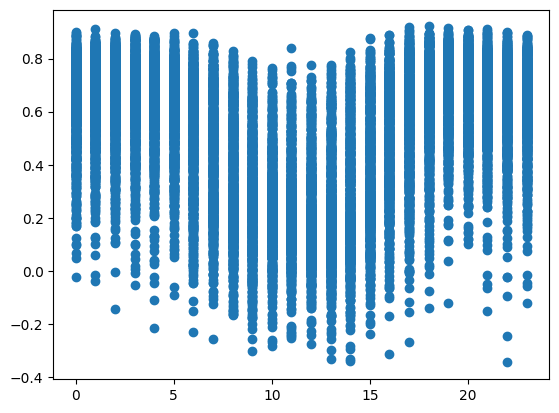

In [21]:
plt.scatter(stats_dict['Hour'],stats_dict['Spearman Correlation'])

In [61]:
temp =  pd.read_csv('/Users/lisawink/Documents/paper1/data/gap_filled_data_ta_rh.csv')
temp['datetime_UTC']=pd.to_datetime(temp['datetime_UTC'])
temp = temp[temp['variable']=='Ta_deg_C']
#temp = temp[temp['datetime_UTC'].dt.date.isin(hid['datetime_UTC'].dt.date)]
temp['datetime_UTC'] = temp['datetime_UTC'].astype(str)
temp = temp.pivot(index='station_id', columns='datetime_UTC', values='value')

params = gpd.read_parquet(f'/Users/lisawink/Documents/paper1/data/processed_data/processed_station_params_{radius}.parquet')
params = params.set_index('station_id')
to_remove = ['station_no','station_name','station_long_name','station_type','station_lat','station_lon','mounting_structure','dominant_land_use','local_climate_zone','urban_atlas_class','urban_atlas_code','geometry','SVF_3D']
params = params.drop(to_remove, axis=1)
params = params.drop('FREBNE',axis=0)
vars = params.columns

vars = ['BuAre_sum', 'BuVol_3D_sum', 'BuEWA_3D_sum', 'BuIBD', 'BuAdj', 'BuSWR_3D_median', 'BuHt_wmean','StrHW_median','SVF_3D_mean', 'BuERI_mode', 'StrClo400_median']
vars = ['BuAre_sum']

for var in vars:
    params_v = params[[var]]

    stats_dict = {}

    for time in temp.columns[227:228]:

        print(f'Processing {var} for {time}')
        alt = params[['station_elevation']].merge(temp[time], left_on='station_id', right_on='station_id',how='inner')
        X1 = sm.add_constant(alt['station_elevation'])
        y1 = alt[time]
        model = sm.OLS(y1, X1).fit()

        if model.rsquared < 0.1 or model.pvalues['station_elevation'] > 0.05:
            print(f'Low r-squared for {time}: {model.rsquared}. Skipping...')
            alt[time] = temp[time]  # Keep original values if model is not significant
        else:

            alt[time] = model.resid

        params_t = params_v.merge(alt[time], left_on='station_id', right_on='station_id',how='inner')


        stats = main.calculate_statistics(params_t, time)
        stats.index = stats['Parameter']
        stats['Time'] = time
        stats['altitude r-squared'] = model.rsquared
        stats['altitude p-value'] = model.pvalues['station_elevation']
        stats['altitude gradient'] = model.params[1]
        stats['altitude intercept'] = model.params[0]
        stats_dict[time] = stats

Processing BuAre_sum for 2022-09-10 11:00:00+00:00


/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/1397012898.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/1397012898.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]


In [62]:
main.calculate_statistics(params[['station_elevation']].merge(temp['2022-09-10 11:00:00+00:00'], left_on='station_id', right_on='station_id',how='inner'), time)

,Parameter,Pearson Correlation,Pearson p-value,Spearman Correlation,Spearman p-value,Mutual Information
0,station_elevation,-0.783857,5.880871e-09,-0.747688,6.881525e-08,0.383806


In [80]:
params_v

,BuAre_sum
station_id,
FRASHA,40553.346024
FRBETZ,41115.225311
FRBRUH,90730.577651
FRDIET,1030.516002
FRDREI,44578.789620
FRFRIE,15189.948458
FRGART,47188.835379
FRGLBA,26748.693973
FRGUNT,24986.687163


In [63]:
main.calculate_statistics(params_v.merge(temp['2022-09-10 11:00:00+00:00'], left_on='station_id', right_on='station_id',how='inner'), time)

,Parameter,Pearson Correlation,Pearson p-value,Spearman Correlation,Spearman p-value,Mutual Information
0,BuAre_sum,0.129129,0.44624,0.061663,0.716941,0.22011


In [64]:
stats_dict['2022-09-10 11:00:00+00:00']

,Parameter,Pearson Correlation,Pearson p-value,Spearman Correlation,Spearman p-value,Mutual Information,Time,altitude r-squared,altitude p-value,altitude gradient,altitude intercept
Parameter,,,,,,,,,,,
BuAre_sum,BuAre_sum,0.223172,0.184268,0.277857,0.095893,0.041934,2022-09-10 11:00:00+00:00,0.614432,5.880871e-09,-0.015593,20.986647


In [65]:
model.pvalues['station_elevation']

5.880870654134415e-09

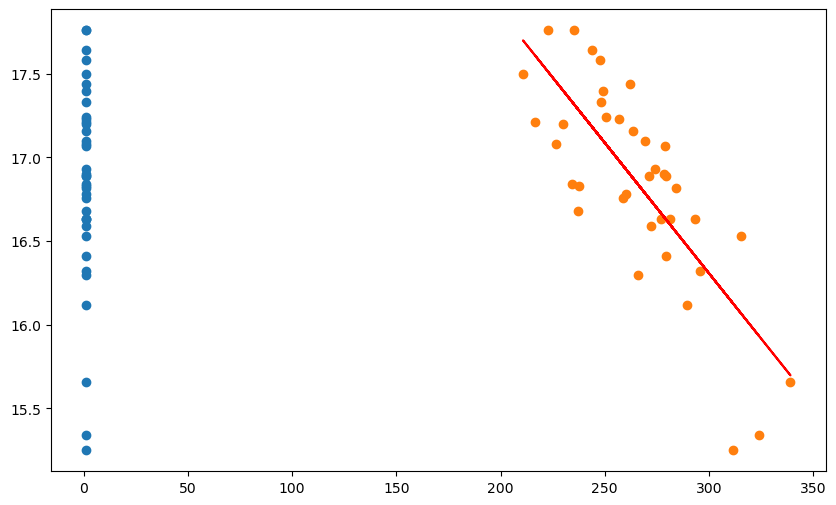

In [72]:
plt.figure(figsize=(10, 6))
plt.plot(X1, y1, 'o')
# plot model line
plt.plot(alt['station_elevation'], model.predict(X1), color='red')
plt.show()

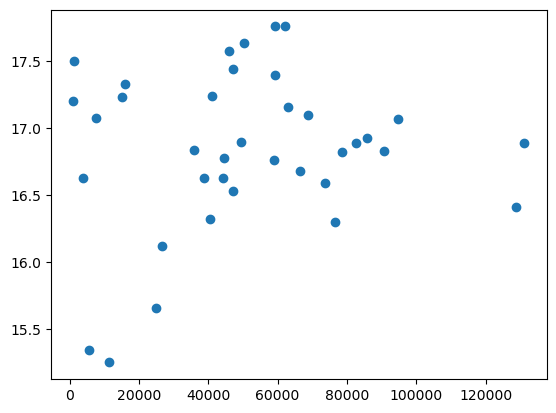

In [79]:
plt.plot(params_v.merge(temp['2022-09-10 11:00:00+00:00'], left_on='station_id', right_on='station_id',how='inner')[var], params_v.merge(temp['2022-09-10 11:00:00+00:00'], left_on='station_id', right_on='station_id',how='inner')[time], 'o')

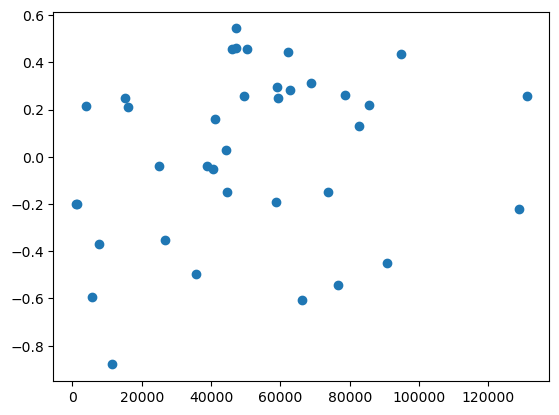

In [77]:
plt.plot(params_t[var], params_t[time], 'o')

In [23]:
stats_dict

{'2022-09-01 00:00:00+00:00':            Parameter  Pearson Correlation  Pearson p-value  \
 Parameter                                                    
 BuAre_sum  BuAre_sum             0.750891     8.638084e-08   
 
            Spearman Correlation  Spearman p-value  Mutual Information  \
 Parameter                                                               
 BuAre_sum              0.741584      1.512233e-07            0.394195   
 
                                 Time  altitude r-squared  altitude p-value  \
 Parameter                                                                    
 BuAre_sum  2022-09-01 00:00:00+00:00            0.030745               NaN   
 
            altitude gradient  altitude intercept  
 Parameter                                         
 BuAre_sum          -0.007073           17.460932  }

In [21]:
temp.columns[0]

'2022-09-01 00:00:00+00:00'

In [16]:
regress_altitude(radius=300, season='year')

Processing BuAre_sum for 2022-09-01 00:00:00+00:00
Processing BuAre_sum for 2022-09-01 01:00:00+00:00
Processing BuAre_sum for 2022-09-01 02:00:00+00:00
Processing BuAre_sum for 2022-09-01 03:00:00+00:00
Processing BuAre_sum for 2022-09-01 04:00:00+00:00
Processing BuAre_sum for 2022-09-01 05:00:00+00:00
Processing BuAre_sum for 2022-09-01 06:00:00+00:00
Processing BuAre_sum for 2022-09-01 07:00:00+00:00
Processing BuAre_sum for 2022-09-01 08:00:00+00:00
Processing BuAre_sum for 2022-09-01 09:00:00+00:00
Processing BuAre_sum for 2022-09-01 10:00:00+00:00


/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-09-01 11:00:00+00:00
Processing BuAre_sum for 2022-09-01 12:00:00+00:00
Processing BuAre_sum for 2022-09-01 13:00:00+00:00
Processing BuAre_sum for 2022-09-01 14:00:00+00:00
Processing BuAre_sum for 2022-09-01 15:00:00+00:00
Processing BuAre_sum for 2022-09-01 16:00:00+00:00
Processing BuAre_sum for 2022-09-01 17:00:00+00:00
Processing BuAre_sum for 2022-09-01 18:00:00+00:00
Processing BuAre_sum for 2022-09-01 19:00:00+00:00
Processing BuAre_sum for 2022-09-01 20:00:00+00:00
Processing BuAre_sum for 2022-09-01 21:00:00+00:00
Processing BuAre_sum for 2022-09-01 22:00:00+00:00
Processing BuAre_sum for 2022-09-01 23:00:00+00:00
Processing BuAre_sum for 2022-09-02 00:00:00+00:00
Processing BuAre_sum for 2022-09-02 01:00:00+00:00
Processing BuAre_sum for 2022-09-02 02:00:00+00:00
Processing BuAre_sum for 2022-09-02 03:00:00+00:00


/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-09-02 04:00:00+00:00
Processing BuAre_sum for 2022-09-02 05:00:00+00:00
Processing BuAre_sum for 2022-09-02 06:00:00+00:00
Processing BuAre_sum for 2022-09-02 07:00:00+00:00
Processing BuAre_sum for 2022-09-02 08:00:00+00:00
Processing BuAre_sum for 2022-09-02 09:00:00+00:00
Processing BuAre_sum for 2022-09-02 10:00:00+00:00
Processing BuAre_sum for 2022-09-02 11:00:00+00:00
Processing BuAre_sum for 2022-09-02 12:00:00+00:00
Processing BuAre_sum for 2022-09-02 13:00:00+00:00
Processing BuAre_sum for 2022-09-02 14:00:00+00:00
Processing BuAre_sum for 2022-09-02 15:00:00+00:00
Processing BuAre_sum for 2022-09-02 16:00:00+00:00
Processing BuAre_sum for 2022-09-02 17:00:00+00:00
Processing BuAre_sum for 2022-09-02 18:00:00+00:00
Processing BuAre_sum for 2022-09-02 19:00:00+00:00
Processing BuAre_sum for 2022-09-02 20:00:00+00:00
Processing BuAre_sum for 2022-09-02 21:00:00+00:00
Processing BuAre_sum for 2022-09-02 22:00:00+00:00


/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-09-02 23:00:00+00:00
Processing BuAre_sum for 2022-09-03 00:00:00+00:00
Processing BuAre_sum for 2022-09-03 01:00:00+00:00
Processing BuAre_sum for 2022-09-03 02:00:00+00:00
Processing BuAre_sum for 2022-09-03 03:00:00+00:00
Processing BuAre_sum for 2022-09-03 04:00:00+00:00
Processing BuAre_sum for 2022-09-03 05:00:00+00:00
Processing BuAre_sum for 2022-09-03 06:00:00+00:00
Processing BuAre_sum for 2022-09-03 07:00:00+00:00
Processing BuAre_sum for 2022-09-03 08:00:00+00:00
Processing BuAre_sum for 2022-09-03 09:00:00+00:00
Processing BuAre_sum for 2022-09-03 10:00:00+00:00
Processing BuAre_sum for 2022-09-03 11:00:00+00:00
Processing BuAre_sum for 2022-09-03 12:00:00+00:00
Processing BuAre_sum for 2022-09-03 13:00:00+00:00
Processing BuAre_sum for 2022-09-03 14:00:00+00:00
Processing BuAre_sum for 2022-09-03 15:00:00+00:00
Processing BuAre_sum for 2022-09-03 16:00:00+00:00
Processing BuAre_sum for 2022-09-03 17:00:00+00:00
Processing BuAre_sum for 2022-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-09-03 22:00:00+00:00
Processing BuAre_sum for 2022-09-03 23:00:00+00:00
Processing BuAre_sum for 2022-09-04 00:00:00+00:00
Processing BuAre_sum for 2022-09-04 01:00:00+00:00
Processing BuAre_sum for 2022-09-04 02:00:00+00:00
Processing BuAre_sum for 2022-09-04 03:00:00+00:00
Processing BuAre_sum for 2022-09-04 04:00:00+00:00
Processing BuAre_sum for 2022-09-04 05:00:00+00:00
Processing BuAre_sum for 2022-09-04 06:00:00+00:00
Processing BuAre_sum for 2022-09-04 07:00:00+00:00
Processing BuAre_sum for 2022-09-04 08:00:00+00:00
Processing BuAre_sum for 2022-09-04 09:00:00+00:00
Processing BuAre_sum for 2022-09-04 10:00:00+00:00
Processing BuAre_sum for 2022-09-04 11:00:00+00:00
Processing BuAre_sum for 2022-09-04 12:00:00+00:00
Processing BuAre_sum for 2022-09-04 13:00:00+00:00
Processing BuAre_sum for 2022-09-04 14:00:00+00:00
Processing BuAre_sum for 2022-09-04 15:00:00+00:00
Processing BuAre_sum for 2022-09-04 16:00:00+00:00
Processing BuAre_sum for 2022-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-09-04 21:00:00+00:00
Processing BuAre_sum for 2022-09-04 22:00:00+00:00
Processing BuAre_sum for 2022-09-04 23:00:00+00:00
Processing BuAre_sum for 2022-09-05 00:00:00+00:00
Processing BuAre_sum for 2022-09-05 01:00:00+00:00
Processing BuAre_sum for 2022-09-05 02:00:00+00:00
Processing BuAre_sum for 2022-09-05 03:00:00+00:00
Processing BuAre_sum for 2022-09-05 04:00:00+00:00
Processing BuAre_sum for 2022-09-05 05:00:00+00:00
Processing BuAre_sum for 2022-09-05 06:00:00+00:00
Processing BuAre_sum for 2022-09-05 07:00:00+00:00
Processing BuAre_sum for 2022-09-05 08:00:00+00:00
Processing BuAre_sum for 2022-09-05 09:00:00+00:00
Processing BuAre_sum for 2022-09-05 10:00:00+00:00
Processing BuAre_sum for 2022-09-05 11:00:00+00:00
Processing BuAre_sum for 2022-09-05 12:00:00+00:00
Processing BuAre_sum for 2022-09-05 13:00:00+00:00
Processing BuAre_sum for 2022-09-05 14:00:00+00:00
Processing BuAre_sum for 2022-09-05 15:00:00+00:00
Processing BuAre_sum for 2022-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-09-05 21:00:00+00:00
Processing BuAre_sum for 2022-09-05 22:00:00+00:00
Processing BuAre_sum for 2022-09-05 23:00:00+00:00
Processing BuAre_sum for 2022-09-06 00:00:00+00:00
Processing BuAre_sum for 2022-09-06 01:00:00+00:00
Processing BuAre_sum for 2022-09-06 02:00:00+00:00
Processing BuAre_sum for 2022-09-06 03:00:00+00:00
Processing BuAre_sum for 2022-09-06 04:00:00+00:00
Processing BuAre_sum for 2022-09-06 05:00:00+00:00
Processing BuAre_sum for 2022-09-06 06:00:00+00:00
Processing BuAre_sum for 2022-09-06 07:00:00+00:00
Processing BuAre_sum for 2022-09-06 08:00:00+00:00
Processing BuAre_sum for 2022-09-06 09:00:00+00:00
Processing BuAre_sum for 2022-09-06 10:00:00+00:00
Processing BuAre_sum for 2022-09-06 11:00:00+00:00
Processing BuAre_sum for 2022-09-06 12:00:00+00:00
Processing BuAre_sum for 2022-09-06 13:00:00+00:00
Processing BuAre_sum for 2022-09-06 14:00:00+00:00
Processing BuAre_sum for 2022-09-06 15:00:00+00:00
Processing BuAre_sum for 2022-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-09-06 20:00:00+00:00
Processing BuAre_sum for 2022-09-06 21:00:00+00:00
Processing BuAre_sum for 2022-09-06 22:00:00+00:00
Processing BuAre_sum for 2022-09-06 23:00:00+00:00
Processing BuAre_sum for 2022-09-07 00:00:00+00:00
Processing BuAre_sum for 2022-09-07 01:00:00+00:00
Processing BuAre_sum for 2022-09-07 02:00:00+00:00
Processing BuAre_sum for 2022-09-07 03:00:00+00:00
Processing BuAre_sum for 2022-09-07 04:00:00+00:00
Processing BuAre_sum for 2022-09-07 05:00:00+00:00
Processing BuAre_sum for 2022-09-07 06:00:00+00:00
Processing BuAre_sum for 2022-09-07 07:00:00+00:00
Processing BuAre_sum for 2022-09-07 08:00:00+00:00
Processing BuAre_sum for 2022-09-07 09:00:00+00:00
Processing BuAre_sum for 2022-09-07 10:00:00+00:00
Processing BuAre_sum for 2022-09-07 11:00:00+00:00
Processing BuAre_sum for 2022-09-07 12:00:00+00:00
Processing BuAre_sum for 2022-09-07 13:00:00+00:00
Processing BuAre_sum for 2022-09-07 14:00:00+00:00
Processing BuAre_sum for 2022-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-09-07 20:00:00+00:00
Processing BuAre_sum for 2022-09-07 21:00:00+00:00
Processing BuAre_sum for 2022-09-07 22:00:00+00:00
Processing BuAre_sum for 2022-09-07 23:00:00+00:00
Processing BuAre_sum for 2022-09-08 00:00:00+00:00
Processing BuAre_sum for 2022-09-08 01:00:00+00:00
Processing BuAre_sum for 2022-09-08 02:00:00+00:00
Processing BuAre_sum for 2022-09-08 03:00:00+00:00
Processing BuAre_sum for 2022-09-08 04:00:00+00:00
Processing BuAre_sum for 2022-09-08 05:00:00+00:00
Processing BuAre_sum for 2022-09-08 06:00:00+00:00
Processing BuAre_sum for 2022-09-08 07:00:00+00:00
Processing BuAre_sum for 2022-09-08 08:00:00+00:00
Processing BuAre_sum for 2022-09-08 09:00:00+00:00
Processing BuAre_sum for 2022-09-08 10:00:00+00:00
Processing BuAre_sum for 2022-09-08 11:00:00+00:00
Processing BuAre_sum for 2022-09-08 12:00:00+00:00
Processing BuAre_sum for 2022-09-08 13:00:00+00:00
Processing BuAre_sum for 2022-09-08 14:00:00+00:00
Processing BuAre_sum for 2022-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-09-08 19:00:00+00:00
Processing BuAre_sum for 2022-09-08 20:00:00+00:00
Processing BuAre_sum for 2022-09-08 21:00:00+00:00
Processing BuAre_sum for 2022-09-08 22:00:00+00:00
Processing BuAre_sum for 2022-09-08 23:00:00+00:00
Processing BuAre_sum for 2022-09-09 00:00:00+00:00
Processing BuAre_sum for 2022-09-09 01:00:00+00:00
Processing BuAre_sum for 2022-09-09 02:00:00+00:00
Processing BuAre_sum for 2022-09-09 03:00:00+00:00
Processing BuAre_sum for 2022-09-09 04:00:00+00:00
Processing BuAre_sum for 2022-09-09 05:00:00+00:00
Processing BuAre_sum for 2022-09-09 06:00:00+00:00
Processing BuAre_sum for 2022-09-09 07:00:00+00:00
Processing BuAre_sum for 2022-09-09 08:00:00+00:00
Processing BuAre_sum for 2022-09-09 09:00:00+00:00
Processing BuAre_sum for 2022-09-09 10:00:00+00:00
Processing BuAre_sum for 2022-09-09 11:00:00+00:00
Processing BuAre_sum for 2022-09-09 12:00:00+00:00
Processing BuAre_sum for 2022-09-09 13:00:00+00:00
Processing BuAre_sum for 2022-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-09-09 18:00:00+00:00
Processing BuAre_sum for 2022-09-09 19:00:00+00:00
Processing BuAre_sum for 2022-09-09 20:00:00+00:00
Processing BuAre_sum for 2022-09-09 21:00:00+00:00
Processing BuAre_sum for 2022-09-09 22:00:00+00:00
Processing BuAre_sum for 2022-09-09 23:00:00+00:00
Processing BuAre_sum for 2022-09-10 00:00:00+00:00
Processing BuAre_sum for 2022-09-10 01:00:00+00:00
Processing BuAre_sum for 2022-09-10 02:00:00+00:00
Processing BuAre_sum for 2022-09-10 03:00:00+00:00
Processing BuAre_sum for 2022-09-10 04:00:00+00:00
Processing BuAre_sum for 2022-09-10 05:00:00+00:00
Processing BuAre_sum for 2022-09-10 06:00:00+00:00
Processing BuAre_sum for 2022-09-10 07:00:00+00:00
Processing BuAre_sum for 2022-09-10 08:00:00+00:00
Processing BuAre_sum for 2022-09-10 09:00:00+00:00
Processing BuAre_sum for 2022-09-10 10:00:00+00:00
Processing BuAre_sum for 2022-09-10 11:00:00+00:00
Processing BuAre_sum for 2022-09-10 12:00:00+00:00
Processing BuAre_sum for 2022-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-09-10 17:00:00+00:00
Processing BuAre_sum for 2022-09-10 18:00:00+00:00
Processing BuAre_sum for 2022-09-10 19:00:00+00:00
Processing BuAre_sum for 2022-09-10 20:00:00+00:00
Processing BuAre_sum for 2022-09-10 21:00:00+00:00
Processing BuAre_sum for 2022-09-10 22:00:00+00:00
Processing BuAre_sum for 2022-09-10 23:00:00+00:00
Processing BuAre_sum for 2022-09-11 00:00:00+00:00
Processing BuAre_sum for 2022-09-11 01:00:00+00:00
Processing BuAre_sum for 2022-09-11 02:00:00+00:00
Processing BuAre_sum for 2022-09-11 03:00:00+00:00
Processing BuAre_sum for 2022-09-11 04:00:00+00:00
Processing BuAre_sum for 2022-09-11 05:00:00+00:00
Processing BuAre_sum for 2022-09-11 06:00:00+00:00
Processing BuAre_sum for 2022-09-11 07:00:00+00:00
Processing BuAre_sum for 2022-09-11 08:00:00+00:00
Processing BuAre_sum for 2022-09-11 09:00:00+00:00
Processing BuAre_sum for 2022-09-11 10:00:00+00:00
Processing BuAre_sum for 2022-09-11 11:00:00+00:00
Processing BuAre_sum for 2022-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-09-11 16:00:00+00:00
Processing BuAre_sum for 2022-09-11 17:00:00+00:00
Processing BuAre_sum for 2022-09-11 18:00:00+00:00
Processing BuAre_sum for 2022-09-11 19:00:00+00:00
Processing BuAre_sum for 2022-09-11 20:00:00+00:00
Processing BuAre_sum for 2022-09-11 21:00:00+00:00
Processing BuAre_sum for 2022-09-11 22:00:00+00:00
Processing BuAre_sum for 2022-09-11 23:00:00+00:00
Processing BuAre_sum for 2022-09-12 00:00:00+00:00
Processing BuAre_sum for 2022-09-12 01:00:00+00:00
Processing BuAre_sum for 2022-09-12 02:00:00+00:00
Processing BuAre_sum for 2022-09-12 03:00:00+00:00
Processing BuAre_sum for 2022-09-12 04:00:00+00:00
Processing BuAre_sum for 2022-09-12 05:00:00+00:00
Processing BuAre_sum for 2022-09-12 06:00:00+00:00
Processing BuAre_sum for 2022-09-12 07:00:00+00:00
Processing BuAre_sum for 2022-09-12 08:00:00+00:00
Processing BuAre_sum for 2022-09-12 09:00:00+00:00
Processing BuAre_sum for 2022-09-12 10:00:00+00:00
Processing BuAre_sum for 2022-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-09-12 15:00:00+00:00
Processing BuAre_sum for 2022-09-12 16:00:00+00:00
Processing BuAre_sum for 2022-09-12 17:00:00+00:00
Processing BuAre_sum for 2022-09-12 18:00:00+00:00
Processing BuAre_sum for 2022-09-12 19:00:00+00:00
Processing BuAre_sum for 2022-09-12 20:00:00+00:00
Processing BuAre_sum for 2022-09-12 21:00:00+00:00
Processing BuAre_sum for 2022-09-12 22:00:00+00:00
Processing BuAre_sum for 2022-09-12 23:00:00+00:00
Processing BuAre_sum for 2022-09-13 00:00:00+00:00
Processing BuAre_sum for 2022-09-13 01:00:00+00:00
Processing BuAre_sum for 2022-09-13 02:00:00+00:00
Processing BuAre_sum for 2022-09-13 03:00:00+00:00
Processing BuAre_sum for 2022-09-13 04:00:00+00:00
Processing BuAre_sum for 2022-09-13 05:00:00+00:00
Processing BuAre_sum for 2022-09-13 06:00:00+00:00
Processing BuAre_sum for 2022-09-13 07:00:00+00:00
Processing BuAre_sum for 2022-09-13 08:00:00+00:00
Processing BuAre_sum for 2022-09-13 09:00:00+00:00
Processing BuAre_sum for 2022-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-09-13 14:00:00+00:00
Processing BuAre_sum for 2022-09-13 15:00:00+00:00
Processing BuAre_sum for 2022-09-13 16:00:00+00:00
Processing BuAre_sum for 2022-09-13 17:00:00+00:00
Processing BuAre_sum for 2022-09-13 18:00:00+00:00
Processing BuAre_sum for 2022-09-13 19:00:00+00:00
Processing BuAre_sum for 2022-09-13 20:00:00+00:00
Processing BuAre_sum for 2022-09-13 21:00:00+00:00
Processing BuAre_sum for 2022-09-13 22:00:00+00:00
Processing BuAre_sum for 2022-09-13 23:00:00+00:00
Processing BuAre_sum for 2022-09-14 00:00:00+00:00
Processing BuAre_sum for 2022-09-14 01:00:00+00:00
Processing BuAre_sum for 2022-09-14 02:00:00+00:00
Processing BuAre_sum for 2022-09-14 03:00:00+00:00
Processing BuAre_sum for 2022-09-14 04:00:00+00:00
Processing BuAre_sum for 2022-09-14 05:00:00+00:00
Processing BuAre_sum for 2022-09-14 06:00:00+00:00
Processing BuAre_sum for 2022-09-14 07:00:00+00:00
Processing BuAre_sum for 2022-09-14 08:00:00+00:00
Processing BuAre_sum for 2022-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-09-14 13:00:00+00:00
Processing BuAre_sum for 2022-09-14 14:00:00+00:00
Processing BuAre_sum for 2022-09-14 15:00:00+00:00
Processing BuAre_sum for 2022-09-14 16:00:00+00:00
Processing BuAre_sum for 2022-09-14 17:00:00+00:00
Processing BuAre_sum for 2022-09-14 18:00:00+00:00
Processing BuAre_sum for 2022-09-14 19:00:00+00:00
Processing BuAre_sum for 2022-09-14 20:00:00+00:00
Processing BuAre_sum for 2022-09-14 21:00:00+00:00
Processing BuAre_sum for 2022-09-14 22:00:00+00:00
Processing BuAre_sum for 2022-09-14 23:00:00+00:00
Processing BuAre_sum for 2022-09-15 00:00:00+00:00
Processing BuAre_sum for 2022-09-15 01:00:00+00:00
Processing BuAre_sum for 2022-09-15 02:00:00+00:00
Processing BuAre_sum for 2022-09-15 03:00:00+00:00
Processing BuAre_sum for 2022-09-15 04:00:00+00:00
Processing BuAre_sum for 2022-09-15 05:00:00+00:00
Processing BuAre_sum for 2022-09-15 06:00:00+00:00
Processing BuAre_sum for 2022-09-15 07:00:00+00:00
Processing BuAre_sum for 2022-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-09-15 13:00:00+00:00
Processing BuAre_sum for 2022-09-15 14:00:00+00:00
Processing BuAre_sum for 2022-09-15 15:00:00+00:00
Processing BuAre_sum for 2022-09-15 16:00:00+00:00
Processing BuAre_sum for 2022-09-15 17:00:00+00:00
Processing BuAre_sum for 2022-09-15 18:00:00+00:00
Processing BuAre_sum for 2022-09-15 19:00:00+00:00
Processing BuAre_sum for 2022-09-15 20:00:00+00:00
Processing BuAre_sum for 2022-09-15 21:00:00+00:00
Processing BuAre_sum for 2022-09-15 22:00:00+00:00
Processing BuAre_sum for 2022-09-15 23:00:00+00:00
Processing BuAre_sum for 2022-09-16 00:00:00+00:00
Processing BuAre_sum for 2022-09-16 01:00:00+00:00
Processing BuAre_sum for 2022-09-16 02:00:00+00:00
Processing BuAre_sum for 2022-09-16 03:00:00+00:00
Processing BuAre_sum for 2022-09-16 04:00:00+00:00
Processing BuAre_sum for 2022-09-16 05:00:00+00:00
Processing BuAre_sum for 2022-09-16 06:00:00+00:00
Processing BuAre_sum for 2022-09-16 07:00:00+00:00
Processing BuAre_sum for 2022-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-09-16 13:00:00+00:00
Processing BuAre_sum for 2022-09-16 14:00:00+00:00
Processing BuAre_sum for 2022-09-16 15:00:00+00:00
Processing BuAre_sum for 2022-09-16 16:00:00+00:00
Processing BuAre_sum for 2022-09-16 17:00:00+00:00
Processing BuAre_sum for 2022-09-16 18:00:00+00:00
Processing BuAre_sum for 2022-09-16 19:00:00+00:00
Processing BuAre_sum for 2022-09-16 20:00:00+00:00
Processing BuAre_sum for 2022-09-16 21:00:00+00:00
Processing BuAre_sum for 2022-09-16 22:00:00+00:00
Processing BuAre_sum for 2022-09-16 23:00:00+00:00
Processing BuAre_sum for 2022-09-17 00:00:00+00:00
Processing BuAre_sum for 2022-09-17 01:00:00+00:00
Processing BuAre_sum for 2022-09-17 02:00:00+00:00
Processing BuAre_sum for 2022-09-17 03:00:00+00:00
Processing BuAre_sum for 2022-09-17 04:00:00+00:00
Processing BuAre_sum for 2022-09-17 05:00:00+00:00
Processing BuAre_sum for 2022-09-17 06:00:00+00:00
Processing BuAre_sum for 2022-09-17 07:00:00+00:00
Processing BuAre_sum for 2022-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-09-17 13:00:00+00:00
Processing BuAre_sum for 2022-09-17 14:00:00+00:00
Processing BuAre_sum for 2022-09-17 15:00:00+00:00
Processing BuAre_sum for 2022-09-17 16:00:00+00:00
Processing BuAre_sum for 2022-09-17 17:00:00+00:00
Processing BuAre_sum for 2022-09-17 18:00:00+00:00
Processing BuAre_sum for 2022-09-17 19:00:00+00:00
Processing BuAre_sum for 2022-09-17 20:00:00+00:00
Processing BuAre_sum for 2022-09-17 21:00:00+00:00
Processing BuAre_sum for 2022-09-17 22:00:00+00:00
Processing BuAre_sum for 2022-09-17 23:00:00+00:00
Processing BuAre_sum for 2022-09-18 00:00:00+00:00
Processing BuAre_sum for 2022-09-18 01:00:00+00:00
Processing BuAre_sum for 2022-09-18 02:00:00+00:00
Processing BuAre_sum for 2022-09-18 03:00:00+00:00
Processing BuAre_sum for 2022-09-18 04:00:00+00:00
Processing BuAre_sum for 2022-09-18 05:00:00+00:00
Processing BuAre_sum for 2022-09-18 06:00:00+00:00
Processing BuAre_sum for 2022-09-18 07:00:00+00:00
Processing BuAre_sum for 2022-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-09-18 12:00:00+00:00
Processing BuAre_sum for 2022-09-18 13:00:00+00:00
Processing BuAre_sum for 2022-09-18 14:00:00+00:00
Processing BuAre_sum for 2022-09-18 15:00:00+00:00
Processing BuAre_sum for 2022-09-18 16:00:00+00:00
Processing BuAre_sum for 2022-09-18 17:00:00+00:00
Processing BuAre_sum for 2022-09-18 18:00:00+00:00
Processing BuAre_sum for 2022-09-18 19:00:00+00:00
Processing BuAre_sum for 2022-09-18 20:00:00+00:00
Processing BuAre_sum for 2022-09-18 21:00:00+00:00
Processing BuAre_sum for 2022-09-18 22:00:00+00:00
Processing BuAre_sum for 2022-09-18 23:00:00+00:00
Processing BuAre_sum for 2022-09-19 00:00:00+00:00
Processing BuAre_sum for 2022-09-19 01:00:00+00:00
Processing BuAre_sum for 2022-09-19 02:00:00+00:00
Processing BuAre_sum for 2022-09-19 03:00:00+00:00
Processing BuAre_sum for 2022-09-19 04:00:00+00:00
Processing BuAre_sum for 2022-09-19 05:00:00+00:00
Processing BuAre_sum for 2022-09-19 06:00:00+00:00
Processing BuAre_sum for 2022-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-09-19 12:00:00+00:00
Processing BuAre_sum for 2022-09-19 13:00:00+00:00
Processing BuAre_sum for 2022-09-19 14:00:00+00:00
Processing BuAre_sum for 2022-09-19 15:00:00+00:00
Processing BuAre_sum for 2022-09-19 16:00:00+00:00
Processing BuAre_sum for 2022-09-19 17:00:00+00:00
Processing BuAre_sum for 2022-09-19 18:00:00+00:00
Processing BuAre_sum for 2022-09-19 19:00:00+00:00
Processing BuAre_sum for 2022-09-19 20:00:00+00:00
Processing BuAre_sum for 2022-09-19 21:00:00+00:00
Processing BuAre_sum for 2022-09-19 22:00:00+00:00
Processing BuAre_sum for 2022-09-19 23:00:00+00:00
Processing BuAre_sum for 2022-09-20 00:00:00+00:00
Processing BuAre_sum for 2022-09-20 01:00:00+00:00
Processing BuAre_sum for 2022-09-20 02:00:00+00:00
Processing BuAre_sum for 2022-09-20 03:00:00+00:00
Processing BuAre_sum for 2022-09-20 04:00:00+00:00
Processing BuAre_sum for 2022-09-20 05:00:00+00:00
Processing BuAre_sum for 2022-09-20 06:00:00+00:00
Processing BuAre_sum for 2022-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-09-20 12:00:00+00:00
Processing BuAre_sum for 2022-09-20 13:00:00+00:00
Processing BuAre_sum for 2022-09-20 14:00:00+00:00
Processing BuAre_sum for 2022-09-20 15:00:00+00:00
Processing BuAre_sum for 2022-09-20 16:00:00+00:00
Processing BuAre_sum for 2022-09-20 17:00:00+00:00
Processing BuAre_sum for 2022-09-20 18:00:00+00:00
Processing BuAre_sum for 2022-09-20 19:00:00+00:00
Processing BuAre_sum for 2022-09-20 20:00:00+00:00
Processing BuAre_sum for 2022-09-20 21:00:00+00:00
Processing BuAre_sum for 2022-09-20 22:00:00+00:00
Processing BuAre_sum for 2022-09-20 23:00:00+00:00
Processing BuAre_sum for 2022-09-21 00:00:00+00:00
Processing BuAre_sum for 2022-09-21 01:00:00+00:00
Processing BuAre_sum for 2022-09-21 02:00:00+00:00
Processing BuAre_sum for 2022-09-21 03:00:00+00:00
Processing BuAre_sum for 2022-09-21 04:00:00+00:00
Processing BuAre_sum for 2022-09-21 05:00:00+00:00
Processing BuAre_sum for 2022-09-21 06:00:00+00:00
Processing BuAre_sum for 2022-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-09-21 11:00:00+00:00
Processing BuAre_sum for 2022-09-21 12:00:00+00:00
Processing BuAre_sum for 2022-09-21 13:00:00+00:00
Processing BuAre_sum for 2022-09-21 14:00:00+00:00
Processing BuAre_sum for 2022-09-21 15:00:00+00:00
Processing BuAre_sum for 2022-09-21 16:00:00+00:00
Processing BuAre_sum for 2022-09-21 17:00:00+00:00
Processing BuAre_sum for 2022-09-21 18:00:00+00:00
Processing BuAre_sum for 2022-09-21 19:00:00+00:00
Processing BuAre_sum for 2022-09-21 20:00:00+00:00
Processing BuAre_sum for 2022-09-21 21:00:00+00:00
Processing BuAre_sum for 2022-09-21 22:00:00+00:00
Processing BuAre_sum for 2022-09-21 23:00:00+00:00
Processing BuAre_sum for 2022-09-22 00:00:00+00:00
Processing BuAre_sum for 2022-09-22 01:00:00+00:00
Processing BuAre_sum for 2022-09-22 02:00:00+00:00
Processing BuAre_sum for 2022-09-22 03:00:00+00:00
Processing BuAre_sum for 2022-09-22 04:00:00+00:00
Processing BuAre_sum for 2022-09-22 05:00:00+00:00
Processing BuAre_sum for 2022-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-09-22 11:00:00+00:00
Processing BuAre_sum for 2022-09-22 12:00:00+00:00
Processing BuAre_sum for 2022-09-22 13:00:00+00:00
Processing BuAre_sum for 2022-09-22 14:00:00+00:00
Processing BuAre_sum for 2022-09-22 15:00:00+00:00
Processing BuAre_sum for 2022-09-22 16:00:00+00:00
Processing BuAre_sum for 2022-09-22 17:00:00+00:00
Processing BuAre_sum for 2022-09-22 18:00:00+00:00
Processing BuAre_sum for 2022-09-22 19:00:00+00:00
Processing BuAre_sum for 2022-09-22 20:00:00+00:00
Processing BuAre_sum for 2022-09-22 21:00:00+00:00
Processing BuAre_sum for 2022-09-22 22:00:00+00:00
Processing BuAre_sum for 2022-09-22 23:00:00+00:00
Processing BuAre_sum for 2022-09-23 00:00:00+00:00
Processing BuAre_sum for 2022-09-23 01:00:00+00:00
Processing BuAre_sum for 2022-09-23 02:00:00+00:00
Processing BuAre_sum for 2022-09-23 03:00:00+00:00
Processing BuAre_sum for 2022-09-23 04:00:00+00:00
Processing BuAre_sum for 2022-09-23 05:00:00+00:00
Processing BuAre_sum for 2022-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-09-23 10:00:00+00:00
Processing BuAre_sum for 2022-09-23 11:00:00+00:00
Processing BuAre_sum for 2022-09-23 12:00:00+00:00
Processing BuAre_sum for 2022-09-23 13:00:00+00:00
Processing BuAre_sum for 2022-09-23 14:00:00+00:00
Processing BuAre_sum for 2022-09-23 15:00:00+00:00
Processing BuAre_sum for 2022-09-23 16:00:00+00:00
Processing BuAre_sum for 2022-09-23 17:00:00+00:00
Processing BuAre_sum for 2022-09-23 18:00:00+00:00
Processing BuAre_sum for 2022-09-23 19:00:00+00:00
Processing BuAre_sum for 2022-09-23 20:00:00+00:00
Processing BuAre_sum for 2022-09-23 21:00:00+00:00
Processing BuAre_sum for 2022-09-23 22:00:00+00:00
Processing BuAre_sum for 2022-09-23 23:00:00+00:00
Processing BuAre_sum for 2022-09-24 00:00:00+00:00
Processing BuAre_sum for 2022-09-24 01:00:00+00:00
Processing BuAre_sum for 2022-09-24 02:00:00+00:00
Processing BuAre_sum for 2022-09-24 03:00:00+00:00
Processing BuAre_sum for 2022-09-24 04:00:00+00:00
Processing BuAre_sum for 2022-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-09-24 10:00:00+00:00
Processing BuAre_sum for 2022-09-24 11:00:00+00:00
Processing BuAre_sum for 2022-09-24 12:00:00+00:00
Processing BuAre_sum for 2022-09-24 13:00:00+00:00
Processing BuAre_sum for 2022-09-24 14:00:00+00:00
Processing BuAre_sum for 2022-09-24 15:00:00+00:00
Processing BuAre_sum for 2022-09-24 16:00:00+00:00
Processing BuAre_sum for 2022-09-24 17:00:00+00:00
Processing BuAre_sum for 2022-09-24 18:00:00+00:00
Processing BuAre_sum for 2022-09-24 19:00:00+00:00
Processing BuAre_sum for 2022-09-24 20:00:00+00:00
Processing BuAre_sum for 2022-09-24 21:00:00+00:00
Processing BuAre_sum for 2022-09-24 22:00:00+00:00
Processing BuAre_sum for 2022-09-24 23:00:00+00:00
Processing BuAre_sum for 2022-09-25 00:00:00+00:00
Processing BuAre_sum for 2022-09-25 01:00:00+00:00
Processing BuAre_sum for 2022-09-25 02:00:00+00:00
Processing BuAre_sum for 2022-09-25 03:00:00+00:00
Processing BuAre_sum for 2022-09-25 04:00:00+00:00
Processing BuAre_sum for 2022-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-09-25 09:00:00+00:00
Processing BuAre_sum for 2022-09-25 10:00:00+00:00
Processing BuAre_sum for 2022-09-25 11:00:00+00:00
Processing BuAre_sum for 2022-09-25 12:00:00+00:00
Processing BuAre_sum for 2022-09-25 13:00:00+00:00
Processing BuAre_sum for 2022-09-25 14:00:00+00:00
Processing BuAre_sum for 2022-09-25 15:00:00+00:00
Processing BuAre_sum for 2022-09-25 16:00:00+00:00
Processing BuAre_sum for 2022-09-25 17:00:00+00:00
Processing BuAre_sum for 2022-09-25 18:00:00+00:00
Processing BuAre_sum for 2022-09-25 19:00:00+00:00
Processing BuAre_sum for 2022-09-25 20:00:00+00:00
Processing BuAre_sum for 2022-09-25 21:00:00+00:00
Processing BuAre_sum for 2022-09-25 22:00:00+00:00
Processing BuAre_sum for 2022-09-25 23:00:00+00:00
Processing BuAre_sum for 2022-09-26 00:00:00+00:00
Processing BuAre_sum for 2022-09-26 01:00:00+00:00
Processing BuAre_sum for 2022-09-26 02:00:00+00:00
Processing BuAre_sum for 2022-09-26 03:00:00+00:00
Processing BuAre_sum for 2022-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-09-26 09:00:00+00:00
Processing BuAre_sum for 2022-09-26 10:00:00+00:00
Processing BuAre_sum for 2022-09-26 11:00:00+00:00
Processing BuAre_sum for 2022-09-26 12:00:00+00:00
Processing BuAre_sum for 2022-09-26 13:00:00+00:00
Processing BuAre_sum for 2022-09-26 14:00:00+00:00
Processing BuAre_sum for 2022-09-26 15:00:00+00:00
Processing BuAre_sum for 2022-09-26 16:00:00+00:00
Processing BuAre_sum for 2022-09-26 17:00:00+00:00
Processing BuAre_sum for 2022-09-26 18:00:00+00:00
Processing BuAre_sum for 2022-09-26 19:00:00+00:00
Processing BuAre_sum for 2022-09-26 20:00:00+00:00
Processing BuAre_sum for 2022-09-26 21:00:00+00:00
Processing BuAre_sum for 2022-09-26 22:00:00+00:00
Processing BuAre_sum for 2022-09-26 23:00:00+00:00
Processing BuAre_sum for 2022-09-27 00:00:00+00:00
Processing BuAre_sum for 2022-09-27 01:00:00+00:00
Processing BuAre_sum for 2022-09-27 02:00:00+00:00
Processing BuAre_sum for 2022-09-27 03:00:00+00:00
Processing BuAre_sum for 2022-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-09-27 09:00:00+00:00
Processing BuAre_sum for 2022-09-27 10:00:00+00:00
Processing BuAre_sum for 2022-09-27 11:00:00+00:00
Processing BuAre_sum for 2022-09-27 12:00:00+00:00
Processing BuAre_sum for 2022-09-27 13:00:00+00:00
Processing BuAre_sum for 2022-09-27 14:00:00+00:00
Processing BuAre_sum for 2022-09-27 15:00:00+00:00
Processing BuAre_sum for 2022-09-27 16:00:00+00:00
Processing BuAre_sum for 2022-09-27 17:00:00+00:00
Processing BuAre_sum for 2022-09-27 18:00:00+00:00
Processing BuAre_sum for 2022-09-27 19:00:00+00:00
Processing BuAre_sum for 2022-09-27 20:00:00+00:00
Processing BuAre_sum for 2022-09-27 21:00:00+00:00
Processing BuAre_sum for 2022-09-27 22:00:00+00:00
Processing BuAre_sum for 2022-09-27 23:00:00+00:00
Processing BuAre_sum for 2022-09-28 00:00:00+00:00
Processing BuAre_sum for 2022-09-28 01:00:00+00:00
Processing BuAre_sum for 2022-09-28 02:00:00+00:00
Processing BuAre_sum for 2022-09-28 03:00:00+00:00
Processing BuAre_sum for 2022-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-09-28 09:00:00+00:00
Processing BuAre_sum for 2022-09-28 10:00:00+00:00
Processing BuAre_sum for 2022-09-28 11:00:00+00:00
Processing BuAre_sum for 2022-09-28 12:00:00+00:00
Processing BuAre_sum for 2022-09-28 13:00:00+00:00
Processing BuAre_sum for 2022-09-28 14:00:00+00:00
Processing BuAre_sum for 2022-09-28 15:00:00+00:00
Processing BuAre_sum for 2022-09-28 16:00:00+00:00
Processing BuAre_sum for 2022-09-28 17:00:00+00:00
Processing BuAre_sum for 2022-09-28 18:00:00+00:00
Processing BuAre_sum for 2022-09-28 19:00:00+00:00
Processing BuAre_sum for 2022-09-28 20:00:00+00:00
Processing BuAre_sum for 2022-09-28 21:00:00+00:00
Processing BuAre_sum for 2022-09-28 22:00:00+00:00
Processing BuAre_sum for 2022-09-28 23:00:00+00:00
Processing BuAre_sum for 2022-09-29 00:00:00+00:00
Processing BuAre_sum for 2022-09-29 01:00:00+00:00
Processing BuAre_sum for 2022-09-29 02:00:00+00:00
Processing BuAre_sum for 2022-09-29 03:00:00+00:00
Processing BuAre_sum for 2022-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-09-29 07:00:00+00:00
Processing BuAre_sum for 2022-09-29 08:00:00+00:00
Processing BuAre_sum for 2022-09-29 09:00:00+00:00
Processing BuAre_sum for 2022-09-29 10:00:00+00:00
Processing BuAre_sum for 2022-09-29 11:00:00+00:00
Processing BuAre_sum for 2022-09-29 12:00:00+00:00
Processing BuAre_sum for 2022-09-29 13:00:00+00:00
Processing BuAre_sum for 2022-09-29 14:00:00+00:00
Processing BuAre_sum for 2022-09-29 15:00:00+00:00
Processing BuAre_sum for 2022-09-29 16:00:00+00:00
Processing BuAre_sum for 2022-09-29 17:00:00+00:00
Processing BuAre_sum for 2022-09-29 18:00:00+00:00
Processing BuAre_sum for 2022-09-29 19:00:00+00:00
Processing BuAre_sum for 2022-09-29 20:00:00+00:00
Processing BuAre_sum for 2022-09-29 21:00:00+00:00
Processing BuAre_sum for 2022-09-29 22:00:00+00:00
Processing BuAre_sum for 2022-09-29 23:00:00+00:00
Processing BuAre_sum for 2022-09-30 00:00:00+00:00
Processing BuAre_sum for 2022-09-30 01:00:00+00:00
Processing BuAre_sum for 2022-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-09-30 05:00:00+00:00
Processing BuAre_sum for 2022-09-30 06:00:00+00:00
Processing BuAre_sum for 2022-09-30 07:00:00+00:00
Processing BuAre_sum for 2022-09-30 08:00:00+00:00
Processing BuAre_sum for 2022-09-30 09:00:00+00:00
Processing BuAre_sum for 2022-09-30 10:00:00+00:00
Processing BuAre_sum for 2022-09-30 11:00:00+00:00
Processing BuAre_sum for 2022-09-30 12:00:00+00:00
Processing BuAre_sum for 2022-09-30 13:00:00+00:00
Processing BuAre_sum for 2022-09-30 14:00:00+00:00
Processing BuAre_sum for 2022-09-30 15:00:00+00:00
Processing BuAre_sum for 2022-09-30 16:00:00+00:00
Processing BuAre_sum for 2022-09-30 17:00:00+00:00
Processing BuAre_sum for 2022-09-30 18:00:00+00:00
Processing BuAre_sum for 2022-09-30 19:00:00+00:00
Processing BuAre_sum for 2022-09-30 20:00:00+00:00
Processing BuAre_sum for 2022-09-30 21:00:00+00:00
Processing BuAre_sum for 2022-09-30 22:00:00+00:00
Processing BuAre_sum for 2022-09-30 23:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-10-01 04:00:00+00:00
Processing BuAre_sum for 2022-10-01 05:00:00+00:00
Processing BuAre_sum for 2022-10-01 06:00:00+00:00
Processing BuAre_sum for 2022-10-01 07:00:00+00:00
Processing BuAre_sum for 2022-10-01 08:00:00+00:00
Processing BuAre_sum for 2022-10-01 09:00:00+00:00
Processing BuAre_sum for 2022-10-01 10:00:00+00:00
Processing BuAre_sum for 2022-10-01 11:00:00+00:00
Processing BuAre_sum for 2022-10-01 12:00:00+00:00
Processing BuAre_sum for 2022-10-01 13:00:00+00:00
Processing BuAre_sum for 2022-10-01 14:00:00+00:00
Processing BuAre_sum for 2022-10-01 15:00:00+00:00
Processing BuAre_sum for 2022-10-01 16:00:00+00:00
Processing BuAre_sum for 2022-10-01 17:00:00+00:00
Processing BuAre_sum for 2022-10-01 18:00:00+00:00
Processing BuAre_sum for 2022-10-01 19:00:00+00:00
Processing BuAre_sum for 2022-10-01 20:00:00+00:00
Processing BuAre_sum for 2022-10-01 21:00:00+00:00
Processing BuAre_sum for 2022-10-01 22:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-10-02 03:00:00+00:00
Processing BuAre_sum for 2022-10-02 04:00:00+00:00
Processing BuAre_sum for 2022-10-02 05:00:00+00:00
Processing BuAre_sum for 2022-10-02 06:00:00+00:00
Processing BuAre_sum for 2022-10-02 07:00:00+00:00
Processing BuAre_sum for 2022-10-02 08:00:00+00:00
Processing BuAre_sum for 2022-10-02 09:00:00+00:00
Processing BuAre_sum for 2022-10-02 10:00:00+00:00
Processing BuAre_sum for 2022-10-02 11:00:00+00:00
Processing BuAre_sum for 2022-10-02 12:00:00+00:00
Processing BuAre_sum for 2022-10-02 13:00:00+00:00
Processing BuAre_sum for 2022-10-02 14:00:00+00:00
Processing BuAre_sum for 2022-10-02 15:00:00+00:00
Processing BuAre_sum for 2022-10-02 16:00:00+00:00
Processing BuAre_sum for 2022-10-02 17:00:00+00:00
Processing BuAre_sum for 2022-10-02 18:00:00+00:00
Processing BuAre_sum for 2022-10-02 19:00:00+00:00
Processing BuAre_sum for 2022-10-02 20:00:00+00:00
Processing BuAre_sum for 2022-10-02 21:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-10-03 03:00:00+00:00
Processing BuAre_sum for 2022-10-03 04:00:00+00:00
Processing BuAre_sum for 2022-10-03 05:00:00+00:00
Processing BuAre_sum for 2022-10-03 06:00:00+00:00
Processing BuAre_sum for 2022-10-03 07:00:00+00:00
Processing BuAre_sum for 2022-10-03 08:00:00+00:00
Processing BuAre_sum for 2022-10-03 09:00:00+00:00
Processing BuAre_sum for 2022-10-03 10:00:00+00:00
Processing BuAre_sum for 2022-10-03 11:00:00+00:00
Processing BuAre_sum for 2022-10-03 12:00:00+00:00
Processing BuAre_sum for 2022-10-03 13:00:00+00:00
Processing BuAre_sum for 2022-10-03 14:00:00+00:00
Processing BuAre_sum for 2022-10-03 15:00:00+00:00
Processing BuAre_sum for 2022-10-03 16:00:00+00:00
Processing BuAre_sum for 2022-10-03 17:00:00+00:00
Processing BuAre_sum for 2022-10-03 18:00:00+00:00
Processing BuAre_sum for 2022-10-03 19:00:00+00:00
Processing BuAre_sum for 2022-10-03 20:00:00+00:00
Processing BuAre_sum for 2022-10-03 21:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-10-03 23:00:00+00:00
Processing BuAre_sum for 2022-10-04 00:00:00+00:00
Processing BuAre_sum for 2022-10-04 01:00:00+00:00
Processing BuAre_sum for 2022-10-04 02:00:00+00:00
Processing BuAre_sum for 2022-10-04 03:00:00+00:00
Processing BuAre_sum for 2022-10-04 04:00:00+00:00
Processing BuAre_sum for 2022-10-04 05:00:00+00:00
Processing BuAre_sum for 2022-10-04 06:00:00+00:00
Processing BuAre_sum for 2022-10-04 07:00:00+00:00
Processing BuAre_sum for 2022-10-04 08:00:00+00:00
Processing BuAre_sum for 2022-10-04 09:00:00+00:00
Processing BuAre_sum for 2022-10-04 10:00:00+00:00
Processing BuAre_sum for 2022-10-04 11:00:00+00:00
Processing BuAre_sum for 2022-10-04 12:00:00+00:00
Processing BuAre_sum for 2022-10-04 13:00:00+00:00
Processing BuAre_sum for 2022-10-04 14:00:00+00:00
Processing BuAre_sum for 2022-10-04 15:00:00+00:00
Processing BuAre_sum for 2022-10-04 16:00:00+00:00
Processing BuAre_sum for 2022-10-04 17:00:00+00:00


/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-10-04 18:00:00+00:00
Processing BuAre_sum for 2022-10-04 19:00:00+00:00
Processing BuAre_sum for 2022-10-04 20:00:00+00:00
Processing BuAre_sum for 2022-10-04 21:00:00+00:00
Processing BuAre_sum for 2022-10-04 22:00:00+00:00
Processing BuAre_sum for 2022-10-04 23:00:00+00:00
Processing BuAre_sum for 2022-10-05 00:00:00+00:00
Processing BuAre_sum for 2022-10-05 01:00:00+00:00
Processing BuAre_sum for 2022-10-05 02:00:00+00:00
Processing BuAre_sum for 2022-10-05 03:00:00+00:00
Processing BuAre_sum for 2022-10-05 04:00:00+00:00
Processing BuAre_sum for 2022-10-05 05:00:00+00:00
Processing BuAre_sum for 2022-10-05 06:00:00+00:00
Processing BuAre_sum for 2022-10-05 07:00:00+00:00
Processing BuAre_sum for 2022-10-05 08:00:00+00:00
Processing BuAre_sum for 2022-10-05 09:00:00+00:00
Processing BuAre_sum for 2022-10-05 10:00:00+00:00
Processing BuAre_sum for 2022-10-05 11:00:00+00:00
Processing BuAre_sum for 2022-10-05 12:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-10-05 16:00:00+00:00
Processing BuAre_sum for 2022-10-05 17:00:00+00:00
Processing BuAre_sum for 2022-10-05 18:00:00+00:00
Processing BuAre_sum for 2022-10-05 19:00:00+00:00
Processing BuAre_sum for 2022-10-05 20:00:00+00:00
Processing BuAre_sum for 2022-10-05 21:00:00+00:00
Processing BuAre_sum for 2022-10-05 22:00:00+00:00
Processing BuAre_sum for 2022-10-05 23:00:00+00:00
Processing BuAre_sum for 2022-10-06 00:00:00+00:00
Processing BuAre_sum for 2022-10-06 01:00:00+00:00
Processing BuAre_sum for 2022-10-06 02:00:00+00:00
Processing BuAre_sum for 2022-10-06 03:00:00+00:00
Processing BuAre_sum for 2022-10-06 04:00:00+00:00
Processing BuAre_sum for 2022-10-06 05:00:00+00:00
Processing BuAre_sum for 2022-10-06 06:00:00+00:00
Processing BuAre_sum for 2022-10-06 07:00:00+00:00
Processing BuAre_sum for 2022-10-06 08:00:00+00:00
Processing BuAre_sum for 2022-10-06 09:00:00+00:00
Processing BuAre_sum for 2022-10-06 10:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-10-06 15:00:00+00:00
Processing BuAre_sum for 2022-10-06 16:00:00+00:00
Processing BuAre_sum for 2022-10-06 17:00:00+00:00
Processing BuAre_sum for 2022-10-06 18:00:00+00:00
Processing BuAre_sum for 2022-10-06 19:00:00+00:00
Processing BuAre_sum for 2022-10-06 20:00:00+00:00
Processing BuAre_sum for 2022-10-06 21:00:00+00:00
Processing BuAre_sum for 2022-10-06 22:00:00+00:00
Processing BuAre_sum for 2022-10-06 23:00:00+00:00
Processing BuAre_sum for 2022-10-07 00:00:00+00:00
Processing BuAre_sum for 2022-10-07 01:00:00+00:00
Processing BuAre_sum for 2022-10-07 02:00:00+00:00
Processing BuAre_sum for 2022-10-07 03:00:00+00:00
Processing BuAre_sum for 2022-10-07 04:00:00+00:00
Processing BuAre_sum for 2022-10-07 05:00:00+00:00
Processing BuAre_sum for 2022-10-07 06:00:00+00:00
Processing BuAre_sum for 2022-10-07 07:00:00+00:00
Processing BuAre_sum for 2022-10-07 08:00:00+00:00
Processing BuAre_sum for 2022-10-07 09:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-10-07 14:00:00+00:00
Processing BuAre_sum for 2022-10-07 15:00:00+00:00
Processing BuAre_sum for 2022-10-07 16:00:00+00:00
Processing BuAre_sum for 2022-10-07 17:00:00+00:00
Processing BuAre_sum for 2022-10-07 18:00:00+00:00
Processing BuAre_sum for 2022-10-07 19:00:00+00:00
Processing BuAre_sum for 2022-10-07 20:00:00+00:00
Processing BuAre_sum for 2022-10-07 21:00:00+00:00
Processing BuAre_sum for 2022-10-07 22:00:00+00:00
Processing BuAre_sum for 2022-10-07 23:00:00+00:00
Processing BuAre_sum for 2022-10-08 00:00:00+00:00
Processing BuAre_sum for 2022-10-08 01:00:00+00:00
Processing BuAre_sum for 2022-10-08 02:00:00+00:00
Processing BuAre_sum for 2022-10-08 03:00:00+00:00
Processing BuAre_sum for 2022-10-08 04:00:00+00:00
Processing BuAre_sum for 2022-10-08 05:00:00+00:00
Processing BuAre_sum for 2022-10-08 06:00:00+00:00
Processing BuAre_sum for 2022-10-08 07:00:00+00:00
Processing BuAre_sum for 2022-10-08 08:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-10-08 12:00:00+00:00
Processing BuAre_sum for 2022-10-08 13:00:00+00:00
Processing BuAre_sum for 2022-10-08 14:00:00+00:00
Processing BuAre_sum for 2022-10-08 15:00:00+00:00
Processing BuAre_sum for 2022-10-08 16:00:00+00:00
Processing BuAre_sum for 2022-10-08 17:00:00+00:00
Processing BuAre_sum for 2022-10-08 18:00:00+00:00
Processing BuAre_sum for 2022-10-08 19:00:00+00:00
Processing BuAre_sum for 2022-10-08 20:00:00+00:00
Processing BuAre_sum for 2022-10-08 21:00:00+00:00
Processing BuAre_sum for 2022-10-08 22:00:00+00:00
Processing BuAre_sum for 2022-10-08 23:00:00+00:00
Processing BuAre_sum for 2022-10-09 00:00:00+00:00
Processing BuAre_sum for 2022-10-09 01:00:00+00:00
Processing BuAre_sum for 2022-10-09 02:00:00+00:00
Processing BuAre_sum for 2022-10-09 03:00:00+00:00
Processing BuAre_sum for 2022-10-09 04:00:00+00:00
Processing BuAre_sum for 2022-10-09 05:00:00+00:00
Processing BuAre_sum for 2022-10-09 06:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-10-09 10:00:00+00:00
Processing BuAre_sum for 2022-10-09 11:00:00+00:00
Processing BuAre_sum for 2022-10-09 12:00:00+00:00
Processing BuAre_sum for 2022-10-09 13:00:00+00:00
Processing BuAre_sum for 2022-10-09 14:00:00+00:00
Processing BuAre_sum for 2022-10-09 15:00:00+00:00
Processing BuAre_sum for 2022-10-09 16:00:00+00:00
Processing BuAre_sum for 2022-10-09 17:00:00+00:00
Processing BuAre_sum for 2022-10-09 18:00:00+00:00
Processing BuAre_sum for 2022-10-09 19:00:00+00:00
Processing BuAre_sum for 2022-10-09 20:00:00+00:00
Processing BuAre_sum for 2022-10-09 21:00:00+00:00
Processing BuAre_sum for 2022-10-09 22:00:00+00:00
Processing BuAre_sum for 2022-10-09 23:00:00+00:00
Processing BuAre_sum for 2022-10-10 00:00:00+00:00
Processing BuAre_sum for 2022-10-10 01:00:00+00:00
Processing BuAre_sum for 2022-10-10 02:00:00+00:00
Processing BuAre_sum for 2022-10-10 03:00:00+00:00
Processing BuAre_sum for 2022-10-10 04:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-10-10 08:00:00+00:00
Processing BuAre_sum for 2022-10-10 09:00:00+00:00
Processing BuAre_sum for 2022-10-10 10:00:00+00:00
Processing BuAre_sum for 2022-10-10 11:00:00+00:00
Processing BuAre_sum for 2022-10-10 12:00:00+00:00
Processing BuAre_sum for 2022-10-10 13:00:00+00:00
Processing BuAre_sum for 2022-10-10 14:00:00+00:00
Processing BuAre_sum for 2022-10-10 15:00:00+00:00
Processing BuAre_sum for 2022-10-10 16:00:00+00:00
Processing BuAre_sum for 2022-10-10 17:00:00+00:00
Processing BuAre_sum for 2022-10-10 18:00:00+00:00
Processing BuAre_sum for 2022-10-10 19:00:00+00:00
Processing BuAre_sum for 2022-10-10 20:00:00+00:00
Processing BuAre_sum for 2022-10-10 21:00:00+00:00
Processing BuAre_sum for 2022-10-10 22:00:00+00:00
Processing BuAre_sum for 2022-10-10 23:00:00+00:00
Processing BuAre_sum for 2022-10-11 00:00:00+00:00
Processing BuAre_sum for 2022-10-11 01:00:00+00:00
Processing BuAre_sum for 2022-10-11 02:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-10-11 07:00:00+00:00
Processing BuAre_sum for 2022-10-11 08:00:00+00:00
Processing BuAre_sum for 2022-10-11 09:00:00+00:00
Processing BuAre_sum for 2022-10-11 10:00:00+00:00
Processing BuAre_sum for 2022-10-11 11:00:00+00:00
Processing BuAre_sum for 2022-10-11 12:00:00+00:00
Processing BuAre_sum for 2022-10-11 13:00:00+00:00
Processing BuAre_sum for 2022-10-11 14:00:00+00:00
Processing BuAre_sum for 2022-10-11 15:00:00+00:00
Processing BuAre_sum for 2022-10-11 16:00:00+00:00
Processing BuAre_sum for 2022-10-11 17:00:00+00:00
Processing BuAre_sum for 2022-10-11 18:00:00+00:00
Processing BuAre_sum for 2022-10-11 19:00:00+00:00
Processing BuAre_sum for 2022-10-11 20:00:00+00:00
Processing BuAre_sum for 2022-10-11 21:00:00+00:00
Processing BuAre_sum for 2022-10-11 22:00:00+00:00
Processing BuAre_sum for 2022-10-11 23:00:00+00:00
Processing BuAre_sum for 2022-10-12 00:00:00+00:00
Processing BuAre_sum for 2022-10-12 01:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-10-12 06:00:00+00:00
Processing BuAre_sum for 2022-10-12 07:00:00+00:00
Processing BuAre_sum for 2022-10-12 08:00:00+00:00
Processing BuAre_sum for 2022-10-12 09:00:00+00:00
Processing BuAre_sum for 2022-10-12 10:00:00+00:00
Processing BuAre_sum for 2022-10-12 11:00:00+00:00
Processing BuAre_sum for 2022-10-12 12:00:00+00:00
Processing BuAre_sum for 2022-10-12 13:00:00+00:00
Processing BuAre_sum for 2022-10-12 14:00:00+00:00
Processing BuAre_sum for 2022-10-12 15:00:00+00:00
Processing BuAre_sum for 2022-10-12 16:00:00+00:00
Processing BuAre_sum for 2022-10-12 17:00:00+00:00
Processing BuAre_sum for 2022-10-12 18:00:00+00:00
Processing BuAre_sum for 2022-10-12 19:00:00+00:00
Processing BuAre_sum for 2022-10-12 20:00:00+00:00
Processing BuAre_sum for 2022-10-12 21:00:00+00:00
Processing BuAre_sum for 2022-10-12 22:00:00+00:00
Processing BuAre_sum for 2022-10-12 23:00:00+00:00
Processing BuAre_sum for 2022-10-13 00:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-10-13 05:00:00+00:00
Processing BuAre_sum for 2022-10-13 06:00:00+00:00
Processing BuAre_sum for 2022-10-13 07:00:00+00:00
Processing BuAre_sum for 2022-10-13 08:00:00+00:00
Processing BuAre_sum for 2022-10-13 09:00:00+00:00
Processing BuAre_sum for 2022-10-13 10:00:00+00:00
Processing BuAre_sum for 2022-10-13 11:00:00+00:00
Processing BuAre_sum for 2022-10-13 12:00:00+00:00
Processing BuAre_sum for 2022-10-13 13:00:00+00:00
Processing BuAre_sum for 2022-10-13 14:00:00+00:00
Processing BuAre_sum for 2022-10-13 15:00:00+00:00
Processing BuAre_sum for 2022-10-13 16:00:00+00:00
Processing BuAre_sum for 2022-10-13 17:00:00+00:00
Processing BuAre_sum for 2022-10-13 18:00:00+00:00
Processing BuAre_sum for 2022-10-13 19:00:00+00:00
Processing BuAre_sum for 2022-10-13 20:00:00+00:00
Processing BuAre_sum for 2022-10-13 21:00:00+00:00
Processing BuAre_sum for 2022-10-13 22:00:00+00:00
Processing BuAre_sum for 2022-10-13 23:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-10-14 04:00:00+00:00
Processing BuAre_sum for 2022-10-14 05:00:00+00:00
Processing BuAre_sum for 2022-10-14 06:00:00+00:00
Processing BuAre_sum for 2022-10-14 07:00:00+00:00
Processing BuAre_sum for 2022-10-14 08:00:00+00:00
Processing BuAre_sum for 2022-10-14 09:00:00+00:00
Processing BuAre_sum for 2022-10-14 10:00:00+00:00
Processing BuAre_sum for 2022-10-14 11:00:00+00:00
Processing BuAre_sum for 2022-10-14 12:00:00+00:00
Processing BuAre_sum for 2022-10-14 13:00:00+00:00
Processing BuAre_sum for 2022-10-14 14:00:00+00:00
Processing BuAre_sum for 2022-10-14 15:00:00+00:00
Processing BuAre_sum for 2022-10-14 16:00:00+00:00
Processing BuAre_sum for 2022-10-14 17:00:00+00:00
Processing BuAre_sum for 2022-10-14 18:00:00+00:00
Processing BuAre_sum for 2022-10-14 19:00:00+00:00
Processing BuAre_sum for 2022-10-14 20:00:00+00:00
Processing BuAre_sum for 2022-10-14 21:00:00+00:00
Processing BuAre_sum for 2022-10-14 22:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-10-15 03:00:00+00:00
Processing BuAre_sum for 2022-10-15 04:00:00+00:00
Processing BuAre_sum for 2022-10-15 05:00:00+00:00
Processing BuAre_sum for 2022-10-15 06:00:00+00:00
Processing BuAre_sum for 2022-10-15 07:00:00+00:00
Processing BuAre_sum for 2022-10-15 08:00:00+00:00
Processing BuAre_sum for 2022-10-15 09:00:00+00:00
Processing BuAre_sum for 2022-10-15 10:00:00+00:00
Processing BuAre_sum for 2022-10-15 11:00:00+00:00
Processing BuAre_sum for 2022-10-15 12:00:00+00:00
Processing BuAre_sum for 2022-10-15 13:00:00+00:00
Processing BuAre_sum for 2022-10-15 14:00:00+00:00
Processing BuAre_sum for 2022-10-15 15:00:00+00:00
Processing BuAre_sum for 2022-10-15 16:00:00+00:00
Processing BuAre_sum for 2022-10-15 17:00:00+00:00
Processing BuAre_sum for 2022-10-15 18:00:00+00:00
Processing BuAre_sum for 2022-10-15 19:00:00+00:00
Processing BuAre_sum for 2022-10-15 20:00:00+00:00
Processing BuAre_sum for 2022-10-15 21:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-10-16 02:00:00+00:00
Processing BuAre_sum for 2022-10-16 03:00:00+00:00
Processing BuAre_sum for 2022-10-16 04:00:00+00:00
Processing BuAre_sum for 2022-10-16 05:00:00+00:00
Processing BuAre_sum for 2022-10-16 06:00:00+00:00
Processing BuAre_sum for 2022-10-16 07:00:00+00:00
Processing BuAre_sum for 2022-10-16 08:00:00+00:00
Processing BuAre_sum for 2022-10-16 09:00:00+00:00
Processing BuAre_sum for 2022-10-16 10:00:00+00:00
Processing BuAre_sum for 2022-10-16 11:00:00+00:00
Processing BuAre_sum for 2022-10-16 12:00:00+00:00
Processing BuAre_sum for 2022-10-16 13:00:00+00:00
Processing BuAre_sum for 2022-10-16 14:00:00+00:00
Processing BuAre_sum for 2022-10-16 15:00:00+00:00
Processing BuAre_sum for 2022-10-16 16:00:00+00:00
Processing BuAre_sum for 2022-10-16 17:00:00+00:00
Processing BuAre_sum for 2022-10-16 18:00:00+00:00
Processing BuAre_sum for 2022-10-16 19:00:00+00:00
Processing BuAre_sum for 2022-10-16 20:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-10-17 01:00:00+00:00
Processing BuAre_sum for 2022-10-17 02:00:00+00:00
Processing BuAre_sum for 2022-10-17 03:00:00+00:00
Processing BuAre_sum for 2022-10-17 04:00:00+00:00
Processing BuAre_sum for 2022-10-17 05:00:00+00:00
Processing BuAre_sum for 2022-10-17 06:00:00+00:00
Processing BuAre_sum for 2022-10-17 07:00:00+00:00
Processing BuAre_sum for 2022-10-17 08:00:00+00:00
Processing BuAre_sum for 2022-10-17 09:00:00+00:00
Processing BuAre_sum for 2022-10-17 10:00:00+00:00
Processing BuAre_sum for 2022-10-17 11:00:00+00:00
Processing BuAre_sum for 2022-10-17 12:00:00+00:00
Processing BuAre_sum for 2022-10-17 13:00:00+00:00
Processing BuAre_sum for 2022-10-17 14:00:00+00:00
Processing BuAre_sum for 2022-10-17 15:00:00+00:00
Processing BuAre_sum for 2022-10-17 16:00:00+00:00
Processing BuAre_sum for 2022-10-17 17:00:00+00:00
Processing BuAre_sum for 2022-10-17 18:00:00+00:00
Processing BuAre_sum for 2022-10-17 19:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-10-18 00:00:00+00:00
Processing BuAre_sum for 2022-10-18 01:00:00+00:00
Processing BuAre_sum for 2022-10-18 02:00:00+00:00
Processing BuAre_sum for 2022-10-18 03:00:00+00:00
Processing BuAre_sum for 2022-10-18 04:00:00+00:00
Processing BuAre_sum for 2022-10-18 05:00:00+00:00
Processing BuAre_sum for 2022-10-18 06:00:00+00:00
Processing BuAre_sum for 2022-10-18 07:00:00+00:00
Processing BuAre_sum for 2022-10-18 08:00:00+00:00
Processing BuAre_sum for 2022-10-18 09:00:00+00:00
Processing BuAre_sum for 2022-10-18 10:00:00+00:00
Processing BuAre_sum for 2022-10-18 11:00:00+00:00
Processing BuAre_sum for 2022-10-18 12:00:00+00:00
Processing BuAre_sum for 2022-10-18 13:00:00+00:00
Processing BuAre_sum for 2022-10-18 14:00:00+00:00
Processing BuAre_sum for 2022-10-18 15:00:00+00:00
Processing BuAre_sum for 2022-10-18 16:00:00+00:00
Processing BuAre_sum for 2022-10-18 17:00:00+00:00
Processing BuAre_sum for 2022-10-18 18:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-10-18 23:00:00+00:00
Processing BuAre_sum for 2022-10-19 00:00:00+00:00
Processing BuAre_sum for 2022-10-19 01:00:00+00:00
Processing BuAre_sum for 2022-10-19 02:00:00+00:00
Processing BuAre_sum for 2022-10-19 03:00:00+00:00
Processing BuAre_sum for 2022-10-19 04:00:00+00:00
Processing BuAre_sum for 2022-10-19 05:00:00+00:00
Processing BuAre_sum for 2022-10-19 06:00:00+00:00
Processing BuAre_sum for 2022-10-19 07:00:00+00:00
Processing BuAre_sum for 2022-10-19 08:00:00+00:00
Processing BuAre_sum for 2022-10-19 09:00:00+00:00
Processing BuAre_sum for 2022-10-19 10:00:00+00:00
Processing BuAre_sum for 2022-10-19 11:00:00+00:00
Processing BuAre_sum for 2022-10-19 12:00:00+00:00
Processing BuAre_sum for 2022-10-19 13:00:00+00:00
Processing BuAre_sum for 2022-10-19 14:00:00+00:00
Processing BuAre_sum for 2022-10-19 15:00:00+00:00
Processing BuAre_sum for 2022-10-19 16:00:00+00:00
Processing BuAre_sum for 2022-10-19 17:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-10-19 22:00:00+00:00
Processing BuAre_sum for 2022-10-19 23:00:00+00:00
Processing BuAre_sum for 2022-10-20 00:00:00+00:00
Processing BuAre_sum for 2022-10-20 01:00:00+00:00
Processing BuAre_sum for 2022-10-20 02:00:00+00:00
Processing BuAre_sum for 2022-10-20 03:00:00+00:00
Processing BuAre_sum for 2022-10-20 04:00:00+00:00
Processing BuAre_sum for 2022-10-20 05:00:00+00:00
Processing BuAre_sum for 2022-10-20 06:00:00+00:00
Processing BuAre_sum for 2022-10-20 07:00:00+00:00
Processing BuAre_sum for 2022-10-20 08:00:00+00:00
Processing BuAre_sum for 2022-10-20 09:00:00+00:00
Processing BuAre_sum for 2022-10-20 10:00:00+00:00
Processing BuAre_sum for 2022-10-20 11:00:00+00:00
Processing BuAre_sum for 2022-10-20 12:00:00+00:00
Processing BuAre_sum for 2022-10-20 13:00:00+00:00
Processing BuAre_sum for 2022-10-20 14:00:00+00:00
Processing BuAre_sum for 2022-10-20 15:00:00+00:00
Processing BuAre_sum for 2022-10-20 16:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-10-20 22:00:00+00:00
Processing BuAre_sum for 2022-10-20 23:00:00+00:00
Processing BuAre_sum for 2022-10-21 00:00:00+00:00
Processing BuAre_sum for 2022-10-21 01:00:00+00:00
Processing BuAre_sum for 2022-10-21 02:00:00+00:00
Processing BuAre_sum for 2022-10-21 03:00:00+00:00
Processing BuAre_sum for 2022-10-21 04:00:00+00:00
Processing BuAre_sum for 2022-10-21 05:00:00+00:00
Processing BuAre_sum for 2022-10-21 06:00:00+00:00
Processing BuAre_sum for 2022-10-21 07:00:00+00:00
Processing BuAre_sum for 2022-10-21 08:00:00+00:00
Processing BuAre_sum for 2022-10-21 09:00:00+00:00
Processing BuAre_sum for 2022-10-21 10:00:00+00:00
Processing BuAre_sum for 2022-10-21 11:00:00+00:00
Processing BuAre_sum for 2022-10-21 12:00:00+00:00
Processing BuAre_sum for 2022-10-21 13:00:00+00:00
Processing BuAre_sum for 2022-10-21 14:00:00+00:00
Processing BuAre_sum for 2022-10-21 15:00:00+00:00
Processing BuAre_sum for 2022-10-21 16:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-10-21 21:00:00+00:00
Processing BuAre_sum for 2022-10-21 22:00:00+00:00
Processing BuAre_sum for 2022-10-21 23:00:00+00:00
Processing BuAre_sum for 2022-10-22 00:00:00+00:00
Processing BuAre_sum for 2022-10-22 01:00:00+00:00
Processing BuAre_sum for 2022-10-22 02:00:00+00:00
Processing BuAre_sum for 2022-10-22 03:00:00+00:00
Processing BuAre_sum for 2022-10-22 04:00:00+00:00
Processing BuAre_sum for 2022-10-22 05:00:00+00:00
Processing BuAre_sum for 2022-10-22 06:00:00+00:00
Processing BuAre_sum for 2022-10-22 07:00:00+00:00
Processing BuAre_sum for 2022-10-22 08:00:00+00:00
Processing BuAre_sum for 2022-10-22 09:00:00+00:00
Processing BuAre_sum for 2022-10-22 10:00:00+00:00
Processing BuAre_sum for 2022-10-22 11:00:00+00:00
Processing BuAre_sum for 2022-10-22 12:00:00+00:00
Processing BuAre_sum for 2022-10-22 13:00:00+00:00
Processing BuAre_sum for 2022-10-22 14:00:00+00:00
Processing BuAre_sum for 2022-10-22 15:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-10-22 20:00:00+00:00
Processing BuAre_sum for 2022-10-22 21:00:00+00:00
Processing BuAre_sum for 2022-10-22 22:00:00+00:00
Processing BuAre_sum for 2022-10-22 23:00:00+00:00
Processing BuAre_sum for 2022-10-23 00:00:00+00:00
Processing BuAre_sum for 2022-10-23 01:00:00+00:00
Processing BuAre_sum for 2022-10-23 02:00:00+00:00
Processing BuAre_sum for 2022-10-23 03:00:00+00:00
Processing BuAre_sum for 2022-10-23 04:00:00+00:00
Processing BuAre_sum for 2022-10-23 05:00:00+00:00
Processing BuAre_sum for 2022-10-23 06:00:00+00:00
Processing BuAre_sum for 2022-10-23 07:00:00+00:00
Processing BuAre_sum for 2022-10-23 08:00:00+00:00
Processing BuAre_sum for 2022-10-23 09:00:00+00:00
Processing BuAre_sum for 2022-10-23 10:00:00+00:00
Processing BuAre_sum for 2022-10-23 11:00:00+00:00
Processing BuAre_sum for 2022-10-23 12:00:00+00:00
Processing BuAre_sum for 2022-10-23 13:00:00+00:00
Processing BuAre_sum for 2022-10-23 14:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-10-23 20:00:00+00:00
Processing BuAre_sum for 2022-10-23 21:00:00+00:00
Processing BuAre_sum for 2022-10-23 22:00:00+00:00
Processing BuAre_sum for 2022-10-23 23:00:00+00:00
Processing BuAre_sum for 2022-10-24 00:00:00+00:00
Processing BuAre_sum for 2022-10-24 01:00:00+00:00
Processing BuAre_sum for 2022-10-24 02:00:00+00:00
Processing BuAre_sum for 2022-10-24 03:00:00+00:00
Processing BuAre_sum for 2022-10-24 04:00:00+00:00
Processing BuAre_sum for 2022-10-24 05:00:00+00:00
Processing BuAre_sum for 2022-10-24 06:00:00+00:00
Processing BuAre_sum for 2022-10-24 07:00:00+00:00
Processing BuAre_sum for 2022-10-24 08:00:00+00:00
Processing BuAre_sum for 2022-10-24 09:00:00+00:00
Processing BuAre_sum for 2022-10-24 10:00:00+00:00
Processing BuAre_sum for 2022-10-24 11:00:00+00:00
Processing BuAre_sum for 2022-10-24 12:00:00+00:00
Processing BuAre_sum for 2022-10-24 13:00:00+00:00
Processing BuAre_sum for 2022-10-24 14:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-10-24 20:00:00+00:00
Processing BuAre_sum for 2022-10-24 21:00:00+00:00
Processing BuAre_sum for 2022-10-24 22:00:00+00:00
Processing BuAre_sum for 2022-10-24 23:00:00+00:00
Processing BuAre_sum for 2022-10-25 00:00:00+00:00
Processing BuAre_sum for 2022-10-25 01:00:00+00:00
Processing BuAre_sum for 2022-10-25 02:00:00+00:00
Processing BuAre_sum for 2022-10-25 03:00:00+00:00
Processing BuAre_sum for 2022-10-25 04:00:00+00:00
Processing BuAre_sum for 2022-10-25 05:00:00+00:00
Processing BuAre_sum for 2022-10-25 06:00:00+00:00
Processing BuAre_sum for 2022-10-25 07:00:00+00:00
Processing BuAre_sum for 2022-10-25 08:00:00+00:00
Processing BuAre_sum for 2022-10-25 09:00:00+00:00
Processing BuAre_sum for 2022-10-25 10:00:00+00:00
Processing BuAre_sum for 2022-10-25 11:00:00+00:00
Processing BuAre_sum for 2022-10-25 12:00:00+00:00
Processing BuAre_sum for 2022-10-25 13:00:00+00:00
Processing BuAre_sum for 2022-10-25 14:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-10-25 19:00:00+00:00
Processing BuAre_sum for 2022-10-25 20:00:00+00:00
Processing BuAre_sum for 2022-10-25 21:00:00+00:00
Processing BuAre_sum for 2022-10-25 22:00:00+00:00
Processing BuAre_sum for 2022-10-25 23:00:00+00:00
Processing BuAre_sum for 2022-10-26 00:00:00+00:00
Processing BuAre_sum for 2022-10-26 01:00:00+00:00
Processing BuAre_sum for 2022-10-26 02:00:00+00:00
Processing BuAre_sum for 2022-10-26 03:00:00+00:00
Processing BuAre_sum for 2022-10-26 04:00:00+00:00
Processing BuAre_sum for 2022-10-26 05:00:00+00:00
Processing BuAre_sum for 2022-10-26 06:00:00+00:00
Processing BuAre_sum for 2022-10-26 07:00:00+00:00


/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-10-26 08:00:00+00:00
Processing BuAre_sum for 2022-10-26 09:00:00+00:00
Processing BuAre_sum for 2022-10-26 10:00:00+00:00
Processing BuAre_sum for 2022-10-26 11:00:00+00:00
Processing BuAre_sum for 2022-10-26 12:00:00+00:00
Processing BuAre_sum for 2022-10-26 13:00:00+00:00
Processing BuAre_sum for 2022-10-26 14:00:00+00:00
Processing BuAre_sum for 2022-10-26 15:00:00+00:00
Processing BuAre_sum for 2022-10-26 16:00:00+00:00
Processing BuAre_sum for 2022-10-26 17:00:00+00:00
Processing BuAre_sum for 2022-10-26 18:00:00+00:00
Processing BuAre_sum for 2022-10-26 19:00:00+00:00
Processing BuAre_sum for 2022-10-26 20:00:00+00:00
Processing BuAre_sum for 2022-10-26 21:00:00+00:00
Processing BuAre_sum for 2022-10-26 22:00:00+00:00
Processing BuAre_sum for 2022-10-26 23:00:00+00:00
Processing BuAre_sum for 2022-10-27 00:00:00+00:00
Processing BuAre_sum for 2022-10-27 01:00:00+00:00
Processing BuAre_sum for 2022-10-27 02:00:00+00:00


/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-10-27 03:00:00+00:00
Processing BuAre_sum for 2022-10-27 04:00:00+00:00
Processing BuAre_sum for 2022-10-27 05:00:00+00:00
Processing BuAre_sum for 2022-10-27 06:00:00+00:00
Processing BuAre_sum for 2022-10-27 07:00:00+00:00
Processing BuAre_sum for 2022-10-27 08:00:00+00:00
Processing BuAre_sum for 2022-10-27 09:00:00+00:00
Processing BuAre_sum for 2022-10-27 10:00:00+00:00
Processing BuAre_sum for 2022-10-27 11:00:00+00:00
Processing BuAre_sum for 2022-10-27 12:00:00+00:00
Processing BuAre_sum for 2022-10-27 13:00:00+00:00
Processing BuAre_sum for 2022-10-27 14:00:00+00:00


/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-10-27 15:00:00+00:00
Processing BuAre_sum for 2022-10-27 16:00:00+00:00
Processing BuAre_sum for 2022-10-27 17:00:00+00:00
Processing BuAre_sum for 2022-10-27 18:00:00+00:00
Processing BuAre_sum for 2022-10-27 19:00:00+00:00
Processing BuAre_sum for 2022-10-27 20:00:00+00:00
Processing BuAre_sum for 2022-10-27 21:00:00+00:00
Processing BuAre_sum for 2022-10-27 22:00:00+00:00
Processing BuAre_sum for 2022-10-27 23:00:00+00:00
Processing BuAre_sum for 2022-10-28 00:00:00+00:00
Processing BuAre_sum for 2022-10-28 01:00:00+00:00
Processing BuAre_sum for 2022-10-28 02:00:00+00:00
Processing BuAre_sum for 2022-10-28 03:00:00+00:00
Processing BuAre_sum for 2022-10-28 04:00:00+00:00
Processing BuAre_sum for 2022-10-28 05:00:00+00:00
Processing BuAre_sum for 2022-10-28 06:00:00+00:00
Processing BuAre_sum for 2022-10-28 07:00:00+00:00
Processing BuAre_sum for 2022-10-28 08:00:00+00:00
Processing BuAre_sum for 2022-10-28 09:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-10-28 13:00:00+00:00
Processing BuAre_sum for 2022-10-28 14:00:00+00:00
Processing BuAre_sum for 2022-10-28 15:00:00+00:00
Processing BuAre_sum for 2022-10-28 16:00:00+00:00
Processing BuAre_sum for 2022-10-28 17:00:00+00:00
Processing BuAre_sum for 2022-10-28 18:00:00+00:00
Processing BuAre_sum for 2022-10-28 19:00:00+00:00
Processing BuAre_sum for 2022-10-28 20:00:00+00:00
Processing BuAre_sum for 2022-10-28 21:00:00+00:00
Processing BuAre_sum for 2022-10-28 22:00:00+00:00
Processing BuAre_sum for 2022-10-28 23:00:00+00:00
Processing BuAre_sum for 2022-10-29 00:00:00+00:00
Processing BuAre_sum for 2022-10-29 01:00:00+00:00
Processing BuAre_sum for 2022-10-29 02:00:00+00:00
Processing BuAre_sum for 2022-10-29 03:00:00+00:00
Processing BuAre_sum for 2022-10-29 04:00:00+00:00
Processing BuAre_sum for 2022-10-29 05:00:00+00:00
Processing BuAre_sum for 2022-10-29 06:00:00+00:00
Processing BuAre_sum for 2022-10-29 07:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-10-29 13:00:00+00:00
Processing BuAre_sum for 2022-10-29 14:00:00+00:00
Processing BuAre_sum for 2022-10-29 15:00:00+00:00
Processing BuAre_sum for 2022-10-29 16:00:00+00:00
Processing BuAre_sum for 2022-10-29 17:00:00+00:00
Processing BuAre_sum for 2022-10-29 18:00:00+00:00
Processing BuAre_sum for 2022-10-29 19:00:00+00:00
Processing BuAre_sum for 2022-10-29 20:00:00+00:00
Processing BuAre_sum for 2022-10-29 21:00:00+00:00
Processing BuAre_sum for 2022-10-29 22:00:00+00:00
Processing BuAre_sum for 2022-10-29 23:00:00+00:00
Processing BuAre_sum for 2022-10-30 00:00:00+00:00
Processing BuAre_sum for 2022-10-30 01:00:00+00:00
Processing BuAre_sum for 2022-10-30 02:00:00+00:00
Processing BuAre_sum for 2022-10-30 03:00:00+00:00
Processing BuAre_sum for 2022-10-30 04:00:00+00:00
Processing BuAre_sum for 2022-10-30 05:00:00+00:00
Processing BuAre_sum for 2022-10-30 06:00:00+00:00
Processing BuAre_sum for 2022-10-30 07:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-10-30 13:00:00+00:00
Processing BuAre_sum for 2022-10-30 14:00:00+00:00
Processing BuAre_sum for 2022-10-30 15:00:00+00:00
Processing BuAre_sum for 2022-10-30 16:00:00+00:00
Processing BuAre_sum for 2022-10-30 17:00:00+00:00
Processing BuAre_sum for 2022-10-30 18:00:00+00:00
Processing BuAre_sum for 2022-10-30 19:00:00+00:00
Processing BuAre_sum for 2022-10-30 20:00:00+00:00
Processing BuAre_sum for 2022-10-30 21:00:00+00:00
Processing BuAre_sum for 2022-10-30 22:00:00+00:00
Processing BuAre_sum for 2022-10-30 23:00:00+00:00
Processing BuAre_sum for 2022-10-31 00:00:00+00:00
Processing BuAre_sum for 2022-10-31 01:00:00+00:00
Processing BuAre_sum for 2022-10-31 02:00:00+00:00
Processing BuAre_sum for 2022-10-31 03:00:00+00:00
Processing BuAre_sum for 2022-10-31 04:00:00+00:00
Processing BuAre_sum for 2022-10-31 05:00:00+00:00
Processing BuAre_sum for 2022-10-31 06:00:00+00:00
Processing BuAre_sum for 2022-10-31 07:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-10-31 12:00:00+00:00
Processing BuAre_sum for 2022-10-31 13:00:00+00:00
Processing BuAre_sum for 2022-10-31 14:00:00+00:00
Processing BuAre_sum for 2022-10-31 15:00:00+00:00
Processing BuAre_sum for 2022-10-31 16:00:00+00:00
Processing BuAre_sum for 2022-10-31 17:00:00+00:00
Processing BuAre_sum for 2022-10-31 18:00:00+00:00
Processing BuAre_sum for 2022-10-31 19:00:00+00:00
Processing BuAre_sum for 2022-10-31 20:00:00+00:00
Processing BuAre_sum for 2022-10-31 21:00:00+00:00
Processing BuAre_sum for 2022-10-31 22:00:00+00:00
Processing BuAre_sum for 2022-10-31 23:00:00+00:00
Processing BuAre_sum for 2022-11-01 00:00:00+00:00
Processing BuAre_sum for 2022-11-01 01:00:00+00:00
Processing BuAre_sum for 2022-11-01 02:00:00+00:00
Processing BuAre_sum for 2022-11-01 03:00:00+00:00
Processing BuAre_sum for 2022-11-01 04:00:00+00:00
Processing BuAre_sum for 2022-11-01 05:00:00+00:00
Processing BuAre_sum for 2022-11-01 06:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-11-01 12:00:00+00:00
Processing BuAre_sum for 2022-11-01 13:00:00+00:00
Processing BuAre_sum for 2022-11-01 14:00:00+00:00
Processing BuAre_sum for 2022-11-01 15:00:00+00:00
Processing BuAre_sum for 2022-11-01 16:00:00+00:00
Processing BuAre_sum for 2022-11-01 17:00:00+00:00
Processing BuAre_sum for 2022-11-01 18:00:00+00:00
Processing BuAre_sum for 2022-11-01 19:00:00+00:00
Processing BuAre_sum for 2022-11-01 20:00:00+00:00
Processing BuAre_sum for 2022-11-01 21:00:00+00:00
Processing BuAre_sum for 2022-11-01 22:00:00+00:00
Processing BuAre_sum for 2022-11-01 23:00:00+00:00
Processing BuAre_sum for 2022-11-02 00:00:00+00:00
Processing BuAre_sum for 2022-11-02 01:00:00+00:00
Processing BuAre_sum for 2022-11-02 02:00:00+00:00
Processing BuAre_sum for 2022-11-02 03:00:00+00:00
Processing BuAre_sum for 2022-11-02 04:00:00+00:00
Processing BuAre_sum for 2022-11-02 05:00:00+00:00
Processing BuAre_sum for 2022-11-02 06:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-11-02 11:00:00+00:00
Processing BuAre_sum for 2022-11-02 12:00:00+00:00
Processing BuAre_sum for 2022-11-02 13:00:00+00:00
Processing BuAre_sum for 2022-11-02 14:00:00+00:00
Processing BuAre_sum for 2022-11-02 15:00:00+00:00
Processing BuAre_sum for 2022-11-02 16:00:00+00:00
Processing BuAre_sum for 2022-11-02 17:00:00+00:00
Processing BuAre_sum for 2022-11-02 18:00:00+00:00
Processing BuAre_sum for 2022-11-02 19:00:00+00:00
Processing BuAre_sum for 2022-11-02 20:00:00+00:00
Processing BuAre_sum for 2022-11-02 21:00:00+00:00
Processing BuAre_sum for 2022-11-02 22:00:00+00:00
Processing BuAre_sum for 2022-11-02 23:00:00+00:00
Processing BuAre_sum for 2022-11-03 00:00:00+00:00
Processing BuAre_sum for 2022-11-03 01:00:00+00:00
Processing BuAre_sum for 2022-11-03 02:00:00+00:00
Processing BuAre_sum for 2022-11-03 03:00:00+00:00
Processing BuAre_sum for 2022-11-03 04:00:00+00:00
Processing BuAre_sum for 2022-11-03 05:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-11-03 11:00:00+00:00
Processing BuAre_sum for 2022-11-03 12:00:00+00:00
Processing BuAre_sum for 2022-11-03 13:00:00+00:00
Processing BuAre_sum for 2022-11-03 14:00:00+00:00
Processing BuAre_sum for 2022-11-03 15:00:00+00:00
Processing BuAre_sum for 2022-11-03 16:00:00+00:00
Processing BuAre_sum for 2022-11-03 17:00:00+00:00
Processing BuAre_sum for 2022-11-03 18:00:00+00:00
Processing BuAre_sum for 2022-11-03 19:00:00+00:00
Processing BuAre_sum for 2022-11-03 20:00:00+00:00
Processing BuAre_sum for 2022-11-03 21:00:00+00:00
Processing BuAre_sum for 2022-11-03 22:00:00+00:00
Processing BuAre_sum for 2022-11-03 23:00:00+00:00
Processing BuAre_sum for 2022-11-04 00:00:00+00:00
Processing BuAre_sum for 2022-11-04 01:00:00+00:00
Processing BuAre_sum for 2022-11-04 02:00:00+00:00
Processing BuAre_sum for 2022-11-04 03:00:00+00:00
Processing BuAre_sum for 2022-11-04 04:00:00+00:00
Processing BuAre_sum for 2022-11-04 05:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-11-04 10:00:00+00:00
Processing BuAre_sum for 2022-11-04 11:00:00+00:00
Processing BuAre_sum for 2022-11-04 12:00:00+00:00
Processing BuAre_sum for 2022-11-04 13:00:00+00:00
Processing BuAre_sum for 2022-11-04 14:00:00+00:00
Processing BuAre_sum for 2022-11-04 15:00:00+00:00
Processing BuAre_sum for 2022-11-04 16:00:00+00:00
Processing BuAre_sum for 2022-11-04 17:00:00+00:00
Processing BuAre_sum for 2022-11-04 18:00:00+00:00
Processing BuAre_sum for 2022-11-04 19:00:00+00:00
Processing BuAre_sum for 2022-11-04 20:00:00+00:00
Processing BuAre_sum for 2022-11-04 21:00:00+00:00
Processing BuAre_sum for 2022-11-04 22:00:00+00:00
Processing BuAre_sum for 2022-11-04 23:00:00+00:00
Processing BuAre_sum for 2022-11-05 00:00:00+00:00
Processing BuAre_sum for 2022-11-05 01:00:00+00:00
Processing BuAre_sum for 2022-11-05 02:00:00+00:00
Processing BuAre_sum for 2022-11-05 03:00:00+00:00
Processing BuAre_sum for 2022-11-05 04:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-11-05 09:00:00+00:00
Processing BuAre_sum for 2022-11-05 10:00:00+00:00
Processing BuAre_sum for 2022-11-05 11:00:00+00:00
Processing BuAre_sum for 2022-11-05 12:00:00+00:00
Processing BuAre_sum for 2022-11-05 13:00:00+00:00
Processing BuAre_sum for 2022-11-05 14:00:00+00:00
Processing BuAre_sum for 2022-11-05 15:00:00+00:00
Processing BuAre_sum for 2022-11-05 16:00:00+00:00
Processing BuAre_sum for 2022-11-05 17:00:00+00:00
Processing BuAre_sum for 2022-11-05 18:00:00+00:00
Processing BuAre_sum for 2022-11-05 19:00:00+00:00
Processing BuAre_sum for 2022-11-05 20:00:00+00:00
Processing BuAre_sum for 2022-11-05 21:00:00+00:00
Processing BuAre_sum for 2022-11-05 22:00:00+00:00
Processing BuAre_sum for 2022-11-05 23:00:00+00:00
Processing BuAre_sum for 2022-11-06 00:00:00+00:00
Processing BuAre_sum for 2022-11-06 01:00:00+00:00
Processing BuAre_sum for 2022-11-06 02:00:00+00:00
Processing BuAre_sum for 2022-11-06 03:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-11-06 08:00:00+00:00
Processing BuAre_sum for 2022-11-06 09:00:00+00:00
Processing BuAre_sum for 2022-11-06 10:00:00+00:00
Processing BuAre_sum for 2022-11-06 11:00:00+00:00
Processing BuAre_sum for 2022-11-06 12:00:00+00:00
Processing BuAre_sum for 2022-11-06 13:00:00+00:00
Processing BuAre_sum for 2022-11-06 14:00:00+00:00
Processing BuAre_sum for 2022-11-06 15:00:00+00:00
Processing BuAre_sum for 2022-11-06 16:00:00+00:00
Processing BuAre_sum for 2022-11-06 17:00:00+00:00
Processing BuAre_sum for 2022-11-06 18:00:00+00:00
Processing BuAre_sum for 2022-11-06 19:00:00+00:00
Processing BuAre_sum for 2022-11-06 20:00:00+00:00
Processing BuAre_sum for 2022-11-06 21:00:00+00:00
Processing BuAre_sum for 2022-11-06 22:00:00+00:00
Processing BuAre_sum for 2022-11-06 23:00:00+00:00
Processing BuAre_sum for 2022-11-07 00:00:00+00:00
Processing BuAre_sum for 2022-11-07 01:00:00+00:00
Processing BuAre_sum for 2022-11-07 02:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-11-07 07:00:00+00:00
Processing BuAre_sum for 2022-11-07 08:00:00+00:00
Processing BuAre_sum for 2022-11-07 09:00:00+00:00
Processing BuAre_sum for 2022-11-07 10:00:00+00:00
Processing BuAre_sum for 2022-11-07 11:00:00+00:00
Processing BuAre_sum for 2022-11-07 12:00:00+00:00
Processing BuAre_sum for 2022-11-07 13:00:00+00:00
Processing BuAre_sum for 2022-11-07 14:00:00+00:00
Processing BuAre_sum for 2022-11-07 15:00:00+00:00
Processing BuAre_sum for 2022-11-07 16:00:00+00:00
Processing BuAre_sum for 2022-11-07 17:00:00+00:00
Processing BuAre_sum for 2022-11-07 18:00:00+00:00
Processing BuAre_sum for 2022-11-07 19:00:00+00:00
Processing BuAre_sum for 2022-11-07 20:00:00+00:00
Processing BuAre_sum for 2022-11-07 21:00:00+00:00
Processing BuAre_sum for 2022-11-07 22:00:00+00:00
Processing BuAre_sum for 2022-11-07 23:00:00+00:00
Processing BuAre_sum for 2022-11-08 00:00:00+00:00
Processing BuAre_sum for 2022-11-08 01:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-11-08 07:00:00+00:00
Processing BuAre_sum for 2022-11-08 08:00:00+00:00
Processing BuAre_sum for 2022-11-08 09:00:00+00:00
Processing BuAre_sum for 2022-11-08 10:00:00+00:00
Processing BuAre_sum for 2022-11-08 11:00:00+00:00
Processing BuAre_sum for 2022-11-08 12:00:00+00:00
Processing BuAre_sum for 2022-11-08 13:00:00+00:00
Processing BuAre_sum for 2022-11-08 14:00:00+00:00
Processing BuAre_sum for 2022-11-08 15:00:00+00:00
Processing BuAre_sum for 2022-11-08 16:00:00+00:00
Processing BuAre_sum for 2022-11-08 17:00:00+00:00
Processing BuAre_sum for 2022-11-08 18:00:00+00:00
Processing BuAre_sum for 2022-11-08 19:00:00+00:00
Processing BuAre_sum for 2022-11-08 20:00:00+00:00
Processing BuAre_sum for 2022-11-08 21:00:00+00:00
Processing BuAre_sum for 2022-11-08 22:00:00+00:00
Processing BuAre_sum for 2022-11-08 23:00:00+00:00
Processing BuAre_sum for 2022-11-09 00:00:00+00:00
Processing BuAre_sum for 2022-11-09 01:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-11-09 06:00:00+00:00
Processing BuAre_sum for 2022-11-09 07:00:00+00:00
Processing BuAre_sum for 2022-11-09 08:00:00+00:00
Processing BuAre_sum for 2022-11-09 09:00:00+00:00
Processing BuAre_sum for 2022-11-09 10:00:00+00:00
Processing BuAre_sum for 2022-11-09 11:00:00+00:00
Processing BuAre_sum for 2022-11-09 12:00:00+00:00
Processing BuAre_sum for 2022-11-09 13:00:00+00:00
Processing BuAre_sum for 2022-11-09 14:00:00+00:00
Processing BuAre_sum for 2022-11-09 15:00:00+00:00
Processing BuAre_sum for 2022-11-09 16:00:00+00:00
Processing BuAre_sum for 2022-11-09 17:00:00+00:00
Processing BuAre_sum for 2022-11-09 18:00:00+00:00
Processing BuAre_sum for 2022-11-09 19:00:00+00:00
Processing BuAre_sum for 2022-11-09 20:00:00+00:00
Processing BuAre_sum for 2022-11-09 21:00:00+00:00
Processing BuAre_sum for 2022-11-09 22:00:00+00:00
Processing BuAre_sum for 2022-11-09 23:00:00+00:00
Processing BuAre_sum for 2022-11-10 00:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-11-10 06:00:00+00:00
Processing BuAre_sum for 2022-11-10 07:00:00+00:00
Processing BuAre_sum for 2022-11-10 08:00:00+00:00
Processing BuAre_sum for 2022-11-10 09:00:00+00:00
Processing BuAre_sum for 2022-11-10 10:00:00+00:00
Processing BuAre_sum for 2022-11-10 11:00:00+00:00
Processing BuAre_sum for 2022-11-10 12:00:00+00:00
Processing BuAre_sum for 2022-11-10 13:00:00+00:00
Processing BuAre_sum for 2022-11-10 14:00:00+00:00
Processing BuAre_sum for 2022-11-10 15:00:00+00:00
Processing BuAre_sum for 2022-11-10 16:00:00+00:00
Processing BuAre_sum for 2022-11-10 17:00:00+00:00
Processing BuAre_sum for 2022-11-10 18:00:00+00:00
Processing BuAre_sum for 2022-11-10 19:00:00+00:00
Processing BuAre_sum for 2022-11-10 20:00:00+00:00
Processing BuAre_sum for 2022-11-10 21:00:00+00:00
Processing BuAre_sum for 2022-11-10 22:00:00+00:00
Processing BuAre_sum for 2022-11-10 23:00:00+00:00
Processing BuAre_sum for 2022-11-11 00:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-11-11 06:00:00+00:00
Processing BuAre_sum for 2022-11-11 07:00:00+00:00
Processing BuAre_sum for 2022-11-11 08:00:00+00:00
Processing BuAre_sum for 2022-11-11 09:00:00+00:00
Processing BuAre_sum for 2022-11-11 10:00:00+00:00
Processing BuAre_sum for 2022-11-11 11:00:00+00:00
Processing BuAre_sum for 2022-11-11 12:00:00+00:00
Processing BuAre_sum for 2022-11-11 13:00:00+00:00
Processing BuAre_sum for 2022-11-11 14:00:00+00:00
Processing BuAre_sum for 2022-11-11 15:00:00+00:00
Processing BuAre_sum for 2022-11-11 16:00:00+00:00
Processing BuAre_sum for 2022-11-11 17:00:00+00:00
Processing BuAre_sum for 2022-11-11 18:00:00+00:00
Processing BuAre_sum for 2022-11-11 19:00:00+00:00
Processing BuAre_sum for 2022-11-11 20:00:00+00:00
Processing BuAre_sum for 2022-11-11 21:00:00+00:00
Processing BuAre_sum for 2022-11-11 22:00:00+00:00
Processing BuAre_sum for 2022-11-11 23:00:00+00:00
Processing BuAre_sum for 2022-11-12 00:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-11-12 04:00:00+00:00
Processing BuAre_sum for 2022-11-12 05:00:00+00:00
Processing BuAre_sum for 2022-11-12 06:00:00+00:00
Processing BuAre_sum for 2022-11-12 07:00:00+00:00
Processing BuAre_sum for 2022-11-12 08:00:00+00:00
Processing BuAre_sum for 2022-11-12 09:00:00+00:00
Processing BuAre_sum for 2022-11-12 10:00:00+00:00
Processing BuAre_sum for 2022-11-12 11:00:00+00:00
Processing BuAre_sum for 2022-11-12 12:00:00+00:00
Processing BuAre_sum for 2022-11-12 13:00:00+00:00
Processing BuAre_sum for 2022-11-12 14:00:00+00:00
Processing BuAre_sum for 2022-11-12 15:00:00+00:00
Processing BuAre_sum for 2022-11-12 16:00:00+00:00
Processing BuAre_sum for 2022-11-12 17:00:00+00:00
Processing BuAre_sum for 2022-11-12 18:00:00+00:00
Processing BuAre_sum for 2022-11-12 19:00:00+00:00
Processing BuAre_sum for 2022-11-12 20:00:00+00:00
Processing BuAre_sum for 2022-11-12 21:00:00+00:00
Processing BuAre_sum for 2022-11-12 22:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-11-13 02:00:00+00:00
Processing BuAre_sum for 2022-11-13 03:00:00+00:00
Processing BuAre_sum for 2022-11-13 04:00:00+00:00
Processing BuAre_sum for 2022-11-13 05:00:00+00:00
Processing BuAre_sum for 2022-11-13 06:00:00+00:00
Processing BuAre_sum for 2022-11-13 07:00:00+00:00
Processing BuAre_sum for 2022-11-13 08:00:00+00:00
Processing BuAre_sum for 2022-11-13 09:00:00+00:00
Processing BuAre_sum for 2022-11-13 10:00:00+00:00
Processing BuAre_sum for 2022-11-13 11:00:00+00:00
Processing BuAre_sum for 2022-11-13 12:00:00+00:00
Processing BuAre_sum for 2022-11-13 13:00:00+00:00
Processing BuAre_sum for 2022-11-13 14:00:00+00:00
Processing BuAre_sum for 2022-11-13 15:00:00+00:00
Processing BuAre_sum for 2022-11-13 16:00:00+00:00
Processing BuAre_sum for 2022-11-13 17:00:00+00:00
Processing BuAre_sum for 2022-11-13 18:00:00+00:00
Processing BuAre_sum for 2022-11-13 19:00:00+00:00
Processing BuAre_sum for 2022-11-13 20:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-11-14 00:00:00+00:00
Processing BuAre_sum for 2022-11-14 01:00:00+00:00
Processing BuAre_sum for 2022-11-14 02:00:00+00:00
Processing BuAre_sum for 2022-11-14 03:00:00+00:00
Processing BuAre_sum for 2022-11-14 04:00:00+00:00
Processing BuAre_sum for 2022-11-14 05:00:00+00:00
Processing BuAre_sum for 2022-11-14 06:00:00+00:00
Processing BuAre_sum for 2022-11-14 07:00:00+00:00
Processing BuAre_sum for 2022-11-14 08:00:00+00:00
Processing BuAre_sum for 2022-11-14 09:00:00+00:00
Processing BuAre_sum for 2022-11-14 10:00:00+00:00
Processing BuAre_sum for 2022-11-14 11:00:00+00:00
Processing BuAre_sum for 2022-11-14 12:00:00+00:00
Processing BuAre_sum for 2022-11-14 13:00:00+00:00
Processing BuAre_sum for 2022-11-14 14:00:00+00:00
Processing BuAre_sum for 2022-11-14 15:00:00+00:00
Processing BuAre_sum for 2022-11-14 16:00:00+00:00
Processing BuAre_sum for 2022-11-14 17:00:00+00:00
Processing BuAre_sum for 2022-11-14 18:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-11-14 22:00:00+00:00
Processing BuAre_sum for 2022-11-14 23:00:00+00:00
Processing BuAre_sum for 2022-11-15 00:00:00+00:00
Processing BuAre_sum for 2022-11-15 01:00:00+00:00
Processing BuAre_sum for 2022-11-15 02:00:00+00:00
Processing BuAre_sum for 2022-11-15 03:00:00+00:00
Processing BuAre_sum for 2022-11-15 04:00:00+00:00
Processing BuAre_sum for 2022-11-15 05:00:00+00:00
Processing BuAre_sum for 2022-11-15 06:00:00+00:00
Processing BuAre_sum for 2022-11-15 07:00:00+00:00
Processing BuAre_sum for 2022-11-15 08:00:00+00:00
Processing BuAre_sum for 2022-11-15 09:00:00+00:00
Processing BuAre_sum for 2022-11-15 10:00:00+00:00
Processing BuAre_sum for 2022-11-15 11:00:00+00:00
Processing BuAre_sum for 2022-11-15 12:00:00+00:00
Processing BuAre_sum for 2022-11-15 13:00:00+00:00
Processing BuAre_sum for 2022-11-15 14:00:00+00:00
Processing BuAre_sum for 2022-11-15 15:00:00+00:00
Processing BuAre_sum for 2022-11-15 16:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-11-15 20:00:00+00:00
Processing BuAre_sum for 2022-11-15 21:00:00+00:00
Processing BuAre_sum for 2022-11-15 22:00:00+00:00
Processing BuAre_sum for 2022-11-15 23:00:00+00:00
Processing BuAre_sum for 2022-11-16 00:00:00+00:00
Processing BuAre_sum for 2022-11-16 01:00:00+00:00
Processing BuAre_sum for 2022-11-16 02:00:00+00:00
Processing BuAre_sum for 2022-11-16 03:00:00+00:00
Processing BuAre_sum for 2022-11-16 04:00:00+00:00
Processing BuAre_sum for 2022-11-16 05:00:00+00:00
Processing BuAre_sum for 2022-11-16 06:00:00+00:00
Processing BuAre_sum for 2022-11-16 07:00:00+00:00
Processing BuAre_sum for 2022-11-16 08:00:00+00:00
Processing BuAre_sum for 2022-11-16 09:00:00+00:00
Processing BuAre_sum for 2022-11-16 10:00:00+00:00
Processing BuAre_sum for 2022-11-16 11:00:00+00:00
Processing BuAre_sum for 2022-11-16 12:00:00+00:00
Processing BuAre_sum for 2022-11-16 13:00:00+00:00
Processing BuAre_sum for 2022-11-16 14:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-11-16 19:00:00+00:00
Processing BuAre_sum for 2022-11-16 20:00:00+00:00
Processing BuAre_sum for 2022-11-16 21:00:00+00:00
Processing BuAre_sum for 2022-11-16 22:00:00+00:00
Processing BuAre_sum for 2022-11-16 23:00:00+00:00
Processing BuAre_sum for 2022-11-17 00:00:00+00:00
Processing BuAre_sum for 2022-11-17 01:00:00+00:00
Processing BuAre_sum for 2022-11-17 02:00:00+00:00
Processing BuAre_sum for 2022-11-17 03:00:00+00:00
Processing BuAre_sum for 2022-11-17 04:00:00+00:00
Processing BuAre_sum for 2022-11-17 05:00:00+00:00
Processing BuAre_sum for 2022-11-17 06:00:00+00:00
Processing BuAre_sum for 2022-11-17 07:00:00+00:00
Processing BuAre_sum for 2022-11-17 08:00:00+00:00
Processing BuAre_sum for 2022-11-17 09:00:00+00:00
Processing BuAre_sum for 2022-11-17 10:00:00+00:00
Processing BuAre_sum for 2022-11-17 11:00:00+00:00
Processing BuAre_sum for 2022-11-17 12:00:00+00:00
Processing BuAre_sum for 2022-11-17 13:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-11-17 17:00:00+00:00
Processing BuAre_sum for 2022-11-17 18:00:00+00:00
Processing BuAre_sum for 2022-11-17 19:00:00+00:00
Processing BuAre_sum for 2022-11-17 20:00:00+00:00
Processing BuAre_sum for 2022-11-17 21:00:00+00:00
Processing BuAre_sum for 2022-11-17 22:00:00+00:00
Processing BuAre_sum for 2022-11-17 23:00:00+00:00
Processing BuAre_sum for 2022-11-18 00:00:00+00:00
Processing BuAre_sum for 2022-11-18 01:00:00+00:00
Processing BuAre_sum for 2022-11-18 02:00:00+00:00
Processing BuAre_sum for 2022-11-18 03:00:00+00:00
Processing BuAre_sum for 2022-11-18 04:00:00+00:00
Processing BuAre_sum for 2022-11-18 05:00:00+00:00
Processing BuAre_sum for 2022-11-18 06:00:00+00:00
Processing BuAre_sum for 2022-11-18 07:00:00+00:00
Processing BuAre_sum for 2022-11-18 08:00:00+00:00
Processing BuAre_sum for 2022-11-18 09:00:00+00:00
Processing BuAre_sum for 2022-11-18 10:00:00+00:00
Processing BuAre_sum for 2022-11-18 11:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-11-18 15:00:00+00:00
Processing BuAre_sum for 2022-11-18 16:00:00+00:00
Processing BuAre_sum for 2022-11-18 17:00:00+00:00
Processing BuAre_sum for 2022-11-18 18:00:00+00:00
Processing BuAre_sum for 2022-11-18 19:00:00+00:00
Processing BuAre_sum for 2022-11-18 20:00:00+00:00
Processing BuAre_sum for 2022-11-18 21:00:00+00:00
Processing BuAre_sum for 2022-11-18 22:00:00+00:00
Processing BuAre_sum for 2022-11-18 23:00:00+00:00
Processing BuAre_sum for 2022-11-19 00:00:00+00:00
Processing BuAre_sum for 2022-11-19 01:00:00+00:00
Processing BuAre_sum for 2022-11-19 02:00:00+00:00
Processing BuAre_sum for 2022-11-19 03:00:00+00:00
Processing BuAre_sum for 2022-11-19 04:00:00+00:00
Processing BuAre_sum for 2022-11-19 05:00:00+00:00
Processing BuAre_sum for 2022-11-19 06:00:00+00:00
Processing BuAre_sum for 2022-11-19 07:00:00+00:00
Processing BuAre_sum for 2022-11-19 08:00:00+00:00
Processing BuAre_sum for 2022-11-19 09:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-11-19 14:00:00+00:00
Processing BuAre_sum for 2022-11-19 15:00:00+00:00
Processing BuAre_sum for 2022-11-19 16:00:00+00:00
Processing BuAre_sum for 2022-11-19 17:00:00+00:00
Processing BuAre_sum for 2022-11-19 18:00:00+00:00
Processing BuAre_sum for 2022-11-19 19:00:00+00:00
Processing BuAre_sum for 2022-11-19 20:00:00+00:00
Processing BuAre_sum for 2022-11-19 21:00:00+00:00
Processing BuAre_sum for 2022-11-19 22:00:00+00:00
Processing BuAre_sum for 2022-11-19 23:00:00+00:00
Processing BuAre_sum for 2022-11-20 00:00:00+00:00
Processing BuAre_sum for 2022-11-20 01:00:00+00:00
Processing BuAre_sum for 2022-11-20 02:00:00+00:00
Processing BuAre_sum for 2022-11-20 03:00:00+00:00
Processing BuAre_sum for 2022-11-20 04:00:00+00:00
Processing BuAre_sum for 2022-11-20 05:00:00+00:00
Processing BuAre_sum for 2022-11-20 06:00:00+00:00
Processing BuAre_sum for 2022-11-20 07:00:00+00:00
Processing BuAre_sum for 2022-11-20 08:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-11-20 11:00:00+00:00
Processing BuAre_sum for 2022-11-20 12:00:00+00:00
Processing BuAre_sum for 2022-11-20 13:00:00+00:00
Processing BuAre_sum for 2022-11-20 14:00:00+00:00
Processing BuAre_sum for 2022-11-20 15:00:00+00:00
Processing BuAre_sum for 2022-11-20 16:00:00+00:00
Processing BuAre_sum for 2022-11-20 17:00:00+00:00
Processing BuAre_sum for 2022-11-20 18:00:00+00:00
Processing BuAre_sum for 2022-11-20 19:00:00+00:00
Processing BuAre_sum for 2022-11-20 20:00:00+00:00
Processing BuAre_sum for 2022-11-20 21:00:00+00:00
Processing BuAre_sum for 2022-11-20 22:00:00+00:00
Processing BuAre_sum for 2022-11-20 23:00:00+00:00
Processing BuAre_sum for 2022-11-21 00:00:00+00:00
Processing BuAre_sum for 2022-11-21 01:00:00+00:00
Processing BuAre_sum for 2022-11-21 02:00:00+00:00
Processing BuAre_sum for 2022-11-21 03:00:00+00:00
Processing BuAre_sum for 2022-11-21 04:00:00+00:00
Processing BuAre_sum for 2022-11-21 05:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-11-21 08:00:00+00:00
Processing BuAre_sum for 2022-11-21 09:00:00+00:00
Processing BuAre_sum for 2022-11-21 10:00:00+00:00
Processing BuAre_sum for 2022-11-21 11:00:00+00:00
Processing BuAre_sum for 2022-11-21 12:00:00+00:00
Processing BuAre_sum for 2022-11-21 13:00:00+00:00
Processing BuAre_sum for 2022-11-21 14:00:00+00:00
Processing BuAre_sum for 2022-11-21 15:00:00+00:00
Processing BuAre_sum for 2022-11-21 16:00:00+00:00
Processing BuAre_sum for 2022-11-21 17:00:00+00:00
Processing BuAre_sum for 2022-11-21 18:00:00+00:00
Processing BuAre_sum for 2022-11-21 19:00:00+00:00
Processing BuAre_sum for 2022-11-21 20:00:00+00:00
Processing BuAre_sum for 2022-11-21 21:00:00+00:00
Processing BuAre_sum for 2022-11-21 22:00:00+00:00
Processing BuAre_sum for 2022-11-21 23:00:00+00:00
Processing BuAre_sum for 2022-11-22 00:00:00+00:00
Processing BuAre_sum for 2022-11-22 01:00:00+00:00
Processing BuAre_sum for 2022-11-22 02:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-11-22 06:00:00+00:00
Processing BuAre_sum for 2022-11-22 07:00:00+00:00
Processing BuAre_sum for 2022-11-22 08:00:00+00:00
Processing BuAre_sum for 2022-11-22 09:00:00+00:00
Processing BuAre_sum for 2022-11-22 10:00:00+00:00
Processing BuAre_sum for 2022-11-22 11:00:00+00:00
Processing BuAre_sum for 2022-11-22 12:00:00+00:00
Processing BuAre_sum for 2022-11-22 13:00:00+00:00
Processing BuAre_sum for 2022-11-22 14:00:00+00:00
Processing BuAre_sum for 2022-11-22 15:00:00+00:00
Processing BuAre_sum for 2022-11-22 16:00:00+00:00
Processing BuAre_sum for 2022-11-22 17:00:00+00:00
Processing BuAre_sum for 2022-11-22 18:00:00+00:00
Processing BuAre_sum for 2022-11-22 19:00:00+00:00
Processing BuAre_sum for 2022-11-22 20:00:00+00:00
Processing BuAre_sum for 2022-11-22 21:00:00+00:00
Processing BuAre_sum for 2022-11-22 22:00:00+00:00
Processing BuAre_sum for 2022-11-22 23:00:00+00:00
Processing BuAre_sum for 2022-11-23 00:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-11-23 04:00:00+00:00
Processing BuAre_sum for 2022-11-23 05:00:00+00:00
Processing BuAre_sum for 2022-11-23 06:00:00+00:00
Processing BuAre_sum for 2022-11-23 07:00:00+00:00
Processing BuAre_sum for 2022-11-23 08:00:00+00:00
Processing BuAre_sum for 2022-11-23 09:00:00+00:00
Processing BuAre_sum for 2022-11-23 10:00:00+00:00
Processing BuAre_sum for 2022-11-23 11:00:00+00:00
Processing BuAre_sum for 2022-11-23 12:00:00+00:00
Processing BuAre_sum for 2022-11-23 13:00:00+00:00
Processing BuAre_sum for 2022-11-23 14:00:00+00:00
Processing BuAre_sum for 2022-11-23 15:00:00+00:00
Processing BuAre_sum for 2022-11-23 16:00:00+00:00
Processing BuAre_sum for 2022-11-23 17:00:00+00:00
Processing BuAre_sum for 2022-11-23 18:00:00+00:00
Processing BuAre_sum for 2022-11-23 19:00:00+00:00
Processing BuAre_sum for 2022-11-23 20:00:00+00:00
Processing BuAre_sum for 2022-11-23 21:00:00+00:00
Processing BuAre_sum for 2022-11-23 22:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-11-24 02:00:00+00:00
Processing BuAre_sum for 2022-11-24 03:00:00+00:00
Processing BuAre_sum for 2022-11-24 04:00:00+00:00
Processing BuAre_sum for 2022-11-24 05:00:00+00:00
Processing BuAre_sum for 2022-11-24 06:00:00+00:00
Processing BuAre_sum for 2022-11-24 07:00:00+00:00
Processing BuAre_sum for 2022-11-24 08:00:00+00:00
Processing BuAre_sum for 2022-11-24 09:00:00+00:00
Processing BuAre_sum for 2022-11-24 10:00:00+00:00
Processing BuAre_sum for 2022-11-24 11:00:00+00:00
Processing BuAre_sum for 2022-11-24 12:00:00+00:00
Processing BuAre_sum for 2022-11-24 13:00:00+00:00
Processing BuAre_sum for 2022-11-24 14:00:00+00:00
Processing BuAre_sum for 2022-11-24 15:00:00+00:00
Processing BuAre_sum for 2022-11-24 16:00:00+00:00
Processing BuAre_sum for 2022-11-24 17:00:00+00:00
Processing BuAre_sum for 2022-11-24 18:00:00+00:00
Processing BuAre_sum for 2022-11-24 19:00:00+00:00
Processing BuAre_sum for 2022-11-24 20:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-11-25 01:00:00+00:00
Processing BuAre_sum for 2022-11-25 02:00:00+00:00
Processing BuAre_sum for 2022-11-25 03:00:00+00:00
Processing BuAre_sum for 2022-11-25 04:00:00+00:00
Processing BuAre_sum for 2022-11-25 05:00:00+00:00
Processing BuAre_sum for 2022-11-25 06:00:00+00:00
Processing BuAre_sum for 2022-11-25 07:00:00+00:00
Processing BuAre_sum for 2022-11-25 08:00:00+00:00
Processing BuAre_sum for 2022-11-25 09:00:00+00:00
Processing BuAre_sum for 2022-11-25 10:00:00+00:00
Processing BuAre_sum for 2022-11-25 11:00:00+00:00
Processing BuAre_sum for 2022-11-25 12:00:00+00:00
Processing BuAre_sum for 2022-11-25 13:00:00+00:00
Processing BuAre_sum for 2022-11-25 14:00:00+00:00
Processing BuAre_sum for 2022-11-25 15:00:00+00:00
Processing BuAre_sum for 2022-11-25 16:00:00+00:00
Processing BuAre_sum for 2022-11-25 17:00:00+00:00
Processing BuAre_sum for 2022-11-25 18:00:00+00:00
Processing BuAre_sum for 2022-11-25 19:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-11-26 00:00:00+00:00
Processing BuAre_sum for 2022-11-26 01:00:00+00:00
Processing BuAre_sum for 2022-11-26 02:00:00+00:00
Processing BuAre_sum for 2022-11-26 03:00:00+00:00
Processing BuAre_sum for 2022-11-26 04:00:00+00:00
Processing BuAre_sum for 2022-11-26 05:00:00+00:00
Processing BuAre_sum for 2022-11-26 06:00:00+00:00
Processing BuAre_sum for 2022-11-26 07:00:00+00:00
Processing BuAre_sum for 2022-11-26 08:00:00+00:00
Processing BuAre_sum for 2022-11-26 09:00:00+00:00
Processing BuAre_sum for 2022-11-26 10:00:00+00:00
Processing BuAre_sum for 2022-11-26 11:00:00+00:00
Processing BuAre_sum for 2022-11-26 12:00:00+00:00
Processing BuAre_sum for 2022-11-26 13:00:00+00:00
Processing BuAre_sum for 2022-11-26 14:00:00+00:00
Processing BuAre_sum for 2022-11-26 15:00:00+00:00
Processing BuAre_sum for 2022-11-26 16:00:00+00:00
Processing BuAre_sum for 2022-11-26 17:00:00+00:00
Processing BuAre_sum for 2022-11-26 18:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-11-26 21:00:00+00:00
Processing BuAre_sum for 2022-11-26 22:00:00+00:00
Processing BuAre_sum for 2022-11-26 23:00:00+00:00
Processing BuAre_sum for 2022-11-27 00:00:00+00:00
Processing BuAre_sum for 2022-11-27 01:00:00+00:00
Processing BuAre_sum for 2022-11-27 02:00:00+00:00
Processing BuAre_sum for 2022-11-27 03:00:00+00:00
Processing BuAre_sum for 2022-11-27 04:00:00+00:00
Processing BuAre_sum for 2022-11-27 05:00:00+00:00
Processing BuAre_sum for 2022-11-27 06:00:00+00:00
Processing BuAre_sum for 2022-11-27 07:00:00+00:00
Processing BuAre_sum for 2022-11-27 08:00:00+00:00
Processing BuAre_sum for 2022-11-27 09:00:00+00:00
Processing BuAre_sum for 2022-11-27 10:00:00+00:00
Processing BuAre_sum for 2022-11-27 11:00:00+00:00
Processing BuAre_sum for 2022-11-27 12:00:00+00:00
Processing BuAre_sum for 2022-11-27 13:00:00+00:00
Processing BuAre_sum for 2022-11-27 14:00:00+00:00
Processing BuAre_sum for 2022-11-27 15:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-11-27 19:00:00+00:00
Processing BuAre_sum for 2022-11-27 20:00:00+00:00
Processing BuAre_sum for 2022-11-27 21:00:00+00:00
Processing BuAre_sum for 2022-11-27 22:00:00+00:00
Processing BuAre_sum for 2022-11-27 23:00:00+00:00
Processing BuAre_sum for 2022-11-28 00:00:00+00:00
Processing BuAre_sum for 2022-11-28 01:00:00+00:00
Processing BuAre_sum for 2022-11-28 02:00:00+00:00
Processing BuAre_sum for 2022-11-28 03:00:00+00:00
Processing BuAre_sum for 2022-11-28 04:00:00+00:00
Processing BuAre_sum for 2022-11-28 05:00:00+00:00
Processing BuAre_sum for 2022-11-28 06:00:00+00:00
Processing BuAre_sum for 2022-11-28 07:00:00+00:00
Processing BuAre_sum for 2022-11-28 08:00:00+00:00
Processing BuAre_sum for 2022-11-28 09:00:00+00:00
Processing BuAre_sum for 2022-11-28 10:00:00+00:00
Processing BuAre_sum for 2022-11-28 11:00:00+00:00
Processing BuAre_sum for 2022-11-28 12:00:00+00:00
Processing BuAre_sum for 2022-11-28 13:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-11-28 16:00:00+00:00
Processing BuAre_sum for 2022-11-28 17:00:00+00:00
Processing BuAre_sum for 2022-11-28 18:00:00+00:00
Processing BuAre_sum for 2022-11-28 19:00:00+00:00
Processing BuAre_sum for 2022-11-28 20:00:00+00:00
Processing BuAre_sum for 2022-11-28 21:00:00+00:00
Processing BuAre_sum for 2022-11-28 22:00:00+00:00
Processing BuAre_sum for 2022-11-28 23:00:00+00:00
Processing BuAre_sum for 2022-11-29 00:00:00+00:00
Processing BuAre_sum for 2022-11-29 01:00:00+00:00
Processing BuAre_sum for 2022-11-29 02:00:00+00:00
Processing BuAre_sum for 2022-11-29 03:00:00+00:00
Processing BuAre_sum for 2022-11-29 04:00:00+00:00
Processing BuAre_sum for 2022-11-29 05:00:00+00:00
Processing BuAre_sum for 2022-11-29 06:00:00+00:00
Processing BuAre_sum for 2022-11-29 07:00:00+00:00
Processing BuAre_sum for 2022-11-29 08:00:00+00:00
Processing BuAre_sum for 2022-11-29 09:00:00+00:00
Processing BuAre_sum for 2022-11-29 10:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-11-29 13:00:00+00:00
Processing BuAre_sum for 2022-11-29 14:00:00+00:00
Processing BuAre_sum for 2022-11-29 15:00:00+00:00
Processing BuAre_sum for 2022-11-29 16:00:00+00:00
Processing BuAre_sum for 2022-11-29 17:00:00+00:00
Processing BuAre_sum for 2022-11-29 18:00:00+00:00
Processing BuAre_sum for 2022-11-29 19:00:00+00:00
Processing BuAre_sum for 2022-11-29 20:00:00+00:00
Processing BuAre_sum for 2022-11-29 21:00:00+00:00
Processing BuAre_sum for 2022-11-29 22:00:00+00:00
Processing BuAre_sum for 2022-11-29 23:00:00+00:00
Processing BuAre_sum for 2022-11-30 00:00:00+00:00
Processing BuAre_sum for 2022-11-30 01:00:00+00:00
Processing BuAre_sum for 2022-11-30 02:00:00+00:00
Processing BuAre_sum for 2022-11-30 03:00:00+00:00
Processing BuAre_sum for 2022-11-30 04:00:00+00:00
Processing BuAre_sum for 2022-11-30 05:00:00+00:00
Processing BuAre_sum for 2022-11-30 06:00:00+00:00
Processing BuAre_sum for 2022-11-30 07:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-11-30 11:00:00+00:00
Processing BuAre_sum for 2022-11-30 12:00:00+00:00
Processing BuAre_sum for 2022-11-30 13:00:00+00:00
Processing BuAre_sum for 2022-11-30 14:00:00+00:00
Processing BuAre_sum for 2022-11-30 15:00:00+00:00
Processing BuAre_sum for 2022-11-30 16:00:00+00:00
Processing BuAre_sum for 2022-11-30 17:00:00+00:00
Processing BuAre_sum for 2022-11-30 18:00:00+00:00
Processing BuAre_sum for 2022-11-30 19:00:00+00:00
Processing BuAre_sum for 2022-11-30 20:00:00+00:00
Processing BuAre_sum for 2022-11-30 21:00:00+00:00
Processing BuAre_sum for 2022-11-30 22:00:00+00:00
Processing BuAre_sum for 2022-11-30 23:00:00+00:00
Processing BuAre_sum for 2022-12-01 00:00:00+00:00
Processing BuAre_sum for 2022-12-01 01:00:00+00:00
Processing BuAre_sum for 2022-12-01 02:00:00+00:00
Processing BuAre_sum for 2022-12-01 03:00:00+00:00
Processing BuAre_sum for 2022-12-01 04:00:00+00:00
Processing BuAre_sum for 2022-12-01 05:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-12-01 09:00:00+00:00
Processing BuAre_sum for 2022-12-01 10:00:00+00:00
Processing BuAre_sum for 2022-12-01 11:00:00+00:00
Processing BuAre_sum for 2022-12-01 12:00:00+00:00
Processing BuAre_sum for 2022-12-01 13:00:00+00:00
Processing BuAre_sum for 2022-12-01 14:00:00+00:00
Processing BuAre_sum for 2022-12-01 15:00:00+00:00
Processing BuAre_sum for 2022-12-01 16:00:00+00:00
Processing BuAre_sum for 2022-12-01 17:00:00+00:00
Processing BuAre_sum for 2022-12-01 18:00:00+00:00
Processing BuAre_sum for 2022-12-01 19:00:00+00:00
Processing BuAre_sum for 2022-12-01 20:00:00+00:00
Processing BuAre_sum for 2022-12-01 21:00:00+00:00
Processing BuAre_sum for 2022-12-01 22:00:00+00:00
Processing BuAre_sum for 2022-12-01 23:00:00+00:00
Processing BuAre_sum for 2022-12-02 00:00:00+00:00
Processing BuAre_sum for 2022-12-02 01:00:00+00:00
Processing BuAre_sum for 2022-12-02 02:00:00+00:00
Processing BuAre_sum for 2022-12-02 03:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-12-02 07:00:00+00:00
Processing BuAre_sum for 2022-12-02 08:00:00+00:00
Processing BuAre_sum for 2022-12-02 09:00:00+00:00
Processing BuAre_sum for 2022-12-02 10:00:00+00:00
Processing BuAre_sum for 2022-12-02 11:00:00+00:00
Processing BuAre_sum for 2022-12-02 12:00:00+00:00
Processing BuAre_sum for 2022-12-02 13:00:00+00:00
Processing BuAre_sum for 2022-12-02 14:00:00+00:00
Processing BuAre_sum for 2022-12-02 15:00:00+00:00
Processing BuAre_sum for 2022-12-02 16:00:00+00:00
Processing BuAre_sum for 2022-12-02 17:00:00+00:00
Processing BuAre_sum for 2022-12-02 18:00:00+00:00
Processing BuAre_sum for 2022-12-02 19:00:00+00:00
Processing BuAre_sum for 2022-12-02 20:00:00+00:00
Processing BuAre_sum for 2022-12-02 21:00:00+00:00
Processing BuAre_sum for 2022-12-02 22:00:00+00:00
Processing BuAre_sum for 2022-12-02 23:00:00+00:00
Processing BuAre_sum for 2022-12-03 00:00:00+00:00
Processing BuAre_sum for 2022-12-03 01:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-12-03 05:00:00+00:00
Processing BuAre_sum for 2022-12-03 06:00:00+00:00
Processing BuAre_sum for 2022-12-03 07:00:00+00:00
Processing BuAre_sum for 2022-12-03 08:00:00+00:00
Processing BuAre_sum for 2022-12-03 09:00:00+00:00
Processing BuAre_sum for 2022-12-03 10:00:00+00:00
Processing BuAre_sum for 2022-12-03 11:00:00+00:00
Processing BuAre_sum for 2022-12-03 12:00:00+00:00
Processing BuAre_sum for 2022-12-03 13:00:00+00:00
Processing BuAre_sum for 2022-12-03 14:00:00+00:00
Processing BuAre_sum for 2022-12-03 15:00:00+00:00
Processing BuAre_sum for 2022-12-03 16:00:00+00:00
Processing BuAre_sum for 2022-12-03 17:00:00+00:00
Processing BuAre_sum for 2022-12-03 18:00:00+00:00
Processing BuAre_sum for 2022-12-03 19:00:00+00:00
Processing BuAre_sum for 2022-12-03 20:00:00+00:00
Processing BuAre_sum for 2022-12-03 21:00:00+00:00
Processing BuAre_sum for 2022-12-03 22:00:00+00:00
Processing BuAre_sum for 2022-12-03 23:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-12-04 04:00:00+00:00
Processing BuAre_sum for 2022-12-04 05:00:00+00:00
Processing BuAre_sum for 2022-12-04 06:00:00+00:00
Processing BuAre_sum for 2022-12-04 07:00:00+00:00
Processing BuAre_sum for 2022-12-04 08:00:00+00:00
Processing BuAre_sum for 2022-12-04 09:00:00+00:00
Processing BuAre_sum for 2022-12-04 10:00:00+00:00
Processing BuAre_sum for 2022-12-04 11:00:00+00:00
Processing BuAre_sum for 2022-12-04 12:00:00+00:00
Processing BuAre_sum for 2022-12-04 13:00:00+00:00
Processing BuAre_sum for 2022-12-04 14:00:00+00:00
Processing BuAre_sum for 2022-12-04 15:00:00+00:00
Processing BuAre_sum for 2022-12-04 16:00:00+00:00
Processing BuAre_sum for 2022-12-04 17:00:00+00:00
Processing BuAre_sum for 2022-12-04 18:00:00+00:00
Processing BuAre_sum for 2022-12-04 19:00:00+00:00
Processing BuAre_sum for 2022-12-04 20:00:00+00:00
Processing BuAre_sum for 2022-12-04 21:00:00+00:00
Processing BuAre_sum for 2022-12-04 22:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-12-05 02:00:00+00:00
Processing BuAre_sum for 2022-12-05 03:00:00+00:00
Processing BuAre_sum for 2022-12-05 04:00:00+00:00
Processing BuAre_sum for 2022-12-05 05:00:00+00:00
Processing BuAre_sum for 2022-12-05 06:00:00+00:00
Processing BuAre_sum for 2022-12-05 07:00:00+00:00
Processing BuAre_sum for 2022-12-05 08:00:00+00:00
Processing BuAre_sum for 2022-12-05 09:00:00+00:00
Processing BuAre_sum for 2022-12-05 10:00:00+00:00
Processing BuAre_sum for 2022-12-05 11:00:00+00:00
Processing BuAre_sum for 2022-12-05 12:00:00+00:00
Processing BuAre_sum for 2022-12-05 13:00:00+00:00
Processing BuAre_sum for 2022-12-05 14:00:00+00:00
Processing BuAre_sum for 2022-12-05 15:00:00+00:00
Processing BuAre_sum for 2022-12-05 16:00:00+00:00
Processing BuAre_sum for 2022-12-05 17:00:00+00:00
Processing BuAre_sum for 2022-12-05 18:00:00+00:00
Processing BuAre_sum for 2022-12-05 19:00:00+00:00
Processing BuAre_sum for 2022-12-05 20:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-12-06 02:00:00+00:00
Processing BuAre_sum for 2022-12-06 03:00:00+00:00
Processing BuAre_sum for 2022-12-06 04:00:00+00:00
Processing BuAre_sum for 2022-12-06 05:00:00+00:00
Processing BuAre_sum for 2022-12-06 06:00:00+00:00
Processing BuAre_sum for 2022-12-06 07:00:00+00:00
Processing BuAre_sum for 2022-12-06 08:00:00+00:00
Processing BuAre_sum for 2022-12-06 09:00:00+00:00
Processing BuAre_sum for 2022-12-06 10:00:00+00:00
Processing BuAre_sum for 2022-12-06 11:00:00+00:00
Processing BuAre_sum for 2022-12-06 12:00:00+00:00
Processing BuAre_sum for 2022-12-06 13:00:00+00:00
Processing BuAre_sum for 2022-12-06 14:00:00+00:00
Processing BuAre_sum for 2022-12-06 15:00:00+00:00
Processing BuAre_sum for 2022-12-06 16:00:00+00:00
Processing BuAre_sum for 2022-12-06 17:00:00+00:00
Processing BuAre_sum for 2022-12-06 18:00:00+00:00
Processing BuAre_sum for 2022-12-06 19:00:00+00:00
Processing BuAre_sum for 2022-12-06 20:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-12-07 01:00:00+00:00
Processing BuAre_sum for 2022-12-07 02:00:00+00:00
Processing BuAre_sum for 2022-12-07 03:00:00+00:00
Processing BuAre_sum for 2022-12-07 04:00:00+00:00
Processing BuAre_sum for 2022-12-07 05:00:00+00:00
Processing BuAre_sum for 2022-12-07 06:00:00+00:00
Processing BuAre_sum for 2022-12-07 07:00:00+00:00
Processing BuAre_sum for 2022-12-07 08:00:00+00:00
Processing BuAre_sum for 2022-12-07 09:00:00+00:00
Processing BuAre_sum for 2022-12-07 10:00:00+00:00
Processing BuAre_sum for 2022-12-07 11:00:00+00:00
Processing BuAre_sum for 2022-12-07 12:00:00+00:00
Processing BuAre_sum for 2022-12-07 13:00:00+00:00
Processing BuAre_sum for 2022-12-07 14:00:00+00:00
Processing BuAre_sum for 2022-12-07 15:00:00+00:00
Processing BuAre_sum for 2022-12-07 16:00:00+00:00
Processing BuAre_sum for 2022-12-07 17:00:00+00:00
Processing BuAre_sum for 2022-12-07 18:00:00+00:00
Processing BuAre_sum for 2022-12-07 19:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-12-08 01:00:00+00:00
Processing BuAre_sum for 2022-12-08 02:00:00+00:00
Processing BuAre_sum for 2022-12-08 03:00:00+00:00
Processing BuAre_sum for 2022-12-08 04:00:00+00:00
Processing BuAre_sum for 2022-12-08 05:00:00+00:00
Processing BuAre_sum for 2022-12-08 06:00:00+00:00
Processing BuAre_sum for 2022-12-08 07:00:00+00:00
Processing BuAre_sum for 2022-12-08 08:00:00+00:00
Processing BuAre_sum for 2022-12-08 09:00:00+00:00
Processing BuAre_sum for 2022-12-08 10:00:00+00:00
Processing BuAre_sum for 2022-12-08 11:00:00+00:00
Processing BuAre_sum for 2022-12-08 12:00:00+00:00
Processing BuAre_sum for 2022-12-08 13:00:00+00:00
Processing BuAre_sum for 2022-12-08 14:00:00+00:00
Processing BuAre_sum for 2022-12-08 15:00:00+00:00
Processing BuAre_sum for 2022-12-08 16:00:00+00:00
Processing BuAre_sum for 2022-12-08 17:00:00+00:00
Processing BuAre_sum for 2022-12-08 18:00:00+00:00
Processing BuAre_sum for 2022-12-08 19:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-12-09 00:00:00+00:00
Processing BuAre_sum for 2022-12-09 01:00:00+00:00
Processing BuAre_sum for 2022-12-09 02:00:00+00:00
Processing BuAre_sum for 2022-12-09 03:00:00+00:00
Processing BuAre_sum for 2022-12-09 04:00:00+00:00
Processing BuAre_sum for 2022-12-09 05:00:00+00:00
Processing BuAre_sum for 2022-12-09 06:00:00+00:00
Processing BuAre_sum for 2022-12-09 07:00:00+00:00
Processing BuAre_sum for 2022-12-09 08:00:00+00:00
Processing BuAre_sum for 2022-12-09 09:00:00+00:00
Processing BuAre_sum for 2022-12-09 10:00:00+00:00
Processing BuAre_sum for 2022-12-09 11:00:00+00:00
Processing BuAre_sum for 2022-12-09 12:00:00+00:00
Processing BuAre_sum for 2022-12-09 13:00:00+00:00
Processing BuAre_sum for 2022-12-09 14:00:00+00:00
Processing BuAre_sum for 2022-12-09 15:00:00+00:00
Processing BuAre_sum for 2022-12-09 16:00:00+00:00
Processing BuAre_sum for 2022-12-09 17:00:00+00:00
Processing BuAre_sum for 2022-12-09 18:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-12-09 23:00:00+00:00
Processing BuAre_sum for 2022-12-10 00:00:00+00:00
Processing BuAre_sum for 2022-12-10 01:00:00+00:00
Processing BuAre_sum for 2022-12-10 02:00:00+00:00
Processing BuAre_sum for 2022-12-10 03:00:00+00:00
Processing BuAre_sum for 2022-12-10 04:00:00+00:00
Processing BuAre_sum for 2022-12-10 05:00:00+00:00
Processing BuAre_sum for 2022-12-10 06:00:00+00:00
Processing BuAre_sum for 2022-12-10 07:00:00+00:00
Processing BuAre_sum for 2022-12-10 08:00:00+00:00
Processing BuAre_sum for 2022-12-10 09:00:00+00:00
Processing BuAre_sum for 2022-12-10 10:00:00+00:00
Processing BuAre_sum for 2022-12-10 11:00:00+00:00
Processing BuAre_sum for 2022-12-10 12:00:00+00:00
Processing BuAre_sum for 2022-12-10 13:00:00+00:00
Processing BuAre_sum for 2022-12-10 14:00:00+00:00
Processing BuAre_sum for 2022-12-10 15:00:00+00:00
Processing BuAre_sum for 2022-12-10 16:00:00+00:00
Processing BuAre_sum for 2022-12-10 17:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-12-10 22:00:00+00:00
Processing BuAre_sum for 2022-12-10 23:00:00+00:00
Processing BuAre_sum for 2022-12-11 00:00:00+00:00
Processing BuAre_sum for 2022-12-11 01:00:00+00:00
Processing BuAre_sum for 2022-12-11 02:00:00+00:00
Processing BuAre_sum for 2022-12-11 03:00:00+00:00
Processing BuAre_sum for 2022-12-11 04:00:00+00:00
Processing BuAre_sum for 2022-12-11 05:00:00+00:00
Processing BuAre_sum for 2022-12-11 06:00:00+00:00
Processing BuAre_sum for 2022-12-11 07:00:00+00:00
Processing BuAre_sum for 2022-12-11 08:00:00+00:00
Processing BuAre_sum for 2022-12-11 09:00:00+00:00
Processing BuAre_sum for 2022-12-11 10:00:00+00:00
Processing BuAre_sum for 2022-12-11 11:00:00+00:00
Processing BuAre_sum for 2022-12-11 12:00:00+00:00
Processing BuAre_sum for 2022-12-11 13:00:00+00:00
Processing BuAre_sum for 2022-12-11 14:00:00+00:00
Processing BuAre_sum for 2022-12-11 15:00:00+00:00
Processing BuAre_sum for 2022-12-11 16:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-12-11 21:00:00+00:00
Processing BuAre_sum for 2022-12-11 22:00:00+00:00
Processing BuAre_sum for 2022-12-11 23:00:00+00:00


/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-12-12 00:00:00+00:00
Processing BuAre_sum for 2022-12-12 01:00:00+00:00
Processing BuAre_sum for 2022-12-12 02:00:00+00:00
Processing BuAre_sum for 2022-12-12 03:00:00+00:00
Processing BuAre_sum for 2022-12-12 04:00:00+00:00
Processing BuAre_sum for 2022-12-12 05:00:00+00:00
Processing BuAre_sum for 2022-12-12 06:00:00+00:00
Processing BuAre_sum for 2022-12-12 07:00:00+00:00
Processing BuAre_sum for 2022-12-12 08:00:00+00:00
Processing BuAre_sum for 2022-12-12 09:00:00+00:00
Processing BuAre_sum for 2022-12-12 10:00:00+00:00
Processing BuAre_sum for 2022-12-12 11:00:00+00:00
Processing BuAre_sum for 2022-12-12 12:00:00+00:00
Processing BuAre_sum for 2022-12-12 13:00:00+00:00
Processing BuAre_sum for 2022-12-12 14:00:00+00:00
Processing BuAre_sum for 2022-12-12 15:00:00+00:00
Processing BuAre_sum for 2022-12-12 16:00:00+00:00
Processing BuAre_sum for 2022-12-12 17:00:00+00:00


/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-12-12 18:00:00+00:00
Processing BuAre_sum for 2022-12-12 19:00:00+00:00
Processing BuAre_sum for 2022-12-12 20:00:00+00:00
Processing BuAre_sum for 2022-12-12 21:00:00+00:00
Processing BuAre_sum for 2022-12-12 22:00:00+00:00
Processing BuAre_sum for 2022-12-12 23:00:00+00:00
Processing BuAre_sum for 2022-12-13 00:00:00+00:00
Processing BuAre_sum for 2022-12-13 01:00:00+00:00
Processing BuAre_sum for 2022-12-13 02:00:00+00:00
Processing BuAre_sum for 2022-12-13 03:00:00+00:00
Processing BuAre_sum for 2022-12-13 04:00:00+00:00
Processing BuAre_sum for 2022-12-13 05:00:00+00:00
Processing BuAre_sum for 2022-12-13 06:00:00+00:00
Processing BuAre_sum for 2022-12-13 07:00:00+00:00
Processing BuAre_sum for 2022-12-13 08:00:00+00:00
Processing BuAre_sum for 2022-12-13 09:00:00+00:00
Processing BuAre_sum for 2022-12-13 10:00:00+00:00


/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-12-13 11:00:00+00:00
Processing BuAre_sum for 2022-12-13 12:00:00+00:00
Processing BuAre_sum for 2022-12-13 13:00:00+00:00
Processing BuAre_sum for 2022-12-13 14:00:00+00:00
Processing BuAre_sum for 2022-12-13 15:00:00+00:00
Processing BuAre_sum for 2022-12-13 16:00:00+00:00
Processing BuAre_sum for 2022-12-13 17:00:00+00:00
Processing BuAre_sum for 2022-12-13 18:00:00+00:00
Processing BuAre_sum for 2022-12-13 19:00:00+00:00
Processing BuAre_sum for 2022-12-13 20:00:00+00:00
Processing BuAre_sum for 2022-12-13 21:00:00+00:00
Processing BuAre_sum for 2022-12-13 22:00:00+00:00
Processing BuAre_sum for 2022-12-13 23:00:00+00:00
Processing BuAre_sum for 2022-12-14 00:00:00+00:00
Processing BuAre_sum for 2022-12-14 01:00:00+00:00
Processing BuAre_sum for 2022-12-14 02:00:00+00:00
Processing BuAre_sum for 2022-12-14 03:00:00+00:00
Processing BuAre_sum for 2022-12-14 04:00:00+00:00
Processing BuAre_sum for 2022-12-14 05:00:00+00:00


/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-12-14 06:00:00+00:00
Processing BuAre_sum for 2022-12-14 07:00:00+00:00
Processing BuAre_sum for 2022-12-14 08:00:00+00:00
Processing BuAre_sum for 2022-12-14 09:00:00+00:00
Processing BuAre_sum for 2022-12-14 10:00:00+00:00
Processing BuAre_sum for 2022-12-14 11:00:00+00:00
Processing BuAre_sum for 2022-12-14 12:00:00+00:00
Processing BuAre_sum for 2022-12-14 13:00:00+00:00
Processing BuAre_sum for 2022-12-14 14:00:00+00:00
Processing BuAre_sum for 2022-12-14 15:00:00+00:00
Processing BuAre_sum for 2022-12-14 16:00:00+00:00
Processing BuAre_sum for 2022-12-14 17:00:00+00:00
Processing BuAre_sum for 2022-12-14 18:00:00+00:00
Processing BuAre_sum for 2022-12-14 19:00:00+00:00
Processing BuAre_sum for 2022-12-14 20:00:00+00:00
Processing BuAre_sum for 2022-12-14 21:00:00+00:00
Processing BuAre_sum for 2022-12-14 22:00:00+00:00
Processing BuAre_sum for 2022-12-14 23:00:00+00:00
Processing BuAre_sum for 2022-12-15 00:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-12-15 03:00:00+00:00
Processing BuAre_sum for 2022-12-15 04:00:00+00:00
Processing BuAre_sum for 2022-12-15 05:00:00+00:00
Processing BuAre_sum for 2022-12-15 06:00:00+00:00
Processing BuAre_sum for 2022-12-15 07:00:00+00:00
Processing BuAre_sum for 2022-12-15 08:00:00+00:00
Processing BuAre_sum for 2022-12-15 09:00:00+00:00
Processing BuAre_sum for 2022-12-15 10:00:00+00:00
Processing BuAre_sum for 2022-12-15 11:00:00+00:00
Processing BuAre_sum for 2022-12-15 12:00:00+00:00
Processing BuAre_sum for 2022-12-15 13:00:00+00:00
Processing BuAre_sum for 2022-12-15 14:00:00+00:00
Processing BuAre_sum for 2022-12-15 15:00:00+00:00
Processing BuAre_sum for 2022-12-15 16:00:00+00:00
Processing BuAre_sum for 2022-12-15 17:00:00+00:00
Processing BuAre_sum for 2022-12-15 18:00:00+00:00
Processing BuAre_sum for 2022-12-15 19:00:00+00:00
Processing BuAre_sum for 2022-12-15 20:00:00+00:00
Processing BuAre_sum for 2022-12-15 21:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-12-15 23:00:00+00:00
Processing BuAre_sum for 2022-12-16 00:00:00+00:00
Processing BuAre_sum for 2022-12-16 01:00:00+00:00
Processing BuAre_sum for 2022-12-16 02:00:00+00:00
Processing BuAre_sum for 2022-12-16 03:00:00+00:00
Processing BuAre_sum for 2022-12-16 04:00:00+00:00
Processing BuAre_sum for 2022-12-16 05:00:00+00:00
Processing BuAre_sum for 2022-12-16 06:00:00+00:00
Processing BuAre_sum for 2022-12-16 07:00:00+00:00
Processing BuAre_sum for 2022-12-16 08:00:00+00:00
Processing BuAre_sum for 2022-12-16 09:00:00+00:00
Processing BuAre_sum for 2022-12-16 10:00:00+00:00
Processing BuAre_sum for 2022-12-16 11:00:00+00:00
Processing BuAre_sum for 2022-12-16 12:00:00+00:00
Processing BuAre_sum for 2022-12-16 13:00:00+00:00
Processing BuAre_sum for 2022-12-16 14:00:00+00:00
Processing BuAre_sum for 2022-12-16 15:00:00+00:00
Processing BuAre_sum for 2022-12-16 16:00:00+00:00
Processing BuAre_sum for 2022-12-16 17:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-12-16 21:00:00+00:00
Processing BuAre_sum for 2022-12-16 22:00:00+00:00
Processing BuAre_sum for 2022-12-16 23:00:00+00:00
Processing BuAre_sum for 2022-12-17 00:00:00+00:00
Processing BuAre_sum for 2022-12-17 01:00:00+00:00
Processing BuAre_sum for 2022-12-17 02:00:00+00:00
Processing BuAre_sum for 2022-12-17 03:00:00+00:00
Processing BuAre_sum for 2022-12-17 04:00:00+00:00
Processing BuAre_sum for 2022-12-17 05:00:00+00:00
Processing BuAre_sum for 2022-12-17 06:00:00+00:00
Processing BuAre_sum for 2022-12-17 07:00:00+00:00
Processing BuAre_sum for 2022-12-17 08:00:00+00:00
Processing BuAre_sum for 2022-12-17 09:00:00+00:00
Processing BuAre_sum for 2022-12-17 10:00:00+00:00
Processing BuAre_sum for 2022-12-17 11:00:00+00:00
Processing BuAre_sum for 2022-12-17 12:00:00+00:00
Processing BuAre_sum for 2022-12-17 13:00:00+00:00
Processing BuAre_sum for 2022-12-17 14:00:00+00:00
Processing BuAre_sum for 2022-12-17 15:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-12-17 19:00:00+00:00
Processing BuAre_sum for 2022-12-17 20:00:00+00:00
Processing BuAre_sum for 2022-12-17 21:00:00+00:00
Processing BuAre_sum for 2022-12-17 22:00:00+00:00
Processing BuAre_sum for 2022-12-17 23:00:00+00:00
Processing BuAre_sum for 2022-12-18 00:00:00+00:00
Processing BuAre_sum for 2022-12-18 01:00:00+00:00
Processing BuAre_sum for 2022-12-18 02:00:00+00:00
Processing BuAre_sum for 2022-12-18 03:00:00+00:00
Processing BuAre_sum for 2022-12-18 04:00:00+00:00
Processing BuAre_sum for 2022-12-18 05:00:00+00:00
Processing BuAre_sum for 2022-12-18 06:00:00+00:00
Processing BuAre_sum for 2022-12-18 07:00:00+00:00
Processing BuAre_sum for 2022-12-18 08:00:00+00:00
Processing BuAre_sum for 2022-12-18 09:00:00+00:00
Processing BuAre_sum for 2022-12-18 10:00:00+00:00
Processing BuAre_sum for 2022-12-18 11:00:00+00:00
Processing BuAre_sum for 2022-12-18 12:00:00+00:00
Processing BuAre_sum for 2022-12-18 13:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-12-18 18:00:00+00:00
Processing BuAre_sum for 2022-12-18 19:00:00+00:00
Processing BuAre_sum for 2022-12-18 20:00:00+00:00
Processing BuAre_sum for 2022-12-18 21:00:00+00:00
Processing BuAre_sum for 2022-12-18 22:00:00+00:00
Processing BuAre_sum for 2022-12-18 23:00:00+00:00
Processing BuAre_sum for 2022-12-19 00:00:00+00:00
Processing BuAre_sum for 2022-12-19 01:00:00+00:00
Processing BuAre_sum for 2022-12-19 02:00:00+00:00
Processing BuAre_sum for 2022-12-19 03:00:00+00:00
Processing BuAre_sum for 2022-12-19 04:00:00+00:00
Processing BuAre_sum for 2022-12-19 05:00:00+00:00
Processing BuAre_sum for 2022-12-19 06:00:00+00:00
Processing BuAre_sum for 2022-12-19 07:00:00+00:00
Processing BuAre_sum for 2022-12-19 08:00:00+00:00
Processing BuAre_sum for 2022-12-19 09:00:00+00:00
Processing BuAre_sum for 2022-12-19 10:00:00+00:00
Processing BuAre_sum for 2022-12-19 11:00:00+00:00
Processing BuAre_sum for 2022-12-19 12:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-12-19 16:00:00+00:00
Processing BuAre_sum for 2022-12-19 17:00:00+00:00
Processing BuAre_sum for 2022-12-19 18:00:00+00:00
Processing BuAre_sum for 2022-12-19 19:00:00+00:00
Processing BuAre_sum for 2022-12-19 20:00:00+00:00
Processing BuAre_sum for 2022-12-19 21:00:00+00:00
Processing BuAre_sum for 2022-12-19 22:00:00+00:00
Processing BuAre_sum for 2022-12-19 23:00:00+00:00
Processing BuAre_sum for 2022-12-20 00:00:00+00:00
Processing BuAre_sum for 2022-12-20 01:00:00+00:00
Processing BuAre_sum for 2022-12-20 02:00:00+00:00
Processing BuAre_sum for 2022-12-20 03:00:00+00:00
Processing BuAre_sum for 2022-12-20 04:00:00+00:00
Processing BuAre_sum for 2022-12-20 05:00:00+00:00
Processing BuAre_sum for 2022-12-20 06:00:00+00:00
Processing BuAre_sum for 2022-12-20 07:00:00+00:00
Processing BuAre_sum for 2022-12-20 08:00:00+00:00
Processing BuAre_sum for 2022-12-20 09:00:00+00:00
Processing BuAre_sum for 2022-12-20 10:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-12-20 15:00:00+00:00
Processing BuAre_sum for 2022-12-20 16:00:00+00:00
Processing BuAre_sum for 2022-12-20 17:00:00+00:00
Processing BuAre_sum for 2022-12-20 18:00:00+00:00
Processing BuAre_sum for 2022-12-20 19:00:00+00:00
Processing BuAre_sum for 2022-12-20 20:00:00+00:00
Processing BuAre_sum for 2022-12-20 21:00:00+00:00
Processing BuAre_sum for 2022-12-20 22:00:00+00:00
Processing BuAre_sum for 2022-12-20 23:00:00+00:00
Processing BuAre_sum for 2022-12-21 00:00:00+00:00
Processing BuAre_sum for 2022-12-21 01:00:00+00:00
Processing BuAre_sum for 2022-12-21 02:00:00+00:00
Processing BuAre_sum for 2022-12-21 03:00:00+00:00
Processing BuAre_sum for 2022-12-21 04:00:00+00:00
Processing BuAre_sum for 2022-12-21 05:00:00+00:00
Processing BuAre_sum for 2022-12-21 06:00:00+00:00
Processing BuAre_sum for 2022-12-21 07:00:00+00:00
Processing BuAre_sum for 2022-12-21 08:00:00+00:00
Processing BuAre_sum for 2022-12-21 09:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-12-21 13:00:00+00:00
Processing BuAre_sum for 2022-12-21 14:00:00+00:00
Processing BuAre_sum for 2022-12-21 15:00:00+00:00
Processing BuAre_sum for 2022-12-21 16:00:00+00:00
Processing BuAre_sum for 2022-12-21 17:00:00+00:00
Processing BuAre_sum for 2022-12-21 18:00:00+00:00
Processing BuAre_sum for 2022-12-21 19:00:00+00:00
Processing BuAre_sum for 2022-12-21 20:00:00+00:00
Processing BuAre_sum for 2022-12-21 21:00:00+00:00
Processing BuAre_sum for 2022-12-21 22:00:00+00:00
Processing BuAre_sum for 2022-12-21 23:00:00+00:00
Processing BuAre_sum for 2022-12-22 00:00:00+00:00
Processing BuAre_sum for 2022-12-22 01:00:00+00:00
Processing BuAre_sum for 2022-12-22 02:00:00+00:00
Processing BuAre_sum for 2022-12-22 03:00:00+00:00
Processing BuAre_sum for 2022-12-22 04:00:00+00:00
Processing BuAre_sum for 2022-12-22 05:00:00+00:00
Processing BuAre_sum for 2022-12-22 06:00:00+00:00
Processing BuAre_sum for 2022-12-22 07:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-12-22 12:00:00+00:00
Processing BuAre_sum for 2022-12-22 13:00:00+00:00
Processing BuAre_sum for 2022-12-22 14:00:00+00:00
Processing BuAre_sum for 2022-12-22 15:00:00+00:00
Processing BuAre_sum for 2022-12-22 16:00:00+00:00
Processing BuAre_sum for 2022-12-22 17:00:00+00:00
Processing BuAre_sum for 2022-12-22 18:00:00+00:00
Processing BuAre_sum for 2022-12-22 19:00:00+00:00
Processing BuAre_sum for 2022-12-22 20:00:00+00:00
Processing BuAre_sum for 2022-12-22 21:00:00+00:00
Processing BuAre_sum for 2022-12-22 22:00:00+00:00
Processing BuAre_sum for 2022-12-22 23:00:00+00:00
Processing BuAre_sum for 2022-12-23 00:00:00+00:00
Processing BuAre_sum for 2022-12-23 01:00:00+00:00
Processing BuAre_sum for 2022-12-23 02:00:00+00:00
Processing BuAre_sum for 2022-12-23 03:00:00+00:00
Processing BuAre_sum for 2022-12-23 04:00:00+00:00
Processing BuAre_sum for 2022-12-23 05:00:00+00:00
Processing BuAre_sum for 2022-12-23 06:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-12-23 10:00:00+00:00
Processing BuAre_sum for 2022-12-23 11:00:00+00:00
Processing BuAre_sum for 2022-12-23 12:00:00+00:00
Processing BuAre_sum for 2022-12-23 13:00:00+00:00
Processing BuAre_sum for 2022-12-23 14:00:00+00:00
Processing BuAre_sum for 2022-12-23 15:00:00+00:00
Processing BuAre_sum for 2022-12-23 16:00:00+00:00
Processing BuAre_sum for 2022-12-23 17:00:00+00:00
Processing BuAre_sum for 2022-12-23 18:00:00+00:00
Processing BuAre_sum for 2022-12-23 19:00:00+00:00
Processing BuAre_sum for 2022-12-23 20:00:00+00:00
Processing BuAre_sum for 2022-12-23 21:00:00+00:00
Processing BuAre_sum for 2022-12-23 22:00:00+00:00
Processing BuAre_sum for 2022-12-23 23:00:00+00:00
Processing BuAre_sum for 2022-12-24 00:00:00+00:00
Processing BuAre_sum for 2022-12-24 01:00:00+00:00
Processing BuAre_sum for 2022-12-24 02:00:00+00:00
Processing BuAre_sum for 2022-12-24 03:00:00+00:00
Processing BuAre_sum for 2022-12-24 04:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-12-24 09:00:00+00:00
Processing BuAre_sum for 2022-12-24 10:00:00+00:00
Processing BuAre_sum for 2022-12-24 11:00:00+00:00
Processing BuAre_sum for 2022-12-24 12:00:00+00:00
Processing BuAre_sum for 2022-12-24 13:00:00+00:00
Processing BuAre_sum for 2022-12-24 14:00:00+00:00
Processing BuAre_sum for 2022-12-24 15:00:00+00:00
Processing BuAre_sum for 2022-12-24 16:00:00+00:00
Processing BuAre_sum for 2022-12-24 17:00:00+00:00
Processing BuAre_sum for 2022-12-24 18:00:00+00:00
Processing BuAre_sum for 2022-12-24 19:00:00+00:00
Processing BuAre_sum for 2022-12-24 20:00:00+00:00
Processing BuAre_sum for 2022-12-24 21:00:00+00:00
Processing BuAre_sum for 2022-12-24 22:00:00+00:00
Processing BuAre_sum for 2022-12-24 23:00:00+00:00
Processing BuAre_sum for 2022-12-25 00:00:00+00:00
Processing BuAre_sum for 2022-12-25 01:00:00+00:00
Processing BuAre_sum for 2022-12-25 02:00:00+00:00
Processing BuAre_sum for 2022-12-25 03:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-12-25 08:00:00+00:00
Processing BuAre_sum for 2022-12-25 09:00:00+00:00
Processing BuAre_sum for 2022-12-25 10:00:00+00:00
Processing BuAre_sum for 2022-12-25 11:00:00+00:00
Processing BuAre_sum for 2022-12-25 12:00:00+00:00
Processing BuAre_sum for 2022-12-25 13:00:00+00:00
Processing BuAre_sum for 2022-12-25 14:00:00+00:00
Processing BuAre_sum for 2022-12-25 15:00:00+00:00
Processing BuAre_sum for 2022-12-25 16:00:00+00:00
Processing BuAre_sum for 2022-12-25 17:00:00+00:00
Processing BuAre_sum for 2022-12-25 18:00:00+00:00
Processing BuAre_sum for 2022-12-25 19:00:00+00:00
Processing BuAre_sum for 2022-12-25 20:00:00+00:00
Processing BuAre_sum for 2022-12-25 21:00:00+00:00
Processing BuAre_sum for 2022-12-25 22:00:00+00:00
Processing BuAre_sum for 2022-12-25 23:00:00+00:00
Processing BuAre_sum for 2022-12-26 00:00:00+00:00
Processing BuAre_sum for 2022-12-26 01:00:00+00:00
Processing BuAre_sum for 2022-12-26 02:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-12-26 06:00:00+00:00
Processing BuAre_sum for 2022-12-26 07:00:00+00:00
Processing BuAre_sum for 2022-12-26 08:00:00+00:00
Processing BuAre_sum for 2022-12-26 09:00:00+00:00
Processing BuAre_sum for 2022-12-26 10:00:00+00:00
Processing BuAre_sum for 2022-12-26 11:00:00+00:00
Processing BuAre_sum for 2022-12-26 12:00:00+00:00
Processing BuAre_sum for 2022-12-26 13:00:00+00:00
Processing BuAre_sum for 2022-12-26 14:00:00+00:00
Processing BuAre_sum for 2022-12-26 15:00:00+00:00
Processing BuAre_sum for 2022-12-26 16:00:00+00:00
Processing BuAre_sum for 2022-12-26 17:00:00+00:00
Processing BuAre_sum for 2022-12-26 18:00:00+00:00
Processing BuAre_sum for 2022-12-26 19:00:00+00:00
Processing BuAre_sum for 2022-12-26 20:00:00+00:00
Processing BuAre_sum for 2022-12-26 21:00:00+00:00
Processing BuAre_sum for 2022-12-26 22:00:00+00:00
Processing BuAre_sum for 2022-12-26 23:00:00+00:00
Processing BuAre_sum for 2022-12-27 00:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-12-27 05:00:00+00:00
Processing BuAre_sum for 2022-12-27 06:00:00+00:00
Processing BuAre_sum for 2022-12-27 07:00:00+00:00
Processing BuAre_sum for 2022-12-27 08:00:00+00:00
Processing BuAre_sum for 2022-12-27 09:00:00+00:00
Processing BuAre_sum for 2022-12-27 10:00:00+00:00
Processing BuAre_sum for 2022-12-27 11:00:00+00:00
Processing BuAre_sum for 2022-12-27 12:00:00+00:00
Processing BuAre_sum for 2022-12-27 13:00:00+00:00
Processing BuAre_sum for 2022-12-27 14:00:00+00:00
Processing BuAre_sum for 2022-12-27 15:00:00+00:00
Processing BuAre_sum for 2022-12-27 16:00:00+00:00
Processing BuAre_sum for 2022-12-27 17:00:00+00:00
Processing BuAre_sum for 2022-12-27 18:00:00+00:00
Processing BuAre_sum for 2022-12-27 19:00:00+00:00
Processing BuAre_sum for 2022-12-27 20:00:00+00:00
Processing BuAre_sum for 2022-12-27 21:00:00+00:00
Processing BuAre_sum for 2022-12-27 22:00:00+00:00
Processing BuAre_sum for 2022-12-27 23:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-12-28 04:00:00+00:00
Processing BuAre_sum for 2022-12-28 05:00:00+00:00
Processing BuAre_sum for 2022-12-28 06:00:00+00:00
Processing BuAre_sum for 2022-12-28 07:00:00+00:00
Processing BuAre_sum for 2022-12-28 08:00:00+00:00
Processing BuAre_sum for 2022-12-28 09:00:00+00:00
Processing BuAre_sum for 2022-12-28 10:00:00+00:00
Processing BuAre_sum for 2022-12-28 11:00:00+00:00
Processing BuAre_sum for 2022-12-28 12:00:00+00:00
Processing BuAre_sum for 2022-12-28 13:00:00+00:00
Processing BuAre_sum for 2022-12-28 14:00:00+00:00
Processing BuAre_sum for 2022-12-28 15:00:00+00:00
Processing BuAre_sum for 2022-12-28 16:00:00+00:00
Processing BuAre_sum for 2022-12-28 17:00:00+00:00
Processing BuAre_sum for 2022-12-28 18:00:00+00:00
Processing BuAre_sum for 2022-12-28 19:00:00+00:00
Processing BuAre_sum for 2022-12-28 20:00:00+00:00
Processing BuAre_sum for 2022-12-28 21:00:00+00:00
Processing BuAre_sum for 2022-12-28 22:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-12-29 02:00:00+00:00
Processing BuAre_sum for 2022-12-29 03:00:00+00:00
Processing BuAre_sum for 2022-12-29 04:00:00+00:00
Processing BuAre_sum for 2022-12-29 05:00:00+00:00
Processing BuAre_sum for 2022-12-29 06:00:00+00:00
Processing BuAre_sum for 2022-12-29 07:00:00+00:00
Processing BuAre_sum for 2022-12-29 08:00:00+00:00
Processing BuAre_sum for 2022-12-29 09:00:00+00:00
Processing BuAre_sum for 2022-12-29 10:00:00+00:00
Processing BuAre_sum for 2022-12-29 11:00:00+00:00
Processing BuAre_sum for 2022-12-29 12:00:00+00:00
Processing BuAre_sum for 2022-12-29 13:00:00+00:00
Processing BuAre_sum for 2022-12-29 14:00:00+00:00
Processing BuAre_sum for 2022-12-29 15:00:00+00:00
Processing BuAre_sum for 2022-12-29 16:00:00+00:00
Processing BuAre_sum for 2022-12-29 17:00:00+00:00
Processing BuAre_sum for 2022-12-29 18:00:00+00:00
Processing BuAre_sum for 2022-12-29 19:00:00+00:00
Processing BuAre_sum for 2022-12-29 20:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-12-30 01:00:00+00:00
Processing BuAre_sum for 2022-12-30 02:00:00+00:00
Processing BuAre_sum for 2022-12-30 03:00:00+00:00
Processing BuAre_sum for 2022-12-30 04:00:00+00:00
Processing BuAre_sum for 2022-12-30 05:00:00+00:00
Processing BuAre_sum for 2022-12-30 06:00:00+00:00
Processing BuAre_sum for 2022-12-30 07:00:00+00:00
Processing BuAre_sum for 2022-12-30 08:00:00+00:00
Processing BuAre_sum for 2022-12-30 09:00:00+00:00
Processing BuAre_sum for 2022-12-30 10:00:00+00:00
Processing BuAre_sum for 2022-12-30 11:00:00+00:00
Processing BuAre_sum for 2022-12-30 12:00:00+00:00
Processing BuAre_sum for 2022-12-30 13:00:00+00:00
Processing BuAre_sum for 2022-12-30 14:00:00+00:00
Processing BuAre_sum for 2022-12-30 15:00:00+00:00
Processing BuAre_sum for 2022-12-30 16:00:00+00:00
Processing BuAre_sum for 2022-12-30 17:00:00+00:00
Processing BuAre_sum for 2022-12-30 18:00:00+00:00
Processing BuAre_sum for 2022-12-30 19:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-12-30 22:00:00+00:00
Processing BuAre_sum for 2022-12-30 23:00:00+00:00
Processing BuAre_sum for 2022-12-31 00:00:00+00:00
Processing BuAre_sum for 2022-12-31 01:00:00+00:00
Processing BuAre_sum for 2022-12-31 02:00:00+00:00
Processing BuAre_sum for 2022-12-31 03:00:00+00:00
Processing BuAre_sum for 2022-12-31 04:00:00+00:00
Processing BuAre_sum for 2022-12-31 05:00:00+00:00
Processing BuAre_sum for 2022-12-31 06:00:00+00:00
Processing BuAre_sum for 2022-12-31 07:00:00+00:00
Processing BuAre_sum for 2022-12-31 08:00:00+00:00
Processing BuAre_sum for 2022-12-31 09:00:00+00:00
Processing BuAre_sum for 2022-12-31 10:00:00+00:00
Processing BuAre_sum for 2022-12-31 11:00:00+00:00
Processing BuAre_sum for 2022-12-31 12:00:00+00:00
Processing BuAre_sum for 2022-12-31 13:00:00+00:00
Processing BuAre_sum for 2022-12-31 14:00:00+00:00
Processing BuAre_sum for 2022-12-31 15:00:00+00:00
Processing BuAre_sum for 2022-12-31 16:00:00+00:00
Processing BuAre_sum for 2022-1

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2022-12-31 21:00:00+00:00
Processing BuAre_sum for 2022-12-31 22:00:00+00:00
Processing BuAre_sum for 2022-12-31 23:00:00+00:00
Processing BuAre_sum for 2023-01-01 00:00:00+00:00
Processing BuAre_sum for 2023-01-01 01:00:00+00:00
Processing BuAre_sum for 2023-01-01 02:00:00+00:00
Processing BuAre_sum for 2023-01-01 03:00:00+00:00
Processing BuAre_sum for 2023-01-01 04:00:00+00:00
Processing BuAre_sum for 2023-01-01 05:00:00+00:00
Processing BuAre_sum for 2023-01-01 06:00:00+00:00
Processing BuAre_sum for 2023-01-01 07:00:00+00:00
Processing BuAre_sum for 2023-01-01 08:00:00+00:00
Processing BuAre_sum for 2023-01-01 09:00:00+00:00
Processing BuAre_sum for 2023-01-01 10:00:00+00:00
Processing BuAre_sum for 2023-01-01 11:00:00+00:00
Processing BuAre_sum for 2023-01-01 12:00:00+00:00
Processing BuAre_sum for 2023-01-01 13:00:00+00:00
Processing BuAre_sum for 2023-01-01 14:00:00+00:00
Processing BuAre_sum for 2023-01-01 15:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-01-01 19:00:00+00:00
Processing BuAre_sum for 2023-01-01 20:00:00+00:00
Processing BuAre_sum for 2023-01-01 21:00:00+00:00
Processing BuAre_sum for 2023-01-01 22:00:00+00:00
Processing BuAre_sum for 2023-01-01 23:00:00+00:00
Processing BuAre_sum for 2023-01-02 00:00:00+00:00
Processing BuAre_sum for 2023-01-02 01:00:00+00:00
Processing BuAre_sum for 2023-01-02 02:00:00+00:00
Processing BuAre_sum for 2023-01-02 03:00:00+00:00
Processing BuAre_sum for 2023-01-02 04:00:00+00:00
Processing BuAre_sum for 2023-01-02 05:00:00+00:00
Processing BuAre_sum for 2023-01-02 06:00:00+00:00
Processing BuAre_sum for 2023-01-02 07:00:00+00:00
Processing BuAre_sum for 2023-01-02 08:00:00+00:00
Processing BuAre_sum for 2023-01-02 09:00:00+00:00
Processing BuAre_sum for 2023-01-02 10:00:00+00:00
Processing BuAre_sum for 2023-01-02 11:00:00+00:00
Processing BuAre_sum for 2023-01-02 12:00:00+00:00
Processing BuAre_sum for 2023-01-02 13:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-01-02 17:00:00+00:00
Processing BuAre_sum for 2023-01-02 18:00:00+00:00
Processing BuAre_sum for 2023-01-02 19:00:00+00:00
Processing BuAre_sum for 2023-01-02 20:00:00+00:00
Processing BuAre_sum for 2023-01-02 21:00:00+00:00
Processing BuAre_sum for 2023-01-02 22:00:00+00:00
Processing BuAre_sum for 2023-01-02 23:00:00+00:00
Processing BuAre_sum for 2023-01-03 00:00:00+00:00
Processing BuAre_sum for 2023-01-03 01:00:00+00:00
Processing BuAre_sum for 2023-01-03 02:00:00+00:00
Processing BuAre_sum for 2023-01-03 03:00:00+00:00
Processing BuAre_sum for 2023-01-03 04:00:00+00:00
Processing BuAre_sum for 2023-01-03 05:00:00+00:00
Processing BuAre_sum for 2023-01-03 06:00:00+00:00
Processing BuAre_sum for 2023-01-03 07:00:00+00:00
Processing BuAre_sum for 2023-01-03 08:00:00+00:00
Processing BuAre_sum for 2023-01-03 09:00:00+00:00
Processing BuAre_sum for 2023-01-03 10:00:00+00:00
Processing BuAre_sum for 2023-01-03 11:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-01-03 17:00:00+00:00
Processing BuAre_sum for 2023-01-03 18:00:00+00:00
Processing BuAre_sum for 2023-01-03 19:00:00+00:00
Processing BuAre_sum for 2023-01-03 20:00:00+00:00
Processing BuAre_sum for 2023-01-03 21:00:00+00:00
Processing BuAre_sum for 2023-01-03 22:00:00+00:00
Processing BuAre_sum for 2023-01-03 23:00:00+00:00
Processing BuAre_sum for 2023-01-04 00:00:00+00:00
Processing BuAre_sum for 2023-01-04 01:00:00+00:00
Processing BuAre_sum for 2023-01-04 02:00:00+00:00
Processing BuAre_sum for 2023-01-04 03:00:00+00:00
Processing BuAre_sum for 2023-01-04 04:00:00+00:00
Processing BuAre_sum for 2023-01-04 05:00:00+00:00
Processing BuAre_sum for 2023-01-04 06:00:00+00:00
Processing BuAre_sum for 2023-01-04 07:00:00+00:00
Processing BuAre_sum for 2023-01-04 08:00:00+00:00
Processing BuAre_sum for 2023-01-04 09:00:00+00:00
Processing BuAre_sum for 2023-01-04 10:00:00+00:00
Processing BuAre_sum for 2023-01-04 11:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-01-04 15:00:00+00:00
Processing BuAre_sum for 2023-01-04 16:00:00+00:00
Processing BuAre_sum for 2023-01-04 17:00:00+00:00
Processing BuAre_sum for 2023-01-04 18:00:00+00:00
Processing BuAre_sum for 2023-01-04 19:00:00+00:00
Processing BuAre_sum for 2023-01-04 20:00:00+00:00
Processing BuAre_sum for 2023-01-04 21:00:00+00:00
Processing BuAre_sum for 2023-01-04 22:00:00+00:00
Processing BuAre_sum for 2023-01-04 23:00:00+00:00
Processing BuAre_sum for 2023-01-05 00:00:00+00:00
Processing BuAre_sum for 2023-01-05 01:00:00+00:00
Processing BuAre_sum for 2023-01-05 02:00:00+00:00
Processing BuAre_sum for 2023-01-05 03:00:00+00:00
Processing BuAre_sum for 2023-01-05 04:00:00+00:00
Processing BuAre_sum for 2023-01-05 05:00:00+00:00
Processing BuAre_sum for 2023-01-05 06:00:00+00:00
Processing BuAre_sum for 2023-01-05 07:00:00+00:00
Processing BuAre_sum for 2023-01-05 08:00:00+00:00
Processing BuAre_sum for 2023-01-05 09:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-01-05 13:00:00+00:00
Processing BuAre_sum for 2023-01-05 14:00:00+00:00
Processing BuAre_sum for 2023-01-05 15:00:00+00:00
Processing BuAre_sum for 2023-01-05 16:00:00+00:00
Processing BuAre_sum for 2023-01-05 17:00:00+00:00
Processing BuAre_sum for 2023-01-05 18:00:00+00:00
Processing BuAre_sum for 2023-01-05 19:00:00+00:00
Processing BuAre_sum for 2023-01-05 20:00:00+00:00
Processing BuAre_sum for 2023-01-05 21:00:00+00:00
Processing BuAre_sum for 2023-01-05 22:00:00+00:00
Processing BuAre_sum for 2023-01-05 23:00:00+00:00
Processing BuAre_sum for 2023-01-06 00:00:00+00:00
Processing BuAre_sum for 2023-01-06 01:00:00+00:00
Processing BuAre_sum for 2023-01-06 02:00:00+00:00
Processing BuAre_sum for 2023-01-06 03:00:00+00:00
Processing BuAre_sum for 2023-01-06 04:00:00+00:00
Processing BuAre_sum for 2023-01-06 05:00:00+00:00
Processing BuAre_sum for 2023-01-06 06:00:00+00:00
Processing BuAre_sum for 2023-01-06 07:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-01-06 12:00:00+00:00
Processing BuAre_sum for 2023-01-06 13:00:00+00:00
Processing BuAre_sum for 2023-01-06 14:00:00+00:00
Processing BuAre_sum for 2023-01-06 15:00:00+00:00
Processing BuAre_sum for 2023-01-06 16:00:00+00:00
Processing BuAre_sum for 2023-01-06 17:00:00+00:00
Processing BuAre_sum for 2023-01-06 18:00:00+00:00
Processing BuAre_sum for 2023-01-06 19:00:00+00:00
Processing BuAre_sum for 2023-01-06 20:00:00+00:00
Processing BuAre_sum for 2023-01-06 21:00:00+00:00
Processing BuAre_sum for 2023-01-06 22:00:00+00:00
Processing BuAre_sum for 2023-01-06 23:00:00+00:00
Processing BuAre_sum for 2023-01-07 00:00:00+00:00
Processing BuAre_sum for 2023-01-07 01:00:00+00:00
Processing BuAre_sum for 2023-01-07 02:00:00+00:00
Processing BuAre_sum for 2023-01-07 03:00:00+00:00
Processing BuAre_sum for 2023-01-07 04:00:00+00:00
Processing BuAre_sum for 2023-01-07 05:00:00+00:00
Processing BuAre_sum for 2023-01-07 06:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-01-07 09:00:00+00:00
Processing BuAre_sum for 2023-01-07 10:00:00+00:00
Processing BuAre_sum for 2023-01-07 11:00:00+00:00
Processing BuAre_sum for 2023-01-07 12:00:00+00:00
Processing BuAre_sum for 2023-01-07 13:00:00+00:00
Processing BuAre_sum for 2023-01-07 14:00:00+00:00
Processing BuAre_sum for 2023-01-07 15:00:00+00:00
Processing BuAre_sum for 2023-01-07 16:00:00+00:00
Processing BuAre_sum for 2023-01-07 17:00:00+00:00
Processing BuAre_sum for 2023-01-07 18:00:00+00:00
Processing BuAre_sum for 2023-01-07 19:00:00+00:00
Processing BuAre_sum for 2023-01-07 20:00:00+00:00
Processing BuAre_sum for 2023-01-07 21:00:00+00:00
Processing BuAre_sum for 2023-01-07 22:00:00+00:00
Processing BuAre_sum for 2023-01-07 23:00:00+00:00
Processing BuAre_sum for 2023-01-08 00:00:00+00:00
Processing BuAre_sum for 2023-01-08 01:00:00+00:00
Processing BuAre_sum for 2023-01-08 02:00:00+00:00
Processing BuAre_sum for 2023-01-08 03:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-01-08 07:00:00+00:00
Processing BuAre_sum for 2023-01-08 08:00:00+00:00
Processing BuAre_sum for 2023-01-08 09:00:00+00:00
Processing BuAre_sum for 2023-01-08 10:00:00+00:00
Processing BuAre_sum for 2023-01-08 11:00:00+00:00
Processing BuAre_sum for 2023-01-08 12:00:00+00:00
Processing BuAre_sum for 2023-01-08 13:00:00+00:00
Processing BuAre_sum for 2023-01-08 14:00:00+00:00
Processing BuAre_sum for 2023-01-08 15:00:00+00:00
Processing BuAre_sum for 2023-01-08 16:00:00+00:00
Processing BuAre_sum for 2023-01-08 17:00:00+00:00
Processing BuAre_sum for 2023-01-08 18:00:00+00:00
Processing BuAre_sum for 2023-01-08 19:00:00+00:00
Processing BuAre_sum for 2023-01-08 20:00:00+00:00
Processing BuAre_sum for 2023-01-08 21:00:00+00:00
Processing BuAre_sum for 2023-01-08 22:00:00+00:00
Processing BuAre_sum for 2023-01-08 23:00:00+00:00
Processing BuAre_sum for 2023-01-09 00:00:00+00:00
Processing BuAre_sum for 2023-01-09 01:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-01-09 06:00:00+00:00
Processing BuAre_sum for 2023-01-09 07:00:00+00:00
Processing BuAre_sum for 2023-01-09 08:00:00+00:00
Processing BuAre_sum for 2023-01-09 09:00:00+00:00
Processing BuAre_sum for 2023-01-09 10:00:00+00:00
Processing BuAre_sum for 2023-01-09 11:00:00+00:00
Processing BuAre_sum for 2023-01-09 12:00:00+00:00
Processing BuAre_sum for 2023-01-09 13:00:00+00:00
Processing BuAre_sum for 2023-01-09 14:00:00+00:00
Processing BuAre_sum for 2023-01-09 15:00:00+00:00
Processing BuAre_sum for 2023-01-09 16:00:00+00:00
Processing BuAre_sum for 2023-01-09 17:00:00+00:00
Processing BuAre_sum for 2023-01-09 18:00:00+00:00
Processing BuAre_sum for 2023-01-09 19:00:00+00:00
Processing BuAre_sum for 2023-01-09 20:00:00+00:00
Processing BuAre_sum for 2023-01-09 21:00:00+00:00
Processing BuAre_sum for 2023-01-09 22:00:00+00:00
Processing BuAre_sum for 2023-01-09 23:00:00+00:00
Processing BuAre_sum for 2023-01-10 00:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-01-10 05:00:00+00:00
Processing BuAre_sum for 2023-01-10 06:00:00+00:00
Processing BuAre_sum for 2023-01-10 07:00:00+00:00
Processing BuAre_sum for 2023-01-10 08:00:00+00:00
Processing BuAre_sum for 2023-01-10 09:00:00+00:00
Processing BuAre_sum for 2023-01-10 10:00:00+00:00
Processing BuAre_sum for 2023-01-10 11:00:00+00:00
Processing BuAre_sum for 2023-01-10 12:00:00+00:00
Processing BuAre_sum for 2023-01-10 13:00:00+00:00
Processing BuAre_sum for 2023-01-10 14:00:00+00:00
Processing BuAre_sum for 2023-01-10 15:00:00+00:00
Processing BuAre_sum for 2023-01-10 16:00:00+00:00
Processing BuAre_sum for 2023-01-10 17:00:00+00:00
Processing BuAre_sum for 2023-01-10 18:00:00+00:00
Processing BuAre_sum for 2023-01-10 19:00:00+00:00
Processing BuAre_sum for 2023-01-10 20:00:00+00:00
Processing BuAre_sum for 2023-01-10 21:00:00+00:00
Processing BuAre_sum for 2023-01-10 22:00:00+00:00
Processing BuAre_sum for 2023-01-10 23:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-01-11 04:00:00+00:00
Processing BuAre_sum for 2023-01-11 05:00:00+00:00
Processing BuAre_sum for 2023-01-11 06:00:00+00:00
Processing BuAre_sum for 2023-01-11 07:00:00+00:00
Processing BuAre_sum for 2023-01-11 08:00:00+00:00
Processing BuAre_sum for 2023-01-11 09:00:00+00:00
Processing BuAre_sum for 2023-01-11 10:00:00+00:00
Processing BuAre_sum for 2023-01-11 11:00:00+00:00
Processing BuAre_sum for 2023-01-11 12:00:00+00:00
Processing BuAre_sum for 2023-01-11 13:00:00+00:00
Processing BuAre_sum for 2023-01-11 14:00:00+00:00
Processing BuAre_sum for 2023-01-11 15:00:00+00:00
Processing BuAre_sum for 2023-01-11 16:00:00+00:00
Processing BuAre_sum for 2023-01-11 17:00:00+00:00
Processing BuAre_sum for 2023-01-11 18:00:00+00:00
Processing BuAre_sum for 2023-01-11 19:00:00+00:00
Processing BuAre_sum for 2023-01-11 20:00:00+00:00
Processing BuAre_sum for 2023-01-11 21:00:00+00:00
Processing BuAre_sum for 2023-01-11 22:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-01-12 03:00:00+00:00
Processing BuAre_sum for 2023-01-12 04:00:00+00:00
Processing BuAre_sum for 2023-01-12 05:00:00+00:00
Processing BuAre_sum for 2023-01-12 06:00:00+00:00
Processing BuAre_sum for 2023-01-12 07:00:00+00:00
Processing BuAre_sum for 2023-01-12 08:00:00+00:00
Processing BuAre_sum for 2023-01-12 09:00:00+00:00
Processing BuAre_sum for 2023-01-12 10:00:00+00:00
Processing BuAre_sum for 2023-01-12 11:00:00+00:00
Processing BuAre_sum for 2023-01-12 12:00:00+00:00
Processing BuAre_sum for 2023-01-12 13:00:00+00:00
Processing BuAre_sum for 2023-01-12 14:00:00+00:00
Processing BuAre_sum for 2023-01-12 15:00:00+00:00
Processing BuAre_sum for 2023-01-12 16:00:00+00:00
Processing BuAre_sum for 2023-01-12 17:00:00+00:00
Processing BuAre_sum for 2023-01-12 18:00:00+00:00
Processing BuAre_sum for 2023-01-12 19:00:00+00:00
Processing BuAre_sum for 2023-01-12 20:00:00+00:00
Processing BuAre_sum for 2023-01-12 21:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-01-13 01:00:00+00:00
Processing BuAre_sum for 2023-01-13 02:00:00+00:00
Processing BuAre_sum for 2023-01-13 03:00:00+00:00
Processing BuAre_sum for 2023-01-13 04:00:00+00:00
Processing BuAre_sum for 2023-01-13 05:00:00+00:00
Processing BuAre_sum for 2023-01-13 06:00:00+00:00
Processing BuAre_sum for 2023-01-13 07:00:00+00:00
Processing BuAre_sum for 2023-01-13 08:00:00+00:00
Processing BuAre_sum for 2023-01-13 09:00:00+00:00
Processing BuAre_sum for 2023-01-13 10:00:00+00:00
Processing BuAre_sum for 2023-01-13 11:00:00+00:00
Processing BuAre_sum for 2023-01-13 12:00:00+00:00
Processing BuAre_sum for 2023-01-13 13:00:00+00:00
Processing BuAre_sum for 2023-01-13 14:00:00+00:00
Processing BuAre_sum for 2023-01-13 15:00:00+00:00
Processing BuAre_sum for 2023-01-13 16:00:00+00:00
Processing BuAre_sum for 2023-01-13 17:00:00+00:00
Processing BuAre_sum for 2023-01-13 18:00:00+00:00
Processing BuAre_sum for 2023-01-13 19:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-01-14 00:00:00+00:00
Processing BuAre_sum for 2023-01-14 01:00:00+00:00
Processing BuAre_sum for 2023-01-14 02:00:00+00:00
Processing BuAre_sum for 2023-01-14 03:00:00+00:00
Processing BuAre_sum for 2023-01-14 04:00:00+00:00
Processing BuAre_sum for 2023-01-14 05:00:00+00:00
Processing BuAre_sum for 2023-01-14 06:00:00+00:00
Processing BuAre_sum for 2023-01-14 07:00:00+00:00
Processing BuAre_sum for 2023-01-14 08:00:00+00:00
Processing BuAre_sum for 2023-01-14 09:00:00+00:00
Processing BuAre_sum for 2023-01-14 10:00:00+00:00
Processing BuAre_sum for 2023-01-14 11:00:00+00:00
Processing BuAre_sum for 2023-01-14 12:00:00+00:00
Processing BuAre_sum for 2023-01-14 13:00:00+00:00
Processing BuAre_sum for 2023-01-14 14:00:00+00:00
Processing BuAre_sum for 2023-01-14 15:00:00+00:00
Processing BuAre_sum for 2023-01-14 16:00:00+00:00
Processing BuAre_sum for 2023-01-14 17:00:00+00:00
Processing BuAre_sum for 2023-01-14 18:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-01-14 22:00:00+00:00
Processing BuAre_sum for 2023-01-14 23:00:00+00:00
Processing BuAre_sum for 2023-01-15 00:00:00+00:00
Processing BuAre_sum for 2023-01-15 01:00:00+00:00
Processing BuAre_sum for 2023-01-15 02:00:00+00:00
Processing BuAre_sum for 2023-01-15 03:00:00+00:00
Processing BuAre_sum for 2023-01-15 04:00:00+00:00
Processing BuAre_sum for 2023-01-15 05:00:00+00:00
Processing BuAre_sum for 2023-01-15 06:00:00+00:00
Processing BuAre_sum for 2023-01-15 07:00:00+00:00
Processing BuAre_sum for 2023-01-15 08:00:00+00:00
Processing BuAre_sum for 2023-01-15 09:00:00+00:00
Processing BuAre_sum for 2023-01-15 10:00:00+00:00
Processing BuAre_sum for 2023-01-15 11:00:00+00:00
Processing BuAre_sum for 2023-01-15 12:00:00+00:00
Processing BuAre_sum for 2023-01-15 13:00:00+00:00
Processing BuAre_sum for 2023-01-15 14:00:00+00:00
Processing BuAre_sum for 2023-01-15 15:00:00+00:00
Processing BuAre_sum for 2023-01-15 16:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-01-15 21:00:00+00:00
Processing BuAre_sum for 2023-01-15 22:00:00+00:00
Processing BuAre_sum for 2023-01-15 23:00:00+00:00
Processing BuAre_sum for 2023-01-16 00:00:00+00:00
Processing BuAre_sum for 2023-01-16 01:00:00+00:00
Processing BuAre_sum for 2023-01-16 02:00:00+00:00
Processing BuAre_sum for 2023-01-16 03:00:00+00:00
Processing BuAre_sum for 2023-01-16 04:00:00+00:00
Processing BuAre_sum for 2023-01-16 05:00:00+00:00
Processing BuAre_sum for 2023-01-16 06:00:00+00:00
Processing BuAre_sum for 2023-01-16 07:00:00+00:00
Processing BuAre_sum for 2023-01-16 08:00:00+00:00
Processing BuAre_sum for 2023-01-16 09:00:00+00:00
Processing BuAre_sum for 2023-01-16 10:00:00+00:00
Processing BuAre_sum for 2023-01-16 11:00:00+00:00
Processing BuAre_sum for 2023-01-16 12:00:00+00:00
Processing BuAre_sum for 2023-01-16 13:00:00+00:00
Processing BuAre_sum for 2023-01-16 14:00:00+00:00
Processing BuAre_sum for 2023-01-16 15:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-01-16 18:00:00+00:00
Processing BuAre_sum for 2023-01-16 19:00:00+00:00
Processing BuAre_sum for 2023-01-16 20:00:00+00:00
Processing BuAre_sum for 2023-01-16 21:00:00+00:00
Processing BuAre_sum for 2023-01-16 22:00:00+00:00
Processing BuAre_sum for 2023-01-16 23:00:00+00:00
Processing BuAre_sum for 2023-01-17 00:00:00+00:00
Processing BuAre_sum for 2023-01-17 01:00:00+00:00
Processing BuAre_sum for 2023-01-17 02:00:00+00:00
Processing BuAre_sum for 2023-01-17 03:00:00+00:00
Processing BuAre_sum for 2023-01-17 04:00:00+00:00
Processing BuAre_sum for 2023-01-17 05:00:00+00:00
Processing BuAre_sum for 2023-01-17 06:00:00+00:00
Processing BuAre_sum for 2023-01-17 07:00:00+00:00
Processing BuAre_sum for 2023-01-17 08:00:00+00:00
Processing BuAre_sum for 2023-01-17 09:00:00+00:00
Processing BuAre_sum for 2023-01-17 10:00:00+00:00
Processing BuAre_sum for 2023-01-17 11:00:00+00:00
Processing BuAre_sum for 2023-01-17 12:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-01-17 16:00:00+00:00
Processing BuAre_sum for 2023-01-17 17:00:00+00:00
Processing BuAre_sum for 2023-01-17 18:00:00+00:00
Processing BuAre_sum for 2023-01-17 19:00:00+00:00
Processing BuAre_sum for 2023-01-17 20:00:00+00:00
Processing BuAre_sum for 2023-01-17 21:00:00+00:00
Processing BuAre_sum for 2023-01-17 22:00:00+00:00
Processing BuAre_sum for 2023-01-17 23:00:00+00:00
Processing BuAre_sum for 2023-01-18 00:00:00+00:00
Processing BuAre_sum for 2023-01-18 01:00:00+00:00
Processing BuAre_sum for 2023-01-18 02:00:00+00:00
Processing BuAre_sum for 2023-01-18 03:00:00+00:00
Processing BuAre_sum for 2023-01-18 04:00:00+00:00
Processing BuAre_sum for 2023-01-18 05:00:00+00:00
Processing BuAre_sum for 2023-01-18 06:00:00+00:00
Processing BuAre_sum for 2023-01-18 07:00:00+00:00
Processing BuAre_sum for 2023-01-18 08:00:00+00:00
Processing BuAre_sum for 2023-01-18 09:00:00+00:00
Processing BuAre_sum for 2023-01-18 10:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-01-18 14:00:00+00:00
Processing BuAre_sum for 2023-01-18 15:00:00+00:00
Processing BuAre_sum for 2023-01-18 16:00:00+00:00
Processing BuAre_sum for 2023-01-18 17:00:00+00:00
Processing BuAre_sum for 2023-01-18 18:00:00+00:00
Processing BuAre_sum for 2023-01-18 19:00:00+00:00
Processing BuAre_sum for 2023-01-18 20:00:00+00:00
Processing BuAre_sum for 2023-01-18 21:00:00+00:00
Processing BuAre_sum for 2023-01-18 22:00:00+00:00
Processing BuAre_sum for 2023-01-18 23:00:00+00:00
Processing BuAre_sum for 2023-01-19 00:00:00+00:00
Processing BuAre_sum for 2023-01-19 01:00:00+00:00
Processing BuAre_sum for 2023-01-19 02:00:00+00:00
Processing BuAre_sum for 2023-01-19 03:00:00+00:00
Processing BuAre_sum for 2023-01-19 04:00:00+00:00
Processing BuAre_sum for 2023-01-19 05:00:00+00:00
Processing BuAre_sum for 2023-01-19 06:00:00+00:00
Processing BuAre_sum for 2023-01-19 07:00:00+00:00
Processing BuAre_sum for 2023-01-19 08:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-01-19 12:00:00+00:00
Processing BuAre_sum for 2023-01-19 13:00:00+00:00
Processing BuAre_sum for 2023-01-19 14:00:00+00:00
Processing BuAre_sum for 2023-01-19 15:00:00+00:00
Processing BuAre_sum for 2023-01-19 16:00:00+00:00
Processing BuAre_sum for 2023-01-19 17:00:00+00:00
Processing BuAre_sum for 2023-01-19 18:00:00+00:00
Processing BuAre_sum for 2023-01-19 19:00:00+00:00
Processing BuAre_sum for 2023-01-19 20:00:00+00:00
Processing BuAre_sum for 2023-01-19 21:00:00+00:00
Processing BuAre_sum for 2023-01-19 22:00:00+00:00
Processing BuAre_sum for 2023-01-19 23:00:00+00:00
Processing BuAre_sum for 2023-01-20 00:00:00+00:00
Processing BuAre_sum for 2023-01-20 01:00:00+00:00
Processing BuAre_sum for 2023-01-20 02:00:00+00:00
Processing BuAre_sum for 2023-01-20 03:00:00+00:00
Processing BuAre_sum for 2023-01-20 04:00:00+00:00
Processing BuAre_sum for 2023-01-20 05:00:00+00:00
Processing BuAre_sum for 2023-01-20 06:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-01-20 11:00:00+00:00
Processing BuAre_sum for 2023-01-20 12:00:00+00:00
Processing BuAre_sum for 2023-01-20 13:00:00+00:00
Processing BuAre_sum for 2023-01-20 14:00:00+00:00
Processing BuAre_sum for 2023-01-20 15:00:00+00:00
Processing BuAre_sum for 2023-01-20 16:00:00+00:00
Processing BuAre_sum for 2023-01-20 17:00:00+00:00
Processing BuAre_sum for 2023-01-20 18:00:00+00:00
Processing BuAre_sum for 2023-01-20 19:00:00+00:00
Processing BuAre_sum for 2023-01-20 20:00:00+00:00
Processing BuAre_sum for 2023-01-20 21:00:00+00:00
Processing BuAre_sum for 2023-01-20 22:00:00+00:00
Processing BuAre_sum for 2023-01-20 23:00:00+00:00
Processing BuAre_sum for 2023-01-21 00:00:00+00:00
Processing BuAre_sum for 2023-01-21 01:00:00+00:00
Processing BuAre_sum for 2023-01-21 02:00:00+00:00
Processing BuAre_sum for 2023-01-21 03:00:00+00:00
Processing BuAre_sum for 2023-01-21 04:00:00+00:00
Processing BuAre_sum for 2023-01-21 05:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-01-21 08:00:00+00:00
Processing BuAre_sum for 2023-01-21 09:00:00+00:00
Processing BuAre_sum for 2023-01-21 10:00:00+00:00
Processing BuAre_sum for 2023-01-21 11:00:00+00:00
Processing BuAre_sum for 2023-01-21 12:00:00+00:00
Processing BuAre_sum for 2023-01-21 13:00:00+00:00
Processing BuAre_sum for 2023-01-21 14:00:00+00:00
Processing BuAre_sum for 2023-01-21 15:00:00+00:00
Processing BuAre_sum for 2023-01-21 16:00:00+00:00
Processing BuAre_sum for 2023-01-21 17:00:00+00:00
Processing BuAre_sum for 2023-01-21 18:00:00+00:00
Processing BuAre_sum for 2023-01-21 19:00:00+00:00
Processing BuAre_sum for 2023-01-21 20:00:00+00:00
Processing BuAre_sum for 2023-01-21 21:00:00+00:00
Processing BuAre_sum for 2023-01-21 22:00:00+00:00
Processing BuAre_sum for 2023-01-21 23:00:00+00:00
Processing BuAre_sum for 2023-01-22 00:00:00+00:00
Processing BuAre_sum for 2023-01-22 01:00:00+00:00
Processing BuAre_sum for 2023-01-22 02:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-01-22 05:00:00+00:00
Processing BuAre_sum for 2023-01-22 06:00:00+00:00
Processing BuAre_sum for 2023-01-22 07:00:00+00:00
Processing BuAre_sum for 2023-01-22 08:00:00+00:00
Processing BuAre_sum for 2023-01-22 09:00:00+00:00
Processing BuAre_sum for 2023-01-22 10:00:00+00:00
Processing BuAre_sum for 2023-01-22 11:00:00+00:00
Processing BuAre_sum for 2023-01-22 12:00:00+00:00
Processing BuAre_sum for 2023-01-22 13:00:00+00:00
Processing BuAre_sum for 2023-01-22 14:00:00+00:00
Processing BuAre_sum for 2023-01-22 15:00:00+00:00
Processing BuAre_sum for 2023-01-22 16:00:00+00:00
Processing BuAre_sum for 2023-01-22 17:00:00+00:00
Processing BuAre_sum for 2023-01-22 18:00:00+00:00
Processing BuAre_sum for 2023-01-22 19:00:00+00:00
Processing BuAre_sum for 2023-01-22 20:00:00+00:00
Processing BuAre_sum for 2023-01-22 21:00:00+00:00
Processing BuAre_sum for 2023-01-22 22:00:00+00:00
Processing BuAre_sum for 2023-01-22 23:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-01-23 03:00:00+00:00
Processing BuAre_sum for 2023-01-23 04:00:00+00:00
Processing BuAre_sum for 2023-01-23 05:00:00+00:00
Processing BuAre_sum for 2023-01-23 06:00:00+00:00
Processing BuAre_sum for 2023-01-23 07:00:00+00:00
Processing BuAre_sum for 2023-01-23 08:00:00+00:00
Processing BuAre_sum for 2023-01-23 09:00:00+00:00
Processing BuAre_sum for 2023-01-23 10:00:00+00:00
Processing BuAre_sum for 2023-01-23 11:00:00+00:00
Processing BuAre_sum for 2023-01-23 12:00:00+00:00
Processing BuAre_sum for 2023-01-23 13:00:00+00:00
Processing BuAre_sum for 2023-01-23 14:00:00+00:00
Processing BuAre_sum for 2023-01-23 15:00:00+00:00
Processing BuAre_sum for 2023-01-23 16:00:00+00:00
Processing BuAre_sum for 2023-01-23 17:00:00+00:00
Processing BuAre_sum for 2023-01-23 18:00:00+00:00
Processing BuAre_sum for 2023-01-23 19:00:00+00:00
Processing BuAre_sum for 2023-01-23 20:00:00+00:00
Processing BuAre_sum for 2023-01-23 21:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-01-24 00:00:00+00:00
Processing BuAre_sum for 2023-01-24 01:00:00+00:00
Processing BuAre_sum for 2023-01-24 02:00:00+00:00
Processing BuAre_sum for 2023-01-24 03:00:00+00:00
Processing BuAre_sum for 2023-01-24 04:00:00+00:00
Processing BuAre_sum for 2023-01-24 05:00:00+00:00
Processing BuAre_sum for 2023-01-24 06:00:00+00:00
Processing BuAre_sum for 2023-01-24 07:00:00+00:00
Processing BuAre_sum for 2023-01-24 08:00:00+00:00
Processing BuAre_sum for 2023-01-24 09:00:00+00:00
Processing BuAre_sum for 2023-01-24 10:00:00+00:00
Processing BuAre_sum for 2023-01-24 11:00:00+00:00
Processing BuAre_sum for 2023-01-24 12:00:00+00:00
Processing BuAre_sum for 2023-01-24 13:00:00+00:00
Processing BuAre_sum for 2023-01-24 14:00:00+00:00
Processing BuAre_sum for 2023-01-24 15:00:00+00:00
Processing BuAre_sum for 2023-01-24 16:00:00+00:00
Processing BuAre_sum for 2023-01-24 17:00:00+00:00
Processing BuAre_sum for 2023-01-24 18:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-01-24 22:00:00+00:00
Processing BuAre_sum for 2023-01-24 23:00:00+00:00
Processing BuAre_sum for 2023-01-25 00:00:00+00:00
Processing BuAre_sum for 2023-01-25 01:00:00+00:00
Processing BuAre_sum for 2023-01-25 02:00:00+00:00
Processing BuAre_sum for 2023-01-25 03:00:00+00:00
Processing BuAre_sum for 2023-01-25 04:00:00+00:00
Processing BuAre_sum for 2023-01-25 05:00:00+00:00
Processing BuAre_sum for 2023-01-25 06:00:00+00:00
Processing BuAre_sum for 2023-01-25 07:00:00+00:00
Processing BuAre_sum for 2023-01-25 08:00:00+00:00
Processing BuAre_sum for 2023-01-25 09:00:00+00:00
Processing BuAre_sum for 2023-01-25 10:00:00+00:00
Processing BuAre_sum for 2023-01-25 11:00:00+00:00
Processing BuAre_sum for 2023-01-25 12:00:00+00:00
Processing BuAre_sum for 2023-01-25 13:00:00+00:00
Processing BuAre_sum for 2023-01-25 14:00:00+00:00
Processing BuAre_sum for 2023-01-25 15:00:00+00:00
Processing BuAre_sum for 2023-01-25 16:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-01-25 20:00:00+00:00
Processing BuAre_sum for 2023-01-25 21:00:00+00:00
Processing BuAre_sum for 2023-01-25 22:00:00+00:00
Processing BuAre_sum for 2023-01-25 23:00:00+00:00
Processing BuAre_sum for 2023-01-26 00:00:00+00:00
Processing BuAre_sum for 2023-01-26 01:00:00+00:00
Processing BuAre_sum for 2023-01-26 02:00:00+00:00
Processing BuAre_sum for 2023-01-26 03:00:00+00:00
Processing BuAre_sum for 2023-01-26 04:00:00+00:00
Processing BuAre_sum for 2023-01-26 05:00:00+00:00
Processing BuAre_sum for 2023-01-26 06:00:00+00:00


/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-01-26 07:00:00+00:00
Processing BuAre_sum for 2023-01-26 08:00:00+00:00
Processing BuAre_sum for 2023-01-26 09:00:00+00:00
Processing BuAre_sum for 2023-01-26 10:00:00+00:00
Processing BuAre_sum for 2023-01-26 11:00:00+00:00
Processing BuAre_sum for 2023-01-26 12:00:00+00:00
Processing BuAre_sum for 2023-01-26 13:00:00+00:00
Processing BuAre_sum for 2023-01-26 14:00:00+00:00
Processing BuAre_sum for 2023-01-26 15:00:00+00:00
Processing BuAre_sum for 2023-01-26 16:00:00+00:00
Processing BuAre_sum for 2023-01-26 17:00:00+00:00
Processing BuAre_sum for 2023-01-26 18:00:00+00:00
Processing BuAre_sum for 2023-01-26 19:00:00+00:00
Processing BuAre_sum for 2023-01-26 20:00:00+00:00
Processing BuAre_sum for 2023-01-26 21:00:00+00:00
Processing BuAre_sum for 2023-01-26 22:00:00+00:00
Processing BuAre_sum for 2023-01-26 23:00:00+00:00
Processing BuAre_sum for 2023-01-27 00:00:00+00:00
Processing BuAre_sum for 2023-01-27 01:00:00+00:00


/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-01-27 02:00:00+00:00
Processing BuAre_sum for 2023-01-27 03:00:00+00:00
Processing BuAre_sum for 2023-01-27 04:00:00+00:00
Processing BuAre_sum for 2023-01-27 05:00:00+00:00
Processing BuAre_sum for 2023-01-27 06:00:00+00:00
Processing BuAre_sum for 2023-01-27 07:00:00+00:00
Processing BuAre_sum for 2023-01-27 08:00:00+00:00
Processing BuAre_sum for 2023-01-27 09:00:00+00:00
Processing BuAre_sum for 2023-01-27 10:00:00+00:00
Processing BuAre_sum for 2023-01-27 11:00:00+00:00
Processing BuAre_sum for 2023-01-27 12:00:00+00:00
Processing BuAre_sum for 2023-01-27 13:00:00+00:00
Processing BuAre_sum for 2023-01-27 14:00:00+00:00
Processing BuAre_sum for 2023-01-27 15:00:00+00:00
Processing BuAre_sum for 2023-01-27 16:00:00+00:00
Processing BuAre_sum for 2023-01-27 17:00:00+00:00
Processing BuAre_sum for 2023-01-27 18:00:00+00:00
Processing BuAre_sum for 2023-01-27 19:00:00+00:00


/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-01-27 20:00:00+00:00
Processing BuAre_sum for 2023-01-27 21:00:00+00:00
Processing BuAre_sum for 2023-01-27 22:00:00+00:00
Processing BuAre_sum for 2023-01-27 23:00:00+00:00
Processing BuAre_sum for 2023-01-28 00:00:00+00:00
Processing BuAre_sum for 2023-01-28 01:00:00+00:00
Processing BuAre_sum for 2023-01-28 02:00:00+00:00
Processing BuAre_sum for 2023-01-28 03:00:00+00:00
Processing BuAre_sum for 2023-01-28 04:00:00+00:00
Processing BuAre_sum for 2023-01-28 05:00:00+00:00
Processing BuAre_sum for 2023-01-28 06:00:00+00:00
Processing BuAre_sum for 2023-01-28 07:00:00+00:00
Processing BuAre_sum for 2023-01-28 08:00:00+00:00
Processing BuAre_sum for 2023-01-28 09:00:00+00:00
Processing BuAre_sum for 2023-01-28 10:00:00+00:00
Processing BuAre_sum for 2023-01-28 11:00:00+00:00
Processing BuAre_sum for 2023-01-28 12:00:00+00:00


/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-01-28 13:00:00+00:00
Processing BuAre_sum for 2023-01-28 14:00:00+00:00
Processing BuAre_sum for 2023-01-28 15:00:00+00:00
Processing BuAre_sum for 2023-01-28 16:00:00+00:00
Processing BuAre_sum for 2023-01-28 17:00:00+00:00
Processing BuAre_sum for 2023-01-28 18:00:00+00:00
Processing BuAre_sum for 2023-01-28 19:00:00+00:00
Processing BuAre_sum for 2023-01-28 20:00:00+00:00
Processing BuAre_sum for 2023-01-28 21:00:00+00:00
Processing BuAre_sum for 2023-01-28 22:00:00+00:00
Processing BuAre_sum for 2023-01-28 23:00:00+00:00
Processing BuAre_sum for 2023-01-29 00:00:00+00:00
Processing BuAre_sum for 2023-01-29 01:00:00+00:00
Processing BuAre_sum for 2023-01-29 02:00:00+00:00
Processing BuAre_sum for 2023-01-29 03:00:00+00:00
Processing BuAre_sum for 2023-01-29 04:00:00+00:00
Processing BuAre_sum for 2023-01-29 05:00:00+00:00
Processing BuAre_sum for 2023-01-29 06:00:00+00:00
Processing BuAre_sum for 2023-01-29 07:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-01-29 12:00:00+00:00
Processing BuAre_sum for 2023-01-29 13:00:00+00:00
Processing BuAre_sum for 2023-01-29 14:00:00+00:00
Processing BuAre_sum for 2023-01-29 15:00:00+00:00
Processing BuAre_sum for 2023-01-29 16:00:00+00:00
Processing BuAre_sum for 2023-01-29 17:00:00+00:00
Processing BuAre_sum for 2023-01-29 18:00:00+00:00
Processing BuAre_sum for 2023-01-29 19:00:00+00:00
Processing BuAre_sum for 2023-01-29 20:00:00+00:00
Processing BuAre_sum for 2023-01-29 21:00:00+00:00
Processing BuAre_sum for 2023-01-29 22:00:00+00:00
Processing BuAre_sum for 2023-01-29 23:00:00+00:00
Processing BuAre_sum for 2023-01-30 00:00:00+00:00
Processing BuAre_sum for 2023-01-30 01:00:00+00:00
Processing BuAre_sum for 2023-01-30 02:00:00+00:00
Processing BuAre_sum for 2023-01-30 03:00:00+00:00
Processing BuAre_sum for 2023-01-30 04:00:00+00:00
Processing BuAre_sum for 2023-01-30 05:00:00+00:00
Processing BuAre_sum for 2023-01-30 06:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-01-30 10:00:00+00:00
Processing BuAre_sum for 2023-01-30 11:00:00+00:00
Processing BuAre_sum for 2023-01-30 12:00:00+00:00
Processing BuAre_sum for 2023-01-30 13:00:00+00:00
Processing BuAre_sum for 2023-01-30 14:00:00+00:00
Processing BuAre_sum for 2023-01-30 15:00:00+00:00
Processing BuAre_sum for 2023-01-30 16:00:00+00:00
Processing BuAre_sum for 2023-01-30 17:00:00+00:00
Processing BuAre_sum for 2023-01-30 18:00:00+00:00
Processing BuAre_sum for 2023-01-30 19:00:00+00:00
Processing BuAre_sum for 2023-01-30 20:00:00+00:00
Processing BuAre_sum for 2023-01-30 21:00:00+00:00
Processing BuAre_sum for 2023-01-30 22:00:00+00:00
Processing BuAre_sum for 2023-01-30 23:00:00+00:00
Processing BuAre_sum for 2023-01-31 00:00:00+00:00
Processing BuAre_sum for 2023-01-31 01:00:00+00:00
Processing BuAre_sum for 2023-01-31 02:00:00+00:00
Processing BuAre_sum for 2023-01-31 03:00:00+00:00
Processing BuAre_sum for 2023-01-31 04:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-01-31 09:00:00+00:00
Processing BuAre_sum for 2023-01-31 10:00:00+00:00
Processing BuAre_sum for 2023-01-31 11:00:00+00:00
Processing BuAre_sum for 2023-01-31 12:00:00+00:00
Processing BuAre_sum for 2023-01-31 13:00:00+00:00
Processing BuAre_sum for 2023-01-31 14:00:00+00:00
Processing BuAre_sum for 2023-01-31 15:00:00+00:00
Processing BuAre_sum for 2023-01-31 16:00:00+00:00
Processing BuAre_sum for 2023-01-31 17:00:00+00:00
Processing BuAre_sum for 2023-01-31 18:00:00+00:00
Processing BuAre_sum for 2023-01-31 19:00:00+00:00
Processing BuAre_sum for 2023-01-31 20:00:00+00:00
Processing BuAre_sum for 2023-01-31 21:00:00+00:00
Processing BuAre_sum for 2023-01-31 22:00:00+00:00
Processing BuAre_sum for 2023-01-31 23:00:00+00:00
Processing BuAre_sum for 2023-02-01 00:00:00+00:00
Processing BuAre_sum for 2023-02-01 01:00:00+00:00
Processing BuAre_sum for 2023-02-01 02:00:00+00:00
Processing BuAre_sum for 2023-02-01 03:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-02-01 09:00:00+00:00
Processing BuAre_sum for 2023-02-01 10:00:00+00:00
Processing BuAre_sum for 2023-02-01 11:00:00+00:00
Processing BuAre_sum for 2023-02-01 12:00:00+00:00
Processing BuAre_sum for 2023-02-01 13:00:00+00:00
Processing BuAre_sum for 2023-02-01 14:00:00+00:00
Processing BuAre_sum for 2023-02-01 15:00:00+00:00
Processing BuAre_sum for 2023-02-01 16:00:00+00:00
Processing BuAre_sum for 2023-02-01 17:00:00+00:00
Processing BuAre_sum for 2023-02-01 18:00:00+00:00
Processing BuAre_sum for 2023-02-01 19:00:00+00:00
Processing BuAre_sum for 2023-02-01 20:00:00+00:00
Processing BuAre_sum for 2023-02-01 21:00:00+00:00
Processing BuAre_sum for 2023-02-01 22:00:00+00:00
Processing BuAre_sum for 2023-02-01 23:00:00+00:00
Processing BuAre_sum for 2023-02-02 00:00:00+00:00
Processing BuAre_sum for 2023-02-02 01:00:00+00:00
Processing BuAre_sum for 2023-02-02 02:00:00+00:00
Processing BuAre_sum for 2023-02-02 03:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-02-02 08:00:00+00:00
Processing BuAre_sum for 2023-02-02 09:00:00+00:00
Processing BuAre_sum for 2023-02-02 10:00:00+00:00
Processing BuAre_sum for 2023-02-02 11:00:00+00:00
Processing BuAre_sum for 2023-02-02 12:00:00+00:00
Processing BuAre_sum for 2023-02-02 13:00:00+00:00
Processing BuAre_sum for 2023-02-02 14:00:00+00:00
Processing BuAre_sum for 2023-02-02 15:00:00+00:00
Processing BuAre_sum for 2023-02-02 16:00:00+00:00
Processing BuAre_sum for 2023-02-02 17:00:00+00:00
Processing BuAre_sum for 2023-02-02 18:00:00+00:00
Processing BuAre_sum for 2023-02-02 19:00:00+00:00
Processing BuAre_sum for 2023-02-02 20:00:00+00:00
Processing BuAre_sum for 2023-02-02 21:00:00+00:00
Processing BuAre_sum for 2023-02-02 22:00:00+00:00
Processing BuAre_sum for 2023-02-02 23:00:00+00:00
Processing BuAre_sum for 2023-02-03 00:00:00+00:00
Processing BuAre_sum for 2023-02-03 01:00:00+00:00
Processing BuAre_sum for 2023-02-03 02:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-02-03 07:00:00+00:00
Processing BuAre_sum for 2023-02-03 08:00:00+00:00
Processing BuAre_sum for 2023-02-03 09:00:00+00:00
Processing BuAre_sum for 2023-02-03 10:00:00+00:00
Processing BuAre_sum for 2023-02-03 11:00:00+00:00
Processing BuAre_sum for 2023-02-03 12:00:00+00:00
Processing BuAre_sum for 2023-02-03 13:00:00+00:00
Processing BuAre_sum for 2023-02-03 14:00:00+00:00
Processing BuAre_sum for 2023-02-03 15:00:00+00:00
Processing BuAre_sum for 2023-02-03 16:00:00+00:00
Processing BuAre_sum for 2023-02-03 17:00:00+00:00
Processing BuAre_sum for 2023-02-03 18:00:00+00:00
Processing BuAre_sum for 2023-02-03 19:00:00+00:00
Processing BuAre_sum for 2023-02-03 20:00:00+00:00
Processing BuAre_sum for 2023-02-03 21:00:00+00:00
Processing BuAre_sum for 2023-02-03 22:00:00+00:00
Processing BuAre_sum for 2023-02-03 23:00:00+00:00
Processing BuAre_sum for 2023-02-04 00:00:00+00:00
Processing BuAre_sum for 2023-02-04 01:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-02-04 06:00:00+00:00
Processing BuAre_sum for 2023-02-04 07:00:00+00:00
Processing BuAre_sum for 2023-02-04 08:00:00+00:00
Processing BuAre_sum for 2023-02-04 09:00:00+00:00
Processing BuAre_sum for 2023-02-04 10:00:00+00:00
Processing BuAre_sum for 2023-02-04 11:00:00+00:00
Processing BuAre_sum for 2023-02-04 12:00:00+00:00
Processing BuAre_sum for 2023-02-04 13:00:00+00:00
Processing BuAre_sum for 2023-02-04 14:00:00+00:00
Processing BuAre_sum for 2023-02-04 15:00:00+00:00
Processing BuAre_sum for 2023-02-04 16:00:00+00:00
Processing BuAre_sum for 2023-02-04 17:00:00+00:00
Processing BuAre_sum for 2023-02-04 18:00:00+00:00
Processing BuAre_sum for 2023-02-04 19:00:00+00:00
Processing BuAre_sum for 2023-02-04 20:00:00+00:00
Processing BuAre_sum for 2023-02-04 21:00:00+00:00
Processing BuAre_sum for 2023-02-04 22:00:00+00:00
Processing BuAre_sum for 2023-02-04 23:00:00+00:00
Processing BuAre_sum for 2023-02-05 00:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-02-05 05:00:00+00:00
Processing BuAre_sum for 2023-02-05 06:00:00+00:00
Processing BuAre_sum for 2023-02-05 07:00:00+00:00
Processing BuAre_sum for 2023-02-05 08:00:00+00:00
Processing BuAre_sum for 2023-02-05 09:00:00+00:00
Processing BuAre_sum for 2023-02-05 10:00:00+00:00
Processing BuAre_sum for 2023-02-05 11:00:00+00:00
Processing BuAre_sum for 2023-02-05 12:00:00+00:00
Processing BuAre_sum for 2023-02-05 13:00:00+00:00
Processing BuAre_sum for 2023-02-05 14:00:00+00:00
Processing BuAre_sum for 2023-02-05 15:00:00+00:00
Processing BuAre_sum for 2023-02-05 16:00:00+00:00
Processing BuAre_sum for 2023-02-05 17:00:00+00:00
Processing BuAre_sum for 2023-02-05 18:00:00+00:00
Processing BuAre_sum for 2023-02-05 19:00:00+00:00
Processing BuAre_sum for 2023-02-05 20:00:00+00:00
Processing BuAre_sum for 2023-02-05 21:00:00+00:00
Processing BuAre_sum for 2023-02-05 22:00:00+00:00
Processing BuAre_sum for 2023-02-05 23:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-02-06 04:00:00+00:00
Processing BuAre_sum for 2023-02-06 05:00:00+00:00
Processing BuAre_sum for 2023-02-06 06:00:00+00:00
Processing BuAre_sum for 2023-02-06 07:00:00+00:00
Processing BuAre_sum for 2023-02-06 08:00:00+00:00
Processing BuAre_sum for 2023-02-06 09:00:00+00:00
Processing BuAre_sum for 2023-02-06 10:00:00+00:00
Processing BuAre_sum for 2023-02-06 11:00:00+00:00
Processing BuAre_sum for 2023-02-06 12:00:00+00:00
Processing BuAre_sum for 2023-02-06 13:00:00+00:00
Processing BuAre_sum for 2023-02-06 14:00:00+00:00
Processing BuAre_sum for 2023-02-06 15:00:00+00:00
Processing BuAre_sum for 2023-02-06 16:00:00+00:00
Processing BuAre_sum for 2023-02-06 17:00:00+00:00
Processing BuAre_sum for 2023-02-06 18:00:00+00:00
Processing BuAre_sum for 2023-02-06 19:00:00+00:00
Processing BuAre_sum for 2023-02-06 20:00:00+00:00
Processing BuAre_sum for 2023-02-06 21:00:00+00:00
Processing BuAre_sum for 2023-02-06 22:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-02-07 03:00:00+00:00
Processing BuAre_sum for 2023-02-07 04:00:00+00:00
Processing BuAre_sum for 2023-02-07 05:00:00+00:00
Processing BuAre_sum for 2023-02-07 06:00:00+00:00
Processing BuAre_sum for 2023-02-07 07:00:00+00:00
Processing BuAre_sum for 2023-02-07 08:00:00+00:00
Processing BuAre_sum for 2023-02-07 09:00:00+00:00
Processing BuAre_sum for 2023-02-07 10:00:00+00:00
Processing BuAre_sum for 2023-02-07 11:00:00+00:00
Processing BuAre_sum for 2023-02-07 12:00:00+00:00
Processing BuAre_sum for 2023-02-07 13:00:00+00:00
Processing BuAre_sum for 2023-02-07 14:00:00+00:00
Processing BuAre_sum for 2023-02-07 15:00:00+00:00
Processing BuAre_sum for 2023-02-07 16:00:00+00:00
Processing BuAre_sum for 2023-02-07 17:00:00+00:00
Processing BuAre_sum for 2023-02-07 18:00:00+00:00
Processing BuAre_sum for 2023-02-07 19:00:00+00:00
Processing BuAre_sum for 2023-02-07 20:00:00+00:00
Processing BuAre_sum for 2023-02-07 21:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-02-08 02:00:00+00:00
Processing BuAre_sum for 2023-02-08 03:00:00+00:00
Processing BuAre_sum for 2023-02-08 04:00:00+00:00
Processing BuAre_sum for 2023-02-08 05:00:00+00:00
Processing BuAre_sum for 2023-02-08 06:00:00+00:00
Processing BuAre_sum for 2023-02-08 07:00:00+00:00
Processing BuAre_sum for 2023-02-08 08:00:00+00:00
Processing BuAre_sum for 2023-02-08 09:00:00+00:00
Processing BuAre_sum for 2023-02-08 10:00:00+00:00
Processing BuAre_sum for 2023-02-08 11:00:00+00:00
Processing BuAre_sum for 2023-02-08 12:00:00+00:00
Processing BuAre_sum for 2023-02-08 13:00:00+00:00
Processing BuAre_sum for 2023-02-08 14:00:00+00:00
Processing BuAre_sum for 2023-02-08 15:00:00+00:00
Processing BuAre_sum for 2023-02-08 16:00:00+00:00
Processing BuAre_sum for 2023-02-08 17:00:00+00:00
Processing BuAre_sum for 2023-02-08 18:00:00+00:00
Processing BuAre_sum for 2023-02-08 19:00:00+00:00
Processing BuAre_sum for 2023-02-08 20:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-02-09 01:00:00+00:00
Processing BuAre_sum for 2023-02-09 02:00:00+00:00
Processing BuAre_sum for 2023-02-09 03:00:00+00:00
Processing BuAre_sum for 2023-02-09 04:00:00+00:00
Processing BuAre_sum for 2023-02-09 05:00:00+00:00
Processing BuAre_sum for 2023-02-09 06:00:00+00:00
Processing BuAre_sum for 2023-02-09 07:00:00+00:00
Processing BuAre_sum for 2023-02-09 08:00:00+00:00
Processing BuAre_sum for 2023-02-09 09:00:00+00:00
Processing BuAre_sum for 2023-02-09 10:00:00+00:00
Processing BuAre_sum for 2023-02-09 11:00:00+00:00
Processing BuAre_sum for 2023-02-09 12:00:00+00:00
Processing BuAre_sum for 2023-02-09 13:00:00+00:00
Processing BuAre_sum for 2023-02-09 14:00:00+00:00
Processing BuAre_sum for 2023-02-09 15:00:00+00:00
Processing BuAre_sum for 2023-02-09 16:00:00+00:00
Processing BuAre_sum for 2023-02-09 17:00:00+00:00
Processing BuAre_sum for 2023-02-09 18:00:00+00:00
Processing BuAre_sum for 2023-02-09 19:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-02-09 23:00:00+00:00
Processing BuAre_sum for 2023-02-10 00:00:00+00:00
Processing BuAre_sum for 2023-02-10 01:00:00+00:00
Processing BuAre_sum for 2023-02-10 02:00:00+00:00
Processing BuAre_sum for 2023-02-10 03:00:00+00:00
Processing BuAre_sum for 2023-02-10 04:00:00+00:00
Processing BuAre_sum for 2023-02-10 05:00:00+00:00
Processing BuAre_sum for 2023-02-10 06:00:00+00:00
Processing BuAre_sum for 2023-02-10 07:00:00+00:00
Processing BuAre_sum for 2023-02-10 08:00:00+00:00
Processing BuAre_sum for 2023-02-10 09:00:00+00:00
Processing BuAre_sum for 2023-02-10 10:00:00+00:00
Processing BuAre_sum for 2023-02-10 11:00:00+00:00
Processing BuAre_sum for 2023-02-10 12:00:00+00:00
Processing BuAre_sum for 2023-02-10 13:00:00+00:00
Processing BuAre_sum for 2023-02-10 14:00:00+00:00
Processing BuAre_sum for 2023-02-10 15:00:00+00:00
Processing BuAre_sum for 2023-02-10 16:00:00+00:00
Processing BuAre_sum for 2023-02-10 17:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-02-10 21:00:00+00:00
Processing BuAre_sum for 2023-02-10 22:00:00+00:00
Processing BuAre_sum for 2023-02-10 23:00:00+00:00
Processing BuAre_sum for 2023-02-11 00:00:00+00:00
Processing BuAre_sum for 2023-02-11 01:00:00+00:00
Processing BuAre_sum for 2023-02-11 02:00:00+00:00
Processing BuAre_sum for 2023-02-11 03:00:00+00:00
Processing BuAre_sum for 2023-02-11 04:00:00+00:00
Processing BuAre_sum for 2023-02-11 05:00:00+00:00
Processing BuAre_sum for 2023-02-11 06:00:00+00:00
Processing BuAre_sum for 2023-02-11 07:00:00+00:00
Processing BuAre_sum for 2023-02-11 08:00:00+00:00
Processing BuAre_sum for 2023-02-11 09:00:00+00:00
Processing BuAre_sum for 2023-02-11 10:00:00+00:00
Processing BuAre_sum for 2023-02-11 11:00:00+00:00
Processing BuAre_sum for 2023-02-11 12:00:00+00:00
Processing BuAre_sum for 2023-02-11 13:00:00+00:00
Processing BuAre_sum for 2023-02-11 14:00:00+00:00
Processing BuAre_sum for 2023-02-11 15:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-02-11 19:00:00+00:00
Processing BuAre_sum for 2023-02-11 20:00:00+00:00
Processing BuAre_sum for 2023-02-11 21:00:00+00:00
Processing BuAre_sum for 2023-02-11 22:00:00+00:00
Processing BuAre_sum for 2023-02-11 23:00:00+00:00
Processing BuAre_sum for 2023-02-12 00:00:00+00:00
Processing BuAre_sum for 2023-02-12 01:00:00+00:00
Processing BuAre_sum for 2023-02-12 02:00:00+00:00
Processing BuAre_sum for 2023-02-12 03:00:00+00:00
Processing BuAre_sum for 2023-02-12 04:00:00+00:00
Processing BuAre_sum for 2023-02-12 05:00:00+00:00
Processing BuAre_sum for 2023-02-12 06:00:00+00:00
Processing BuAre_sum for 2023-02-12 07:00:00+00:00
Processing BuAre_sum for 2023-02-12 08:00:00+00:00
Processing BuAre_sum for 2023-02-12 09:00:00+00:00
Processing BuAre_sum for 2023-02-12 10:00:00+00:00
Processing BuAre_sum for 2023-02-12 11:00:00+00:00
Processing BuAre_sum for 2023-02-12 12:00:00+00:00
Processing BuAre_sum for 2023-02-12 13:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-02-12 16:00:00+00:00
Processing BuAre_sum for 2023-02-12 17:00:00+00:00
Processing BuAre_sum for 2023-02-12 18:00:00+00:00
Processing BuAre_sum for 2023-02-12 19:00:00+00:00
Processing BuAre_sum for 2023-02-12 20:00:00+00:00
Processing BuAre_sum for 2023-02-12 21:00:00+00:00
Processing BuAre_sum for 2023-02-12 22:00:00+00:00
Processing BuAre_sum for 2023-02-12 23:00:00+00:00
Processing BuAre_sum for 2023-02-13 00:00:00+00:00
Processing BuAre_sum for 2023-02-13 01:00:00+00:00
Processing BuAre_sum for 2023-02-13 02:00:00+00:00
Processing BuAre_sum for 2023-02-13 03:00:00+00:00
Processing BuAre_sum for 2023-02-13 04:00:00+00:00
Processing BuAre_sum for 2023-02-13 05:00:00+00:00
Processing BuAre_sum for 2023-02-13 06:00:00+00:00
Processing BuAre_sum for 2023-02-13 07:00:00+00:00
Processing BuAre_sum for 2023-02-13 08:00:00+00:00
Processing BuAre_sum for 2023-02-13 09:00:00+00:00
Processing BuAre_sum for 2023-02-13 10:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-02-13 13:00:00+00:00
Processing BuAre_sum for 2023-02-13 14:00:00+00:00
Processing BuAre_sum for 2023-02-13 15:00:00+00:00
Processing BuAre_sum for 2023-02-13 16:00:00+00:00
Processing BuAre_sum for 2023-02-13 17:00:00+00:00
Processing BuAre_sum for 2023-02-13 18:00:00+00:00
Processing BuAre_sum for 2023-02-13 19:00:00+00:00
Processing BuAre_sum for 2023-02-13 20:00:00+00:00
Processing BuAre_sum for 2023-02-13 21:00:00+00:00
Processing BuAre_sum for 2023-02-13 22:00:00+00:00
Processing BuAre_sum for 2023-02-13 23:00:00+00:00
Processing BuAre_sum for 2023-02-14 00:00:00+00:00
Processing BuAre_sum for 2023-02-14 01:00:00+00:00
Processing BuAre_sum for 2023-02-14 02:00:00+00:00
Processing BuAre_sum for 2023-02-14 03:00:00+00:00
Processing BuAre_sum for 2023-02-14 04:00:00+00:00
Processing BuAre_sum for 2023-02-14 05:00:00+00:00
Processing BuAre_sum for 2023-02-14 06:00:00+00:00
Processing BuAre_sum for 2023-02-14 07:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-02-14 09:00:00+00:00
Processing BuAre_sum for 2023-02-14 10:00:00+00:00
Processing BuAre_sum for 2023-02-14 11:00:00+00:00
Processing BuAre_sum for 2023-02-14 12:00:00+00:00
Processing BuAre_sum for 2023-02-14 13:00:00+00:00
Processing BuAre_sum for 2023-02-14 14:00:00+00:00
Processing BuAre_sum for 2023-02-14 15:00:00+00:00
Processing BuAre_sum for 2023-02-14 16:00:00+00:00
Processing BuAre_sum for 2023-02-14 17:00:00+00:00
Processing BuAre_sum for 2023-02-14 18:00:00+00:00
Processing BuAre_sum for 2023-02-14 19:00:00+00:00
Processing BuAre_sum for 2023-02-14 20:00:00+00:00
Processing BuAre_sum for 2023-02-14 21:00:00+00:00
Processing BuAre_sum for 2023-02-14 22:00:00+00:00
Processing BuAre_sum for 2023-02-14 23:00:00+00:00
Processing BuAre_sum for 2023-02-15 00:00:00+00:00
Processing BuAre_sum for 2023-02-15 01:00:00+00:00
Processing BuAre_sum for 2023-02-15 02:00:00+00:00
Processing BuAre_sum for 2023-02-15 03:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-02-15 05:00:00+00:00
Processing BuAre_sum for 2023-02-15 06:00:00+00:00
Processing BuAre_sum for 2023-02-15 07:00:00+00:00
Processing BuAre_sum for 2023-02-15 08:00:00+00:00
Processing BuAre_sum for 2023-02-15 09:00:00+00:00
Processing BuAre_sum for 2023-02-15 10:00:00+00:00
Processing BuAre_sum for 2023-02-15 11:00:00+00:00
Processing BuAre_sum for 2023-02-15 12:00:00+00:00
Processing BuAre_sum for 2023-02-15 13:00:00+00:00
Processing BuAre_sum for 2023-02-15 14:00:00+00:00
Processing BuAre_sum for 2023-02-15 15:00:00+00:00
Processing BuAre_sum for 2023-02-15 16:00:00+00:00
Processing BuAre_sum for 2023-02-15 17:00:00+00:00
Processing BuAre_sum for 2023-02-15 18:00:00+00:00
Processing BuAre_sum for 2023-02-15 19:00:00+00:00
Processing BuAre_sum for 2023-02-15 20:00:00+00:00
Processing BuAre_sum for 2023-02-15 21:00:00+00:00
Processing BuAre_sum for 2023-02-15 22:00:00+00:00
Processing BuAre_sum for 2023-02-15 23:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-02-16 02:00:00+00:00
Processing BuAre_sum for 2023-02-16 03:00:00+00:00
Processing BuAre_sum for 2023-02-16 04:00:00+00:00
Processing BuAre_sum for 2023-02-16 05:00:00+00:00
Processing BuAre_sum for 2023-02-16 06:00:00+00:00
Processing BuAre_sum for 2023-02-16 07:00:00+00:00
Processing BuAre_sum for 2023-02-16 08:00:00+00:00
Processing BuAre_sum for 2023-02-16 09:00:00+00:00
Processing BuAre_sum for 2023-02-16 10:00:00+00:00
Processing BuAre_sum for 2023-02-16 11:00:00+00:00
Processing BuAre_sum for 2023-02-16 12:00:00+00:00
Processing BuAre_sum for 2023-02-16 13:00:00+00:00
Processing BuAre_sum for 2023-02-16 14:00:00+00:00
Processing BuAre_sum for 2023-02-16 15:00:00+00:00
Processing BuAre_sum for 2023-02-16 16:00:00+00:00
Processing BuAre_sum for 2023-02-16 17:00:00+00:00
Processing BuAre_sum for 2023-02-16 18:00:00+00:00
Processing BuAre_sum for 2023-02-16 19:00:00+00:00
Processing BuAre_sum for 2023-02-16 20:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-02-16 22:00:00+00:00
Processing BuAre_sum for 2023-02-16 23:00:00+00:00
Processing BuAre_sum for 2023-02-17 00:00:00+00:00
Processing BuAre_sum for 2023-02-17 01:00:00+00:00
Processing BuAre_sum for 2023-02-17 02:00:00+00:00
Processing BuAre_sum for 2023-02-17 03:00:00+00:00
Processing BuAre_sum for 2023-02-17 04:00:00+00:00
Processing BuAre_sum for 2023-02-17 05:00:00+00:00
Processing BuAre_sum for 2023-02-17 06:00:00+00:00
Processing BuAre_sum for 2023-02-17 07:00:00+00:00
Processing BuAre_sum for 2023-02-17 08:00:00+00:00
Processing BuAre_sum for 2023-02-17 09:00:00+00:00
Processing BuAre_sum for 2023-02-17 10:00:00+00:00
Processing BuAre_sum for 2023-02-17 11:00:00+00:00
Processing BuAre_sum for 2023-02-17 12:00:00+00:00
Processing BuAre_sum for 2023-02-17 13:00:00+00:00
Processing BuAre_sum for 2023-02-17 14:00:00+00:00
Processing BuAre_sum for 2023-02-17 15:00:00+00:00
Processing BuAre_sum for 2023-02-17 16:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-02-17 21:00:00+00:00
Processing BuAre_sum for 2023-02-17 22:00:00+00:00
Processing BuAre_sum for 2023-02-17 23:00:00+00:00
Processing BuAre_sum for 2023-02-18 00:00:00+00:00
Processing BuAre_sum for 2023-02-18 01:00:00+00:00
Processing BuAre_sum for 2023-02-18 02:00:00+00:00
Processing BuAre_sum for 2023-02-18 03:00:00+00:00
Processing BuAre_sum for 2023-02-18 04:00:00+00:00
Processing BuAre_sum for 2023-02-18 05:00:00+00:00
Processing BuAre_sum for 2023-02-18 06:00:00+00:00
Processing BuAre_sum for 2023-02-18 07:00:00+00:00
Processing BuAre_sum for 2023-02-18 08:00:00+00:00
Processing BuAre_sum for 2023-02-18 09:00:00+00:00
Processing BuAre_sum for 2023-02-18 10:00:00+00:00
Processing BuAre_sum for 2023-02-18 11:00:00+00:00
Processing BuAre_sum for 2023-02-18 12:00:00+00:00
Processing BuAre_sum for 2023-02-18 13:00:00+00:00
Processing BuAre_sum for 2023-02-18 14:00:00+00:00
Processing BuAre_sum for 2023-02-18 15:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-02-18 20:00:00+00:00
Processing BuAre_sum for 2023-02-18 21:00:00+00:00
Processing BuAre_sum for 2023-02-18 22:00:00+00:00
Processing BuAre_sum for 2023-02-18 23:00:00+00:00
Processing BuAre_sum for 2023-02-19 00:00:00+00:00
Processing BuAre_sum for 2023-02-19 01:00:00+00:00
Processing BuAre_sum for 2023-02-19 02:00:00+00:00
Processing BuAre_sum for 2023-02-19 03:00:00+00:00
Processing BuAre_sum for 2023-02-19 04:00:00+00:00
Processing BuAre_sum for 2023-02-19 05:00:00+00:00
Processing BuAre_sum for 2023-02-19 06:00:00+00:00
Processing BuAre_sum for 2023-02-19 07:00:00+00:00
Processing BuAre_sum for 2023-02-19 08:00:00+00:00
Processing BuAre_sum for 2023-02-19 09:00:00+00:00
Processing BuAre_sum for 2023-02-19 10:00:00+00:00
Processing BuAre_sum for 2023-02-19 11:00:00+00:00
Processing BuAre_sum for 2023-02-19 12:00:00+00:00
Processing BuAre_sum for 2023-02-19 13:00:00+00:00
Processing BuAre_sum for 2023-02-19 14:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-02-19 18:00:00+00:00
Processing BuAre_sum for 2023-02-19 19:00:00+00:00
Processing BuAre_sum for 2023-02-19 20:00:00+00:00
Processing BuAre_sum for 2023-02-19 21:00:00+00:00
Processing BuAre_sum for 2023-02-19 22:00:00+00:00
Processing BuAre_sum for 2023-02-19 23:00:00+00:00
Processing BuAre_sum for 2023-02-20 00:00:00+00:00
Processing BuAre_sum for 2023-02-20 01:00:00+00:00
Processing BuAre_sum for 2023-02-20 02:00:00+00:00
Processing BuAre_sum for 2023-02-20 03:00:00+00:00
Processing BuAre_sum for 2023-02-20 04:00:00+00:00
Processing BuAre_sum for 2023-02-20 05:00:00+00:00
Processing BuAre_sum for 2023-02-20 06:00:00+00:00
Processing BuAre_sum for 2023-02-20 07:00:00+00:00
Processing BuAre_sum for 2023-02-20 08:00:00+00:00
Processing BuAre_sum for 2023-02-20 09:00:00+00:00
Processing BuAre_sum for 2023-02-20 10:00:00+00:00
Processing BuAre_sum for 2023-02-20 11:00:00+00:00
Processing BuAre_sum for 2023-02-20 12:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-02-20 16:00:00+00:00
Processing BuAre_sum for 2023-02-20 17:00:00+00:00
Processing BuAre_sum for 2023-02-20 18:00:00+00:00
Processing BuAre_sum for 2023-02-20 19:00:00+00:00
Processing BuAre_sum for 2023-02-20 20:00:00+00:00
Processing BuAre_sum for 2023-02-20 21:00:00+00:00
Processing BuAre_sum for 2023-02-20 22:00:00+00:00
Processing BuAre_sum for 2023-02-20 23:00:00+00:00
Processing BuAre_sum for 2023-02-21 00:00:00+00:00
Processing BuAre_sum for 2023-02-21 01:00:00+00:00
Processing BuAre_sum for 2023-02-21 02:00:00+00:00
Processing BuAre_sum for 2023-02-21 03:00:00+00:00
Processing BuAre_sum for 2023-02-21 04:00:00+00:00
Processing BuAre_sum for 2023-02-21 05:00:00+00:00
Processing BuAre_sum for 2023-02-21 06:00:00+00:00
Processing BuAre_sum for 2023-02-21 07:00:00+00:00
Processing BuAre_sum for 2023-02-21 08:00:00+00:00
Processing BuAre_sum for 2023-02-21 09:00:00+00:00
Processing BuAre_sum for 2023-02-21 10:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-02-21 15:00:00+00:00
Processing BuAre_sum for 2023-02-21 16:00:00+00:00
Processing BuAre_sum for 2023-02-21 17:00:00+00:00
Processing BuAre_sum for 2023-02-21 18:00:00+00:00
Processing BuAre_sum for 2023-02-21 19:00:00+00:00
Processing BuAre_sum for 2023-02-21 20:00:00+00:00
Processing BuAre_sum for 2023-02-21 21:00:00+00:00
Processing BuAre_sum for 2023-02-21 22:00:00+00:00
Processing BuAre_sum for 2023-02-21 23:00:00+00:00
Processing BuAre_sum for 2023-02-22 00:00:00+00:00
Processing BuAre_sum for 2023-02-22 01:00:00+00:00
Processing BuAre_sum for 2023-02-22 02:00:00+00:00
Processing BuAre_sum for 2023-02-22 03:00:00+00:00
Processing BuAre_sum for 2023-02-22 04:00:00+00:00
Processing BuAre_sum for 2023-02-22 05:00:00+00:00
Processing BuAre_sum for 2023-02-22 06:00:00+00:00
Processing BuAre_sum for 2023-02-22 07:00:00+00:00
Processing BuAre_sum for 2023-02-22 08:00:00+00:00
Processing BuAre_sum for 2023-02-22 09:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-02-22 13:00:00+00:00
Processing BuAre_sum for 2023-02-22 14:00:00+00:00
Processing BuAre_sum for 2023-02-22 15:00:00+00:00
Processing BuAre_sum for 2023-02-22 16:00:00+00:00
Processing BuAre_sum for 2023-02-22 17:00:00+00:00
Processing BuAre_sum for 2023-02-22 18:00:00+00:00
Processing BuAre_sum for 2023-02-22 19:00:00+00:00
Processing BuAre_sum for 2023-02-22 20:00:00+00:00
Processing BuAre_sum for 2023-02-22 21:00:00+00:00
Processing BuAre_sum for 2023-02-22 22:00:00+00:00
Processing BuAre_sum for 2023-02-22 23:00:00+00:00
Processing BuAre_sum for 2023-02-23 00:00:00+00:00
Processing BuAre_sum for 2023-02-23 01:00:00+00:00
Processing BuAre_sum for 2023-02-23 02:00:00+00:00
Processing BuAre_sum for 2023-02-23 03:00:00+00:00
Processing BuAre_sum for 2023-02-23 04:00:00+00:00
Processing BuAre_sum for 2023-02-23 05:00:00+00:00
Processing BuAre_sum for 2023-02-23 06:00:00+00:00
Processing BuAre_sum for 2023-02-23 07:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-02-23 12:00:00+00:00
Processing BuAre_sum for 2023-02-23 13:00:00+00:00
Processing BuAre_sum for 2023-02-23 14:00:00+00:00
Processing BuAre_sum for 2023-02-23 15:00:00+00:00
Processing BuAre_sum for 2023-02-23 16:00:00+00:00
Processing BuAre_sum for 2023-02-23 17:00:00+00:00
Processing BuAre_sum for 2023-02-23 18:00:00+00:00
Processing BuAre_sum for 2023-02-23 19:00:00+00:00
Processing BuAre_sum for 2023-02-23 20:00:00+00:00
Processing BuAre_sum for 2023-02-23 21:00:00+00:00
Processing BuAre_sum for 2023-02-23 22:00:00+00:00
Processing BuAre_sum for 2023-02-23 23:00:00+00:00
Processing BuAre_sum for 2023-02-24 00:00:00+00:00
Processing BuAre_sum for 2023-02-24 01:00:00+00:00
Processing BuAre_sum for 2023-02-24 02:00:00+00:00
Processing BuAre_sum for 2023-02-24 03:00:00+00:00
Processing BuAre_sum for 2023-02-24 04:00:00+00:00
Processing BuAre_sum for 2023-02-24 05:00:00+00:00
Processing BuAre_sum for 2023-02-24 06:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-02-24 11:00:00+00:00
Processing BuAre_sum for 2023-02-24 12:00:00+00:00
Processing BuAre_sum for 2023-02-24 13:00:00+00:00
Processing BuAre_sum for 2023-02-24 14:00:00+00:00
Processing BuAre_sum for 2023-02-24 15:00:00+00:00
Processing BuAre_sum for 2023-02-24 16:00:00+00:00
Processing BuAre_sum for 2023-02-24 17:00:00+00:00
Processing BuAre_sum for 2023-02-24 18:00:00+00:00
Processing BuAre_sum for 2023-02-24 19:00:00+00:00
Processing BuAre_sum for 2023-02-24 20:00:00+00:00
Processing BuAre_sum for 2023-02-24 21:00:00+00:00
Processing BuAre_sum for 2023-02-24 22:00:00+00:00
Processing BuAre_sum for 2023-02-24 23:00:00+00:00
Processing BuAre_sum for 2023-02-25 00:00:00+00:00
Processing BuAre_sum for 2023-02-25 01:00:00+00:00
Processing BuAre_sum for 2023-02-25 02:00:00+00:00
Processing BuAre_sum for 2023-02-25 03:00:00+00:00
Processing BuAre_sum for 2023-02-25 04:00:00+00:00
Processing BuAre_sum for 2023-02-25 05:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-02-25 11:00:00+00:00
Processing BuAre_sum for 2023-02-25 12:00:00+00:00
Processing BuAre_sum for 2023-02-25 13:00:00+00:00
Processing BuAre_sum for 2023-02-25 14:00:00+00:00
Processing BuAre_sum for 2023-02-25 15:00:00+00:00
Processing BuAre_sum for 2023-02-25 16:00:00+00:00
Processing BuAre_sum for 2023-02-25 17:00:00+00:00
Processing BuAre_sum for 2023-02-25 18:00:00+00:00
Processing BuAre_sum for 2023-02-25 19:00:00+00:00
Processing BuAre_sum for 2023-02-25 20:00:00+00:00
Processing BuAre_sum for 2023-02-25 21:00:00+00:00
Processing BuAre_sum for 2023-02-25 22:00:00+00:00
Processing BuAre_sum for 2023-02-25 23:00:00+00:00
Processing BuAre_sum for 2023-02-26 00:00:00+00:00
Processing BuAre_sum for 2023-02-26 01:00:00+00:00
Processing BuAre_sum for 2023-02-26 02:00:00+00:00
Processing BuAre_sum for 2023-02-26 03:00:00+00:00
Processing BuAre_sum for 2023-02-26 04:00:00+00:00
Processing BuAre_sum for 2023-02-26 05:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-02-26 09:00:00+00:00
Processing BuAre_sum for 2023-02-26 10:00:00+00:00
Processing BuAre_sum for 2023-02-26 11:00:00+00:00
Processing BuAre_sum for 2023-02-26 12:00:00+00:00
Processing BuAre_sum for 2023-02-26 13:00:00+00:00
Processing BuAre_sum for 2023-02-26 14:00:00+00:00
Processing BuAre_sum for 2023-02-26 15:00:00+00:00
Processing BuAre_sum for 2023-02-26 16:00:00+00:00
Processing BuAre_sum for 2023-02-26 17:00:00+00:00
Processing BuAre_sum for 2023-02-26 18:00:00+00:00
Processing BuAre_sum for 2023-02-26 19:00:00+00:00
Processing BuAre_sum for 2023-02-26 20:00:00+00:00
Processing BuAre_sum for 2023-02-26 21:00:00+00:00
Processing BuAre_sum for 2023-02-26 22:00:00+00:00
Processing BuAre_sum for 2023-02-26 23:00:00+00:00
Processing BuAre_sum for 2023-02-27 00:00:00+00:00
Processing BuAre_sum for 2023-02-27 01:00:00+00:00
Processing BuAre_sum for 2023-02-27 02:00:00+00:00
Processing BuAre_sum for 2023-02-27 03:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-02-27 08:00:00+00:00
Processing BuAre_sum for 2023-02-27 09:00:00+00:00
Processing BuAre_sum for 2023-02-27 10:00:00+00:00
Processing BuAre_sum for 2023-02-27 11:00:00+00:00
Processing BuAre_sum for 2023-02-27 12:00:00+00:00
Processing BuAre_sum for 2023-02-27 13:00:00+00:00
Processing BuAre_sum for 2023-02-27 14:00:00+00:00
Processing BuAre_sum for 2023-02-27 15:00:00+00:00
Processing BuAre_sum for 2023-02-27 16:00:00+00:00
Processing BuAre_sum for 2023-02-27 17:00:00+00:00
Processing BuAre_sum for 2023-02-27 18:00:00+00:00
Processing BuAre_sum for 2023-02-27 19:00:00+00:00
Processing BuAre_sum for 2023-02-27 20:00:00+00:00
Processing BuAre_sum for 2023-02-27 21:00:00+00:00
Processing BuAre_sum for 2023-02-27 22:00:00+00:00
Processing BuAre_sum for 2023-02-27 23:00:00+00:00
Processing BuAre_sum for 2023-02-28 00:00:00+00:00
Processing BuAre_sum for 2023-02-28 01:00:00+00:00
Processing BuAre_sum for 2023-02-28 02:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-02-28 07:00:00+00:00
Processing BuAre_sum for 2023-02-28 08:00:00+00:00
Processing BuAre_sum for 2023-02-28 09:00:00+00:00
Processing BuAre_sum for 2023-02-28 10:00:00+00:00
Processing BuAre_sum for 2023-02-28 11:00:00+00:00
Processing BuAre_sum for 2023-02-28 12:00:00+00:00
Processing BuAre_sum for 2023-02-28 13:00:00+00:00
Processing BuAre_sum for 2023-02-28 14:00:00+00:00
Processing BuAre_sum for 2023-02-28 15:00:00+00:00
Processing BuAre_sum for 2023-02-28 16:00:00+00:00
Processing BuAre_sum for 2023-02-28 17:00:00+00:00
Processing BuAre_sum for 2023-02-28 18:00:00+00:00
Processing BuAre_sum for 2023-02-28 19:00:00+00:00
Processing BuAre_sum for 2023-02-28 20:00:00+00:00
Processing BuAre_sum for 2023-02-28 21:00:00+00:00
Processing BuAre_sum for 2023-02-28 22:00:00+00:00
Processing BuAre_sum for 2023-02-28 23:00:00+00:00
Processing BuAre_sum for 2023-03-01 00:00:00+00:00
Processing BuAre_sum for 2023-03-01 01:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-03-01 07:00:00+00:00
Processing BuAre_sum for 2023-03-01 08:00:00+00:00
Processing BuAre_sum for 2023-03-01 09:00:00+00:00
Processing BuAre_sum for 2023-03-01 10:00:00+00:00
Processing BuAre_sum for 2023-03-01 11:00:00+00:00
Processing BuAre_sum for 2023-03-01 12:00:00+00:00
Processing BuAre_sum for 2023-03-01 13:00:00+00:00
Processing BuAre_sum for 2023-03-01 14:00:00+00:00
Processing BuAre_sum for 2023-03-01 15:00:00+00:00
Processing BuAre_sum for 2023-03-01 16:00:00+00:00
Processing BuAre_sum for 2023-03-01 17:00:00+00:00
Processing BuAre_sum for 2023-03-01 18:00:00+00:00
Processing BuAre_sum for 2023-03-01 19:00:00+00:00
Processing BuAre_sum for 2023-03-01 20:00:00+00:00
Processing BuAre_sum for 2023-03-01 21:00:00+00:00
Processing BuAre_sum for 2023-03-01 22:00:00+00:00
Processing BuAre_sum for 2023-03-01 23:00:00+00:00
Processing BuAre_sum for 2023-03-02 00:00:00+00:00
Processing BuAre_sum for 2023-03-02 01:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-03-02 06:00:00+00:00
Processing BuAre_sum for 2023-03-02 07:00:00+00:00
Processing BuAre_sum for 2023-03-02 08:00:00+00:00
Processing BuAre_sum for 2023-03-02 09:00:00+00:00
Processing BuAre_sum for 2023-03-02 10:00:00+00:00
Processing BuAre_sum for 2023-03-02 11:00:00+00:00
Processing BuAre_sum for 2023-03-02 12:00:00+00:00
Processing BuAre_sum for 2023-03-02 13:00:00+00:00
Processing BuAre_sum for 2023-03-02 14:00:00+00:00
Processing BuAre_sum for 2023-03-02 15:00:00+00:00
Processing BuAre_sum for 2023-03-02 16:00:00+00:00
Processing BuAre_sum for 2023-03-02 17:00:00+00:00
Processing BuAre_sum for 2023-03-02 18:00:00+00:00
Processing BuAre_sum for 2023-03-02 19:00:00+00:00
Processing BuAre_sum for 2023-03-02 20:00:00+00:00
Processing BuAre_sum for 2023-03-02 21:00:00+00:00
Processing BuAre_sum for 2023-03-02 22:00:00+00:00
Processing BuAre_sum for 2023-03-02 23:00:00+00:00
Processing BuAre_sum for 2023-03-03 00:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-03-03 04:00:00+00:00
Processing BuAre_sum for 2023-03-03 05:00:00+00:00
Processing BuAre_sum for 2023-03-03 06:00:00+00:00
Processing BuAre_sum for 2023-03-03 07:00:00+00:00
Processing BuAre_sum for 2023-03-03 08:00:00+00:00
Processing BuAre_sum for 2023-03-03 09:00:00+00:00
Processing BuAre_sum for 2023-03-03 10:00:00+00:00
Processing BuAre_sum for 2023-03-03 11:00:00+00:00
Processing BuAre_sum for 2023-03-03 12:00:00+00:00
Processing BuAre_sum for 2023-03-03 13:00:00+00:00
Processing BuAre_sum for 2023-03-03 14:00:00+00:00
Processing BuAre_sum for 2023-03-03 15:00:00+00:00
Processing BuAre_sum for 2023-03-03 16:00:00+00:00
Processing BuAre_sum for 2023-03-03 17:00:00+00:00
Processing BuAre_sum for 2023-03-03 18:00:00+00:00
Processing BuAre_sum for 2023-03-03 19:00:00+00:00
Processing BuAre_sum for 2023-03-03 20:00:00+00:00
Processing BuAre_sum for 2023-03-03 21:00:00+00:00
Processing BuAre_sum for 2023-03-03 22:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-03-04 02:00:00+00:00
Processing BuAre_sum for 2023-03-04 03:00:00+00:00
Processing BuAre_sum for 2023-03-04 04:00:00+00:00
Processing BuAre_sum for 2023-03-04 05:00:00+00:00
Processing BuAre_sum for 2023-03-04 06:00:00+00:00
Processing BuAre_sum for 2023-03-04 07:00:00+00:00
Processing BuAre_sum for 2023-03-04 08:00:00+00:00
Processing BuAre_sum for 2023-03-04 09:00:00+00:00
Processing BuAre_sum for 2023-03-04 10:00:00+00:00
Processing BuAre_sum for 2023-03-04 11:00:00+00:00
Processing BuAre_sum for 2023-03-04 12:00:00+00:00
Processing BuAre_sum for 2023-03-04 13:00:00+00:00
Processing BuAre_sum for 2023-03-04 14:00:00+00:00
Processing BuAre_sum for 2023-03-04 15:00:00+00:00
Processing BuAre_sum for 2023-03-04 16:00:00+00:00
Processing BuAre_sum for 2023-03-04 17:00:00+00:00
Processing BuAre_sum for 2023-03-04 18:00:00+00:00
Processing BuAre_sum for 2023-03-04 19:00:00+00:00
Processing BuAre_sum for 2023-03-04 20:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-03-05 01:00:00+00:00
Processing BuAre_sum for 2023-03-05 02:00:00+00:00
Processing BuAre_sum for 2023-03-05 03:00:00+00:00
Processing BuAre_sum for 2023-03-05 04:00:00+00:00
Processing BuAre_sum for 2023-03-05 05:00:00+00:00
Processing BuAre_sum for 2023-03-05 06:00:00+00:00
Processing BuAre_sum for 2023-03-05 07:00:00+00:00
Processing BuAre_sum for 2023-03-05 08:00:00+00:00
Processing BuAre_sum for 2023-03-05 09:00:00+00:00
Processing BuAre_sum for 2023-03-05 10:00:00+00:00
Processing BuAre_sum for 2023-03-05 11:00:00+00:00
Processing BuAre_sum for 2023-03-05 12:00:00+00:00
Processing BuAre_sum for 2023-03-05 13:00:00+00:00
Processing BuAre_sum for 2023-03-05 14:00:00+00:00
Processing BuAre_sum for 2023-03-05 15:00:00+00:00
Processing BuAre_sum for 2023-03-05 16:00:00+00:00
Processing BuAre_sum for 2023-03-05 17:00:00+00:00
Processing BuAre_sum for 2023-03-05 18:00:00+00:00
Processing BuAre_sum for 2023-03-05 19:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-03-06 00:00:00+00:00
Processing BuAre_sum for 2023-03-06 01:00:00+00:00
Processing BuAre_sum for 2023-03-06 02:00:00+00:00
Processing BuAre_sum for 2023-03-06 03:00:00+00:00
Processing BuAre_sum for 2023-03-06 04:00:00+00:00
Processing BuAre_sum for 2023-03-06 05:00:00+00:00
Processing BuAre_sum for 2023-03-06 06:00:00+00:00
Processing BuAre_sum for 2023-03-06 07:00:00+00:00
Processing BuAre_sum for 2023-03-06 08:00:00+00:00
Processing BuAre_sum for 2023-03-06 09:00:00+00:00
Processing BuAre_sum for 2023-03-06 10:00:00+00:00
Processing BuAre_sum for 2023-03-06 11:00:00+00:00
Processing BuAre_sum for 2023-03-06 12:00:00+00:00
Processing BuAre_sum for 2023-03-06 13:00:00+00:00
Processing BuAre_sum for 2023-03-06 14:00:00+00:00
Processing BuAre_sum for 2023-03-06 15:00:00+00:00
Processing BuAre_sum for 2023-03-06 16:00:00+00:00
Processing BuAre_sum for 2023-03-06 17:00:00+00:00
Processing BuAre_sum for 2023-03-06 18:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-03-06 23:00:00+00:00
Processing BuAre_sum for 2023-03-07 00:00:00+00:00
Processing BuAre_sum for 2023-03-07 01:00:00+00:00
Processing BuAre_sum for 2023-03-07 02:00:00+00:00
Processing BuAre_sum for 2023-03-07 03:00:00+00:00
Processing BuAre_sum for 2023-03-07 04:00:00+00:00
Processing BuAre_sum for 2023-03-07 05:00:00+00:00
Processing BuAre_sum for 2023-03-07 06:00:00+00:00
Processing BuAre_sum for 2023-03-07 07:00:00+00:00
Processing BuAre_sum for 2023-03-07 08:00:00+00:00
Processing BuAre_sum for 2023-03-07 09:00:00+00:00
Processing BuAre_sum for 2023-03-07 10:00:00+00:00
Processing BuAre_sum for 2023-03-07 11:00:00+00:00
Processing BuAre_sum for 2023-03-07 12:00:00+00:00
Processing BuAre_sum for 2023-03-07 13:00:00+00:00
Processing BuAre_sum for 2023-03-07 14:00:00+00:00
Processing BuAre_sum for 2023-03-07 15:00:00+00:00
Processing BuAre_sum for 2023-03-07 16:00:00+00:00
Processing BuAre_sum for 2023-03-07 17:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-03-07 23:00:00+00:00
Processing BuAre_sum for 2023-03-08 00:00:00+00:00
Processing BuAre_sum for 2023-03-08 01:00:00+00:00
Processing BuAre_sum for 2023-03-08 02:00:00+00:00
Processing BuAre_sum for 2023-03-08 03:00:00+00:00
Processing BuAre_sum for 2023-03-08 04:00:00+00:00
Processing BuAre_sum for 2023-03-08 05:00:00+00:00
Processing BuAre_sum for 2023-03-08 06:00:00+00:00
Processing BuAre_sum for 2023-03-08 07:00:00+00:00
Processing BuAre_sum for 2023-03-08 08:00:00+00:00
Processing BuAre_sum for 2023-03-08 09:00:00+00:00
Processing BuAre_sum for 2023-03-08 10:00:00+00:00
Processing BuAre_sum for 2023-03-08 11:00:00+00:00
Processing BuAre_sum for 2023-03-08 12:00:00+00:00
Processing BuAre_sum for 2023-03-08 13:00:00+00:00
Processing BuAre_sum for 2023-03-08 14:00:00+00:00
Processing BuAre_sum for 2023-03-08 15:00:00+00:00
Processing BuAre_sum for 2023-03-08 16:00:00+00:00
Processing BuAre_sum for 2023-03-08 17:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-03-08 22:00:00+00:00
Processing BuAre_sum for 2023-03-08 23:00:00+00:00
Processing BuAre_sum for 2023-03-09 00:00:00+00:00
Processing BuAre_sum for 2023-03-09 01:00:00+00:00
Processing BuAre_sum for 2023-03-09 02:00:00+00:00
Processing BuAre_sum for 2023-03-09 03:00:00+00:00
Processing BuAre_sum for 2023-03-09 04:00:00+00:00
Processing BuAre_sum for 2023-03-09 05:00:00+00:00
Processing BuAre_sum for 2023-03-09 06:00:00+00:00
Processing BuAre_sum for 2023-03-09 07:00:00+00:00
Processing BuAre_sum for 2023-03-09 08:00:00+00:00
Processing BuAre_sum for 2023-03-09 09:00:00+00:00
Processing BuAre_sum for 2023-03-09 10:00:00+00:00
Processing BuAre_sum for 2023-03-09 11:00:00+00:00
Processing BuAre_sum for 2023-03-09 12:00:00+00:00
Processing BuAre_sum for 2023-03-09 13:00:00+00:00
Processing BuAre_sum for 2023-03-09 14:00:00+00:00
Processing BuAre_sum for 2023-03-09 15:00:00+00:00
Processing BuAre_sum for 2023-03-09 16:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-03-09 22:00:00+00:00
Processing BuAre_sum for 2023-03-09 23:00:00+00:00
Processing BuAre_sum for 2023-03-10 00:00:00+00:00
Processing BuAre_sum for 2023-03-10 01:00:00+00:00
Processing BuAre_sum for 2023-03-10 02:00:00+00:00
Processing BuAre_sum for 2023-03-10 03:00:00+00:00
Processing BuAre_sum for 2023-03-10 04:00:00+00:00
Processing BuAre_sum for 2023-03-10 05:00:00+00:00
Processing BuAre_sum for 2023-03-10 06:00:00+00:00
Processing BuAre_sum for 2023-03-10 07:00:00+00:00
Processing BuAre_sum for 2023-03-10 08:00:00+00:00
Processing BuAre_sum for 2023-03-10 09:00:00+00:00
Processing BuAre_sum for 2023-03-10 10:00:00+00:00
Processing BuAre_sum for 2023-03-10 11:00:00+00:00
Processing BuAre_sum for 2023-03-10 12:00:00+00:00
Processing BuAre_sum for 2023-03-10 13:00:00+00:00
Processing BuAre_sum for 2023-03-10 14:00:00+00:00
Processing BuAre_sum for 2023-03-10 15:00:00+00:00
Processing BuAre_sum for 2023-03-10 16:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-03-10 21:00:00+00:00
Processing BuAre_sum for 2023-03-10 22:00:00+00:00
Processing BuAre_sum for 2023-03-10 23:00:00+00:00
Processing BuAre_sum for 2023-03-11 00:00:00+00:00
Processing BuAre_sum for 2023-03-11 01:00:00+00:00
Processing BuAre_sum for 2023-03-11 02:00:00+00:00
Processing BuAre_sum for 2023-03-11 03:00:00+00:00
Processing BuAre_sum for 2023-03-11 04:00:00+00:00
Processing BuAre_sum for 2023-03-11 05:00:00+00:00
Processing BuAre_sum for 2023-03-11 06:00:00+00:00
Processing BuAre_sum for 2023-03-11 07:00:00+00:00
Processing BuAre_sum for 2023-03-11 08:00:00+00:00
Processing BuAre_sum for 2023-03-11 09:00:00+00:00
Processing BuAre_sum for 2023-03-11 10:00:00+00:00
Processing BuAre_sum for 2023-03-11 11:00:00+00:00
Processing BuAre_sum for 2023-03-11 12:00:00+00:00
Processing BuAre_sum for 2023-03-11 13:00:00+00:00
Processing BuAre_sum for 2023-03-11 14:00:00+00:00
Processing BuAre_sum for 2023-03-11 15:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-03-11 19:00:00+00:00
Processing BuAre_sum for 2023-03-11 20:00:00+00:00
Processing BuAre_sum for 2023-03-11 21:00:00+00:00
Processing BuAre_sum for 2023-03-11 22:00:00+00:00
Processing BuAre_sum for 2023-03-11 23:00:00+00:00
Processing BuAre_sum for 2023-03-12 00:00:00+00:00
Processing BuAre_sum for 2023-03-12 01:00:00+00:00
Processing BuAre_sum for 2023-03-12 02:00:00+00:00
Processing BuAre_sum for 2023-03-12 03:00:00+00:00
Processing BuAre_sum for 2023-03-12 04:00:00+00:00
Processing BuAre_sum for 2023-03-12 05:00:00+00:00
Processing BuAre_sum for 2023-03-12 06:00:00+00:00
Processing BuAre_sum for 2023-03-12 07:00:00+00:00
Processing BuAre_sum for 2023-03-12 08:00:00+00:00
Processing BuAre_sum for 2023-03-12 09:00:00+00:00
Processing BuAre_sum for 2023-03-12 10:00:00+00:00
Processing BuAre_sum for 2023-03-12 11:00:00+00:00
Processing BuAre_sum for 2023-03-12 12:00:00+00:00
Processing BuAre_sum for 2023-03-12 13:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-03-12 15:00:00+00:00
Processing BuAre_sum for 2023-03-12 16:00:00+00:00
Processing BuAre_sum for 2023-03-12 17:00:00+00:00
Processing BuAre_sum for 2023-03-12 18:00:00+00:00
Processing BuAre_sum for 2023-03-12 19:00:00+00:00
Processing BuAre_sum for 2023-03-12 20:00:00+00:00
Processing BuAre_sum for 2023-03-12 21:00:00+00:00
Processing BuAre_sum for 2023-03-12 22:00:00+00:00
Processing BuAre_sum for 2023-03-12 23:00:00+00:00
Processing BuAre_sum for 2023-03-13 00:00:00+00:00
Processing BuAre_sum for 2023-03-13 01:00:00+00:00
Processing BuAre_sum for 2023-03-13 02:00:00+00:00
Processing BuAre_sum for 2023-03-13 03:00:00+00:00
Processing BuAre_sum for 2023-03-13 04:00:00+00:00
Processing BuAre_sum for 2023-03-13 05:00:00+00:00
Processing BuAre_sum for 2023-03-13 06:00:00+00:00
Processing BuAre_sum for 2023-03-13 07:00:00+00:00
Processing BuAre_sum for 2023-03-13 08:00:00+00:00
Processing BuAre_sum for 2023-03-13 09:00:00+00:00


/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-03-13 10:00:00+00:00
Processing BuAre_sum for 2023-03-13 11:00:00+00:00
Processing BuAre_sum for 2023-03-13 12:00:00+00:00
Processing BuAre_sum for 2023-03-13 13:00:00+00:00
Processing BuAre_sum for 2023-03-13 14:00:00+00:00
Processing BuAre_sum for 2023-03-13 15:00:00+00:00
Processing BuAre_sum for 2023-03-13 16:00:00+00:00
Processing BuAre_sum for 2023-03-13 17:00:00+00:00
Processing BuAre_sum for 2023-03-13 18:00:00+00:00
Processing BuAre_sum for 2023-03-13 19:00:00+00:00
Processing BuAre_sum for 2023-03-13 20:00:00+00:00
Processing BuAre_sum for 2023-03-13 21:00:00+00:00
Processing BuAre_sum for 2023-03-13 22:00:00+00:00
Processing BuAre_sum for 2023-03-13 23:00:00+00:00
Processing BuAre_sum for 2023-03-14 00:00:00+00:00
Processing BuAre_sum for 2023-03-14 01:00:00+00:00
Processing BuAre_sum for 2023-03-14 02:00:00+00:00
Processing BuAre_sum for 2023-03-14 03:00:00+00:00
Processing BuAre_sum for 2023-03-14 04:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-03-14 09:00:00+00:00
Processing BuAre_sum for 2023-03-14 10:00:00+00:00
Processing BuAre_sum for 2023-03-14 11:00:00+00:00
Processing BuAre_sum for 2023-03-14 12:00:00+00:00
Processing BuAre_sum for 2023-03-14 13:00:00+00:00
Processing BuAre_sum for 2023-03-14 14:00:00+00:00
Processing BuAre_sum for 2023-03-14 15:00:00+00:00
Processing BuAre_sum for 2023-03-14 16:00:00+00:00
Processing BuAre_sum for 2023-03-14 17:00:00+00:00
Processing BuAre_sum for 2023-03-14 18:00:00+00:00
Processing BuAre_sum for 2023-03-14 19:00:00+00:00
Processing BuAre_sum for 2023-03-14 20:00:00+00:00
Processing BuAre_sum for 2023-03-14 21:00:00+00:00
Processing BuAre_sum for 2023-03-14 22:00:00+00:00
Processing BuAre_sum for 2023-03-14 23:00:00+00:00
Processing BuAre_sum for 2023-03-15 00:00:00+00:00
Processing BuAre_sum for 2023-03-15 01:00:00+00:00
Processing BuAre_sum for 2023-03-15 02:00:00+00:00
Processing BuAre_sum for 2023-03-15 03:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-03-15 07:00:00+00:00
Processing BuAre_sum for 2023-03-15 08:00:00+00:00
Processing BuAre_sum for 2023-03-15 09:00:00+00:00
Processing BuAre_sum for 2023-03-15 10:00:00+00:00
Processing BuAre_sum for 2023-03-15 11:00:00+00:00
Processing BuAre_sum for 2023-03-15 12:00:00+00:00
Processing BuAre_sum for 2023-03-15 13:00:00+00:00
Processing BuAre_sum for 2023-03-15 14:00:00+00:00
Processing BuAre_sum for 2023-03-15 15:00:00+00:00
Processing BuAre_sum for 2023-03-15 16:00:00+00:00
Processing BuAre_sum for 2023-03-15 17:00:00+00:00
Processing BuAre_sum for 2023-03-15 18:00:00+00:00
Processing BuAre_sum for 2023-03-15 19:00:00+00:00
Processing BuAre_sum for 2023-03-15 20:00:00+00:00
Processing BuAre_sum for 2023-03-15 21:00:00+00:00
Processing BuAre_sum for 2023-03-15 22:00:00+00:00
Processing BuAre_sum for 2023-03-15 23:00:00+00:00
Processing BuAre_sum for 2023-03-16 00:00:00+00:00
Processing BuAre_sum for 2023-03-16 01:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-03-16 04:00:00+00:00
Processing BuAre_sum for 2023-03-16 05:00:00+00:00
Processing BuAre_sum for 2023-03-16 06:00:00+00:00
Processing BuAre_sum for 2023-03-16 07:00:00+00:00
Processing BuAre_sum for 2023-03-16 08:00:00+00:00
Processing BuAre_sum for 2023-03-16 09:00:00+00:00
Processing BuAre_sum for 2023-03-16 10:00:00+00:00
Processing BuAre_sum for 2023-03-16 11:00:00+00:00
Processing BuAre_sum for 2023-03-16 12:00:00+00:00
Processing BuAre_sum for 2023-03-16 13:00:00+00:00
Processing BuAre_sum for 2023-03-16 14:00:00+00:00
Processing BuAre_sum for 2023-03-16 15:00:00+00:00
Processing BuAre_sum for 2023-03-16 16:00:00+00:00
Processing BuAre_sum for 2023-03-16 17:00:00+00:00
Processing BuAre_sum for 2023-03-16 18:00:00+00:00
Processing BuAre_sum for 2023-03-16 19:00:00+00:00
Processing BuAre_sum for 2023-03-16 20:00:00+00:00
Processing BuAre_sum for 2023-03-16 21:00:00+00:00
Processing BuAre_sum for 2023-03-16 22:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-03-17 02:00:00+00:00
Processing BuAre_sum for 2023-03-17 03:00:00+00:00
Processing BuAre_sum for 2023-03-17 04:00:00+00:00
Processing BuAre_sum for 2023-03-17 05:00:00+00:00
Processing BuAre_sum for 2023-03-17 06:00:00+00:00
Processing BuAre_sum for 2023-03-17 07:00:00+00:00
Processing BuAre_sum for 2023-03-17 08:00:00+00:00
Processing BuAre_sum for 2023-03-17 09:00:00+00:00
Processing BuAre_sum for 2023-03-17 10:00:00+00:00
Processing BuAre_sum for 2023-03-17 11:00:00+00:00
Processing BuAre_sum for 2023-03-17 12:00:00+00:00
Processing BuAre_sum for 2023-03-17 13:00:00+00:00
Processing BuAre_sum for 2023-03-17 14:00:00+00:00
Processing BuAre_sum for 2023-03-17 15:00:00+00:00
Processing BuAre_sum for 2023-03-17 16:00:00+00:00
Processing BuAre_sum for 2023-03-17 17:00:00+00:00
Processing BuAre_sum for 2023-03-17 18:00:00+00:00
Processing BuAre_sum for 2023-03-17 19:00:00+00:00
Processing BuAre_sum for 2023-03-17 20:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-03-18 00:00:00+00:00
Processing BuAre_sum for 2023-03-18 01:00:00+00:00
Processing BuAre_sum for 2023-03-18 02:00:00+00:00
Processing BuAre_sum for 2023-03-18 03:00:00+00:00
Processing BuAre_sum for 2023-03-18 04:00:00+00:00


/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-03-18 05:00:00+00:00
Processing BuAre_sum for 2023-03-18 06:00:00+00:00
Processing BuAre_sum for 2023-03-18 07:00:00+00:00
Processing BuAre_sum for 2023-03-18 08:00:00+00:00
Processing BuAre_sum for 2023-03-18 09:00:00+00:00
Processing BuAre_sum for 2023-03-18 10:00:00+00:00
Processing BuAre_sum for 2023-03-18 11:00:00+00:00
Processing BuAre_sum for 2023-03-18 12:00:00+00:00
Processing BuAre_sum for 2023-03-18 13:00:00+00:00
Processing BuAre_sum for 2023-03-18 14:00:00+00:00
Processing BuAre_sum for 2023-03-18 15:00:00+00:00
Processing BuAre_sum for 2023-03-18 16:00:00+00:00
Processing BuAre_sum for 2023-03-18 17:00:00+00:00
Processing BuAre_sum for 2023-03-18 18:00:00+00:00
Processing BuAre_sum for 2023-03-18 19:00:00+00:00
Processing BuAre_sum for 2023-03-18 20:00:00+00:00
Processing BuAre_sum for 2023-03-18 21:00:00+00:00


/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-03-18 22:00:00+00:00
Processing BuAre_sum for 2023-03-18 23:00:00+00:00
Processing BuAre_sum for 2023-03-19 00:00:00+00:00
Processing BuAre_sum for 2023-03-19 01:00:00+00:00
Processing BuAre_sum for 2023-03-19 02:00:00+00:00
Processing BuAre_sum for 2023-03-19 03:00:00+00:00
Processing BuAre_sum for 2023-03-19 04:00:00+00:00
Processing BuAre_sum for 2023-03-19 05:00:00+00:00
Processing BuAre_sum for 2023-03-19 06:00:00+00:00
Processing BuAre_sum for 2023-03-19 07:00:00+00:00
Processing BuAre_sum for 2023-03-19 08:00:00+00:00
Processing BuAre_sum for 2023-03-19 09:00:00+00:00
Processing BuAre_sum for 2023-03-19 10:00:00+00:00
Processing BuAre_sum for 2023-03-19 11:00:00+00:00
Processing BuAre_sum for 2023-03-19 12:00:00+00:00
Processing BuAre_sum for 2023-03-19 13:00:00+00:00
Processing BuAre_sum for 2023-03-19 14:00:00+00:00


/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-03-19 15:00:00+00:00
Processing BuAre_sum for 2023-03-19 16:00:00+00:00
Processing BuAre_sum for 2023-03-19 17:00:00+00:00
Processing BuAre_sum for 2023-03-19 18:00:00+00:00
Processing BuAre_sum for 2023-03-19 19:00:00+00:00
Processing BuAre_sum for 2023-03-19 20:00:00+00:00
Processing BuAre_sum for 2023-03-19 21:00:00+00:00
Processing BuAre_sum for 2023-03-19 22:00:00+00:00
Processing BuAre_sum for 2023-03-19 23:00:00+00:00
Processing BuAre_sum for 2023-03-20 00:00:00+00:00
Processing BuAre_sum for 2023-03-20 01:00:00+00:00
Processing BuAre_sum for 2023-03-20 02:00:00+00:00
Processing BuAre_sum for 2023-03-20 03:00:00+00:00
Processing BuAre_sum for 2023-03-20 04:00:00+00:00
Processing BuAre_sum for 2023-03-20 05:00:00+00:00
Processing BuAre_sum for 2023-03-20 06:00:00+00:00
Processing BuAre_sum for 2023-03-20 07:00:00+00:00
Processing BuAre_sum for 2023-03-20 08:00:00+00:00
Processing BuAre_sum for 2023-03-20 09:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-03-20 11:00:00+00:00
Processing BuAre_sum for 2023-03-20 12:00:00+00:00
Processing BuAre_sum for 2023-03-20 13:00:00+00:00
Processing BuAre_sum for 2023-03-20 14:00:00+00:00
Processing BuAre_sum for 2023-03-20 15:00:00+00:00
Processing BuAre_sum for 2023-03-20 16:00:00+00:00
Processing BuAre_sum for 2023-03-20 17:00:00+00:00
Processing BuAre_sum for 2023-03-20 18:00:00+00:00
Processing BuAre_sum for 2023-03-20 19:00:00+00:00
Processing BuAre_sum for 2023-03-20 20:00:00+00:00
Processing BuAre_sum for 2023-03-20 21:00:00+00:00
Processing BuAre_sum for 2023-03-20 22:00:00+00:00
Processing BuAre_sum for 2023-03-20 23:00:00+00:00
Processing BuAre_sum for 2023-03-21 00:00:00+00:00
Processing BuAre_sum for 2023-03-21 01:00:00+00:00
Processing BuAre_sum for 2023-03-21 02:00:00+00:00
Processing BuAre_sum for 2023-03-21 03:00:00+00:00
Processing BuAre_sum for 2023-03-21 04:00:00+00:00
Processing BuAre_sum for 2023-03-21 05:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-03-21 10:00:00+00:00
Processing BuAre_sum for 2023-03-21 11:00:00+00:00
Processing BuAre_sum for 2023-03-21 12:00:00+00:00
Processing BuAre_sum for 2023-03-21 13:00:00+00:00
Processing BuAre_sum for 2023-03-21 14:00:00+00:00
Processing BuAre_sum for 2023-03-21 15:00:00+00:00
Processing BuAre_sum for 2023-03-21 16:00:00+00:00
Processing BuAre_sum for 2023-03-21 17:00:00+00:00
Processing BuAre_sum for 2023-03-21 18:00:00+00:00
Processing BuAre_sum for 2023-03-21 19:00:00+00:00
Processing BuAre_sum for 2023-03-21 20:00:00+00:00
Processing BuAre_sum for 2023-03-21 21:00:00+00:00
Processing BuAre_sum for 2023-03-21 22:00:00+00:00
Processing BuAre_sum for 2023-03-21 23:00:00+00:00
Processing BuAre_sum for 2023-03-22 00:00:00+00:00
Processing BuAre_sum for 2023-03-22 01:00:00+00:00
Processing BuAre_sum for 2023-03-22 02:00:00+00:00
Processing BuAre_sum for 2023-03-22 03:00:00+00:00
Processing BuAre_sum for 2023-03-22 04:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-03-22 09:00:00+00:00
Processing BuAre_sum for 2023-03-22 10:00:00+00:00
Processing BuAre_sum for 2023-03-22 11:00:00+00:00
Processing BuAre_sum for 2023-03-22 12:00:00+00:00
Processing BuAre_sum for 2023-03-22 13:00:00+00:00
Processing BuAre_sum for 2023-03-22 14:00:00+00:00
Processing BuAre_sum for 2023-03-22 15:00:00+00:00
Processing BuAre_sum for 2023-03-22 16:00:00+00:00
Processing BuAre_sum for 2023-03-22 17:00:00+00:00
Processing BuAre_sum for 2023-03-22 18:00:00+00:00
Processing BuAre_sum for 2023-03-22 19:00:00+00:00
Processing BuAre_sum for 2023-03-22 20:00:00+00:00
Processing BuAre_sum for 2023-03-22 21:00:00+00:00
Processing BuAre_sum for 2023-03-22 22:00:00+00:00
Processing BuAre_sum for 2023-03-22 23:00:00+00:00
Processing BuAre_sum for 2023-03-23 00:00:00+00:00
Processing BuAre_sum for 2023-03-23 01:00:00+00:00
Processing BuAre_sum for 2023-03-23 02:00:00+00:00
Processing BuAre_sum for 2023-03-23 03:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-03-23 06:00:00+00:00
Processing BuAre_sum for 2023-03-23 07:00:00+00:00
Processing BuAre_sum for 2023-03-23 08:00:00+00:00
Processing BuAre_sum for 2023-03-23 09:00:00+00:00
Processing BuAre_sum for 2023-03-23 10:00:00+00:00
Processing BuAre_sum for 2023-03-23 11:00:00+00:00
Processing BuAre_sum for 2023-03-23 12:00:00+00:00
Processing BuAre_sum for 2023-03-23 13:00:00+00:00
Processing BuAre_sum for 2023-03-23 14:00:00+00:00
Processing BuAre_sum for 2023-03-23 15:00:00+00:00
Processing BuAre_sum for 2023-03-23 16:00:00+00:00
Processing BuAre_sum for 2023-03-23 17:00:00+00:00
Processing BuAre_sum for 2023-03-23 18:00:00+00:00
Processing BuAre_sum for 2023-03-23 19:00:00+00:00
Processing BuAre_sum for 2023-03-23 20:00:00+00:00
Processing BuAre_sum for 2023-03-23 21:00:00+00:00
Processing BuAre_sum for 2023-03-23 22:00:00+00:00
Processing BuAre_sum for 2023-03-23 23:00:00+00:00
Processing BuAre_sum for 2023-03-24 00:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-03-24 05:00:00+00:00
Processing BuAre_sum for 2023-03-24 06:00:00+00:00
Processing BuAre_sum for 2023-03-24 07:00:00+00:00
Processing BuAre_sum for 2023-03-24 08:00:00+00:00
Processing BuAre_sum for 2023-03-24 09:00:00+00:00
Processing BuAre_sum for 2023-03-24 10:00:00+00:00
Processing BuAre_sum for 2023-03-24 11:00:00+00:00
Processing BuAre_sum for 2023-03-24 12:00:00+00:00
Processing BuAre_sum for 2023-03-24 13:00:00+00:00
Processing BuAre_sum for 2023-03-24 14:00:00+00:00
Processing BuAre_sum for 2023-03-24 15:00:00+00:00
Processing BuAre_sum for 2023-03-24 16:00:00+00:00
Processing BuAre_sum for 2023-03-24 17:00:00+00:00
Processing BuAre_sum for 2023-03-24 18:00:00+00:00


/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-03-24 19:00:00+00:00
Processing BuAre_sum for 2023-03-24 20:00:00+00:00
Processing BuAre_sum for 2023-03-24 21:00:00+00:00
Processing BuAre_sum for 2023-03-24 22:00:00+00:00
Processing BuAre_sum for 2023-03-24 23:00:00+00:00
Processing BuAre_sum for 2023-03-25 00:00:00+00:00
Processing BuAre_sum for 2023-03-25 01:00:00+00:00
Processing BuAre_sum for 2023-03-25 02:00:00+00:00
Processing BuAre_sum for 2023-03-25 03:00:00+00:00
Processing BuAre_sum for 2023-03-25 04:00:00+00:00
Processing BuAre_sum for 2023-03-25 05:00:00+00:00
Processing BuAre_sum for 2023-03-25 06:00:00+00:00
Processing BuAre_sum for 2023-03-25 07:00:00+00:00
Processing BuAre_sum for 2023-03-25 08:00:00+00:00
Processing BuAre_sum for 2023-03-25 09:00:00+00:00
Processing BuAre_sum for 2023-03-25 10:00:00+00:00
Processing BuAre_sum for 2023-03-25 11:00:00+00:00


/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-03-25 12:00:00+00:00
Processing BuAre_sum for 2023-03-25 13:00:00+00:00
Processing BuAre_sum for 2023-03-25 14:00:00+00:00
Processing BuAre_sum for 2023-03-25 15:00:00+00:00
Processing BuAre_sum for 2023-03-25 16:00:00+00:00
Processing BuAre_sum for 2023-03-25 17:00:00+00:00
Processing BuAre_sum for 2023-03-25 18:00:00+00:00
Processing BuAre_sum for 2023-03-25 19:00:00+00:00
Processing BuAre_sum for 2023-03-25 20:00:00+00:00
Processing BuAre_sum for 2023-03-25 21:00:00+00:00
Processing BuAre_sum for 2023-03-25 22:00:00+00:00
Processing BuAre_sum for 2023-03-25 23:00:00+00:00
Processing BuAre_sum for 2023-03-26 00:00:00+00:00
Processing BuAre_sum for 2023-03-26 01:00:00+00:00
Processing BuAre_sum for 2023-03-26 02:00:00+00:00
Processing BuAre_sum for 2023-03-26 03:00:00+00:00
Processing BuAre_sum for 2023-03-26 04:00:00+00:00
Processing BuAre_sum for 2023-03-26 05:00:00+00:00
Processing BuAre_sum for 2023-03-26 06:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-03-26 09:00:00+00:00
Processing BuAre_sum for 2023-03-26 10:00:00+00:00
Processing BuAre_sum for 2023-03-26 11:00:00+00:00
Processing BuAre_sum for 2023-03-26 12:00:00+00:00
Processing BuAre_sum for 2023-03-26 13:00:00+00:00
Processing BuAre_sum for 2023-03-26 14:00:00+00:00
Processing BuAre_sum for 2023-03-26 15:00:00+00:00
Processing BuAre_sum for 2023-03-26 16:00:00+00:00
Processing BuAre_sum for 2023-03-26 17:00:00+00:00
Processing BuAre_sum for 2023-03-26 18:00:00+00:00
Processing BuAre_sum for 2023-03-26 19:00:00+00:00
Processing BuAre_sum for 2023-03-26 20:00:00+00:00
Processing BuAre_sum for 2023-03-26 21:00:00+00:00
Processing BuAre_sum for 2023-03-26 22:00:00+00:00
Processing BuAre_sum for 2023-03-26 23:00:00+00:00
Processing BuAre_sum for 2023-03-27 00:00:00+00:00
Processing BuAre_sum for 2023-03-27 01:00:00+00:00
Processing BuAre_sum for 2023-03-27 02:00:00+00:00
Processing BuAre_sum for 2023-03-27 03:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-03-27 07:00:00+00:00
Processing BuAre_sum for 2023-03-27 08:00:00+00:00
Processing BuAre_sum for 2023-03-27 09:00:00+00:00
Processing BuAre_sum for 2023-03-27 10:00:00+00:00
Processing BuAre_sum for 2023-03-27 11:00:00+00:00
Processing BuAre_sum for 2023-03-27 12:00:00+00:00
Processing BuAre_sum for 2023-03-27 13:00:00+00:00
Processing BuAre_sum for 2023-03-27 14:00:00+00:00
Processing BuAre_sum for 2023-03-27 15:00:00+00:00
Processing BuAre_sum for 2023-03-27 16:00:00+00:00
Processing BuAre_sum for 2023-03-27 17:00:00+00:00
Processing BuAre_sum for 2023-03-27 18:00:00+00:00
Processing BuAre_sum for 2023-03-27 19:00:00+00:00
Processing BuAre_sum for 2023-03-27 20:00:00+00:00
Processing BuAre_sum for 2023-03-27 21:00:00+00:00
Processing BuAre_sum for 2023-03-27 22:00:00+00:00
Processing BuAre_sum for 2023-03-27 23:00:00+00:00
Processing BuAre_sum for 2023-03-28 00:00:00+00:00
Processing BuAre_sum for 2023-03-28 01:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-03-28 05:00:00+00:00
Processing BuAre_sum for 2023-03-28 06:00:00+00:00
Processing BuAre_sum for 2023-03-28 07:00:00+00:00
Processing BuAre_sum for 2023-03-28 08:00:00+00:00
Processing BuAre_sum for 2023-03-28 09:00:00+00:00
Processing BuAre_sum for 2023-03-28 10:00:00+00:00
Processing BuAre_sum for 2023-03-28 11:00:00+00:00
Processing BuAre_sum for 2023-03-28 12:00:00+00:00
Processing BuAre_sum for 2023-03-28 13:00:00+00:00
Processing BuAre_sum for 2023-03-28 14:00:00+00:00
Processing BuAre_sum for 2023-03-28 15:00:00+00:00
Processing BuAre_sum for 2023-03-28 16:00:00+00:00
Processing BuAre_sum for 2023-03-28 17:00:00+00:00
Processing BuAre_sum for 2023-03-28 18:00:00+00:00
Processing BuAre_sum for 2023-03-28 19:00:00+00:00
Processing BuAre_sum for 2023-03-28 20:00:00+00:00
Processing BuAre_sum for 2023-03-28 21:00:00+00:00
Processing BuAre_sum for 2023-03-28 22:00:00+00:00
Processing BuAre_sum for 2023-03-28 23:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-03-29 03:00:00+00:00
Processing BuAre_sum for 2023-03-29 04:00:00+00:00
Processing BuAre_sum for 2023-03-29 05:00:00+00:00
Processing BuAre_sum for 2023-03-29 06:00:00+00:00
Processing BuAre_sum for 2023-03-29 07:00:00+00:00
Processing BuAre_sum for 2023-03-29 08:00:00+00:00
Processing BuAre_sum for 2023-03-29 09:00:00+00:00
Processing BuAre_sum for 2023-03-29 10:00:00+00:00
Processing BuAre_sum for 2023-03-29 11:00:00+00:00
Processing BuAre_sum for 2023-03-29 12:00:00+00:00
Processing BuAre_sum for 2023-03-29 13:00:00+00:00
Processing BuAre_sum for 2023-03-29 14:00:00+00:00
Processing BuAre_sum for 2023-03-29 15:00:00+00:00
Processing BuAre_sum for 2023-03-29 16:00:00+00:00
Processing BuAre_sum for 2023-03-29 17:00:00+00:00
Processing BuAre_sum for 2023-03-29 18:00:00+00:00
Processing BuAre_sum for 2023-03-29 19:00:00+00:00
Processing BuAre_sum for 2023-03-29 20:00:00+00:00
Processing BuAre_sum for 2023-03-29 21:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-03-30 01:00:00+00:00
Processing BuAre_sum for 2023-03-30 02:00:00+00:00
Processing BuAre_sum for 2023-03-30 03:00:00+00:00
Processing BuAre_sum for 2023-03-30 04:00:00+00:00
Processing BuAre_sum for 2023-03-30 05:00:00+00:00
Processing BuAre_sum for 2023-03-30 06:00:00+00:00
Processing BuAre_sum for 2023-03-30 07:00:00+00:00
Processing BuAre_sum for 2023-03-30 08:00:00+00:00
Processing BuAre_sum for 2023-03-30 09:00:00+00:00
Processing BuAre_sum for 2023-03-30 10:00:00+00:00
Processing BuAre_sum for 2023-03-30 11:00:00+00:00
Processing BuAre_sum for 2023-03-30 12:00:00+00:00
Processing BuAre_sum for 2023-03-30 13:00:00+00:00
Processing BuAre_sum for 2023-03-30 14:00:00+00:00
Processing BuAre_sum for 2023-03-30 15:00:00+00:00
Processing BuAre_sum for 2023-03-30 16:00:00+00:00
Processing BuAre_sum for 2023-03-30 17:00:00+00:00
Processing BuAre_sum for 2023-03-30 18:00:00+00:00
Processing BuAre_sum for 2023-03-30 19:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-03-31 00:00:00+00:00
Processing BuAre_sum for 2023-03-31 01:00:00+00:00
Processing BuAre_sum for 2023-03-31 02:00:00+00:00
Processing BuAre_sum for 2023-03-31 03:00:00+00:00
Processing BuAre_sum for 2023-03-31 04:00:00+00:00
Processing BuAre_sum for 2023-03-31 05:00:00+00:00
Processing BuAre_sum for 2023-03-31 06:00:00+00:00
Processing BuAre_sum for 2023-03-31 07:00:00+00:00
Processing BuAre_sum for 2023-03-31 08:00:00+00:00
Processing BuAre_sum for 2023-03-31 09:00:00+00:00
Processing BuAre_sum for 2023-03-31 10:00:00+00:00
Processing BuAre_sum for 2023-03-31 11:00:00+00:00
Processing BuAre_sum for 2023-03-31 12:00:00+00:00
Processing BuAre_sum for 2023-03-31 13:00:00+00:00
Processing BuAre_sum for 2023-03-31 14:00:00+00:00
Processing BuAre_sum for 2023-03-31 15:00:00+00:00
Processing BuAre_sum for 2023-03-31 16:00:00+00:00
Processing BuAre_sum for 2023-03-31 17:00:00+00:00
Processing BuAre_sum for 2023-03-31 18:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-03-31 21:00:00+00:00
Processing BuAre_sum for 2023-03-31 22:00:00+00:00
Processing BuAre_sum for 2023-03-31 23:00:00+00:00
Processing BuAre_sum for 2023-04-01 00:00:00+00:00
Processing BuAre_sum for 2023-04-01 01:00:00+00:00
Processing BuAre_sum for 2023-04-01 02:00:00+00:00
Processing BuAre_sum for 2023-04-01 03:00:00+00:00
Processing BuAre_sum for 2023-04-01 04:00:00+00:00
Processing BuAre_sum for 2023-04-01 05:00:00+00:00
Processing BuAre_sum for 2023-04-01 06:00:00+00:00
Processing BuAre_sum for 2023-04-01 07:00:00+00:00
Processing BuAre_sum for 2023-04-01 08:00:00+00:00
Processing BuAre_sum for 2023-04-01 09:00:00+00:00
Processing BuAre_sum for 2023-04-01 10:00:00+00:00
Processing BuAre_sum for 2023-04-01 11:00:00+00:00
Processing BuAre_sum for 2023-04-01 12:00:00+00:00
Processing BuAre_sum for 2023-04-01 13:00:00+00:00
Processing BuAre_sum for 2023-04-01 14:00:00+00:00
Processing BuAre_sum for 2023-04-01 15:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-04-01 18:00:00+00:00
Processing BuAre_sum for 2023-04-01 19:00:00+00:00
Processing BuAre_sum for 2023-04-01 20:00:00+00:00
Processing BuAre_sum for 2023-04-01 21:00:00+00:00
Processing BuAre_sum for 2023-04-01 22:00:00+00:00
Processing BuAre_sum for 2023-04-01 23:00:00+00:00
Processing BuAre_sum for 2023-04-02 00:00:00+00:00
Processing BuAre_sum for 2023-04-02 01:00:00+00:00
Processing BuAre_sum for 2023-04-02 02:00:00+00:00
Processing BuAre_sum for 2023-04-02 03:00:00+00:00
Processing BuAre_sum for 2023-04-02 04:00:00+00:00
Processing BuAre_sum for 2023-04-02 05:00:00+00:00
Processing BuAre_sum for 2023-04-02 06:00:00+00:00
Processing BuAre_sum for 2023-04-02 07:00:00+00:00
Processing BuAre_sum for 2023-04-02 08:00:00+00:00
Processing BuAre_sum for 2023-04-02 09:00:00+00:00
Processing BuAre_sum for 2023-04-02 10:00:00+00:00
Processing BuAre_sum for 2023-04-02 11:00:00+00:00
Processing BuAre_sum for 2023-04-02 12:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-04-02 16:00:00+00:00
Processing BuAre_sum for 2023-04-02 17:00:00+00:00
Processing BuAre_sum for 2023-04-02 18:00:00+00:00
Processing BuAre_sum for 2023-04-02 19:00:00+00:00
Processing BuAre_sum for 2023-04-02 20:00:00+00:00
Processing BuAre_sum for 2023-04-02 21:00:00+00:00
Processing BuAre_sum for 2023-04-02 22:00:00+00:00
Processing BuAre_sum for 2023-04-02 23:00:00+00:00
Processing BuAre_sum for 2023-04-03 00:00:00+00:00
Processing BuAre_sum for 2023-04-03 01:00:00+00:00
Processing BuAre_sum for 2023-04-03 02:00:00+00:00
Processing BuAre_sum for 2023-04-03 03:00:00+00:00
Processing BuAre_sum for 2023-04-03 04:00:00+00:00
Processing BuAre_sum for 2023-04-03 05:00:00+00:00
Processing BuAre_sum for 2023-04-03 06:00:00+00:00
Processing BuAre_sum for 2023-04-03 07:00:00+00:00
Processing BuAre_sum for 2023-04-03 08:00:00+00:00
Processing BuAre_sum for 2023-04-03 09:00:00+00:00
Processing BuAre_sum for 2023-04-03 10:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-04-03 15:00:00+00:00
Processing BuAre_sum for 2023-04-03 16:00:00+00:00
Processing BuAre_sum for 2023-04-03 17:00:00+00:00
Processing BuAre_sum for 2023-04-03 18:00:00+00:00
Processing BuAre_sum for 2023-04-03 19:00:00+00:00
Processing BuAre_sum for 2023-04-03 20:00:00+00:00
Processing BuAre_sum for 2023-04-03 21:00:00+00:00
Processing BuAre_sum for 2023-04-03 22:00:00+00:00
Processing BuAre_sum for 2023-04-03 23:00:00+00:00
Processing BuAre_sum for 2023-04-04 00:00:00+00:00
Processing BuAre_sum for 2023-04-04 01:00:00+00:00
Processing BuAre_sum for 2023-04-04 02:00:00+00:00
Processing BuAre_sum for 2023-04-04 03:00:00+00:00
Processing BuAre_sum for 2023-04-04 04:00:00+00:00
Processing BuAre_sum for 2023-04-04 05:00:00+00:00
Processing BuAre_sum for 2023-04-04 06:00:00+00:00
Processing BuAre_sum for 2023-04-04 07:00:00+00:00
Processing BuAre_sum for 2023-04-04 08:00:00+00:00
Processing BuAre_sum for 2023-04-04 09:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-04-04 13:00:00+00:00
Processing BuAre_sum for 2023-04-04 14:00:00+00:00
Processing BuAre_sum for 2023-04-04 15:00:00+00:00
Processing BuAre_sum for 2023-04-04 16:00:00+00:00
Processing BuAre_sum for 2023-04-04 17:00:00+00:00
Processing BuAre_sum for 2023-04-04 18:00:00+00:00
Processing BuAre_sum for 2023-04-04 19:00:00+00:00
Processing BuAre_sum for 2023-04-04 20:00:00+00:00
Processing BuAre_sum for 2023-04-04 21:00:00+00:00
Processing BuAre_sum for 2023-04-04 22:00:00+00:00
Processing BuAre_sum for 2023-04-04 23:00:00+00:00
Processing BuAre_sum for 2023-04-05 00:00:00+00:00
Processing BuAre_sum for 2023-04-05 01:00:00+00:00
Processing BuAre_sum for 2023-04-05 02:00:00+00:00
Processing BuAre_sum for 2023-04-05 03:00:00+00:00
Processing BuAre_sum for 2023-04-05 04:00:00+00:00
Processing BuAre_sum for 2023-04-05 05:00:00+00:00
Processing BuAre_sum for 2023-04-05 06:00:00+00:00
Processing BuAre_sum for 2023-04-05 07:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-04-05 12:00:00+00:00
Processing BuAre_sum for 2023-04-05 13:00:00+00:00
Processing BuAre_sum for 2023-04-05 14:00:00+00:00
Processing BuAre_sum for 2023-04-05 15:00:00+00:00
Processing BuAre_sum for 2023-04-05 16:00:00+00:00
Processing BuAre_sum for 2023-04-05 17:00:00+00:00
Processing BuAre_sum for 2023-04-05 18:00:00+00:00
Processing BuAre_sum for 2023-04-05 19:00:00+00:00
Processing BuAre_sum for 2023-04-05 20:00:00+00:00
Processing BuAre_sum for 2023-04-05 21:00:00+00:00
Processing BuAre_sum for 2023-04-05 22:00:00+00:00
Processing BuAre_sum for 2023-04-05 23:00:00+00:00
Processing BuAre_sum for 2023-04-06 00:00:00+00:00
Processing BuAre_sum for 2023-04-06 01:00:00+00:00
Processing BuAre_sum for 2023-04-06 02:00:00+00:00
Processing BuAre_sum for 2023-04-06 03:00:00+00:00
Processing BuAre_sum for 2023-04-06 04:00:00+00:00
Processing BuAre_sum for 2023-04-06 05:00:00+00:00
Processing BuAre_sum for 2023-04-06 06:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-04-06 10:00:00+00:00
Processing BuAre_sum for 2023-04-06 11:00:00+00:00
Processing BuAre_sum for 2023-04-06 12:00:00+00:00
Processing BuAre_sum for 2023-04-06 13:00:00+00:00
Processing BuAre_sum for 2023-04-06 14:00:00+00:00
Processing BuAre_sum for 2023-04-06 15:00:00+00:00
Processing BuAre_sum for 2023-04-06 16:00:00+00:00
Processing BuAre_sum for 2023-04-06 17:00:00+00:00
Processing BuAre_sum for 2023-04-06 18:00:00+00:00
Processing BuAre_sum for 2023-04-06 19:00:00+00:00
Processing BuAre_sum for 2023-04-06 20:00:00+00:00
Processing BuAre_sum for 2023-04-06 21:00:00+00:00
Processing BuAre_sum for 2023-04-06 22:00:00+00:00
Processing BuAre_sum for 2023-04-06 23:00:00+00:00
Processing BuAre_sum for 2023-04-07 00:00:00+00:00
Processing BuAre_sum for 2023-04-07 01:00:00+00:00
Processing BuAre_sum for 2023-04-07 02:00:00+00:00
Processing BuAre_sum for 2023-04-07 03:00:00+00:00
Processing BuAre_sum for 2023-04-07 04:00:00+00:00


/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-04-07 05:00:00+00:00
Processing BuAre_sum for 2023-04-07 06:00:00+00:00
Processing BuAre_sum for 2023-04-07 07:00:00+00:00
Processing BuAre_sum for 2023-04-07 08:00:00+00:00
Processing BuAre_sum for 2023-04-07 09:00:00+00:00
Processing BuAre_sum for 2023-04-07 10:00:00+00:00
Processing BuAre_sum for 2023-04-07 11:00:00+00:00
Processing BuAre_sum for 2023-04-07 12:00:00+00:00
Processing BuAre_sum for 2023-04-07 13:00:00+00:00
Processing BuAre_sum for 2023-04-07 14:00:00+00:00
Processing BuAre_sum for 2023-04-07 15:00:00+00:00
Processing BuAre_sum for 2023-04-07 16:00:00+00:00
Processing BuAre_sum for 2023-04-07 17:00:00+00:00
Processing BuAre_sum for 2023-04-07 18:00:00+00:00
Processing BuAre_sum for 2023-04-07 19:00:00+00:00
Processing BuAre_sum for 2023-04-07 20:00:00+00:00
Processing BuAre_sum for 2023-04-07 21:00:00+00:00
Processing BuAre_sum for 2023-04-07 22:00:00+00:00
Processing BuAre_sum for 2023-04-07 23:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-04-08 03:00:00+00:00
Processing BuAre_sum for 2023-04-08 04:00:00+00:00
Processing BuAre_sum for 2023-04-08 05:00:00+00:00
Processing BuAre_sum for 2023-04-08 06:00:00+00:00
Processing BuAre_sum for 2023-04-08 07:00:00+00:00
Processing BuAre_sum for 2023-04-08 08:00:00+00:00
Processing BuAre_sum for 2023-04-08 09:00:00+00:00
Processing BuAre_sum for 2023-04-08 10:00:00+00:00
Processing BuAre_sum for 2023-04-08 11:00:00+00:00
Processing BuAre_sum for 2023-04-08 12:00:00+00:00
Processing BuAre_sum for 2023-04-08 13:00:00+00:00
Processing BuAre_sum for 2023-04-08 14:00:00+00:00
Processing BuAre_sum for 2023-04-08 15:00:00+00:00
Processing BuAre_sum for 2023-04-08 16:00:00+00:00
Processing BuAre_sum for 2023-04-08 17:00:00+00:00
Processing BuAre_sum for 2023-04-08 18:00:00+00:00
Processing BuAre_sum for 2023-04-08 19:00:00+00:00
Processing BuAre_sum for 2023-04-08 20:00:00+00:00
Processing BuAre_sum for 2023-04-08 21:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-04-09 02:00:00+00:00
Processing BuAre_sum for 2023-04-09 03:00:00+00:00


/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-04-09 04:00:00+00:00
Processing BuAre_sum for 2023-04-09 05:00:00+00:00
Processing BuAre_sum for 2023-04-09 06:00:00+00:00
Processing BuAre_sum for 2023-04-09 07:00:00+00:00
Processing BuAre_sum for 2023-04-09 08:00:00+00:00
Processing BuAre_sum for 2023-04-09 09:00:00+00:00
Processing BuAre_sum for 2023-04-09 10:00:00+00:00
Processing BuAre_sum for 2023-04-09 11:00:00+00:00
Processing BuAre_sum for 2023-04-09 12:00:00+00:00
Processing BuAre_sum for 2023-04-09 13:00:00+00:00
Processing BuAre_sum for 2023-04-09 14:00:00+00:00
Processing BuAre_sum for 2023-04-09 15:00:00+00:00
Processing BuAre_sum for 2023-04-09 16:00:00+00:00
Processing BuAre_sum for 2023-04-09 17:00:00+00:00
Processing BuAre_sum for 2023-04-09 18:00:00+00:00
Processing BuAre_sum for 2023-04-09 19:00:00+00:00
Processing BuAre_sum for 2023-04-09 20:00:00+00:00
Processing BuAre_sum for 2023-04-09 21:00:00+00:00
Processing BuAre_sum for 2023-04-09 22:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-04-10 02:00:00+00:00
Processing BuAre_sum for 2023-04-10 03:00:00+00:00
Processing BuAre_sum for 2023-04-10 04:00:00+00:00
Processing BuAre_sum for 2023-04-10 05:00:00+00:00
Processing BuAre_sum for 2023-04-10 06:00:00+00:00
Processing BuAre_sum for 2023-04-10 07:00:00+00:00
Processing BuAre_sum for 2023-04-10 08:00:00+00:00
Processing BuAre_sum for 2023-04-10 09:00:00+00:00
Processing BuAre_sum for 2023-04-10 10:00:00+00:00
Processing BuAre_sum for 2023-04-10 11:00:00+00:00
Processing BuAre_sum for 2023-04-10 12:00:00+00:00
Processing BuAre_sum for 2023-04-10 13:00:00+00:00
Processing BuAre_sum for 2023-04-10 14:00:00+00:00
Processing BuAre_sum for 2023-04-10 15:00:00+00:00
Processing BuAre_sum for 2023-04-10 16:00:00+00:00
Processing BuAre_sum for 2023-04-10 17:00:00+00:00
Processing BuAre_sum for 2023-04-10 18:00:00+00:00
Processing BuAre_sum for 2023-04-10 19:00:00+00:00
Processing BuAre_sum for 2023-04-10 20:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-04-10 23:00:00+00:00
Processing BuAre_sum for 2023-04-11 00:00:00+00:00
Processing BuAre_sum for 2023-04-11 01:00:00+00:00
Processing BuAre_sum for 2023-04-11 02:00:00+00:00
Processing BuAre_sum for 2023-04-11 03:00:00+00:00
Processing BuAre_sum for 2023-04-11 04:00:00+00:00
Processing BuAre_sum for 2023-04-11 05:00:00+00:00
Processing BuAre_sum for 2023-04-11 06:00:00+00:00
Processing BuAre_sum for 2023-04-11 07:00:00+00:00
Processing BuAre_sum for 2023-04-11 08:00:00+00:00
Processing BuAre_sum for 2023-04-11 09:00:00+00:00
Processing BuAre_sum for 2023-04-11 10:00:00+00:00
Processing BuAre_sum for 2023-04-11 11:00:00+00:00
Processing BuAre_sum for 2023-04-11 12:00:00+00:00
Processing BuAre_sum for 2023-04-11 13:00:00+00:00
Processing BuAre_sum for 2023-04-11 14:00:00+00:00
Processing BuAre_sum for 2023-04-11 15:00:00+00:00
Processing BuAre_sum for 2023-04-11 16:00:00+00:00
Processing BuAre_sum for 2023-04-11 17:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-04-11 20:00:00+00:00
Processing BuAre_sum for 2023-04-11 21:00:00+00:00
Processing BuAre_sum for 2023-04-11 22:00:00+00:00
Processing BuAre_sum for 2023-04-11 23:00:00+00:00
Processing BuAre_sum for 2023-04-12 00:00:00+00:00
Processing BuAre_sum for 2023-04-12 01:00:00+00:00
Processing BuAre_sum for 2023-04-12 02:00:00+00:00
Processing BuAre_sum for 2023-04-12 03:00:00+00:00
Processing BuAre_sum for 2023-04-12 04:00:00+00:00
Processing BuAre_sum for 2023-04-12 05:00:00+00:00
Processing BuAre_sum for 2023-04-12 06:00:00+00:00
Processing BuAre_sum for 2023-04-12 07:00:00+00:00
Processing BuAre_sum for 2023-04-12 08:00:00+00:00
Processing BuAre_sum for 2023-04-12 09:00:00+00:00
Processing BuAre_sum for 2023-04-12 10:00:00+00:00
Processing BuAre_sum for 2023-04-12 11:00:00+00:00
Processing BuAre_sum for 2023-04-12 12:00:00+00:00
Processing BuAre_sum for 2023-04-12 13:00:00+00:00
Processing BuAre_sum for 2023-04-12 14:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-04-12 18:00:00+00:00
Processing BuAre_sum for 2023-04-12 19:00:00+00:00
Processing BuAre_sum for 2023-04-12 20:00:00+00:00
Processing BuAre_sum for 2023-04-12 21:00:00+00:00
Processing BuAre_sum for 2023-04-12 22:00:00+00:00
Processing BuAre_sum for 2023-04-12 23:00:00+00:00
Processing BuAre_sum for 2023-04-13 00:00:00+00:00
Processing BuAre_sum for 2023-04-13 01:00:00+00:00
Processing BuAre_sum for 2023-04-13 02:00:00+00:00
Processing BuAre_sum for 2023-04-13 03:00:00+00:00
Processing BuAre_sum for 2023-04-13 04:00:00+00:00
Processing BuAre_sum for 2023-04-13 05:00:00+00:00
Processing BuAre_sum for 2023-04-13 06:00:00+00:00
Processing BuAre_sum for 2023-04-13 07:00:00+00:00
Processing BuAre_sum for 2023-04-13 08:00:00+00:00
Processing BuAre_sum for 2023-04-13 09:00:00+00:00
Processing BuAre_sum for 2023-04-13 10:00:00+00:00
Processing BuAre_sum for 2023-04-13 11:00:00+00:00
Processing BuAre_sum for 2023-04-13 12:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-04-13 16:00:00+00:00
Processing BuAre_sum for 2023-04-13 17:00:00+00:00
Processing BuAre_sum for 2023-04-13 18:00:00+00:00
Processing BuAre_sum for 2023-04-13 19:00:00+00:00
Processing BuAre_sum for 2023-04-13 20:00:00+00:00
Processing BuAre_sum for 2023-04-13 21:00:00+00:00
Processing BuAre_sum for 2023-04-13 22:00:00+00:00
Processing BuAre_sum for 2023-04-13 23:00:00+00:00
Processing BuAre_sum for 2023-04-14 00:00:00+00:00
Processing BuAre_sum for 2023-04-14 01:00:00+00:00
Processing BuAre_sum for 2023-04-14 02:00:00+00:00
Processing BuAre_sum for 2023-04-14 03:00:00+00:00
Processing BuAre_sum for 2023-04-14 04:00:00+00:00
Processing BuAre_sum for 2023-04-14 05:00:00+00:00
Processing BuAre_sum for 2023-04-14 06:00:00+00:00
Processing BuAre_sum for 2023-04-14 07:00:00+00:00
Processing BuAre_sum for 2023-04-14 08:00:00+00:00
Processing BuAre_sum for 2023-04-14 09:00:00+00:00
Processing BuAre_sum for 2023-04-14 10:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-04-14 15:00:00+00:00
Processing BuAre_sum for 2023-04-14 16:00:00+00:00
Processing BuAre_sum for 2023-04-14 17:00:00+00:00
Processing BuAre_sum for 2023-04-14 18:00:00+00:00
Processing BuAre_sum for 2023-04-14 19:00:00+00:00
Processing BuAre_sum for 2023-04-14 20:00:00+00:00
Processing BuAre_sum for 2023-04-14 21:00:00+00:00
Processing BuAre_sum for 2023-04-14 22:00:00+00:00
Processing BuAre_sum for 2023-04-14 23:00:00+00:00
Processing BuAre_sum for 2023-04-15 00:00:00+00:00
Processing BuAre_sum for 2023-04-15 01:00:00+00:00
Processing BuAre_sum for 2023-04-15 02:00:00+00:00
Processing BuAre_sum for 2023-04-15 03:00:00+00:00
Processing BuAre_sum for 2023-04-15 04:00:00+00:00
Processing BuAre_sum for 2023-04-15 05:00:00+00:00
Processing BuAre_sum for 2023-04-15 06:00:00+00:00
Processing BuAre_sum for 2023-04-15 07:00:00+00:00
Processing BuAre_sum for 2023-04-15 08:00:00+00:00
Processing BuAre_sum for 2023-04-15 09:00:00+00:00


/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-04-15 10:00:00+00:00
Processing BuAre_sum for 2023-04-15 11:00:00+00:00
Processing BuAre_sum for 2023-04-15 12:00:00+00:00
Processing BuAre_sum for 2023-04-15 13:00:00+00:00
Processing BuAre_sum for 2023-04-15 14:00:00+00:00
Processing BuAre_sum for 2023-04-15 15:00:00+00:00
Processing BuAre_sum for 2023-04-15 16:00:00+00:00
Processing BuAre_sum for 2023-04-15 17:00:00+00:00
Processing BuAre_sum for 2023-04-15 18:00:00+00:00
Processing BuAre_sum for 2023-04-15 19:00:00+00:00
Processing BuAre_sum for 2023-04-15 20:00:00+00:00
Processing BuAre_sum for 2023-04-15 21:00:00+00:00
Processing BuAre_sum for 2023-04-15 22:00:00+00:00
Processing BuAre_sum for 2023-04-15 23:00:00+00:00
Processing BuAre_sum for 2023-04-16 00:00:00+00:00
Processing BuAre_sum for 2023-04-16 01:00:00+00:00
Processing BuAre_sum for 2023-04-16 02:00:00+00:00
Processing BuAre_sum for 2023-04-16 03:00:00+00:00
Processing BuAre_sum for 2023-04-16 04:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-04-16 08:00:00+00:00
Processing BuAre_sum for 2023-04-16 09:00:00+00:00
Processing BuAre_sum for 2023-04-16 10:00:00+00:00
Processing BuAre_sum for 2023-04-16 11:00:00+00:00
Processing BuAre_sum for 2023-04-16 12:00:00+00:00
Processing BuAre_sum for 2023-04-16 13:00:00+00:00
Processing BuAre_sum for 2023-04-16 14:00:00+00:00
Processing BuAre_sum for 2023-04-16 15:00:00+00:00
Processing BuAre_sum for 2023-04-16 16:00:00+00:00
Processing BuAre_sum for 2023-04-16 17:00:00+00:00
Processing BuAre_sum for 2023-04-16 18:00:00+00:00
Processing BuAre_sum for 2023-04-16 19:00:00+00:00
Processing BuAre_sum for 2023-04-16 20:00:00+00:00
Processing BuAre_sum for 2023-04-16 21:00:00+00:00
Processing BuAre_sum for 2023-04-16 22:00:00+00:00
Processing BuAre_sum for 2023-04-16 23:00:00+00:00
Processing BuAre_sum for 2023-04-17 00:00:00+00:00
Processing BuAre_sum for 2023-04-17 01:00:00+00:00
Processing BuAre_sum for 2023-04-17 02:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-04-17 07:00:00+00:00
Processing BuAre_sum for 2023-04-17 08:00:00+00:00
Processing BuAre_sum for 2023-04-17 09:00:00+00:00
Processing BuAre_sum for 2023-04-17 10:00:00+00:00
Processing BuAre_sum for 2023-04-17 11:00:00+00:00
Processing BuAre_sum for 2023-04-17 12:00:00+00:00
Processing BuAre_sum for 2023-04-17 13:00:00+00:00
Processing BuAre_sum for 2023-04-17 14:00:00+00:00
Processing BuAre_sum for 2023-04-17 15:00:00+00:00
Processing BuAre_sum for 2023-04-17 16:00:00+00:00
Processing BuAre_sum for 2023-04-17 17:00:00+00:00
Processing BuAre_sum for 2023-04-17 18:00:00+00:00
Processing BuAre_sum for 2023-04-17 19:00:00+00:00
Processing BuAre_sum for 2023-04-17 20:00:00+00:00
Processing BuAre_sum for 2023-04-17 21:00:00+00:00
Processing BuAre_sum for 2023-04-17 22:00:00+00:00
Processing BuAre_sum for 2023-04-17 23:00:00+00:00
Processing BuAre_sum for 2023-04-18 00:00:00+00:00
Processing BuAre_sum for 2023-04-18 01:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-04-18 06:00:00+00:00
Processing BuAre_sum for 2023-04-18 07:00:00+00:00
Processing BuAre_sum for 2023-04-18 08:00:00+00:00
Processing BuAre_sum for 2023-04-18 09:00:00+00:00
Processing BuAre_sum for 2023-04-18 10:00:00+00:00
Processing BuAre_sum for 2023-04-18 11:00:00+00:00
Processing BuAre_sum for 2023-04-18 12:00:00+00:00
Processing BuAre_sum for 2023-04-18 13:00:00+00:00
Processing BuAre_sum for 2023-04-18 14:00:00+00:00
Processing BuAre_sum for 2023-04-18 15:00:00+00:00
Processing BuAre_sum for 2023-04-18 16:00:00+00:00
Processing BuAre_sum for 2023-04-18 17:00:00+00:00
Processing BuAre_sum for 2023-04-18 18:00:00+00:00
Processing BuAre_sum for 2023-04-18 19:00:00+00:00
Processing BuAre_sum for 2023-04-18 20:00:00+00:00
Processing BuAre_sum for 2023-04-18 21:00:00+00:00
Processing BuAre_sum for 2023-04-18 22:00:00+00:00
Processing BuAre_sum for 2023-04-18 23:00:00+00:00
Processing BuAre_sum for 2023-04-19 00:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-04-19 05:00:00+00:00
Processing BuAre_sum for 2023-04-19 06:00:00+00:00
Processing BuAre_sum for 2023-04-19 07:00:00+00:00
Processing BuAre_sum for 2023-04-19 08:00:00+00:00
Processing BuAre_sum for 2023-04-19 09:00:00+00:00
Processing BuAre_sum for 2023-04-19 10:00:00+00:00
Processing BuAre_sum for 2023-04-19 11:00:00+00:00
Processing BuAre_sum for 2023-04-19 12:00:00+00:00
Processing BuAre_sum for 2023-04-19 13:00:00+00:00
Processing BuAre_sum for 2023-04-19 14:00:00+00:00
Processing BuAre_sum for 2023-04-19 15:00:00+00:00
Processing BuAre_sum for 2023-04-19 16:00:00+00:00
Processing BuAre_sum for 2023-04-19 17:00:00+00:00
Processing BuAre_sum for 2023-04-19 18:00:00+00:00
Processing BuAre_sum for 2023-04-19 19:00:00+00:00
Processing BuAre_sum for 2023-04-19 20:00:00+00:00
Processing BuAre_sum for 2023-04-19 21:00:00+00:00
Processing BuAre_sum for 2023-04-19 22:00:00+00:00
Processing BuAre_sum for 2023-04-19 23:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-04-20 03:00:00+00:00
Processing BuAre_sum for 2023-04-20 04:00:00+00:00
Processing BuAre_sum for 2023-04-20 05:00:00+00:00
Processing BuAre_sum for 2023-04-20 06:00:00+00:00
Processing BuAre_sum for 2023-04-20 07:00:00+00:00
Processing BuAre_sum for 2023-04-20 08:00:00+00:00
Processing BuAre_sum for 2023-04-20 09:00:00+00:00
Processing BuAre_sum for 2023-04-20 10:00:00+00:00
Processing BuAre_sum for 2023-04-20 11:00:00+00:00
Processing BuAre_sum for 2023-04-20 12:00:00+00:00
Processing BuAre_sum for 2023-04-20 13:00:00+00:00
Processing BuAre_sum for 2023-04-20 14:00:00+00:00
Processing BuAre_sum for 2023-04-20 15:00:00+00:00
Processing BuAre_sum for 2023-04-20 16:00:00+00:00


/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-04-20 17:00:00+00:00
Processing BuAre_sum for 2023-04-20 18:00:00+00:00
Processing BuAre_sum for 2023-04-20 19:00:00+00:00
Processing BuAre_sum for 2023-04-20 20:00:00+00:00
Processing BuAre_sum for 2023-04-20 21:00:00+00:00
Processing BuAre_sum for 2023-04-20 22:00:00+00:00
Processing BuAre_sum for 2023-04-20 23:00:00+00:00
Processing BuAre_sum for 2023-04-21 00:00:00+00:00
Processing BuAre_sum for 2023-04-21 01:00:00+00:00
Processing BuAre_sum for 2023-04-21 02:00:00+00:00
Processing BuAre_sum for 2023-04-21 03:00:00+00:00
Processing BuAre_sum for 2023-04-21 04:00:00+00:00
Processing BuAre_sum for 2023-04-21 05:00:00+00:00
Processing BuAre_sum for 2023-04-21 06:00:00+00:00
Processing BuAre_sum for 2023-04-21 07:00:00+00:00
Processing BuAre_sum for 2023-04-21 08:00:00+00:00
Processing BuAre_sum for 2023-04-21 09:00:00+00:00
Processing BuAre_sum for 2023-04-21 10:00:00+00:00
Processing BuAre_sum for 2023-04-21 11:00:00+00:00


/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-04-21 12:00:00+00:00
Processing BuAre_sum for 2023-04-21 13:00:00+00:00
Processing BuAre_sum for 2023-04-21 14:00:00+00:00
Processing BuAre_sum for 2023-04-21 15:00:00+00:00
Processing BuAre_sum for 2023-04-21 16:00:00+00:00
Processing BuAre_sum for 2023-04-21 17:00:00+00:00
Processing BuAre_sum for 2023-04-21 18:00:00+00:00
Processing BuAre_sum for 2023-04-21 19:00:00+00:00
Processing BuAre_sum for 2023-04-21 20:00:00+00:00
Processing BuAre_sum for 2023-04-21 21:00:00+00:00
Processing BuAre_sum for 2023-04-21 22:00:00+00:00


/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-04-21 23:00:00+00:00
Processing BuAre_sum for 2023-04-22 00:00:00+00:00
Processing BuAre_sum for 2023-04-22 01:00:00+00:00
Processing BuAre_sum for 2023-04-22 02:00:00+00:00
Processing BuAre_sum for 2023-04-22 03:00:00+00:00
Processing BuAre_sum for 2023-04-22 04:00:00+00:00
Processing BuAre_sum for 2023-04-22 05:00:00+00:00
Processing BuAre_sum for 2023-04-22 06:00:00+00:00
Processing BuAre_sum for 2023-04-22 07:00:00+00:00
Processing BuAre_sum for 2023-04-22 08:00:00+00:00
Processing BuAre_sum for 2023-04-22 09:00:00+00:00
Processing BuAre_sum for 2023-04-22 10:00:00+00:00
Processing BuAre_sum for 2023-04-22 11:00:00+00:00
Processing BuAre_sum for 2023-04-22 12:00:00+00:00
Processing BuAre_sum for 2023-04-22 13:00:00+00:00
Processing BuAre_sum for 2023-04-22 14:00:00+00:00
Processing BuAre_sum for 2023-04-22 15:00:00+00:00
Processing BuAre_sum for 2023-04-22 16:00:00+00:00
Processing BuAre_sum for 2023-04-22 17:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-04-22 20:00:00+00:00
Processing BuAre_sum for 2023-04-22 21:00:00+00:00
Processing BuAre_sum for 2023-04-22 22:00:00+00:00
Processing BuAre_sum for 2023-04-22 23:00:00+00:00
Processing BuAre_sum for 2023-04-23 00:00:00+00:00
Processing BuAre_sum for 2023-04-23 01:00:00+00:00
Processing BuAre_sum for 2023-04-23 02:00:00+00:00
Processing BuAre_sum for 2023-04-23 03:00:00+00:00
Processing BuAre_sum for 2023-04-23 04:00:00+00:00
Processing BuAre_sum for 2023-04-23 05:00:00+00:00
Processing BuAre_sum for 2023-04-23 06:00:00+00:00
Processing BuAre_sum for 2023-04-23 07:00:00+00:00
Processing BuAre_sum for 2023-04-23 08:00:00+00:00
Processing BuAre_sum for 2023-04-23 09:00:00+00:00
Processing BuAre_sum for 2023-04-23 10:00:00+00:00
Processing BuAre_sum for 2023-04-23 11:00:00+00:00
Processing BuAre_sum for 2023-04-23 12:00:00+00:00
Processing BuAre_sum for 2023-04-23 13:00:00+00:00
Processing BuAre_sum for 2023-04-23 14:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-04-23 18:00:00+00:00
Processing BuAre_sum for 2023-04-23 19:00:00+00:00
Processing BuAre_sum for 2023-04-23 20:00:00+00:00
Processing BuAre_sum for 2023-04-23 21:00:00+00:00
Processing BuAre_sum for 2023-04-23 22:00:00+00:00
Processing BuAre_sum for 2023-04-23 23:00:00+00:00
Processing BuAre_sum for 2023-04-24 00:00:00+00:00
Processing BuAre_sum for 2023-04-24 01:00:00+00:00
Processing BuAre_sum for 2023-04-24 02:00:00+00:00
Processing BuAre_sum for 2023-04-24 03:00:00+00:00
Processing BuAre_sum for 2023-04-24 04:00:00+00:00
Processing BuAre_sum for 2023-04-24 05:00:00+00:00
Processing BuAre_sum for 2023-04-24 06:00:00+00:00
Processing BuAre_sum for 2023-04-24 07:00:00+00:00
Processing BuAre_sum for 2023-04-24 08:00:00+00:00
Processing BuAre_sum for 2023-04-24 09:00:00+00:00
Processing BuAre_sum for 2023-04-24 10:00:00+00:00
Processing BuAre_sum for 2023-04-24 11:00:00+00:00
Processing BuAre_sum for 2023-04-24 12:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-04-24 18:00:00+00:00
Processing BuAre_sum for 2023-04-24 19:00:00+00:00
Processing BuAre_sum for 2023-04-24 20:00:00+00:00
Processing BuAre_sum for 2023-04-24 21:00:00+00:00
Processing BuAre_sum for 2023-04-24 22:00:00+00:00
Processing BuAre_sum for 2023-04-24 23:00:00+00:00
Processing BuAre_sum for 2023-04-25 00:00:00+00:00
Processing BuAre_sum for 2023-04-25 01:00:00+00:00
Processing BuAre_sum for 2023-04-25 02:00:00+00:00
Processing BuAre_sum for 2023-04-25 03:00:00+00:00
Processing BuAre_sum for 2023-04-25 04:00:00+00:00
Processing BuAre_sum for 2023-04-25 05:00:00+00:00
Processing BuAre_sum for 2023-04-25 06:00:00+00:00
Processing BuAre_sum for 2023-04-25 07:00:00+00:00
Processing BuAre_sum for 2023-04-25 08:00:00+00:00
Processing BuAre_sum for 2023-04-25 09:00:00+00:00
Processing BuAre_sum for 2023-04-25 10:00:00+00:00
Processing BuAre_sum for 2023-04-25 11:00:00+00:00
Processing BuAre_sum for 2023-04-25 12:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-04-25 17:00:00+00:00
Processing BuAre_sum for 2023-04-25 18:00:00+00:00
Processing BuAre_sum for 2023-04-25 19:00:00+00:00
Processing BuAre_sum for 2023-04-25 20:00:00+00:00
Processing BuAre_sum for 2023-04-25 21:00:00+00:00
Processing BuAre_sum for 2023-04-25 22:00:00+00:00
Processing BuAre_sum for 2023-04-25 23:00:00+00:00
Processing BuAre_sum for 2023-04-26 00:00:00+00:00
Processing BuAre_sum for 2023-04-26 01:00:00+00:00
Processing BuAre_sum for 2023-04-26 02:00:00+00:00
Processing BuAre_sum for 2023-04-26 03:00:00+00:00
Processing BuAre_sum for 2023-04-26 04:00:00+00:00
Processing BuAre_sum for 2023-04-26 05:00:00+00:00
Processing BuAre_sum for 2023-04-26 06:00:00+00:00
Processing BuAre_sum for 2023-04-26 07:00:00+00:00
Processing BuAre_sum for 2023-04-26 08:00:00+00:00
Processing BuAre_sum for 2023-04-26 09:00:00+00:00
Processing BuAre_sum for 2023-04-26 10:00:00+00:00
Processing BuAre_sum for 2023-04-26 11:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-04-26 16:00:00+00:00
Processing BuAre_sum for 2023-04-26 17:00:00+00:00
Processing BuAre_sum for 2023-04-26 18:00:00+00:00
Processing BuAre_sum for 2023-04-26 19:00:00+00:00
Processing BuAre_sum for 2023-04-26 20:00:00+00:00
Processing BuAre_sum for 2023-04-26 21:00:00+00:00
Processing BuAre_sum for 2023-04-26 22:00:00+00:00
Processing BuAre_sum for 2023-04-26 23:00:00+00:00
Processing BuAre_sum for 2023-04-27 00:00:00+00:00
Processing BuAre_sum for 2023-04-27 01:00:00+00:00
Processing BuAre_sum for 2023-04-27 02:00:00+00:00
Processing BuAre_sum for 2023-04-27 03:00:00+00:00
Processing BuAre_sum for 2023-04-27 04:00:00+00:00
Processing BuAre_sum for 2023-04-27 05:00:00+00:00
Processing BuAre_sum for 2023-04-27 06:00:00+00:00
Processing BuAre_sum for 2023-04-27 07:00:00+00:00
Processing BuAre_sum for 2023-04-27 08:00:00+00:00
Processing BuAre_sum for 2023-04-27 09:00:00+00:00
Processing BuAre_sum for 2023-04-27 10:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-04-27 16:00:00+00:00
Processing BuAre_sum for 2023-04-27 17:00:00+00:00
Processing BuAre_sum for 2023-04-27 18:00:00+00:00
Processing BuAre_sum for 2023-04-27 19:00:00+00:00
Processing BuAre_sum for 2023-04-27 20:00:00+00:00
Processing BuAre_sum for 2023-04-27 21:00:00+00:00
Processing BuAre_sum for 2023-04-27 22:00:00+00:00
Processing BuAre_sum for 2023-04-27 23:00:00+00:00
Processing BuAre_sum for 2023-04-28 00:00:00+00:00
Processing BuAre_sum for 2023-04-28 01:00:00+00:00
Processing BuAre_sum for 2023-04-28 02:00:00+00:00
Processing BuAre_sum for 2023-04-28 03:00:00+00:00
Processing BuAre_sum for 2023-04-28 04:00:00+00:00
Processing BuAre_sum for 2023-04-28 05:00:00+00:00
Processing BuAre_sum for 2023-04-28 06:00:00+00:00
Processing BuAre_sum for 2023-04-28 07:00:00+00:00
Processing BuAre_sum for 2023-04-28 08:00:00+00:00
Processing BuAre_sum for 2023-04-28 09:00:00+00:00
Processing BuAre_sum for 2023-04-28 10:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-04-28 16:00:00+00:00
Processing BuAre_sum for 2023-04-28 17:00:00+00:00
Processing BuAre_sum for 2023-04-28 18:00:00+00:00
Processing BuAre_sum for 2023-04-28 19:00:00+00:00
Processing BuAre_sum for 2023-04-28 20:00:00+00:00
Processing BuAre_sum for 2023-04-28 21:00:00+00:00
Processing BuAre_sum for 2023-04-28 22:00:00+00:00
Processing BuAre_sum for 2023-04-28 23:00:00+00:00
Processing BuAre_sum for 2023-04-29 00:00:00+00:00
Processing BuAre_sum for 2023-04-29 01:00:00+00:00
Processing BuAre_sum for 2023-04-29 02:00:00+00:00
Processing BuAre_sum for 2023-04-29 03:00:00+00:00
Processing BuAre_sum for 2023-04-29 04:00:00+00:00
Processing BuAre_sum for 2023-04-29 05:00:00+00:00
Processing BuAre_sum for 2023-04-29 06:00:00+00:00
Processing BuAre_sum for 2023-04-29 07:00:00+00:00
Processing BuAre_sum for 2023-04-29 08:00:00+00:00
Processing BuAre_sum for 2023-04-29 09:00:00+00:00
Processing BuAre_sum for 2023-04-29 10:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-04-29 14:00:00+00:00
Processing BuAre_sum for 2023-04-29 15:00:00+00:00
Processing BuAre_sum for 2023-04-29 16:00:00+00:00
Processing BuAre_sum for 2023-04-29 17:00:00+00:00
Processing BuAre_sum for 2023-04-29 18:00:00+00:00
Processing BuAre_sum for 2023-04-29 19:00:00+00:00
Processing BuAre_sum for 2023-04-29 20:00:00+00:00
Processing BuAre_sum for 2023-04-29 21:00:00+00:00
Processing BuAre_sum for 2023-04-29 22:00:00+00:00
Processing BuAre_sum for 2023-04-29 23:00:00+00:00
Processing BuAre_sum for 2023-04-30 00:00:00+00:00
Processing BuAre_sum for 2023-04-30 01:00:00+00:00
Processing BuAre_sum for 2023-04-30 02:00:00+00:00
Processing BuAre_sum for 2023-04-30 03:00:00+00:00
Processing BuAre_sum for 2023-04-30 04:00:00+00:00
Processing BuAre_sum for 2023-04-30 05:00:00+00:00
Processing BuAre_sum for 2023-04-30 06:00:00+00:00
Processing BuAre_sum for 2023-04-30 07:00:00+00:00
Processing BuAre_sum for 2023-04-30 08:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-04-30 13:00:00+00:00
Processing BuAre_sum for 2023-04-30 14:00:00+00:00
Processing BuAre_sum for 2023-04-30 15:00:00+00:00
Processing BuAre_sum for 2023-04-30 16:00:00+00:00
Processing BuAre_sum for 2023-04-30 17:00:00+00:00
Processing BuAre_sum for 2023-04-30 18:00:00+00:00
Processing BuAre_sum for 2023-04-30 19:00:00+00:00
Processing BuAre_sum for 2023-04-30 20:00:00+00:00
Processing BuAre_sum for 2023-04-30 21:00:00+00:00
Processing BuAre_sum for 2023-04-30 22:00:00+00:00
Processing BuAre_sum for 2023-04-30 23:00:00+00:00
Processing BuAre_sum for 2023-05-01 00:00:00+00:00
Processing BuAre_sum for 2023-05-01 01:00:00+00:00
Processing BuAre_sum for 2023-05-01 02:00:00+00:00
Processing BuAre_sum for 2023-05-01 03:00:00+00:00
Processing BuAre_sum for 2023-05-01 04:00:00+00:00
Processing BuAre_sum for 2023-05-01 05:00:00+00:00
Processing BuAre_sum for 2023-05-01 06:00:00+00:00
Processing BuAre_sum for 2023-05-01 07:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-05-01 12:00:00+00:00
Processing BuAre_sum for 2023-05-01 13:00:00+00:00
Processing BuAre_sum for 2023-05-01 14:00:00+00:00
Processing BuAre_sum for 2023-05-01 15:00:00+00:00
Processing BuAre_sum for 2023-05-01 16:00:00+00:00
Processing BuAre_sum for 2023-05-01 17:00:00+00:00
Processing BuAre_sum for 2023-05-01 18:00:00+00:00
Processing BuAre_sum for 2023-05-01 19:00:00+00:00
Processing BuAre_sum for 2023-05-01 20:00:00+00:00
Processing BuAre_sum for 2023-05-01 21:00:00+00:00
Processing BuAre_sum for 2023-05-01 22:00:00+00:00
Processing BuAre_sum for 2023-05-01 23:00:00+00:00
Processing BuAre_sum for 2023-05-02 00:00:00+00:00
Processing BuAre_sum for 2023-05-02 01:00:00+00:00
Processing BuAre_sum for 2023-05-02 02:00:00+00:00
Processing BuAre_sum for 2023-05-02 03:00:00+00:00
Processing BuAre_sum for 2023-05-02 04:00:00+00:00
Processing BuAre_sum for 2023-05-02 05:00:00+00:00
Processing BuAre_sum for 2023-05-02 06:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-05-02 11:00:00+00:00
Processing BuAre_sum for 2023-05-02 12:00:00+00:00
Processing BuAre_sum for 2023-05-02 13:00:00+00:00
Processing BuAre_sum for 2023-05-02 14:00:00+00:00
Processing BuAre_sum for 2023-05-02 15:00:00+00:00
Processing BuAre_sum for 2023-05-02 16:00:00+00:00
Processing BuAre_sum for 2023-05-02 17:00:00+00:00
Processing BuAre_sum for 2023-05-02 18:00:00+00:00
Processing BuAre_sum for 2023-05-02 19:00:00+00:00
Processing BuAre_sum for 2023-05-02 20:00:00+00:00
Processing BuAre_sum for 2023-05-02 21:00:00+00:00
Processing BuAre_sum for 2023-05-02 22:00:00+00:00
Processing BuAre_sum for 2023-05-02 23:00:00+00:00
Processing BuAre_sum for 2023-05-03 00:00:00+00:00
Processing BuAre_sum for 2023-05-03 01:00:00+00:00
Processing BuAre_sum for 2023-05-03 02:00:00+00:00
Processing BuAre_sum for 2023-05-03 03:00:00+00:00
Processing BuAre_sum for 2023-05-03 04:00:00+00:00
Processing BuAre_sum for 2023-05-03 05:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-05-03 10:00:00+00:00
Processing BuAre_sum for 2023-05-03 11:00:00+00:00
Processing BuAre_sum for 2023-05-03 12:00:00+00:00
Processing BuAre_sum for 2023-05-03 13:00:00+00:00
Processing BuAre_sum for 2023-05-03 14:00:00+00:00
Processing BuAre_sum for 2023-05-03 15:00:00+00:00
Processing BuAre_sum for 2023-05-03 16:00:00+00:00
Processing BuAre_sum for 2023-05-03 17:00:00+00:00
Processing BuAre_sum for 2023-05-03 18:00:00+00:00
Processing BuAre_sum for 2023-05-03 19:00:00+00:00
Processing BuAre_sum for 2023-05-03 20:00:00+00:00
Processing BuAre_sum for 2023-05-03 21:00:00+00:00
Processing BuAre_sum for 2023-05-03 22:00:00+00:00
Processing BuAre_sum for 2023-05-03 23:00:00+00:00
Processing BuAre_sum for 2023-05-04 00:00:00+00:00
Processing BuAre_sum for 2023-05-04 01:00:00+00:00
Processing BuAre_sum for 2023-05-04 02:00:00+00:00
Processing BuAre_sum for 2023-05-04 03:00:00+00:00
Processing BuAre_sum for 2023-05-04 04:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-05-04 09:00:00+00:00
Processing BuAre_sum for 2023-05-04 10:00:00+00:00
Processing BuAre_sum for 2023-05-04 11:00:00+00:00
Processing BuAre_sum for 2023-05-04 12:00:00+00:00
Processing BuAre_sum for 2023-05-04 13:00:00+00:00
Processing BuAre_sum for 2023-05-04 14:00:00+00:00
Processing BuAre_sum for 2023-05-04 15:00:00+00:00
Processing BuAre_sum for 2023-05-04 16:00:00+00:00
Processing BuAre_sum for 2023-05-04 17:00:00+00:00
Processing BuAre_sum for 2023-05-04 18:00:00+00:00
Processing BuAre_sum for 2023-05-04 19:00:00+00:00
Processing BuAre_sum for 2023-05-04 20:00:00+00:00
Processing BuAre_sum for 2023-05-04 21:00:00+00:00
Processing BuAre_sum for 2023-05-04 22:00:00+00:00
Processing BuAre_sum for 2023-05-04 23:00:00+00:00
Processing BuAre_sum for 2023-05-05 00:00:00+00:00
Processing BuAre_sum for 2023-05-05 01:00:00+00:00
Processing BuAre_sum for 2023-05-05 02:00:00+00:00
Processing BuAre_sum for 2023-05-05 03:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-05-05 09:00:00+00:00
Processing BuAre_sum for 2023-05-05 10:00:00+00:00
Processing BuAre_sum for 2023-05-05 11:00:00+00:00
Processing BuAre_sum for 2023-05-05 12:00:00+00:00
Processing BuAre_sum for 2023-05-05 13:00:00+00:00
Processing BuAre_sum for 2023-05-05 14:00:00+00:00
Processing BuAre_sum for 2023-05-05 15:00:00+00:00
Processing BuAre_sum for 2023-05-05 16:00:00+00:00
Processing BuAre_sum for 2023-05-05 17:00:00+00:00
Processing BuAre_sum for 2023-05-05 18:00:00+00:00
Processing BuAre_sum for 2023-05-05 19:00:00+00:00
Processing BuAre_sum for 2023-05-05 20:00:00+00:00
Processing BuAre_sum for 2023-05-05 21:00:00+00:00
Processing BuAre_sum for 2023-05-05 22:00:00+00:00
Processing BuAre_sum for 2023-05-05 23:00:00+00:00
Processing BuAre_sum for 2023-05-06 00:00:00+00:00
Processing BuAre_sum for 2023-05-06 01:00:00+00:00
Processing BuAre_sum for 2023-05-06 02:00:00+00:00
Processing BuAre_sum for 2023-05-06 03:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-05-06 08:00:00+00:00
Processing BuAre_sum for 2023-05-06 09:00:00+00:00
Processing BuAre_sum for 2023-05-06 10:00:00+00:00
Processing BuAre_sum for 2023-05-06 11:00:00+00:00
Processing BuAre_sum for 2023-05-06 12:00:00+00:00
Processing BuAre_sum for 2023-05-06 13:00:00+00:00
Processing BuAre_sum for 2023-05-06 14:00:00+00:00
Processing BuAre_sum for 2023-05-06 15:00:00+00:00
Processing BuAre_sum for 2023-05-06 16:00:00+00:00
Processing BuAre_sum for 2023-05-06 17:00:00+00:00
Processing BuAre_sum for 2023-05-06 18:00:00+00:00
Processing BuAre_sum for 2023-05-06 19:00:00+00:00
Processing BuAre_sum for 2023-05-06 20:00:00+00:00
Processing BuAre_sum for 2023-05-06 21:00:00+00:00
Processing BuAre_sum for 2023-05-06 22:00:00+00:00
Processing BuAre_sum for 2023-05-06 23:00:00+00:00
Processing BuAre_sum for 2023-05-07 00:00:00+00:00
Processing BuAre_sum for 2023-05-07 01:00:00+00:00
Processing BuAre_sum for 2023-05-07 02:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-05-07 06:00:00+00:00
Processing BuAre_sum for 2023-05-07 07:00:00+00:00
Processing BuAre_sum for 2023-05-07 08:00:00+00:00
Processing BuAre_sum for 2023-05-07 09:00:00+00:00
Processing BuAre_sum for 2023-05-07 10:00:00+00:00
Processing BuAre_sum for 2023-05-07 11:00:00+00:00
Processing BuAre_sum for 2023-05-07 12:00:00+00:00
Processing BuAre_sum for 2023-05-07 13:00:00+00:00
Processing BuAre_sum for 2023-05-07 14:00:00+00:00
Processing BuAre_sum for 2023-05-07 15:00:00+00:00
Processing BuAre_sum for 2023-05-07 16:00:00+00:00
Processing BuAre_sum for 2023-05-07 17:00:00+00:00
Processing BuAre_sum for 2023-05-07 18:00:00+00:00
Processing BuAre_sum for 2023-05-07 19:00:00+00:00
Processing BuAre_sum for 2023-05-07 20:00:00+00:00
Processing BuAre_sum for 2023-05-07 21:00:00+00:00
Processing BuAre_sum for 2023-05-07 22:00:00+00:00
Processing BuAre_sum for 2023-05-07 23:00:00+00:00
Processing BuAre_sum for 2023-05-08 00:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-05-08 06:00:00+00:00
Processing BuAre_sum for 2023-05-08 07:00:00+00:00
Processing BuAre_sum for 2023-05-08 08:00:00+00:00
Processing BuAre_sum for 2023-05-08 09:00:00+00:00
Processing BuAre_sum for 2023-05-08 10:00:00+00:00
Processing BuAre_sum for 2023-05-08 11:00:00+00:00
Processing BuAre_sum for 2023-05-08 12:00:00+00:00
Processing BuAre_sum for 2023-05-08 13:00:00+00:00
Processing BuAre_sum for 2023-05-08 14:00:00+00:00
Processing BuAre_sum for 2023-05-08 15:00:00+00:00
Processing BuAre_sum for 2023-05-08 16:00:00+00:00
Processing BuAre_sum for 2023-05-08 17:00:00+00:00
Processing BuAre_sum for 2023-05-08 18:00:00+00:00
Processing BuAre_sum for 2023-05-08 19:00:00+00:00
Processing BuAre_sum for 2023-05-08 20:00:00+00:00
Processing BuAre_sum for 2023-05-08 21:00:00+00:00
Processing BuAre_sum for 2023-05-08 22:00:00+00:00
Processing BuAre_sum for 2023-05-08 23:00:00+00:00
Processing BuAre_sum for 2023-05-09 00:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-05-09 05:00:00+00:00
Processing BuAre_sum for 2023-05-09 06:00:00+00:00
Processing BuAre_sum for 2023-05-09 07:00:00+00:00
Processing BuAre_sum for 2023-05-09 08:00:00+00:00
Processing BuAre_sum for 2023-05-09 09:00:00+00:00
Processing BuAre_sum for 2023-05-09 10:00:00+00:00
Processing BuAre_sum for 2023-05-09 11:00:00+00:00
Processing BuAre_sum for 2023-05-09 12:00:00+00:00
Processing BuAre_sum for 2023-05-09 13:00:00+00:00
Processing BuAre_sum for 2023-05-09 14:00:00+00:00
Processing BuAre_sum for 2023-05-09 15:00:00+00:00
Processing BuAre_sum for 2023-05-09 16:00:00+00:00
Processing BuAre_sum for 2023-05-09 17:00:00+00:00
Processing BuAre_sum for 2023-05-09 18:00:00+00:00
Processing BuAre_sum for 2023-05-09 19:00:00+00:00
Processing BuAre_sum for 2023-05-09 20:00:00+00:00
Processing BuAre_sum for 2023-05-09 21:00:00+00:00
Processing BuAre_sum for 2023-05-09 22:00:00+00:00
Processing BuAre_sum for 2023-05-09 23:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-05-10 05:00:00+00:00
Processing BuAre_sum for 2023-05-10 06:00:00+00:00
Processing BuAre_sum for 2023-05-10 07:00:00+00:00
Processing BuAre_sum for 2023-05-10 08:00:00+00:00
Processing BuAre_sum for 2023-05-10 09:00:00+00:00
Processing BuAre_sum for 2023-05-10 10:00:00+00:00
Processing BuAre_sum for 2023-05-10 11:00:00+00:00
Processing BuAre_sum for 2023-05-10 12:00:00+00:00
Processing BuAre_sum for 2023-05-10 13:00:00+00:00
Processing BuAre_sum for 2023-05-10 14:00:00+00:00
Processing BuAre_sum for 2023-05-10 15:00:00+00:00
Processing BuAre_sum for 2023-05-10 16:00:00+00:00
Processing BuAre_sum for 2023-05-10 17:00:00+00:00
Processing BuAre_sum for 2023-05-10 18:00:00+00:00
Processing BuAre_sum for 2023-05-10 19:00:00+00:00
Processing BuAre_sum for 2023-05-10 20:00:00+00:00
Processing BuAre_sum for 2023-05-10 21:00:00+00:00
Processing BuAre_sum for 2023-05-10 22:00:00+00:00
Processing BuAre_sum for 2023-05-10 23:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-05-11 05:00:00+00:00
Processing BuAre_sum for 2023-05-11 06:00:00+00:00
Processing BuAre_sum for 2023-05-11 07:00:00+00:00
Processing BuAre_sum for 2023-05-11 08:00:00+00:00
Processing BuAre_sum for 2023-05-11 09:00:00+00:00
Processing BuAre_sum for 2023-05-11 10:00:00+00:00
Processing BuAre_sum for 2023-05-11 11:00:00+00:00
Processing BuAre_sum for 2023-05-11 12:00:00+00:00
Processing BuAre_sum for 2023-05-11 13:00:00+00:00
Processing BuAre_sum for 2023-05-11 14:00:00+00:00
Processing BuAre_sum for 2023-05-11 15:00:00+00:00
Processing BuAre_sum for 2023-05-11 16:00:00+00:00
Processing BuAre_sum for 2023-05-11 17:00:00+00:00
Processing BuAre_sum for 2023-05-11 18:00:00+00:00
Processing BuAre_sum for 2023-05-11 19:00:00+00:00
Processing BuAre_sum for 2023-05-11 20:00:00+00:00
Processing BuAre_sum for 2023-05-11 21:00:00+00:00
Processing BuAre_sum for 2023-05-11 22:00:00+00:00
Processing BuAre_sum for 2023-05-11 23:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-05-12 03:00:00+00:00
Processing BuAre_sum for 2023-05-12 04:00:00+00:00
Processing BuAre_sum for 2023-05-12 05:00:00+00:00
Processing BuAre_sum for 2023-05-12 06:00:00+00:00
Processing BuAre_sum for 2023-05-12 07:00:00+00:00
Processing BuAre_sum for 2023-05-12 08:00:00+00:00
Processing BuAre_sum for 2023-05-12 09:00:00+00:00
Processing BuAre_sum for 2023-05-12 10:00:00+00:00
Processing BuAre_sum for 2023-05-12 11:00:00+00:00
Processing BuAre_sum for 2023-05-12 12:00:00+00:00
Processing BuAre_sum for 2023-05-12 13:00:00+00:00
Processing BuAre_sum for 2023-05-12 14:00:00+00:00
Processing BuAre_sum for 2023-05-12 15:00:00+00:00
Processing BuAre_sum for 2023-05-12 16:00:00+00:00
Processing BuAre_sum for 2023-05-12 17:00:00+00:00
Processing BuAre_sum for 2023-05-12 18:00:00+00:00
Processing BuAre_sum for 2023-05-12 19:00:00+00:00
Processing BuAre_sum for 2023-05-12 20:00:00+00:00
Processing BuAre_sum for 2023-05-12 21:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-05-13 02:00:00+00:00
Processing BuAre_sum for 2023-05-13 03:00:00+00:00
Processing BuAre_sum for 2023-05-13 04:00:00+00:00
Processing BuAre_sum for 2023-05-13 05:00:00+00:00
Processing BuAre_sum for 2023-05-13 06:00:00+00:00
Processing BuAre_sum for 2023-05-13 07:00:00+00:00
Processing BuAre_sum for 2023-05-13 08:00:00+00:00
Processing BuAre_sum for 2023-05-13 09:00:00+00:00
Processing BuAre_sum for 2023-05-13 10:00:00+00:00
Processing BuAre_sum for 2023-05-13 11:00:00+00:00
Processing BuAre_sum for 2023-05-13 12:00:00+00:00
Processing BuAre_sum for 2023-05-13 13:00:00+00:00
Processing BuAre_sum for 2023-05-13 14:00:00+00:00
Processing BuAre_sum for 2023-05-13 15:00:00+00:00
Processing BuAre_sum for 2023-05-13 16:00:00+00:00
Processing BuAre_sum for 2023-05-13 17:00:00+00:00
Processing BuAre_sum for 2023-05-13 18:00:00+00:00
Processing BuAre_sum for 2023-05-13 19:00:00+00:00
Processing BuAre_sum for 2023-05-13 20:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-05-14 01:00:00+00:00
Processing BuAre_sum for 2023-05-14 02:00:00+00:00
Processing BuAre_sum for 2023-05-14 03:00:00+00:00
Processing BuAre_sum for 2023-05-14 04:00:00+00:00
Processing BuAre_sum for 2023-05-14 05:00:00+00:00
Processing BuAre_sum for 2023-05-14 06:00:00+00:00
Processing BuAre_sum for 2023-05-14 07:00:00+00:00
Processing BuAre_sum for 2023-05-14 08:00:00+00:00
Processing BuAre_sum for 2023-05-14 09:00:00+00:00
Processing BuAre_sum for 2023-05-14 10:00:00+00:00
Processing BuAre_sum for 2023-05-14 11:00:00+00:00
Processing BuAre_sum for 2023-05-14 12:00:00+00:00
Processing BuAre_sum for 2023-05-14 13:00:00+00:00
Processing BuAre_sum for 2023-05-14 14:00:00+00:00
Processing BuAre_sum for 2023-05-14 15:00:00+00:00
Processing BuAre_sum for 2023-05-14 16:00:00+00:00
Processing BuAre_sum for 2023-05-14 17:00:00+00:00
Processing BuAre_sum for 2023-05-14 18:00:00+00:00
Processing BuAre_sum for 2023-05-14 19:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-05-15 01:00:00+00:00
Processing BuAre_sum for 2023-05-15 02:00:00+00:00
Processing BuAre_sum for 2023-05-15 03:00:00+00:00
Processing BuAre_sum for 2023-05-15 04:00:00+00:00
Processing BuAre_sum for 2023-05-15 05:00:00+00:00
Processing BuAre_sum for 2023-05-15 06:00:00+00:00
Processing BuAre_sum for 2023-05-15 07:00:00+00:00
Processing BuAre_sum for 2023-05-15 08:00:00+00:00
Processing BuAre_sum for 2023-05-15 09:00:00+00:00
Processing BuAre_sum for 2023-05-15 10:00:00+00:00
Processing BuAre_sum for 2023-05-15 11:00:00+00:00
Processing BuAre_sum for 2023-05-15 12:00:00+00:00
Processing BuAre_sum for 2023-05-15 13:00:00+00:00
Processing BuAre_sum for 2023-05-15 14:00:00+00:00
Processing BuAre_sum for 2023-05-15 15:00:00+00:00
Processing BuAre_sum for 2023-05-15 16:00:00+00:00
Processing BuAre_sum for 2023-05-15 17:00:00+00:00
Processing BuAre_sum for 2023-05-15 18:00:00+00:00
Processing BuAre_sum for 2023-05-15 19:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-05-16 00:00:00+00:00
Processing BuAre_sum for 2023-05-16 01:00:00+00:00
Processing BuAre_sum for 2023-05-16 02:00:00+00:00
Processing BuAre_sum for 2023-05-16 03:00:00+00:00
Processing BuAre_sum for 2023-05-16 04:00:00+00:00
Processing BuAre_sum for 2023-05-16 05:00:00+00:00
Processing BuAre_sum for 2023-05-16 06:00:00+00:00
Processing BuAre_sum for 2023-05-16 07:00:00+00:00
Processing BuAre_sum for 2023-05-16 08:00:00+00:00
Processing BuAre_sum for 2023-05-16 09:00:00+00:00
Processing BuAre_sum for 2023-05-16 10:00:00+00:00
Processing BuAre_sum for 2023-05-16 11:00:00+00:00
Processing BuAre_sum for 2023-05-16 12:00:00+00:00
Processing BuAre_sum for 2023-05-16 13:00:00+00:00
Processing BuAre_sum for 2023-05-16 14:00:00+00:00
Processing BuAre_sum for 2023-05-16 15:00:00+00:00
Processing BuAre_sum for 2023-05-16 16:00:00+00:00
Processing BuAre_sum for 2023-05-16 17:00:00+00:00
Processing BuAre_sum for 2023-05-16 18:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-05-16 23:00:00+00:00
Processing BuAre_sum for 2023-05-17 00:00:00+00:00
Processing BuAre_sum for 2023-05-17 01:00:00+00:00
Processing BuAre_sum for 2023-05-17 02:00:00+00:00
Processing BuAre_sum for 2023-05-17 03:00:00+00:00
Processing BuAre_sum for 2023-05-17 04:00:00+00:00
Processing BuAre_sum for 2023-05-17 05:00:00+00:00
Processing BuAre_sum for 2023-05-17 06:00:00+00:00
Processing BuAre_sum for 2023-05-17 07:00:00+00:00
Processing BuAre_sum for 2023-05-17 08:00:00+00:00
Processing BuAre_sum for 2023-05-17 09:00:00+00:00
Processing BuAre_sum for 2023-05-17 10:00:00+00:00
Processing BuAre_sum for 2023-05-17 11:00:00+00:00
Processing BuAre_sum for 2023-05-17 12:00:00+00:00
Processing BuAre_sum for 2023-05-17 13:00:00+00:00
Processing BuAre_sum for 2023-05-17 14:00:00+00:00
Processing BuAre_sum for 2023-05-17 15:00:00+00:00
Processing BuAre_sum for 2023-05-17 16:00:00+00:00
Processing BuAre_sum for 2023-05-17 17:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-05-17 22:00:00+00:00
Processing BuAre_sum for 2023-05-17 23:00:00+00:00
Processing BuAre_sum for 2023-05-18 00:00:00+00:00
Processing BuAre_sum for 2023-05-18 01:00:00+00:00
Processing BuAre_sum for 2023-05-18 02:00:00+00:00
Processing BuAre_sum for 2023-05-18 03:00:00+00:00
Processing BuAre_sum for 2023-05-18 04:00:00+00:00
Processing BuAre_sum for 2023-05-18 05:00:00+00:00
Processing BuAre_sum for 2023-05-18 06:00:00+00:00
Processing BuAre_sum for 2023-05-18 07:00:00+00:00
Processing BuAre_sum for 2023-05-18 08:00:00+00:00
Processing BuAre_sum for 2023-05-18 09:00:00+00:00
Processing BuAre_sum for 2023-05-18 10:00:00+00:00
Processing BuAre_sum for 2023-05-18 11:00:00+00:00
Processing BuAre_sum for 2023-05-18 12:00:00+00:00
Processing BuAre_sum for 2023-05-18 13:00:00+00:00
Processing BuAre_sum for 2023-05-18 14:00:00+00:00
Processing BuAre_sum for 2023-05-18 15:00:00+00:00
Processing BuAre_sum for 2023-05-18 16:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-05-18 22:00:00+00:00
Processing BuAre_sum for 2023-05-18 23:00:00+00:00
Processing BuAre_sum for 2023-05-19 00:00:00+00:00
Processing BuAre_sum for 2023-05-19 01:00:00+00:00
Processing BuAre_sum for 2023-05-19 02:00:00+00:00
Processing BuAre_sum for 2023-05-19 03:00:00+00:00
Processing BuAre_sum for 2023-05-19 04:00:00+00:00
Processing BuAre_sum for 2023-05-19 05:00:00+00:00
Processing BuAre_sum for 2023-05-19 06:00:00+00:00
Processing BuAre_sum for 2023-05-19 07:00:00+00:00
Processing BuAre_sum for 2023-05-19 08:00:00+00:00
Processing BuAre_sum for 2023-05-19 09:00:00+00:00
Processing BuAre_sum for 2023-05-19 10:00:00+00:00
Processing BuAre_sum for 2023-05-19 11:00:00+00:00
Processing BuAre_sum for 2023-05-19 12:00:00+00:00
Processing BuAre_sum for 2023-05-19 13:00:00+00:00
Processing BuAre_sum for 2023-05-19 14:00:00+00:00
Processing BuAre_sum for 2023-05-19 15:00:00+00:00
Processing BuAre_sum for 2023-05-19 16:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-05-19 21:00:00+00:00
Processing BuAre_sum for 2023-05-19 22:00:00+00:00
Processing BuAre_sum for 2023-05-19 23:00:00+00:00
Processing BuAre_sum for 2023-05-20 00:00:00+00:00
Processing BuAre_sum for 2023-05-20 01:00:00+00:00
Processing BuAre_sum for 2023-05-20 02:00:00+00:00
Processing BuAre_sum for 2023-05-20 03:00:00+00:00
Processing BuAre_sum for 2023-05-20 04:00:00+00:00
Processing BuAre_sum for 2023-05-20 05:00:00+00:00
Processing BuAre_sum for 2023-05-20 06:00:00+00:00
Processing BuAre_sum for 2023-05-20 07:00:00+00:00
Processing BuAre_sum for 2023-05-20 08:00:00+00:00
Processing BuAre_sum for 2023-05-20 09:00:00+00:00
Processing BuAre_sum for 2023-05-20 10:00:00+00:00
Processing BuAre_sum for 2023-05-20 11:00:00+00:00
Processing BuAre_sum for 2023-05-20 12:00:00+00:00
Processing BuAre_sum for 2023-05-20 13:00:00+00:00
Processing BuAre_sum for 2023-05-20 14:00:00+00:00
Processing BuAre_sum for 2023-05-20 15:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-05-20 20:00:00+00:00
Processing BuAre_sum for 2023-05-20 21:00:00+00:00
Processing BuAre_sum for 2023-05-20 22:00:00+00:00
Processing BuAre_sum for 2023-05-20 23:00:00+00:00
Processing BuAre_sum for 2023-05-21 00:00:00+00:00
Processing BuAre_sum for 2023-05-21 01:00:00+00:00
Processing BuAre_sum for 2023-05-21 02:00:00+00:00
Processing BuAre_sum for 2023-05-21 03:00:00+00:00
Processing BuAre_sum for 2023-05-21 04:00:00+00:00
Processing BuAre_sum for 2023-05-21 05:00:00+00:00
Processing BuAre_sum for 2023-05-21 06:00:00+00:00
Processing BuAre_sum for 2023-05-21 07:00:00+00:00
Processing BuAre_sum for 2023-05-21 08:00:00+00:00
Processing BuAre_sum for 2023-05-21 09:00:00+00:00
Processing BuAre_sum for 2023-05-21 10:00:00+00:00
Processing BuAre_sum for 2023-05-21 11:00:00+00:00
Processing BuAre_sum for 2023-05-21 12:00:00+00:00
Processing BuAre_sum for 2023-05-21 13:00:00+00:00
Processing BuAre_sum for 2023-05-21 14:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-05-21 20:00:00+00:00
Processing BuAre_sum for 2023-05-21 21:00:00+00:00
Processing BuAre_sum for 2023-05-21 22:00:00+00:00
Processing BuAre_sum for 2023-05-21 23:00:00+00:00
Processing BuAre_sum for 2023-05-22 00:00:00+00:00
Processing BuAre_sum for 2023-05-22 01:00:00+00:00
Processing BuAre_sum for 2023-05-22 02:00:00+00:00
Processing BuAre_sum for 2023-05-22 03:00:00+00:00
Processing BuAre_sum for 2023-05-22 04:00:00+00:00
Processing BuAre_sum for 2023-05-22 05:00:00+00:00
Processing BuAre_sum for 2023-05-22 06:00:00+00:00
Processing BuAre_sum for 2023-05-22 07:00:00+00:00
Processing BuAre_sum for 2023-05-22 08:00:00+00:00
Processing BuAre_sum for 2023-05-22 09:00:00+00:00
Processing BuAre_sum for 2023-05-22 10:00:00+00:00
Processing BuAre_sum for 2023-05-22 11:00:00+00:00
Processing BuAre_sum for 2023-05-22 12:00:00+00:00
Processing BuAre_sum for 2023-05-22 13:00:00+00:00
Processing BuAre_sum for 2023-05-22 14:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-05-22 19:00:00+00:00
Processing BuAre_sum for 2023-05-22 20:00:00+00:00
Processing BuAre_sum for 2023-05-22 21:00:00+00:00
Processing BuAre_sum for 2023-05-22 22:00:00+00:00
Processing BuAre_sum for 2023-05-22 23:00:00+00:00
Processing BuAre_sum for 2023-05-23 00:00:00+00:00
Processing BuAre_sum for 2023-05-23 01:00:00+00:00
Processing BuAre_sum for 2023-05-23 02:00:00+00:00
Processing BuAre_sum for 2023-05-23 03:00:00+00:00
Processing BuAre_sum for 2023-05-23 04:00:00+00:00
Processing BuAre_sum for 2023-05-23 05:00:00+00:00
Processing BuAre_sum for 2023-05-23 06:00:00+00:00
Processing BuAre_sum for 2023-05-23 07:00:00+00:00
Processing BuAre_sum for 2023-05-23 08:00:00+00:00
Processing BuAre_sum for 2023-05-23 09:00:00+00:00
Processing BuAre_sum for 2023-05-23 10:00:00+00:00
Processing BuAre_sum for 2023-05-23 11:00:00+00:00
Processing BuAre_sum for 2023-05-23 12:00:00+00:00
Processing BuAre_sum for 2023-05-23 13:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-05-23 18:00:00+00:00
Processing BuAre_sum for 2023-05-23 19:00:00+00:00
Processing BuAre_sum for 2023-05-23 20:00:00+00:00
Processing BuAre_sum for 2023-05-23 21:00:00+00:00
Processing BuAre_sum for 2023-05-23 22:00:00+00:00
Processing BuAre_sum for 2023-05-23 23:00:00+00:00
Processing BuAre_sum for 2023-05-24 00:00:00+00:00
Processing BuAre_sum for 2023-05-24 01:00:00+00:00
Processing BuAre_sum for 2023-05-24 02:00:00+00:00
Processing BuAre_sum for 2023-05-24 03:00:00+00:00
Processing BuAre_sum for 2023-05-24 04:00:00+00:00
Processing BuAre_sum for 2023-05-24 05:00:00+00:00
Processing BuAre_sum for 2023-05-24 06:00:00+00:00
Processing BuAre_sum for 2023-05-24 07:00:00+00:00
Processing BuAre_sum for 2023-05-24 08:00:00+00:00
Processing BuAre_sum for 2023-05-24 09:00:00+00:00
Processing BuAre_sum for 2023-05-24 10:00:00+00:00
Processing BuAre_sum for 2023-05-24 11:00:00+00:00
Processing BuAre_sum for 2023-05-24 12:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-05-24 17:00:00+00:00
Processing BuAre_sum for 2023-05-24 18:00:00+00:00
Processing BuAre_sum for 2023-05-24 19:00:00+00:00
Processing BuAre_sum for 2023-05-24 20:00:00+00:00
Processing BuAre_sum for 2023-05-24 21:00:00+00:00
Processing BuAre_sum for 2023-05-24 22:00:00+00:00
Processing BuAre_sum for 2023-05-24 23:00:00+00:00
Processing BuAre_sum for 2023-05-25 00:00:00+00:00
Processing BuAre_sum for 2023-05-25 01:00:00+00:00
Processing BuAre_sum for 2023-05-25 02:00:00+00:00
Processing BuAre_sum for 2023-05-25 03:00:00+00:00
Processing BuAre_sum for 2023-05-25 04:00:00+00:00
Processing BuAre_sum for 2023-05-25 05:00:00+00:00
Processing BuAre_sum for 2023-05-25 06:00:00+00:00
Processing BuAre_sum for 2023-05-25 07:00:00+00:00
Processing BuAre_sum for 2023-05-25 08:00:00+00:00
Processing BuAre_sum for 2023-05-25 09:00:00+00:00
Processing BuAre_sum for 2023-05-25 10:00:00+00:00
Processing BuAre_sum for 2023-05-25 11:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-05-25 15:00:00+00:00
Processing BuAre_sum for 2023-05-25 16:00:00+00:00
Processing BuAre_sum for 2023-05-25 17:00:00+00:00
Processing BuAre_sum for 2023-05-25 18:00:00+00:00
Processing BuAre_sum for 2023-05-25 19:00:00+00:00
Processing BuAre_sum for 2023-05-25 20:00:00+00:00
Processing BuAre_sum for 2023-05-25 21:00:00+00:00
Processing BuAre_sum for 2023-05-25 22:00:00+00:00
Processing BuAre_sum for 2023-05-25 23:00:00+00:00
Processing BuAre_sum for 2023-05-26 00:00:00+00:00
Processing BuAre_sum for 2023-05-26 01:00:00+00:00
Processing BuAre_sum for 2023-05-26 02:00:00+00:00
Processing BuAre_sum for 2023-05-26 03:00:00+00:00
Processing BuAre_sum for 2023-05-26 04:00:00+00:00
Processing BuAre_sum for 2023-05-26 05:00:00+00:00
Processing BuAre_sum for 2023-05-26 06:00:00+00:00
Processing BuAre_sum for 2023-05-26 07:00:00+00:00
Processing BuAre_sum for 2023-05-26 08:00:00+00:00
Processing BuAre_sum for 2023-05-26 09:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-05-26 14:00:00+00:00
Processing BuAre_sum for 2023-05-26 15:00:00+00:00
Processing BuAre_sum for 2023-05-26 16:00:00+00:00
Processing BuAre_sum for 2023-05-26 17:00:00+00:00
Processing BuAre_sum for 2023-05-26 18:00:00+00:00
Processing BuAre_sum for 2023-05-26 19:00:00+00:00
Processing BuAre_sum for 2023-05-26 20:00:00+00:00
Processing BuAre_sum for 2023-05-26 21:00:00+00:00
Processing BuAre_sum for 2023-05-26 22:00:00+00:00
Processing BuAre_sum for 2023-05-26 23:00:00+00:00
Processing BuAre_sum for 2023-05-27 00:00:00+00:00
Processing BuAre_sum for 2023-05-27 01:00:00+00:00
Processing BuAre_sum for 2023-05-27 02:00:00+00:00
Processing BuAre_sum for 2023-05-27 03:00:00+00:00
Processing BuAre_sum for 2023-05-27 04:00:00+00:00
Processing BuAre_sum for 2023-05-27 05:00:00+00:00
Processing BuAre_sum for 2023-05-27 06:00:00+00:00
Processing BuAre_sum for 2023-05-27 07:00:00+00:00
Processing BuAre_sum for 2023-05-27 08:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-05-27 13:00:00+00:00
Processing BuAre_sum for 2023-05-27 14:00:00+00:00
Processing BuAre_sum for 2023-05-27 15:00:00+00:00
Processing BuAre_sum for 2023-05-27 16:00:00+00:00
Processing BuAre_sum for 2023-05-27 17:00:00+00:00
Processing BuAre_sum for 2023-05-27 18:00:00+00:00
Processing BuAre_sum for 2023-05-27 19:00:00+00:00
Processing BuAre_sum for 2023-05-27 20:00:00+00:00
Processing BuAre_sum for 2023-05-27 21:00:00+00:00
Processing BuAre_sum for 2023-05-27 22:00:00+00:00
Processing BuAre_sum for 2023-05-27 23:00:00+00:00
Processing BuAre_sum for 2023-05-28 00:00:00+00:00
Processing BuAre_sum for 2023-05-28 01:00:00+00:00
Processing BuAre_sum for 2023-05-28 02:00:00+00:00
Processing BuAre_sum for 2023-05-28 03:00:00+00:00
Processing BuAre_sum for 2023-05-28 04:00:00+00:00
Processing BuAre_sum for 2023-05-28 05:00:00+00:00
Processing BuAre_sum for 2023-05-28 06:00:00+00:00
Processing BuAre_sum for 2023-05-28 07:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-05-28 12:00:00+00:00
Processing BuAre_sum for 2023-05-28 13:00:00+00:00
Processing BuAre_sum for 2023-05-28 14:00:00+00:00
Processing BuAre_sum for 2023-05-28 15:00:00+00:00
Processing BuAre_sum for 2023-05-28 16:00:00+00:00
Processing BuAre_sum for 2023-05-28 17:00:00+00:00
Processing BuAre_sum for 2023-05-28 18:00:00+00:00
Processing BuAre_sum for 2023-05-28 19:00:00+00:00
Processing BuAre_sum for 2023-05-28 20:00:00+00:00
Processing BuAre_sum for 2023-05-28 21:00:00+00:00
Processing BuAre_sum for 2023-05-28 22:00:00+00:00
Processing BuAre_sum for 2023-05-28 23:00:00+00:00
Processing BuAre_sum for 2023-05-29 00:00:00+00:00
Processing BuAre_sum for 2023-05-29 01:00:00+00:00
Processing BuAre_sum for 2023-05-29 02:00:00+00:00
Processing BuAre_sum for 2023-05-29 03:00:00+00:00
Processing BuAre_sum for 2023-05-29 04:00:00+00:00
Processing BuAre_sum for 2023-05-29 05:00:00+00:00
Processing BuAre_sum for 2023-05-29 06:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-05-29 11:00:00+00:00
Processing BuAre_sum for 2023-05-29 12:00:00+00:00
Processing BuAre_sum for 2023-05-29 13:00:00+00:00
Processing BuAre_sum for 2023-05-29 14:00:00+00:00
Processing BuAre_sum for 2023-05-29 15:00:00+00:00
Processing BuAre_sum for 2023-05-29 16:00:00+00:00
Processing BuAre_sum for 2023-05-29 17:00:00+00:00
Processing BuAre_sum for 2023-05-29 18:00:00+00:00
Processing BuAre_sum for 2023-05-29 19:00:00+00:00
Processing BuAre_sum for 2023-05-29 20:00:00+00:00
Processing BuAre_sum for 2023-05-29 21:00:00+00:00
Processing BuAre_sum for 2023-05-29 22:00:00+00:00
Processing BuAre_sum for 2023-05-29 23:00:00+00:00
Processing BuAre_sum for 2023-05-30 00:00:00+00:00
Processing BuAre_sum for 2023-05-30 01:00:00+00:00
Processing BuAre_sum for 2023-05-30 02:00:00+00:00
Processing BuAre_sum for 2023-05-30 03:00:00+00:00
Processing BuAre_sum for 2023-05-30 04:00:00+00:00
Processing BuAre_sum for 2023-05-30 05:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-05-30 09:00:00+00:00
Processing BuAre_sum for 2023-05-30 10:00:00+00:00
Processing BuAre_sum for 2023-05-30 11:00:00+00:00
Processing BuAre_sum for 2023-05-30 12:00:00+00:00
Processing BuAre_sum for 2023-05-30 13:00:00+00:00
Processing BuAre_sum for 2023-05-30 14:00:00+00:00
Processing BuAre_sum for 2023-05-30 15:00:00+00:00
Processing BuAre_sum for 2023-05-30 16:00:00+00:00
Processing BuAre_sum for 2023-05-30 17:00:00+00:00
Processing BuAre_sum for 2023-05-30 18:00:00+00:00
Processing BuAre_sum for 2023-05-30 19:00:00+00:00
Processing BuAre_sum for 2023-05-30 20:00:00+00:00
Processing BuAre_sum for 2023-05-30 21:00:00+00:00
Processing BuAre_sum for 2023-05-30 22:00:00+00:00
Processing BuAre_sum for 2023-05-30 23:00:00+00:00
Processing BuAre_sum for 2023-05-31 00:00:00+00:00
Processing BuAre_sum for 2023-05-31 01:00:00+00:00
Processing BuAre_sum for 2023-05-31 02:00:00+00:00
Processing BuAre_sum for 2023-05-31 03:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-05-31 08:00:00+00:00
Processing BuAre_sum for 2023-05-31 09:00:00+00:00
Processing BuAre_sum for 2023-05-31 10:00:00+00:00
Processing BuAre_sum for 2023-05-31 11:00:00+00:00
Processing BuAre_sum for 2023-05-31 12:00:00+00:00
Processing BuAre_sum for 2023-05-31 13:00:00+00:00
Processing BuAre_sum for 2023-05-31 14:00:00+00:00
Processing BuAre_sum for 2023-05-31 15:00:00+00:00
Processing BuAre_sum for 2023-05-31 16:00:00+00:00
Processing BuAre_sum for 2023-05-31 17:00:00+00:00
Processing BuAre_sum for 2023-05-31 18:00:00+00:00
Processing BuAre_sum for 2023-05-31 19:00:00+00:00
Processing BuAre_sum for 2023-05-31 20:00:00+00:00
Processing BuAre_sum for 2023-05-31 21:00:00+00:00
Processing BuAre_sum for 2023-05-31 22:00:00+00:00
Processing BuAre_sum for 2023-05-31 23:00:00+00:00
Processing BuAre_sum for 2023-06-01 00:00:00+00:00
Processing BuAre_sum for 2023-06-01 01:00:00+00:00
Processing BuAre_sum for 2023-06-01 02:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-06-01 07:00:00+00:00
Processing BuAre_sum for 2023-06-01 08:00:00+00:00
Processing BuAre_sum for 2023-06-01 09:00:00+00:00
Processing BuAre_sum for 2023-06-01 10:00:00+00:00
Processing BuAre_sum for 2023-06-01 11:00:00+00:00
Processing BuAre_sum for 2023-06-01 12:00:00+00:00
Processing BuAre_sum for 2023-06-01 13:00:00+00:00
Processing BuAre_sum for 2023-06-01 14:00:00+00:00
Processing BuAre_sum for 2023-06-01 15:00:00+00:00
Processing BuAre_sum for 2023-06-01 16:00:00+00:00
Processing BuAre_sum for 2023-06-01 17:00:00+00:00
Processing BuAre_sum for 2023-06-01 18:00:00+00:00
Processing BuAre_sum for 2023-06-01 19:00:00+00:00
Processing BuAre_sum for 2023-06-01 20:00:00+00:00
Processing BuAre_sum for 2023-06-01 21:00:00+00:00
Processing BuAre_sum for 2023-06-01 22:00:00+00:00
Processing BuAre_sum for 2023-06-01 23:00:00+00:00
Processing BuAre_sum for 2023-06-02 00:00:00+00:00
Processing BuAre_sum for 2023-06-02 01:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-06-02 06:00:00+00:00
Processing BuAre_sum for 2023-06-02 07:00:00+00:00
Processing BuAre_sum for 2023-06-02 08:00:00+00:00
Processing BuAre_sum for 2023-06-02 09:00:00+00:00
Processing BuAre_sum for 2023-06-02 10:00:00+00:00
Processing BuAre_sum for 2023-06-02 11:00:00+00:00
Processing BuAre_sum for 2023-06-02 12:00:00+00:00
Processing BuAre_sum for 2023-06-02 13:00:00+00:00
Processing BuAre_sum for 2023-06-02 14:00:00+00:00
Processing BuAre_sum for 2023-06-02 15:00:00+00:00
Processing BuAre_sum for 2023-06-02 16:00:00+00:00
Processing BuAre_sum for 2023-06-02 17:00:00+00:00
Processing BuAre_sum for 2023-06-02 18:00:00+00:00
Processing BuAre_sum for 2023-06-02 19:00:00+00:00
Processing BuAre_sum for 2023-06-02 20:00:00+00:00
Processing BuAre_sum for 2023-06-02 21:00:00+00:00
Processing BuAre_sum for 2023-06-02 22:00:00+00:00
Processing BuAre_sum for 2023-06-02 23:00:00+00:00
Processing BuAre_sum for 2023-06-03 00:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-06-03 05:00:00+00:00
Processing BuAre_sum for 2023-06-03 06:00:00+00:00
Processing BuAre_sum for 2023-06-03 07:00:00+00:00
Processing BuAre_sum for 2023-06-03 08:00:00+00:00
Processing BuAre_sum for 2023-06-03 09:00:00+00:00
Processing BuAre_sum for 2023-06-03 10:00:00+00:00
Processing BuAre_sum for 2023-06-03 11:00:00+00:00
Processing BuAre_sum for 2023-06-03 12:00:00+00:00
Processing BuAre_sum for 2023-06-03 13:00:00+00:00
Processing BuAre_sum for 2023-06-03 14:00:00+00:00
Processing BuAre_sum for 2023-06-03 15:00:00+00:00
Processing BuAre_sum for 2023-06-03 16:00:00+00:00
Processing BuAre_sum for 2023-06-03 17:00:00+00:00
Processing BuAre_sum for 2023-06-03 18:00:00+00:00
Processing BuAre_sum for 2023-06-03 19:00:00+00:00
Processing BuAre_sum for 2023-06-03 20:00:00+00:00
Processing BuAre_sum for 2023-06-03 21:00:00+00:00
Processing BuAre_sum for 2023-06-03 22:00:00+00:00
Processing BuAre_sum for 2023-06-03 23:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-06-04 03:00:00+00:00
Processing BuAre_sum for 2023-06-04 04:00:00+00:00
Processing BuAre_sum for 2023-06-04 05:00:00+00:00
Processing BuAre_sum for 2023-06-04 06:00:00+00:00
Processing BuAre_sum for 2023-06-04 07:00:00+00:00
Processing BuAre_sum for 2023-06-04 08:00:00+00:00
Processing BuAre_sum for 2023-06-04 09:00:00+00:00
Processing BuAre_sum for 2023-06-04 10:00:00+00:00
Processing BuAre_sum for 2023-06-04 11:00:00+00:00
Processing BuAre_sum for 2023-06-04 12:00:00+00:00
Processing BuAre_sum for 2023-06-04 13:00:00+00:00
Processing BuAre_sum for 2023-06-04 14:00:00+00:00
Processing BuAre_sum for 2023-06-04 15:00:00+00:00
Processing BuAre_sum for 2023-06-04 16:00:00+00:00
Processing BuAre_sum for 2023-06-04 17:00:00+00:00
Processing BuAre_sum for 2023-06-04 18:00:00+00:00
Processing BuAre_sum for 2023-06-04 19:00:00+00:00
Processing BuAre_sum for 2023-06-04 20:00:00+00:00
Processing BuAre_sum for 2023-06-04 21:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-06-05 02:00:00+00:00
Processing BuAre_sum for 2023-06-05 03:00:00+00:00
Processing BuAre_sum for 2023-06-05 04:00:00+00:00
Processing BuAre_sum for 2023-06-05 05:00:00+00:00
Processing BuAre_sum for 2023-06-05 06:00:00+00:00
Processing BuAre_sum for 2023-06-05 07:00:00+00:00
Processing BuAre_sum for 2023-06-05 08:00:00+00:00
Processing BuAre_sum for 2023-06-05 09:00:00+00:00
Processing BuAre_sum for 2023-06-05 10:00:00+00:00
Processing BuAre_sum for 2023-06-05 11:00:00+00:00
Processing BuAre_sum for 2023-06-05 12:00:00+00:00
Processing BuAre_sum for 2023-06-05 13:00:00+00:00
Processing BuAre_sum for 2023-06-05 14:00:00+00:00
Processing BuAre_sum for 2023-06-05 15:00:00+00:00
Processing BuAre_sum for 2023-06-05 16:00:00+00:00
Processing BuAre_sum for 2023-06-05 17:00:00+00:00
Processing BuAre_sum for 2023-06-05 18:00:00+00:00
Processing BuAre_sum for 2023-06-05 19:00:00+00:00
Processing BuAre_sum for 2023-06-05 20:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-06-06 01:00:00+00:00
Processing BuAre_sum for 2023-06-06 02:00:00+00:00
Processing BuAre_sum for 2023-06-06 03:00:00+00:00
Processing BuAre_sum for 2023-06-06 04:00:00+00:00
Processing BuAre_sum for 2023-06-06 05:00:00+00:00
Processing BuAre_sum for 2023-06-06 06:00:00+00:00
Processing BuAre_sum for 2023-06-06 07:00:00+00:00
Processing BuAre_sum for 2023-06-06 08:00:00+00:00
Processing BuAre_sum for 2023-06-06 09:00:00+00:00
Processing BuAre_sum for 2023-06-06 10:00:00+00:00
Processing BuAre_sum for 2023-06-06 11:00:00+00:00
Processing BuAre_sum for 2023-06-06 12:00:00+00:00
Processing BuAre_sum for 2023-06-06 13:00:00+00:00
Processing BuAre_sum for 2023-06-06 14:00:00+00:00
Processing BuAre_sum for 2023-06-06 15:00:00+00:00
Processing BuAre_sum for 2023-06-06 16:00:00+00:00
Processing BuAre_sum for 2023-06-06 17:00:00+00:00
Processing BuAre_sum for 2023-06-06 18:00:00+00:00
Processing BuAre_sum for 2023-06-06 19:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-06-07 00:00:00+00:00
Processing BuAre_sum for 2023-06-07 01:00:00+00:00
Processing BuAre_sum for 2023-06-07 02:00:00+00:00
Processing BuAre_sum for 2023-06-07 03:00:00+00:00
Processing BuAre_sum for 2023-06-07 04:00:00+00:00
Processing BuAre_sum for 2023-06-07 05:00:00+00:00
Processing BuAre_sum for 2023-06-07 06:00:00+00:00
Processing BuAre_sum for 2023-06-07 07:00:00+00:00
Processing BuAre_sum for 2023-06-07 08:00:00+00:00
Processing BuAre_sum for 2023-06-07 09:00:00+00:00
Processing BuAre_sum for 2023-06-07 10:00:00+00:00
Processing BuAre_sum for 2023-06-07 11:00:00+00:00
Processing BuAre_sum for 2023-06-07 12:00:00+00:00
Processing BuAre_sum for 2023-06-07 13:00:00+00:00
Processing BuAre_sum for 2023-06-07 14:00:00+00:00
Processing BuAre_sum for 2023-06-07 15:00:00+00:00
Processing BuAre_sum for 2023-06-07 16:00:00+00:00
Processing BuAre_sum for 2023-06-07 17:00:00+00:00
Processing BuAre_sum for 2023-06-07 18:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-06-07 22:00:00+00:00
Processing BuAre_sum for 2023-06-07 23:00:00+00:00
Processing BuAre_sum for 2023-06-08 00:00:00+00:00
Processing BuAre_sum for 2023-06-08 01:00:00+00:00
Processing BuAre_sum for 2023-06-08 02:00:00+00:00
Processing BuAre_sum for 2023-06-08 03:00:00+00:00
Processing BuAre_sum for 2023-06-08 04:00:00+00:00
Processing BuAre_sum for 2023-06-08 05:00:00+00:00
Processing BuAre_sum for 2023-06-08 06:00:00+00:00
Processing BuAre_sum for 2023-06-08 07:00:00+00:00
Processing BuAre_sum for 2023-06-08 08:00:00+00:00
Processing BuAre_sum for 2023-06-08 09:00:00+00:00
Processing BuAre_sum for 2023-06-08 10:00:00+00:00
Processing BuAre_sum for 2023-06-08 11:00:00+00:00
Processing BuAre_sum for 2023-06-08 12:00:00+00:00
Processing BuAre_sum for 2023-06-08 13:00:00+00:00
Processing BuAre_sum for 2023-06-08 14:00:00+00:00
Processing BuAre_sum for 2023-06-08 15:00:00+00:00
Processing BuAre_sum for 2023-06-08 16:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-06-08 21:00:00+00:00
Processing BuAre_sum for 2023-06-08 22:00:00+00:00
Processing BuAre_sum for 2023-06-08 23:00:00+00:00
Processing BuAre_sum for 2023-06-09 00:00:00+00:00
Processing BuAre_sum for 2023-06-09 01:00:00+00:00
Processing BuAre_sum for 2023-06-09 02:00:00+00:00
Processing BuAre_sum for 2023-06-09 03:00:00+00:00
Processing BuAre_sum for 2023-06-09 04:00:00+00:00
Processing BuAre_sum for 2023-06-09 05:00:00+00:00
Processing BuAre_sum for 2023-06-09 06:00:00+00:00
Processing BuAre_sum for 2023-06-09 07:00:00+00:00
Processing BuAre_sum for 2023-06-09 08:00:00+00:00
Processing BuAre_sum for 2023-06-09 09:00:00+00:00
Processing BuAre_sum for 2023-06-09 10:00:00+00:00
Processing BuAre_sum for 2023-06-09 11:00:00+00:00
Processing BuAre_sum for 2023-06-09 12:00:00+00:00
Processing BuAre_sum for 2023-06-09 13:00:00+00:00
Processing BuAre_sum for 2023-06-09 14:00:00+00:00
Processing BuAre_sum for 2023-06-09 15:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-06-09 20:00:00+00:00
Processing BuAre_sum for 2023-06-09 21:00:00+00:00
Processing BuAre_sum for 2023-06-09 22:00:00+00:00
Processing BuAre_sum for 2023-06-09 23:00:00+00:00
Processing BuAre_sum for 2023-06-10 00:00:00+00:00
Processing BuAre_sum for 2023-06-10 01:00:00+00:00
Processing BuAre_sum for 2023-06-10 02:00:00+00:00
Processing BuAre_sum for 2023-06-10 03:00:00+00:00
Processing BuAre_sum for 2023-06-10 04:00:00+00:00
Processing BuAre_sum for 2023-06-10 05:00:00+00:00
Processing BuAre_sum for 2023-06-10 06:00:00+00:00
Processing BuAre_sum for 2023-06-10 07:00:00+00:00
Processing BuAre_sum for 2023-06-10 08:00:00+00:00
Processing BuAre_sum for 2023-06-10 09:00:00+00:00
Processing BuAre_sum for 2023-06-10 10:00:00+00:00
Processing BuAre_sum for 2023-06-10 11:00:00+00:00
Processing BuAre_sum for 2023-06-10 12:00:00+00:00
Processing BuAre_sum for 2023-06-10 13:00:00+00:00
Processing BuAre_sum for 2023-06-10 14:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-06-10 20:00:00+00:00
Processing BuAre_sum for 2023-06-10 21:00:00+00:00
Processing BuAre_sum for 2023-06-10 22:00:00+00:00
Processing BuAre_sum for 2023-06-10 23:00:00+00:00
Processing BuAre_sum for 2023-06-11 00:00:00+00:00
Processing BuAre_sum for 2023-06-11 01:00:00+00:00
Processing BuAre_sum for 2023-06-11 02:00:00+00:00
Processing BuAre_sum for 2023-06-11 03:00:00+00:00
Processing BuAre_sum for 2023-06-11 04:00:00+00:00
Processing BuAre_sum for 2023-06-11 05:00:00+00:00
Processing BuAre_sum for 2023-06-11 06:00:00+00:00
Processing BuAre_sum for 2023-06-11 07:00:00+00:00
Processing BuAre_sum for 2023-06-11 08:00:00+00:00
Processing BuAre_sum for 2023-06-11 09:00:00+00:00
Processing BuAre_sum for 2023-06-11 10:00:00+00:00
Processing BuAre_sum for 2023-06-11 11:00:00+00:00
Processing BuAre_sum for 2023-06-11 12:00:00+00:00
Processing BuAre_sum for 2023-06-11 13:00:00+00:00
Processing BuAre_sum for 2023-06-11 14:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-06-11 21:00:00+00:00
Processing BuAre_sum for 2023-06-11 22:00:00+00:00
Processing BuAre_sum for 2023-06-11 23:00:00+00:00
Processing BuAre_sum for 2023-06-12 00:00:00+00:00
Processing BuAre_sum for 2023-06-12 01:00:00+00:00
Processing BuAre_sum for 2023-06-12 02:00:00+00:00
Processing BuAre_sum for 2023-06-12 03:00:00+00:00
Processing BuAre_sum for 2023-06-12 04:00:00+00:00
Processing BuAre_sum for 2023-06-12 05:00:00+00:00
Processing BuAre_sum for 2023-06-12 06:00:00+00:00
Processing BuAre_sum for 2023-06-12 07:00:00+00:00
Processing BuAre_sum for 2023-06-12 08:00:00+00:00
Processing BuAre_sum for 2023-06-12 09:00:00+00:00
Processing BuAre_sum for 2023-06-12 10:00:00+00:00
Processing BuAre_sum for 2023-06-12 11:00:00+00:00
Processing BuAre_sum for 2023-06-12 12:00:00+00:00
Processing BuAre_sum for 2023-06-12 13:00:00+00:00
Processing BuAre_sum for 2023-06-12 14:00:00+00:00
Processing BuAre_sum for 2023-06-12 15:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-06-12 22:00:00+00:00
Processing BuAre_sum for 2023-06-12 23:00:00+00:00
Processing BuAre_sum for 2023-06-13 00:00:00+00:00
Processing BuAre_sum for 2023-06-13 01:00:00+00:00
Processing BuAre_sum for 2023-06-13 02:00:00+00:00
Processing BuAre_sum for 2023-06-13 03:00:00+00:00
Processing BuAre_sum for 2023-06-13 04:00:00+00:00
Processing BuAre_sum for 2023-06-13 05:00:00+00:00
Processing BuAre_sum for 2023-06-13 06:00:00+00:00
Processing BuAre_sum for 2023-06-13 07:00:00+00:00
Processing BuAre_sum for 2023-06-13 08:00:00+00:00
Processing BuAre_sum for 2023-06-13 09:00:00+00:00
Processing BuAre_sum for 2023-06-13 10:00:00+00:00
Processing BuAre_sum for 2023-06-13 11:00:00+00:00
Processing BuAre_sum for 2023-06-13 12:00:00+00:00
Processing BuAre_sum for 2023-06-13 13:00:00+00:00
Processing BuAre_sum for 2023-06-13 14:00:00+00:00
Processing BuAre_sum for 2023-06-13 15:00:00+00:00
Processing BuAre_sum for 2023-06-13 16:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-06-13 23:00:00+00:00
Processing BuAre_sum for 2023-06-14 00:00:00+00:00
Processing BuAre_sum for 2023-06-14 01:00:00+00:00
Processing BuAre_sum for 2023-06-14 02:00:00+00:00
Processing BuAre_sum for 2023-06-14 03:00:00+00:00
Processing BuAre_sum for 2023-06-14 04:00:00+00:00
Processing BuAre_sum for 2023-06-14 05:00:00+00:00
Processing BuAre_sum for 2023-06-14 06:00:00+00:00
Processing BuAre_sum for 2023-06-14 07:00:00+00:00
Processing BuAre_sum for 2023-06-14 08:00:00+00:00
Processing BuAre_sum for 2023-06-14 09:00:00+00:00
Processing BuAre_sum for 2023-06-14 10:00:00+00:00
Processing BuAre_sum for 2023-06-14 11:00:00+00:00
Processing BuAre_sum for 2023-06-14 12:00:00+00:00
Processing BuAre_sum for 2023-06-14 13:00:00+00:00
Processing BuAre_sum for 2023-06-14 14:00:00+00:00
Processing BuAre_sum for 2023-06-14 15:00:00+00:00
Processing BuAre_sum for 2023-06-14 16:00:00+00:00
Processing BuAre_sum for 2023-06-14 17:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-06-14 23:00:00+00:00
Processing BuAre_sum for 2023-06-15 00:00:00+00:00
Processing BuAre_sum for 2023-06-15 01:00:00+00:00
Processing BuAre_sum for 2023-06-15 02:00:00+00:00
Processing BuAre_sum for 2023-06-15 03:00:00+00:00
Processing BuAre_sum for 2023-06-15 04:00:00+00:00
Processing BuAre_sum for 2023-06-15 05:00:00+00:00
Processing BuAre_sum for 2023-06-15 06:00:00+00:00
Processing BuAre_sum for 2023-06-15 07:00:00+00:00
Processing BuAre_sum for 2023-06-15 08:00:00+00:00
Processing BuAre_sum for 2023-06-15 09:00:00+00:00
Processing BuAre_sum for 2023-06-15 10:00:00+00:00
Processing BuAre_sum for 2023-06-15 11:00:00+00:00
Processing BuAre_sum for 2023-06-15 12:00:00+00:00
Processing BuAre_sum for 2023-06-15 13:00:00+00:00
Processing BuAre_sum for 2023-06-15 14:00:00+00:00
Processing BuAre_sum for 2023-06-15 15:00:00+00:00
Processing BuAre_sum for 2023-06-15 16:00:00+00:00
Processing BuAre_sum for 2023-06-15 17:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-06-15 23:00:00+00:00
Processing BuAre_sum for 2023-06-16 00:00:00+00:00
Processing BuAre_sum for 2023-06-16 01:00:00+00:00
Processing BuAre_sum for 2023-06-16 02:00:00+00:00
Processing BuAre_sum for 2023-06-16 03:00:00+00:00
Processing BuAre_sum for 2023-06-16 04:00:00+00:00
Processing BuAre_sum for 2023-06-16 05:00:00+00:00
Processing BuAre_sum for 2023-06-16 06:00:00+00:00
Processing BuAre_sum for 2023-06-16 07:00:00+00:00
Processing BuAre_sum for 2023-06-16 08:00:00+00:00
Processing BuAre_sum for 2023-06-16 09:00:00+00:00
Processing BuAre_sum for 2023-06-16 10:00:00+00:00
Processing BuAre_sum for 2023-06-16 11:00:00+00:00
Processing BuAre_sum for 2023-06-16 12:00:00+00:00
Processing BuAre_sum for 2023-06-16 13:00:00+00:00
Processing BuAre_sum for 2023-06-16 14:00:00+00:00
Processing BuAre_sum for 2023-06-16 15:00:00+00:00
Processing BuAre_sum for 2023-06-16 16:00:00+00:00
Processing BuAre_sum for 2023-06-16 17:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-06-17 00:00:00+00:00
Processing BuAre_sum for 2023-06-17 01:00:00+00:00
Processing BuAre_sum for 2023-06-17 02:00:00+00:00
Processing BuAre_sum for 2023-06-17 03:00:00+00:00
Processing BuAre_sum for 2023-06-17 04:00:00+00:00
Processing BuAre_sum for 2023-06-17 05:00:00+00:00
Processing BuAre_sum for 2023-06-17 06:00:00+00:00
Processing BuAre_sum for 2023-06-17 07:00:00+00:00
Processing BuAre_sum for 2023-06-17 08:00:00+00:00
Processing BuAre_sum for 2023-06-17 09:00:00+00:00
Processing BuAre_sum for 2023-06-17 10:00:00+00:00
Processing BuAre_sum for 2023-06-17 11:00:00+00:00
Processing BuAre_sum for 2023-06-17 12:00:00+00:00
Processing BuAre_sum for 2023-06-17 13:00:00+00:00
Processing BuAre_sum for 2023-06-17 14:00:00+00:00
Processing BuAre_sum for 2023-06-17 15:00:00+00:00
Processing BuAre_sum for 2023-06-17 16:00:00+00:00
Processing BuAre_sum for 2023-06-17 17:00:00+00:00
Processing BuAre_sum for 2023-06-17 18:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-06-18 00:00:00+00:00
Processing BuAre_sum for 2023-06-18 01:00:00+00:00
Processing BuAre_sum for 2023-06-18 02:00:00+00:00
Processing BuAre_sum for 2023-06-18 03:00:00+00:00
Processing BuAre_sum for 2023-06-18 04:00:00+00:00
Processing BuAre_sum for 2023-06-18 05:00:00+00:00
Processing BuAre_sum for 2023-06-18 06:00:00+00:00
Processing BuAre_sum for 2023-06-18 07:00:00+00:00
Processing BuAre_sum for 2023-06-18 08:00:00+00:00
Processing BuAre_sum for 2023-06-18 09:00:00+00:00
Processing BuAre_sum for 2023-06-18 10:00:00+00:00
Processing BuAre_sum for 2023-06-18 11:00:00+00:00
Processing BuAre_sum for 2023-06-18 12:00:00+00:00
Processing BuAre_sum for 2023-06-18 13:00:00+00:00
Processing BuAre_sum for 2023-06-18 14:00:00+00:00
Processing BuAre_sum for 2023-06-18 15:00:00+00:00
Processing BuAre_sum for 2023-06-18 16:00:00+00:00
Processing BuAre_sum for 2023-06-18 17:00:00+00:00
Processing BuAre_sum for 2023-06-18 18:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-06-19 00:00:00+00:00
Processing BuAre_sum for 2023-06-19 01:00:00+00:00
Processing BuAre_sum for 2023-06-19 02:00:00+00:00
Processing BuAre_sum for 2023-06-19 03:00:00+00:00
Processing BuAre_sum for 2023-06-19 04:00:00+00:00
Processing BuAre_sum for 2023-06-19 05:00:00+00:00
Processing BuAre_sum for 2023-06-19 06:00:00+00:00
Processing BuAre_sum for 2023-06-19 07:00:00+00:00
Processing BuAre_sum for 2023-06-19 08:00:00+00:00
Processing BuAre_sum for 2023-06-19 09:00:00+00:00
Processing BuAre_sum for 2023-06-19 10:00:00+00:00
Processing BuAre_sum for 2023-06-19 11:00:00+00:00
Processing BuAre_sum for 2023-06-19 12:00:00+00:00
Processing BuAre_sum for 2023-06-19 13:00:00+00:00
Processing BuAre_sum for 2023-06-19 14:00:00+00:00
Processing BuAre_sum for 2023-06-19 15:00:00+00:00
Processing BuAre_sum for 2023-06-19 16:00:00+00:00
Processing BuAre_sum for 2023-06-19 17:00:00+00:00
Processing BuAre_sum for 2023-06-19 18:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-06-20 00:00:00+00:00
Processing BuAre_sum for 2023-06-20 01:00:00+00:00
Processing BuAre_sum for 2023-06-20 02:00:00+00:00
Processing BuAre_sum for 2023-06-20 03:00:00+00:00
Processing BuAre_sum for 2023-06-20 04:00:00+00:00
Processing BuAre_sum for 2023-06-20 05:00:00+00:00
Processing BuAre_sum for 2023-06-20 06:00:00+00:00
Processing BuAre_sum for 2023-06-20 07:00:00+00:00
Processing BuAre_sum for 2023-06-20 08:00:00+00:00
Processing BuAre_sum for 2023-06-20 09:00:00+00:00
Processing BuAre_sum for 2023-06-20 10:00:00+00:00
Processing BuAre_sum for 2023-06-20 11:00:00+00:00
Processing BuAre_sum for 2023-06-20 12:00:00+00:00
Processing BuAre_sum for 2023-06-20 13:00:00+00:00
Processing BuAre_sum for 2023-06-20 14:00:00+00:00
Processing BuAre_sum for 2023-06-20 15:00:00+00:00
Processing BuAre_sum for 2023-06-20 16:00:00+00:00
Processing BuAre_sum for 2023-06-20 17:00:00+00:00
Processing BuAre_sum for 2023-06-20 18:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-06-20 20:00:00+00:00
Processing BuAre_sum for 2023-06-20 21:00:00+00:00
Processing BuAre_sum for 2023-06-20 22:00:00+00:00
Processing BuAre_sum for 2023-06-20 23:00:00+00:00
Processing BuAre_sum for 2023-06-21 00:00:00+00:00
Processing BuAre_sum for 2023-06-21 01:00:00+00:00
Processing BuAre_sum for 2023-06-21 02:00:00+00:00
Processing BuAre_sum for 2023-06-21 03:00:00+00:00
Processing BuAre_sum for 2023-06-21 04:00:00+00:00
Processing BuAre_sum for 2023-06-21 05:00:00+00:00
Processing BuAre_sum for 2023-06-21 06:00:00+00:00
Processing BuAre_sum for 2023-06-21 07:00:00+00:00
Processing BuAre_sum for 2023-06-21 08:00:00+00:00
Processing BuAre_sum for 2023-06-21 09:00:00+00:00
Processing BuAre_sum for 2023-06-21 10:00:00+00:00
Processing BuAre_sum for 2023-06-21 11:00:00+00:00
Processing BuAre_sum for 2023-06-21 12:00:00+00:00
Processing BuAre_sum for 2023-06-21 13:00:00+00:00
Processing BuAre_sum for 2023-06-21 14:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-06-21 20:00:00+00:00
Processing BuAre_sum for 2023-06-21 21:00:00+00:00
Processing BuAre_sum for 2023-06-21 22:00:00+00:00
Processing BuAre_sum for 2023-06-21 23:00:00+00:00
Processing BuAre_sum for 2023-06-22 00:00:00+00:00
Processing BuAre_sum for 2023-06-22 01:00:00+00:00
Processing BuAre_sum for 2023-06-22 02:00:00+00:00
Processing BuAre_sum for 2023-06-22 03:00:00+00:00
Processing BuAre_sum for 2023-06-22 04:00:00+00:00
Processing BuAre_sum for 2023-06-22 05:00:00+00:00
Processing BuAre_sum for 2023-06-22 06:00:00+00:00
Processing BuAre_sum for 2023-06-22 07:00:00+00:00
Processing BuAre_sum for 2023-06-22 08:00:00+00:00
Processing BuAre_sum for 2023-06-22 09:00:00+00:00
Processing BuAre_sum for 2023-06-22 10:00:00+00:00
Processing BuAre_sum for 2023-06-22 11:00:00+00:00
Processing BuAre_sum for 2023-06-22 12:00:00+00:00
Processing BuAre_sum for 2023-06-22 13:00:00+00:00
Processing BuAre_sum for 2023-06-22 14:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-06-22 19:00:00+00:00
Processing BuAre_sum for 2023-06-22 20:00:00+00:00
Processing BuAre_sum for 2023-06-22 21:00:00+00:00
Processing BuAre_sum for 2023-06-22 22:00:00+00:00
Processing BuAre_sum for 2023-06-22 23:00:00+00:00
Processing BuAre_sum for 2023-06-23 00:00:00+00:00
Processing BuAre_sum for 2023-06-23 01:00:00+00:00
Processing BuAre_sum for 2023-06-23 02:00:00+00:00
Processing BuAre_sum for 2023-06-23 03:00:00+00:00
Processing BuAre_sum for 2023-06-23 04:00:00+00:00
Processing BuAre_sum for 2023-06-23 05:00:00+00:00
Processing BuAre_sum for 2023-06-23 06:00:00+00:00
Processing BuAre_sum for 2023-06-23 07:00:00+00:00
Processing BuAre_sum for 2023-06-23 08:00:00+00:00
Processing BuAre_sum for 2023-06-23 09:00:00+00:00
Processing BuAre_sum for 2023-06-23 10:00:00+00:00
Processing BuAre_sum for 2023-06-23 11:00:00+00:00
Processing BuAre_sum for 2023-06-23 12:00:00+00:00
Processing BuAre_sum for 2023-06-23 13:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-06-23 16:00:00+00:00
Processing BuAre_sum for 2023-06-23 17:00:00+00:00
Processing BuAre_sum for 2023-06-23 18:00:00+00:00
Processing BuAre_sum for 2023-06-23 19:00:00+00:00
Processing BuAre_sum for 2023-06-23 20:00:00+00:00
Processing BuAre_sum for 2023-06-23 21:00:00+00:00
Processing BuAre_sum for 2023-06-23 22:00:00+00:00
Processing BuAre_sum for 2023-06-23 23:00:00+00:00
Processing BuAre_sum for 2023-06-24 00:00:00+00:00
Processing BuAre_sum for 2023-06-24 01:00:00+00:00
Processing BuAre_sum for 2023-06-24 02:00:00+00:00


/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-06-24 03:00:00+00:00
Processing BuAre_sum for 2023-06-24 04:00:00+00:00
Processing BuAre_sum for 2023-06-24 05:00:00+00:00
Processing BuAre_sum for 2023-06-24 06:00:00+00:00
Processing BuAre_sum for 2023-06-24 07:00:00+00:00
Processing BuAre_sum for 2023-06-24 08:00:00+00:00
Processing BuAre_sum for 2023-06-24 09:00:00+00:00
Processing BuAre_sum for 2023-06-24 10:00:00+00:00
Processing BuAre_sum for 2023-06-24 11:00:00+00:00
Processing BuAre_sum for 2023-06-24 12:00:00+00:00
Processing BuAre_sum for 2023-06-24 13:00:00+00:00
Processing BuAre_sum for 2023-06-24 14:00:00+00:00
Processing BuAre_sum for 2023-06-24 15:00:00+00:00
Processing BuAre_sum for 2023-06-24 16:00:00+00:00
Processing BuAre_sum for 2023-06-24 17:00:00+00:00
Processing BuAre_sum for 2023-06-24 18:00:00+00:00


/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-06-24 19:00:00+00:00
Processing BuAre_sum for 2023-06-24 20:00:00+00:00
Processing BuAre_sum for 2023-06-24 21:00:00+00:00
Processing BuAre_sum for 2023-06-24 22:00:00+00:00
Processing BuAre_sum for 2023-06-24 23:00:00+00:00
Processing BuAre_sum for 2023-06-25 00:00:00+00:00
Processing BuAre_sum for 2023-06-25 01:00:00+00:00
Processing BuAre_sum for 2023-06-25 02:00:00+00:00
Processing BuAre_sum for 2023-06-25 03:00:00+00:00
Processing BuAre_sum for 2023-06-25 04:00:00+00:00
Processing BuAre_sum for 2023-06-25 05:00:00+00:00
Processing BuAre_sum for 2023-06-25 06:00:00+00:00
Processing BuAre_sum for 2023-06-25 07:00:00+00:00
Processing BuAre_sum for 2023-06-25 08:00:00+00:00
Processing BuAre_sum for 2023-06-25 09:00:00+00:00
Processing BuAre_sum for 2023-06-25 10:00:00+00:00
Processing BuAre_sum for 2023-06-25 11:00:00+00:00


/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-06-25 12:00:00+00:00
Processing BuAre_sum for 2023-06-25 13:00:00+00:00
Processing BuAre_sum for 2023-06-25 14:00:00+00:00
Processing BuAre_sum for 2023-06-25 15:00:00+00:00
Processing BuAre_sum for 2023-06-25 16:00:00+00:00
Processing BuAre_sum for 2023-06-25 17:00:00+00:00
Processing BuAre_sum for 2023-06-25 18:00:00+00:00
Processing BuAre_sum for 2023-06-25 19:00:00+00:00
Processing BuAre_sum for 2023-06-25 20:00:00+00:00
Processing BuAre_sum for 2023-06-25 21:00:00+00:00
Processing BuAre_sum for 2023-06-25 22:00:00+00:00
Processing BuAre_sum for 2023-06-25 23:00:00+00:00
Processing BuAre_sum for 2023-06-26 00:00:00+00:00
Processing BuAre_sum for 2023-06-26 01:00:00+00:00
Processing BuAre_sum for 2023-06-26 02:00:00+00:00
Processing BuAre_sum for 2023-06-26 03:00:00+00:00
Processing BuAre_sum for 2023-06-26 04:00:00+00:00
Processing BuAre_sum for 2023-06-26 05:00:00+00:00


/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-06-26 06:00:00+00:00
Processing BuAre_sum for 2023-06-26 07:00:00+00:00
Processing BuAre_sum for 2023-06-26 08:00:00+00:00
Processing BuAre_sum for 2023-06-26 09:00:00+00:00
Processing BuAre_sum for 2023-06-26 10:00:00+00:00
Processing BuAre_sum for 2023-06-26 11:00:00+00:00
Processing BuAre_sum for 2023-06-26 12:00:00+00:00
Processing BuAre_sum for 2023-06-26 13:00:00+00:00
Processing BuAre_sum for 2023-06-26 14:00:00+00:00
Processing BuAre_sum for 2023-06-26 15:00:00+00:00
Processing BuAre_sum for 2023-06-26 16:00:00+00:00
Processing BuAre_sum for 2023-06-26 17:00:00+00:00
Processing BuAre_sum for 2023-06-26 18:00:00+00:00
Processing BuAre_sum for 2023-06-26 19:00:00+00:00
Processing BuAre_sum for 2023-06-26 20:00:00+00:00
Processing BuAre_sum for 2023-06-26 21:00:00+00:00
Processing BuAre_sum for 2023-06-26 22:00:00+00:00
Processing BuAre_sum for 2023-06-26 23:00:00+00:00
Processing BuAre_sum for 2023-06-27 00:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-06-27 05:00:00+00:00
Processing BuAre_sum for 2023-06-27 06:00:00+00:00
Processing BuAre_sum for 2023-06-27 07:00:00+00:00
Processing BuAre_sum for 2023-06-27 08:00:00+00:00
Processing BuAre_sum for 2023-06-27 09:00:00+00:00
Processing BuAre_sum for 2023-06-27 10:00:00+00:00
Processing BuAre_sum for 2023-06-27 11:00:00+00:00
Processing BuAre_sum for 2023-06-27 12:00:00+00:00
Processing BuAre_sum for 2023-06-27 13:00:00+00:00
Processing BuAre_sum for 2023-06-27 14:00:00+00:00
Processing BuAre_sum for 2023-06-27 15:00:00+00:00
Processing BuAre_sum for 2023-06-27 16:00:00+00:00
Processing BuAre_sum for 2023-06-27 17:00:00+00:00
Processing BuAre_sum for 2023-06-27 18:00:00+00:00
Processing BuAre_sum for 2023-06-27 19:00:00+00:00
Processing BuAre_sum for 2023-06-27 20:00:00+00:00
Processing BuAre_sum for 2023-06-27 21:00:00+00:00
Processing BuAre_sum for 2023-06-27 22:00:00+00:00
Processing BuAre_sum for 2023-06-27 23:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-06-28 02:00:00+00:00
Processing BuAre_sum for 2023-06-28 03:00:00+00:00
Processing BuAre_sum for 2023-06-28 04:00:00+00:00
Processing BuAre_sum for 2023-06-28 05:00:00+00:00
Processing BuAre_sum for 2023-06-28 06:00:00+00:00
Processing BuAre_sum for 2023-06-28 07:00:00+00:00
Processing BuAre_sum for 2023-06-28 08:00:00+00:00
Processing BuAre_sum for 2023-06-28 09:00:00+00:00
Processing BuAre_sum for 2023-06-28 10:00:00+00:00
Processing BuAre_sum for 2023-06-28 11:00:00+00:00
Processing BuAre_sum for 2023-06-28 12:00:00+00:00
Processing BuAre_sum for 2023-06-28 13:00:00+00:00
Processing BuAre_sum for 2023-06-28 14:00:00+00:00
Processing BuAre_sum for 2023-06-28 15:00:00+00:00
Processing BuAre_sum for 2023-06-28 16:00:00+00:00
Processing BuAre_sum for 2023-06-28 17:00:00+00:00
Processing BuAre_sum for 2023-06-28 18:00:00+00:00
Processing BuAre_sum for 2023-06-28 19:00:00+00:00
Processing BuAre_sum for 2023-06-28 20:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-06-29 00:00:00+00:00
Processing BuAre_sum for 2023-06-29 01:00:00+00:00
Processing BuAre_sum for 2023-06-29 02:00:00+00:00
Processing BuAre_sum for 2023-06-29 03:00:00+00:00
Processing BuAre_sum for 2023-06-29 04:00:00+00:00
Processing BuAre_sum for 2023-06-29 05:00:00+00:00
Processing BuAre_sum for 2023-06-29 06:00:00+00:00
Processing BuAre_sum for 2023-06-29 07:00:00+00:00
Processing BuAre_sum for 2023-06-29 08:00:00+00:00
Processing BuAre_sum for 2023-06-29 09:00:00+00:00
Processing BuAre_sum for 2023-06-29 10:00:00+00:00
Processing BuAre_sum for 2023-06-29 11:00:00+00:00
Processing BuAre_sum for 2023-06-29 12:00:00+00:00
Processing BuAre_sum for 2023-06-29 13:00:00+00:00
Processing BuAre_sum for 2023-06-29 14:00:00+00:00
Processing BuAre_sum for 2023-06-29 15:00:00+00:00
Processing BuAre_sum for 2023-06-29 16:00:00+00:00
Processing BuAre_sum for 2023-06-29 17:00:00+00:00
Processing BuAre_sum for 2023-06-29 18:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-06-29 23:00:00+00:00
Processing BuAre_sum for 2023-06-30 00:00:00+00:00
Processing BuAre_sum for 2023-06-30 01:00:00+00:00
Processing BuAre_sum for 2023-06-30 02:00:00+00:00
Processing BuAre_sum for 2023-06-30 03:00:00+00:00
Processing BuAre_sum for 2023-06-30 04:00:00+00:00
Processing BuAre_sum for 2023-06-30 05:00:00+00:00
Processing BuAre_sum for 2023-06-30 06:00:00+00:00
Processing BuAre_sum for 2023-06-30 07:00:00+00:00
Processing BuAre_sum for 2023-06-30 08:00:00+00:00
Processing BuAre_sum for 2023-06-30 09:00:00+00:00
Processing BuAre_sum for 2023-06-30 10:00:00+00:00
Processing BuAre_sum for 2023-06-30 11:00:00+00:00
Processing BuAre_sum for 2023-06-30 12:00:00+00:00
Processing BuAre_sum for 2023-06-30 13:00:00+00:00
Processing BuAre_sum for 2023-06-30 14:00:00+00:00
Processing BuAre_sum for 2023-06-30 15:00:00+00:00
Processing BuAre_sum for 2023-06-30 16:00:00+00:00
Processing BuAre_sum for 2023-06-30 17:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-06-30 22:00:00+00:00
Processing BuAre_sum for 2023-06-30 23:00:00+00:00
Processing BuAre_sum for 2023-07-01 00:00:00+00:00
Processing BuAre_sum for 2023-07-01 01:00:00+00:00
Processing BuAre_sum for 2023-07-01 02:00:00+00:00
Processing BuAre_sum for 2023-07-01 03:00:00+00:00
Processing BuAre_sum for 2023-07-01 04:00:00+00:00
Processing BuAre_sum for 2023-07-01 05:00:00+00:00
Processing BuAre_sum for 2023-07-01 06:00:00+00:00
Processing BuAre_sum for 2023-07-01 07:00:00+00:00
Processing BuAre_sum for 2023-07-01 08:00:00+00:00
Processing BuAre_sum for 2023-07-01 09:00:00+00:00
Processing BuAre_sum for 2023-07-01 10:00:00+00:00
Processing BuAre_sum for 2023-07-01 11:00:00+00:00
Processing BuAre_sum for 2023-07-01 12:00:00+00:00
Processing BuAre_sum for 2023-07-01 13:00:00+00:00
Processing BuAre_sum for 2023-07-01 14:00:00+00:00
Processing BuAre_sum for 2023-07-01 15:00:00+00:00
Processing BuAre_sum for 2023-07-01 16:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-07-01 20:00:00+00:00
Processing BuAre_sum for 2023-07-01 21:00:00+00:00
Processing BuAre_sum for 2023-07-01 22:00:00+00:00
Processing BuAre_sum for 2023-07-01 23:00:00+00:00
Processing BuAre_sum for 2023-07-02 00:00:00+00:00
Processing BuAre_sum for 2023-07-02 01:00:00+00:00
Processing BuAre_sum for 2023-07-02 02:00:00+00:00
Processing BuAre_sum for 2023-07-02 03:00:00+00:00
Processing BuAre_sum for 2023-07-02 04:00:00+00:00
Processing BuAre_sum for 2023-07-02 05:00:00+00:00
Processing BuAre_sum for 2023-07-02 06:00:00+00:00
Processing BuAre_sum for 2023-07-02 07:00:00+00:00
Processing BuAre_sum for 2023-07-02 08:00:00+00:00
Processing BuAre_sum for 2023-07-02 09:00:00+00:00
Processing BuAre_sum for 2023-07-02 10:00:00+00:00
Processing BuAre_sum for 2023-07-02 11:00:00+00:00
Processing BuAre_sum for 2023-07-02 12:00:00+00:00
Processing BuAre_sum for 2023-07-02 13:00:00+00:00
Processing BuAre_sum for 2023-07-02 14:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-07-02 16:00:00+00:00
Processing BuAre_sum for 2023-07-02 17:00:00+00:00
Processing BuAre_sum for 2023-07-02 18:00:00+00:00
Processing BuAre_sum for 2023-07-02 19:00:00+00:00
Processing BuAre_sum for 2023-07-02 20:00:00+00:00
Processing BuAre_sum for 2023-07-02 21:00:00+00:00
Processing BuAre_sum for 2023-07-02 22:00:00+00:00
Processing BuAre_sum for 2023-07-02 23:00:00+00:00
Processing BuAre_sum for 2023-07-03 00:00:00+00:00
Processing BuAre_sum for 2023-07-03 01:00:00+00:00
Processing BuAre_sum for 2023-07-03 02:00:00+00:00
Processing BuAre_sum for 2023-07-03 03:00:00+00:00
Processing BuAre_sum for 2023-07-03 04:00:00+00:00
Processing BuAre_sum for 2023-07-03 05:00:00+00:00
Processing BuAre_sum for 2023-07-03 06:00:00+00:00
Processing BuAre_sum for 2023-07-03 07:00:00+00:00
Processing BuAre_sum for 2023-07-03 08:00:00+00:00
Processing BuAre_sum for 2023-07-03 09:00:00+00:00
Processing BuAre_sum for 2023-07-03 10:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-07-03 15:00:00+00:00
Processing BuAre_sum for 2023-07-03 16:00:00+00:00
Processing BuAre_sum for 2023-07-03 17:00:00+00:00
Processing BuAre_sum for 2023-07-03 18:00:00+00:00
Processing BuAre_sum for 2023-07-03 19:00:00+00:00
Processing BuAre_sum for 2023-07-03 20:00:00+00:00
Processing BuAre_sum for 2023-07-03 21:00:00+00:00
Processing BuAre_sum for 2023-07-03 22:00:00+00:00
Processing BuAre_sum for 2023-07-03 23:00:00+00:00
Processing BuAre_sum for 2023-07-04 00:00:00+00:00
Processing BuAre_sum for 2023-07-04 01:00:00+00:00
Processing BuAre_sum for 2023-07-04 02:00:00+00:00
Processing BuAre_sum for 2023-07-04 03:00:00+00:00
Processing BuAre_sum for 2023-07-04 04:00:00+00:00
Processing BuAre_sum for 2023-07-04 05:00:00+00:00
Processing BuAre_sum for 2023-07-04 06:00:00+00:00
Processing BuAre_sum for 2023-07-04 07:00:00+00:00
Processing BuAre_sum for 2023-07-04 08:00:00+00:00
Processing BuAre_sum for 2023-07-04 09:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-07-04 14:00:00+00:00
Processing BuAre_sum for 2023-07-04 15:00:00+00:00
Processing BuAre_sum for 2023-07-04 16:00:00+00:00
Processing BuAre_sum for 2023-07-04 17:00:00+00:00
Processing BuAre_sum for 2023-07-04 18:00:00+00:00
Processing BuAre_sum for 2023-07-04 19:00:00+00:00
Processing BuAre_sum for 2023-07-04 20:00:00+00:00
Processing BuAre_sum for 2023-07-04 21:00:00+00:00
Processing BuAre_sum for 2023-07-04 22:00:00+00:00
Processing BuAre_sum for 2023-07-04 23:00:00+00:00
Processing BuAre_sum for 2023-07-05 00:00:00+00:00
Processing BuAre_sum for 2023-07-05 01:00:00+00:00
Processing BuAre_sum for 2023-07-05 02:00:00+00:00
Processing BuAre_sum for 2023-07-05 03:00:00+00:00
Processing BuAre_sum for 2023-07-05 04:00:00+00:00
Processing BuAre_sum for 2023-07-05 05:00:00+00:00
Processing BuAre_sum for 2023-07-05 06:00:00+00:00
Processing BuAre_sum for 2023-07-05 07:00:00+00:00
Processing BuAre_sum for 2023-07-05 08:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-07-05 14:00:00+00:00
Processing BuAre_sum for 2023-07-05 15:00:00+00:00
Processing BuAre_sum for 2023-07-05 16:00:00+00:00
Processing BuAre_sum for 2023-07-05 17:00:00+00:00
Processing BuAre_sum for 2023-07-05 18:00:00+00:00
Processing BuAre_sum for 2023-07-05 19:00:00+00:00
Processing BuAre_sum for 2023-07-05 20:00:00+00:00
Processing BuAre_sum for 2023-07-05 21:00:00+00:00
Processing BuAre_sum for 2023-07-05 22:00:00+00:00
Processing BuAre_sum for 2023-07-05 23:00:00+00:00
Processing BuAre_sum for 2023-07-06 00:00:00+00:00
Processing BuAre_sum for 2023-07-06 01:00:00+00:00
Processing BuAre_sum for 2023-07-06 02:00:00+00:00
Processing BuAre_sum for 2023-07-06 03:00:00+00:00
Processing BuAre_sum for 2023-07-06 04:00:00+00:00
Processing BuAre_sum for 2023-07-06 05:00:00+00:00
Processing BuAre_sum for 2023-07-06 06:00:00+00:00
Processing BuAre_sum for 2023-07-06 07:00:00+00:00
Processing BuAre_sum for 2023-07-06 08:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-07-06 14:00:00+00:00
Processing BuAre_sum for 2023-07-06 15:00:00+00:00
Processing BuAre_sum for 2023-07-06 16:00:00+00:00
Processing BuAre_sum for 2023-07-06 17:00:00+00:00
Processing BuAre_sum for 2023-07-06 18:00:00+00:00
Processing BuAre_sum for 2023-07-06 19:00:00+00:00
Processing BuAre_sum for 2023-07-06 20:00:00+00:00
Processing BuAre_sum for 2023-07-06 21:00:00+00:00
Processing BuAre_sum for 2023-07-06 22:00:00+00:00
Processing BuAre_sum for 2023-07-06 23:00:00+00:00
Processing BuAre_sum for 2023-07-07 00:00:00+00:00
Processing BuAre_sum for 2023-07-07 01:00:00+00:00
Processing BuAre_sum for 2023-07-07 02:00:00+00:00
Processing BuAre_sum for 2023-07-07 03:00:00+00:00
Processing BuAre_sum for 2023-07-07 04:00:00+00:00
Processing BuAre_sum for 2023-07-07 05:00:00+00:00
Processing BuAre_sum for 2023-07-07 06:00:00+00:00
Processing BuAre_sum for 2023-07-07 07:00:00+00:00
Processing BuAre_sum for 2023-07-07 08:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-07-07 14:00:00+00:00
Processing BuAre_sum for 2023-07-07 15:00:00+00:00
Processing BuAre_sum for 2023-07-07 16:00:00+00:00
Processing BuAre_sum for 2023-07-07 17:00:00+00:00
Processing BuAre_sum for 2023-07-07 18:00:00+00:00
Processing BuAre_sum for 2023-07-07 19:00:00+00:00
Processing BuAre_sum for 2023-07-07 20:00:00+00:00
Processing BuAre_sum for 2023-07-07 21:00:00+00:00
Processing BuAre_sum for 2023-07-07 22:00:00+00:00
Processing BuAre_sum for 2023-07-07 23:00:00+00:00
Processing BuAre_sum for 2023-07-08 00:00:00+00:00
Processing BuAre_sum for 2023-07-08 01:00:00+00:00
Processing BuAre_sum for 2023-07-08 02:00:00+00:00
Processing BuAre_sum for 2023-07-08 03:00:00+00:00
Processing BuAre_sum for 2023-07-08 04:00:00+00:00
Processing BuAre_sum for 2023-07-08 05:00:00+00:00
Processing BuAre_sum for 2023-07-08 06:00:00+00:00
Processing BuAre_sum for 2023-07-08 07:00:00+00:00
Processing BuAre_sum for 2023-07-08 08:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-07-08 14:00:00+00:00
Processing BuAre_sum for 2023-07-08 15:00:00+00:00
Processing BuAre_sum for 2023-07-08 16:00:00+00:00
Processing BuAre_sum for 2023-07-08 17:00:00+00:00
Processing BuAre_sum for 2023-07-08 18:00:00+00:00
Processing BuAre_sum for 2023-07-08 19:00:00+00:00
Processing BuAre_sum for 2023-07-08 20:00:00+00:00
Processing BuAre_sum for 2023-07-08 21:00:00+00:00
Processing BuAre_sum for 2023-07-08 22:00:00+00:00
Processing BuAre_sum for 2023-07-08 23:00:00+00:00
Processing BuAre_sum for 2023-07-09 00:00:00+00:00
Processing BuAre_sum for 2023-07-09 01:00:00+00:00
Processing BuAre_sum for 2023-07-09 02:00:00+00:00
Processing BuAre_sum for 2023-07-09 03:00:00+00:00
Processing BuAre_sum for 2023-07-09 04:00:00+00:00
Processing BuAre_sum for 2023-07-09 05:00:00+00:00
Processing BuAre_sum for 2023-07-09 06:00:00+00:00
Processing BuAre_sum for 2023-07-09 07:00:00+00:00
Processing BuAre_sum for 2023-07-09 08:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-07-09 11:00:00+00:00
Processing BuAre_sum for 2023-07-09 12:00:00+00:00
Processing BuAre_sum for 2023-07-09 13:00:00+00:00
Processing BuAre_sum for 2023-07-09 14:00:00+00:00
Processing BuAre_sum for 2023-07-09 15:00:00+00:00
Processing BuAre_sum for 2023-07-09 16:00:00+00:00
Processing BuAre_sum for 2023-07-09 17:00:00+00:00
Processing BuAre_sum for 2023-07-09 18:00:00+00:00
Processing BuAre_sum for 2023-07-09 19:00:00+00:00
Processing BuAre_sum for 2023-07-09 20:00:00+00:00
Processing BuAre_sum for 2023-07-09 21:00:00+00:00
Processing BuAre_sum for 2023-07-09 22:00:00+00:00
Processing BuAre_sum for 2023-07-09 23:00:00+00:00
Processing BuAre_sum for 2023-07-10 00:00:00+00:00
Processing BuAre_sum for 2023-07-10 01:00:00+00:00
Processing BuAre_sum for 2023-07-10 02:00:00+00:00
Processing BuAre_sum for 2023-07-10 03:00:00+00:00
Processing BuAre_sum for 2023-07-10 04:00:00+00:00
Processing BuAre_sum for 2023-07-10 05:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-07-10 10:00:00+00:00
Processing BuAre_sum for 2023-07-10 11:00:00+00:00
Processing BuAre_sum for 2023-07-10 12:00:00+00:00
Processing BuAre_sum for 2023-07-10 13:00:00+00:00
Processing BuAre_sum for 2023-07-10 14:00:00+00:00
Processing BuAre_sum for 2023-07-10 15:00:00+00:00
Processing BuAre_sum for 2023-07-10 16:00:00+00:00
Processing BuAre_sum for 2023-07-10 17:00:00+00:00
Processing BuAre_sum for 2023-07-10 18:00:00+00:00
Processing BuAre_sum for 2023-07-10 19:00:00+00:00
Processing BuAre_sum for 2023-07-10 20:00:00+00:00
Processing BuAre_sum for 2023-07-10 21:00:00+00:00
Processing BuAre_sum for 2023-07-10 22:00:00+00:00
Processing BuAre_sum for 2023-07-10 23:00:00+00:00
Processing BuAre_sum for 2023-07-11 00:00:00+00:00
Processing BuAre_sum for 2023-07-11 01:00:00+00:00
Processing BuAre_sum for 2023-07-11 02:00:00+00:00
Processing BuAre_sum for 2023-07-11 03:00:00+00:00
Processing BuAre_sum for 2023-07-11 04:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-07-11 10:00:00+00:00
Processing BuAre_sum for 2023-07-11 11:00:00+00:00
Processing BuAre_sum for 2023-07-11 12:00:00+00:00
Processing BuAre_sum for 2023-07-11 13:00:00+00:00
Processing BuAre_sum for 2023-07-11 14:00:00+00:00
Processing BuAre_sum for 2023-07-11 15:00:00+00:00
Processing BuAre_sum for 2023-07-11 16:00:00+00:00
Processing BuAre_sum for 2023-07-11 17:00:00+00:00
Processing BuAre_sum for 2023-07-11 18:00:00+00:00
Processing BuAre_sum for 2023-07-11 19:00:00+00:00
Processing BuAre_sum for 2023-07-11 20:00:00+00:00
Processing BuAre_sum for 2023-07-11 21:00:00+00:00
Processing BuAre_sum for 2023-07-11 22:00:00+00:00
Processing BuAre_sum for 2023-07-11 23:00:00+00:00
Processing BuAre_sum for 2023-07-12 00:00:00+00:00
Processing BuAre_sum for 2023-07-12 01:00:00+00:00
Processing BuAre_sum for 2023-07-12 02:00:00+00:00
Processing BuAre_sum for 2023-07-12 03:00:00+00:00
Processing BuAre_sum for 2023-07-12 04:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-07-12 09:00:00+00:00
Processing BuAre_sum for 2023-07-12 10:00:00+00:00
Processing BuAre_sum for 2023-07-12 11:00:00+00:00
Processing BuAre_sum for 2023-07-12 12:00:00+00:00
Processing BuAre_sum for 2023-07-12 13:00:00+00:00
Processing BuAre_sum for 2023-07-12 14:00:00+00:00
Processing BuAre_sum for 2023-07-12 15:00:00+00:00
Processing BuAre_sum for 2023-07-12 16:00:00+00:00
Processing BuAre_sum for 2023-07-12 17:00:00+00:00
Processing BuAre_sum for 2023-07-12 18:00:00+00:00
Processing BuAre_sum for 2023-07-12 19:00:00+00:00
Processing BuAre_sum for 2023-07-12 20:00:00+00:00
Processing BuAre_sum for 2023-07-12 21:00:00+00:00
Processing BuAre_sum for 2023-07-12 22:00:00+00:00
Processing BuAre_sum for 2023-07-12 23:00:00+00:00
Processing BuAre_sum for 2023-07-13 00:00:00+00:00
Processing BuAre_sum for 2023-07-13 01:00:00+00:00
Processing BuAre_sum for 2023-07-13 02:00:00+00:00
Processing BuAre_sum for 2023-07-13 03:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-07-13 06:00:00+00:00
Processing BuAre_sum for 2023-07-13 07:00:00+00:00
Processing BuAre_sum for 2023-07-13 08:00:00+00:00
Processing BuAre_sum for 2023-07-13 09:00:00+00:00
Processing BuAre_sum for 2023-07-13 10:00:00+00:00
Processing BuAre_sum for 2023-07-13 11:00:00+00:00
Processing BuAre_sum for 2023-07-13 12:00:00+00:00
Processing BuAre_sum for 2023-07-13 13:00:00+00:00
Processing BuAre_sum for 2023-07-13 14:00:00+00:00
Processing BuAre_sum for 2023-07-13 15:00:00+00:00
Processing BuAre_sum for 2023-07-13 16:00:00+00:00
Processing BuAre_sum for 2023-07-13 17:00:00+00:00
Processing BuAre_sum for 2023-07-13 18:00:00+00:00
Processing BuAre_sum for 2023-07-13 19:00:00+00:00
Processing BuAre_sum for 2023-07-13 20:00:00+00:00
Processing BuAre_sum for 2023-07-13 21:00:00+00:00
Processing BuAre_sum for 2023-07-13 22:00:00+00:00
Processing BuAre_sum for 2023-07-13 23:00:00+00:00
Processing BuAre_sum for 2023-07-14 00:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-07-14 03:00:00+00:00
Processing BuAre_sum for 2023-07-14 04:00:00+00:00
Processing BuAre_sum for 2023-07-14 05:00:00+00:00
Processing BuAre_sum for 2023-07-14 06:00:00+00:00
Processing BuAre_sum for 2023-07-14 07:00:00+00:00
Processing BuAre_sum for 2023-07-14 08:00:00+00:00
Processing BuAre_sum for 2023-07-14 09:00:00+00:00
Processing BuAre_sum for 2023-07-14 10:00:00+00:00
Processing BuAre_sum for 2023-07-14 11:00:00+00:00
Processing BuAre_sum for 2023-07-14 12:00:00+00:00
Processing BuAre_sum for 2023-07-14 13:00:00+00:00
Processing BuAre_sum for 2023-07-14 14:00:00+00:00
Processing BuAre_sum for 2023-07-14 15:00:00+00:00
Processing BuAre_sum for 2023-07-14 16:00:00+00:00
Processing BuAre_sum for 2023-07-14 17:00:00+00:00
Processing BuAre_sum for 2023-07-14 18:00:00+00:00
Processing BuAre_sum for 2023-07-14 19:00:00+00:00
Processing BuAre_sum for 2023-07-14 20:00:00+00:00
Processing BuAre_sum for 2023-07-14 21:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-07-15 01:00:00+00:00
Processing BuAre_sum for 2023-07-15 02:00:00+00:00
Processing BuAre_sum for 2023-07-15 03:00:00+00:00
Processing BuAre_sum for 2023-07-15 04:00:00+00:00
Processing BuAre_sum for 2023-07-15 05:00:00+00:00
Processing BuAre_sum for 2023-07-15 06:00:00+00:00
Processing BuAre_sum for 2023-07-15 07:00:00+00:00
Processing BuAre_sum for 2023-07-15 08:00:00+00:00
Processing BuAre_sum for 2023-07-15 09:00:00+00:00
Processing BuAre_sum for 2023-07-15 10:00:00+00:00
Processing BuAre_sum for 2023-07-15 11:00:00+00:00
Processing BuAre_sum for 2023-07-15 12:00:00+00:00
Processing BuAre_sum for 2023-07-15 13:00:00+00:00
Processing BuAre_sum for 2023-07-15 14:00:00+00:00
Processing BuAre_sum for 2023-07-15 15:00:00+00:00
Processing BuAre_sum for 2023-07-15 16:00:00+00:00
Processing BuAre_sum for 2023-07-15 17:00:00+00:00
Processing BuAre_sum for 2023-07-15 18:00:00+00:00
Processing BuAre_sum for 2023-07-15 19:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-07-16 00:00:00+00:00
Processing BuAre_sum for 2023-07-16 01:00:00+00:00
Processing BuAre_sum for 2023-07-16 02:00:00+00:00
Processing BuAre_sum for 2023-07-16 03:00:00+00:00
Processing BuAre_sum for 2023-07-16 04:00:00+00:00
Processing BuAre_sum for 2023-07-16 05:00:00+00:00
Processing BuAre_sum for 2023-07-16 06:00:00+00:00
Processing BuAre_sum for 2023-07-16 07:00:00+00:00
Processing BuAre_sum for 2023-07-16 08:00:00+00:00
Processing BuAre_sum for 2023-07-16 09:00:00+00:00
Processing BuAre_sum for 2023-07-16 10:00:00+00:00
Processing BuAre_sum for 2023-07-16 11:00:00+00:00
Processing BuAre_sum for 2023-07-16 12:00:00+00:00
Processing BuAre_sum for 2023-07-16 13:00:00+00:00
Processing BuAre_sum for 2023-07-16 14:00:00+00:00
Processing BuAre_sum for 2023-07-16 15:00:00+00:00
Processing BuAre_sum for 2023-07-16 16:00:00+00:00
Processing BuAre_sum for 2023-07-16 17:00:00+00:00
Processing BuAre_sum for 2023-07-16 18:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-07-16 23:00:00+00:00
Processing BuAre_sum for 2023-07-17 00:00:00+00:00
Processing BuAre_sum for 2023-07-17 01:00:00+00:00
Processing BuAre_sum for 2023-07-17 02:00:00+00:00
Processing BuAre_sum for 2023-07-17 03:00:00+00:00
Processing BuAre_sum for 2023-07-17 04:00:00+00:00
Processing BuAre_sum for 2023-07-17 05:00:00+00:00
Processing BuAre_sum for 2023-07-17 06:00:00+00:00
Processing BuAre_sum for 2023-07-17 07:00:00+00:00
Processing BuAre_sum for 2023-07-17 08:00:00+00:00
Processing BuAre_sum for 2023-07-17 09:00:00+00:00
Processing BuAre_sum for 2023-07-17 10:00:00+00:00
Processing BuAre_sum for 2023-07-17 11:00:00+00:00
Processing BuAre_sum for 2023-07-17 12:00:00+00:00
Processing BuAre_sum for 2023-07-17 13:00:00+00:00
Processing BuAre_sum for 2023-07-17 14:00:00+00:00
Processing BuAre_sum for 2023-07-17 15:00:00+00:00
Processing BuAre_sum for 2023-07-17 16:00:00+00:00
Processing BuAre_sum for 2023-07-17 17:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-07-17 23:00:00+00:00
Processing BuAre_sum for 2023-07-18 00:00:00+00:00
Processing BuAre_sum for 2023-07-18 01:00:00+00:00
Processing BuAre_sum for 2023-07-18 02:00:00+00:00
Processing BuAre_sum for 2023-07-18 03:00:00+00:00
Processing BuAre_sum for 2023-07-18 04:00:00+00:00
Processing BuAre_sum for 2023-07-18 05:00:00+00:00
Processing BuAre_sum for 2023-07-18 06:00:00+00:00
Processing BuAre_sum for 2023-07-18 07:00:00+00:00
Processing BuAre_sum for 2023-07-18 08:00:00+00:00
Processing BuAre_sum for 2023-07-18 09:00:00+00:00
Processing BuAre_sum for 2023-07-18 10:00:00+00:00
Processing BuAre_sum for 2023-07-18 11:00:00+00:00
Processing BuAre_sum for 2023-07-18 12:00:00+00:00
Processing BuAre_sum for 2023-07-18 13:00:00+00:00
Processing BuAre_sum for 2023-07-18 14:00:00+00:00
Processing BuAre_sum for 2023-07-18 15:00:00+00:00
Processing BuAre_sum for 2023-07-18 16:00:00+00:00
Processing BuAre_sum for 2023-07-18 17:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-07-18 22:00:00+00:00
Processing BuAre_sum for 2023-07-18 23:00:00+00:00
Processing BuAre_sum for 2023-07-19 00:00:00+00:00
Processing BuAre_sum for 2023-07-19 01:00:00+00:00
Processing BuAre_sum for 2023-07-19 02:00:00+00:00
Processing BuAre_sum for 2023-07-19 03:00:00+00:00
Processing BuAre_sum for 2023-07-19 04:00:00+00:00
Processing BuAre_sum for 2023-07-19 05:00:00+00:00
Processing BuAre_sum for 2023-07-19 06:00:00+00:00
Processing BuAre_sum for 2023-07-19 07:00:00+00:00
Processing BuAre_sum for 2023-07-19 08:00:00+00:00
Processing BuAre_sum for 2023-07-19 09:00:00+00:00
Processing BuAre_sum for 2023-07-19 10:00:00+00:00
Processing BuAre_sum for 2023-07-19 11:00:00+00:00
Processing BuAre_sum for 2023-07-19 12:00:00+00:00
Processing BuAre_sum for 2023-07-19 13:00:00+00:00
Processing BuAre_sum for 2023-07-19 14:00:00+00:00
Processing BuAre_sum for 2023-07-19 15:00:00+00:00
Processing BuAre_sum for 2023-07-19 16:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-07-19 20:00:00+00:00
Processing BuAre_sum for 2023-07-19 21:00:00+00:00
Processing BuAre_sum for 2023-07-19 22:00:00+00:00
Processing BuAre_sum for 2023-07-19 23:00:00+00:00
Processing BuAre_sum for 2023-07-20 00:00:00+00:00
Processing BuAre_sum for 2023-07-20 01:00:00+00:00
Processing BuAre_sum for 2023-07-20 02:00:00+00:00
Processing BuAre_sum for 2023-07-20 03:00:00+00:00
Processing BuAre_sum for 2023-07-20 04:00:00+00:00
Processing BuAre_sum for 2023-07-20 05:00:00+00:00
Processing BuAre_sum for 2023-07-20 06:00:00+00:00
Processing BuAre_sum for 2023-07-20 07:00:00+00:00
Processing BuAre_sum for 2023-07-20 08:00:00+00:00
Processing BuAre_sum for 2023-07-20 09:00:00+00:00
Processing BuAre_sum for 2023-07-20 10:00:00+00:00
Processing BuAre_sum for 2023-07-20 11:00:00+00:00
Processing BuAre_sum for 2023-07-20 12:00:00+00:00
Processing BuAre_sum for 2023-07-20 13:00:00+00:00
Processing BuAre_sum for 2023-07-20 14:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-07-20 17:00:00+00:00
Processing BuAre_sum for 2023-07-20 18:00:00+00:00
Processing BuAre_sum for 2023-07-20 19:00:00+00:00
Processing BuAre_sum for 2023-07-20 20:00:00+00:00
Processing BuAre_sum for 2023-07-20 21:00:00+00:00
Processing BuAre_sum for 2023-07-20 22:00:00+00:00
Processing BuAre_sum for 2023-07-20 23:00:00+00:00
Processing BuAre_sum for 2023-07-21 00:00:00+00:00
Processing BuAre_sum for 2023-07-21 01:00:00+00:00
Processing BuAre_sum for 2023-07-21 02:00:00+00:00
Processing BuAre_sum for 2023-07-21 03:00:00+00:00
Processing BuAre_sum for 2023-07-21 04:00:00+00:00
Processing BuAre_sum for 2023-07-21 05:00:00+00:00
Processing BuAre_sum for 2023-07-21 06:00:00+00:00
Processing BuAre_sum for 2023-07-21 07:00:00+00:00
Processing BuAre_sum for 2023-07-21 08:00:00+00:00
Processing BuAre_sum for 2023-07-21 09:00:00+00:00
Processing BuAre_sum for 2023-07-21 10:00:00+00:00
Processing BuAre_sum for 2023-07-21 11:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-07-21 15:00:00+00:00
Processing BuAre_sum for 2023-07-21 16:00:00+00:00
Processing BuAre_sum for 2023-07-21 17:00:00+00:00
Processing BuAre_sum for 2023-07-21 18:00:00+00:00
Processing BuAre_sum for 2023-07-21 19:00:00+00:00
Processing BuAre_sum for 2023-07-21 20:00:00+00:00
Processing BuAre_sum for 2023-07-21 21:00:00+00:00
Processing BuAre_sum for 2023-07-21 22:00:00+00:00
Processing BuAre_sum for 2023-07-21 23:00:00+00:00


/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-07-22 00:00:00+00:00
Processing BuAre_sum for 2023-07-22 01:00:00+00:00
Processing BuAre_sum for 2023-07-22 02:00:00+00:00
Processing BuAre_sum for 2023-07-22 03:00:00+00:00
Processing BuAre_sum for 2023-07-22 04:00:00+00:00
Processing BuAre_sum for 2023-07-22 05:00:00+00:00
Processing BuAre_sum for 2023-07-22 06:00:00+00:00
Processing BuAre_sum for 2023-07-22 07:00:00+00:00
Processing BuAre_sum for 2023-07-22 08:00:00+00:00
Processing BuAre_sum for 2023-07-22 09:00:00+00:00
Processing BuAre_sum for 2023-07-22 10:00:00+00:00
Processing BuAre_sum for 2023-07-22 11:00:00+00:00
Processing BuAre_sum for 2023-07-22 12:00:00+00:00
Processing BuAre_sum for 2023-07-22 13:00:00+00:00
Processing BuAre_sum for 2023-07-22 14:00:00+00:00
Processing BuAre_sum for 2023-07-22 15:00:00+00:00
Processing BuAre_sum for 2023-07-22 16:00:00+00:00
Processing BuAre_sum for 2023-07-22 17:00:00+00:00
Processing BuAre_sum for 2023-07-22 18:00:00+00:00


/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-07-22 19:00:00+00:00
Processing BuAre_sum for 2023-07-22 20:00:00+00:00
Processing BuAre_sum for 2023-07-22 21:00:00+00:00
Processing BuAre_sum for 2023-07-22 22:00:00+00:00
Processing BuAre_sum for 2023-07-22 23:00:00+00:00
Processing BuAre_sum for 2023-07-23 00:00:00+00:00
Processing BuAre_sum for 2023-07-23 01:00:00+00:00
Processing BuAre_sum for 2023-07-23 02:00:00+00:00
Processing BuAre_sum for 2023-07-23 03:00:00+00:00
Processing BuAre_sum for 2023-07-23 04:00:00+00:00
Processing BuAre_sum for 2023-07-23 05:00:00+00:00
Processing BuAre_sum for 2023-07-23 06:00:00+00:00
Processing BuAre_sum for 2023-07-23 07:00:00+00:00
Processing BuAre_sum for 2023-07-23 08:00:00+00:00
Processing BuAre_sum for 2023-07-23 09:00:00+00:00
Processing BuAre_sum for 2023-07-23 10:00:00+00:00
Processing BuAre_sum for 2023-07-23 11:00:00+00:00
Processing BuAre_sum for 2023-07-23 12:00:00+00:00
Processing BuAre_sum for 2023-07-23 13:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-07-23 15:00:00+00:00
Processing BuAre_sum for 2023-07-23 16:00:00+00:00
Processing BuAre_sum for 2023-07-23 17:00:00+00:00
Processing BuAre_sum for 2023-07-23 18:00:00+00:00
Processing BuAre_sum for 2023-07-23 19:00:00+00:00
Processing BuAre_sum for 2023-07-23 20:00:00+00:00
Processing BuAre_sum for 2023-07-23 21:00:00+00:00
Processing BuAre_sum for 2023-07-23 22:00:00+00:00
Processing BuAre_sum for 2023-07-23 23:00:00+00:00
Processing BuAre_sum for 2023-07-24 00:00:00+00:00
Processing BuAre_sum for 2023-07-24 01:00:00+00:00
Processing BuAre_sum for 2023-07-24 02:00:00+00:00
Processing BuAre_sum for 2023-07-24 03:00:00+00:00
Processing BuAre_sum for 2023-07-24 04:00:00+00:00
Processing BuAre_sum for 2023-07-24 05:00:00+00:00
Processing BuAre_sum for 2023-07-24 06:00:00+00:00
Processing BuAre_sum for 2023-07-24 07:00:00+00:00
Processing BuAre_sum for 2023-07-24 08:00:00+00:00
Processing BuAre_sum for 2023-07-24 09:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-07-24 14:00:00+00:00
Processing BuAre_sum for 2023-07-24 15:00:00+00:00
Processing BuAre_sum for 2023-07-24 16:00:00+00:00
Processing BuAre_sum for 2023-07-24 17:00:00+00:00
Processing BuAre_sum for 2023-07-24 18:00:00+00:00
Processing BuAre_sum for 2023-07-24 19:00:00+00:00
Processing BuAre_sum for 2023-07-24 20:00:00+00:00
Processing BuAre_sum for 2023-07-24 21:00:00+00:00
Processing BuAre_sum for 2023-07-24 22:00:00+00:00
Processing BuAre_sum for 2023-07-24 23:00:00+00:00
Processing BuAre_sum for 2023-07-25 00:00:00+00:00
Processing BuAre_sum for 2023-07-25 01:00:00+00:00
Processing BuAre_sum for 2023-07-25 02:00:00+00:00
Processing BuAre_sum for 2023-07-25 03:00:00+00:00
Processing BuAre_sum for 2023-07-25 04:00:00+00:00
Processing BuAre_sum for 2023-07-25 05:00:00+00:00
Processing BuAre_sum for 2023-07-25 06:00:00+00:00
Processing BuAre_sum for 2023-07-25 07:00:00+00:00
Processing BuAre_sum for 2023-07-25 08:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-07-25 12:00:00+00:00
Processing BuAre_sum for 2023-07-25 13:00:00+00:00
Processing BuAre_sum for 2023-07-25 14:00:00+00:00
Processing BuAre_sum for 2023-07-25 15:00:00+00:00
Processing BuAre_sum for 2023-07-25 16:00:00+00:00
Processing BuAre_sum for 2023-07-25 17:00:00+00:00
Processing BuAre_sum for 2023-07-25 18:00:00+00:00
Processing BuAre_sum for 2023-07-25 19:00:00+00:00
Processing BuAre_sum for 2023-07-25 20:00:00+00:00
Processing BuAre_sum for 2023-07-25 21:00:00+00:00
Processing BuAre_sum for 2023-07-25 22:00:00+00:00
Processing BuAre_sum for 2023-07-25 23:00:00+00:00
Processing BuAre_sum for 2023-07-26 00:00:00+00:00
Processing BuAre_sum for 2023-07-26 01:00:00+00:00
Processing BuAre_sum for 2023-07-26 02:00:00+00:00
Processing BuAre_sum for 2023-07-26 03:00:00+00:00
Processing BuAre_sum for 2023-07-26 04:00:00+00:00
Processing BuAre_sum for 2023-07-26 05:00:00+00:00
Processing BuAre_sum for 2023-07-26 06:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-07-26 10:00:00+00:00
Processing BuAre_sum for 2023-07-26 11:00:00+00:00
Processing BuAre_sum for 2023-07-26 12:00:00+00:00
Processing BuAre_sum for 2023-07-26 13:00:00+00:00
Processing BuAre_sum for 2023-07-26 14:00:00+00:00
Processing BuAre_sum for 2023-07-26 15:00:00+00:00
Processing BuAre_sum for 2023-07-26 16:00:00+00:00
Processing BuAre_sum for 2023-07-26 17:00:00+00:00
Processing BuAre_sum for 2023-07-26 18:00:00+00:00
Processing BuAre_sum for 2023-07-26 19:00:00+00:00
Processing BuAre_sum for 2023-07-26 20:00:00+00:00
Processing BuAre_sum for 2023-07-26 21:00:00+00:00
Processing BuAre_sum for 2023-07-26 22:00:00+00:00
Processing BuAre_sum for 2023-07-26 23:00:00+00:00
Processing BuAre_sum for 2023-07-27 00:00:00+00:00
Processing BuAre_sum for 2023-07-27 01:00:00+00:00
Processing BuAre_sum for 2023-07-27 02:00:00+00:00
Processing BuAre_sum for 2023-07-27 03:00:00+00:00
Processing BuAre_sum for 2023-07-27 04:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-07-27 09:00:00+00:00
Processing BuAre_sum for 2023-07-27 10:00:00+00:00
Processing BuAre_sum for 2023-07-27 11:00:00+00:00
Processing BuAre_sum for 2023-07-27 12:00:00+00:00
Processing BuAre_sum for 2023-07-27 13:00:00+00:00
Processing BuAre_sum for 2023-07-27 14:00:00+00:00
Processing BuAre_sum for 2023-07-27 15:00:00+00:00
Processing BuAre_sum for 2023-07-27 16:00:00+00:00
Processing BuAre_sum for 2023-07-27 17:00:00+00:00
Processing BuAre_sum for 2023-07-27 18:00:00+00:00
Processing BuAre_sum for 2023-07-27 19:00:00+00:00
Processing BuAre_sum for 2023-07-27 20:00:00+00:00
Processing BuAre_sum for 2023-07-27 21:00:00+00:00
Processing BuAre_sum for 2023-07-27 22:00:00+00:00
Processing BuAre_sum for 2023-07-27 23:00:00+00:00
Processing BuAre_sum for 2023-07-28 00:00:00+00:00
Processing BuAre_sum for 2023-07-28 01:00:00+00:00
Processing BuAre_sum for 2023-07-28 02:00:00+00:00
Processing BuAre_sum for 2023-07-28 03:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-07-28 08:00:00+00:00
Processing BuAre_sum for 2023-07-28 09:00:00+00:00
Processing BuAre_sum for 2023-07-28 10:00:00+00:00
Processing BuAre_sum for 2023-07-28 11:00:00+00:00
Processing BuAre_sum for 2023-07-28 12:00:00+00:00
Processing BuAre_sum for 2023-07-28 13:00:00+00:00
Processing BuAre_sum for 2023-07-28 14:00:00+00:00
Processing BuAre_sum for 2023-07-28 15:00:00+00:00
Processing BuAre_sum for 2023-07-28 16:00:00+00:00
Processing BuAre_sum for 2023-07-28 17:00:00+00:00
Processing BuAre_sum for 2023-07-28 18:00:00+00:00
Processing BuAre_sum for 2023-07-28 19:00:00+00:00
Processing BuAre_sum for 2023-07-28 20:00:00+00:00
Processing BuAre_sum for 2023-07-28 21:00:00+00:00
Processing BuAre_sum for 2023-07-28 22:00:00+00:00
Processing BuAre_sum for 2023-07-28 23:00:00+00:00
Processing BuAre_sum for 2023-07-29 00:00:00+00:00
Processing BuAre_sum for 2023-07-29 01:00:00+00:00
Processing BuAre_sum for 2023-07-29 02:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-07-29 07:00:00+00:00
Processing BuAre_sum for 2023-07-29 08:00:00+00:00
Processing BuAre_sum for 2023-07-29 09:00:00+00:00
Processing BuAre_sum for 2023-07-29 10:00:00+00:00
Processing BuAre_sum for 2023-07-29 11:00:00+00:00
Processing BuAre_sum for 2023-07-29 12:00:00+00:00
Processing BuAre_sum for 2023-07-29 13:00:00+00:00
Processing BuAre_sum for 2023-07-29 14:00:00+00:00
Processing BuAre_sum for 2023-07-29 15:00:00+00:00
Processing BuAre_sum for 2023-07-29 16:00:00+00:00
Processing BuAre_sum for 2023-07-29 17:00:00+00:00
Processing BuAre_sum for 2023-07-29 18:00:00+00:00
Processing BuAre_sum for 2023-07-29 19:00:00+00:00
Processing BuAre_sum for 2023-07-29 20:00:00+00:00
Processing BuAre_sum for 2023-07-29 21:00:00+00:00
Processing BuAre_sum for 2023-07-29 22:00:00+00:00
Processing BuAre_sum for 2023-07-29 23:00:00+00:00
Processing BuAre_sum for 2023-07-30 00:00:00+00:00
Processing BuAre_sum for 2023-07-30 01:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-07-30 08:00:00+00:00
Processing BuAre_sum for 2023-07-30 09:00:00+00:00
Processing BuAre_sum for 2023-07-30 10:00:00+00:00
Processing BuAre_sum for 2023-07-30 11:00:00+00:00
Processing BuAre_sum for 2023-07-30 12:00:00+00:00
Processing BuAre_sum for 2023-07-30 13:00:00+00:00
Processing BuAre_sum for 2023-07-30 14:00:00+00:00
Processing BuAre_sum for 2023-07-30 15:00:00+00:00
Processing BuAre_sum for 2023-07-30 16:00:00+00:00
Processing BuAre_sum for 2023-07-30 17:00:00+00:00
Processing BuAre_sum for 2023-07-30 18:00:00+00:00
Processing BuAre_sum for 2023-07-30 19:00:00+00:00
Processing BuAre_sum for 2023-07-30 20:00:00+00:00
Processing BuAre_sum for 2023-07-30 21:00:00+00:00
Processing BuAre_sum for 2023-07-30 22:00:00+00:00
Processing BuAre_sum for 2023-07-30 23:00:00+00:00
Processing BuAre_sum for 2023-07-31 00:00:00+00:00
Processing BuAre_sum for 2023-07-31 01:00:00+00:00
Processing BuAre_sum for 2023-07-31 02:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-07-31 07:00:00+00:00
Processing BuAre_sum for 2023-07-31 08:00:00+00:00
Processing BuAre_sum for 2023-07-31 09:00:00+00:00
Processing BuAre_sum for 2023-07-31 10:00:00+00:00
Processing BuAre_sum for 2023-07-31 11:00:00+00:00
Processing BuAre_sum for 2023-07-31 12:00:00+00:00
Processing BuAre_sum for 2023-07-31 13:00:00+00:00
Processing BuAre_sum for 2023-07-31 14:00:00+00:00
Processing BuAre_sum for 2023-07-31 15:00:00+00:00
Processing BuAre_sum for 2023-07-31 16:00:00+00:00
Processing BuAre_sum for 2023-07-31 17:00:00+00:00
Processing BuAre_sum for 2023-07-31 18:00:00+00:00
Processing BuAre_sum for 2023-07-31 19:00:00+00:00
Processing BuAre_sum for 2023-07-31 20:00:00+00:00
Processing BuAre_sum for 2023-07-31 21:00:00+00:00
Processing BuAre_sum for 2023-07-31 22:00:00+00:00
Processing BuAre_sum for 2023-07-31 23:00:00+00:00
Processing BuAre_sum for 2023-08-01 00:00:00+00:00
Processing BuAre_sum for 2023-08-01 01:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-08-01 07:00:00+00:00
Processing BuAre_sum for 2023-08-01 08:00:00+00:00
Processing BuAre_sum for 2023-08-01 09:00:00+00:00
Processing BuAre_sum for 2023-08-01 10:00:00+00:00
Processing BuAre_sum for 2023-08-01 11:00:00+00:00
Processing BuAre_sum for 2023-08-01 12:00:00+00:00
Processing BuAre_sum for 2023-08-01 13:00:00+00:00
Processing BuAre_sum for 2023-08-01 14:00:00+00:00
Processing BuAre_sum for 2023-08-01 15:00:00+00:00
Processing BuAre_sum for 2023-08-01 16:00:00+00:00
Processing BuAre_sum for 2023-08-01 17:00:00+00:00
Processing BuAre_sum for 2023-08-01 18:00:00+00:00
Processing BuAre_sum for 2023-08-01 19:00:00+00:00
Processing BuAre_sum for 2023-08-01 20:00:00+00:00
Processing BuAre_sum for 2023-08-01 21:00:00+00:00
Processing BuAre_sum for 2023-08-01 22:00:00+00:00
Processing BuAre_sum for 2023-08-01 23:00:00+00:00
Processing BuAre_sum for 2023-08-02 00:00:00+00:00
Processing BuAre_sum for 2023-08-02 01:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-08-02 08:00:00+00:00
Processing BuAre_sum for 2023-08-02 09:00:00+00:00
Processing BuAre_sum for 2023-08-02 10:00:00+00:00
Processing BuAre_sum for 2023-08-02 11:00:00+00:00
Processing BuAre_sum for 2023-08-02 12:00:00+00:00
Processing BuAre_sum for 2023-08-02 13:00:00+00:00
Processing BuAre_sum for 2023-08-02 14:00:00+00:00
Processing BuAre_sum for 2023-08-02 15:00:00+00:00
Processing BuAre_sum for 2023-08-02 16:00:00+00:00
Processing BuAre_sum for 2023-08-02 17:00:00+00:00
Processing BuAre_sum for 2023-08-02 18:00:00+00:00
Processing BuAre_sum for 2023-08-02 19:00:00+00:00
Processing BuAre_sum for 2023-08-02 20:00:00+00:00
Processing BuAre_sum for 2023-08-02 21:00:00+00:00
Processing BuAre_sum for 2023-08-02 22:00:00+00:00
Processing BuAre_sum for 2023-08-02 23:00:00+00:00
Processing BuAre_sum for 2023-08-03 00:00:00+00:00
Processing BuAre_sum for 2023-08-03 01:00:00+00:00
Processing BuAre_sum for 2023-08-03 02:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-08-03 08:00:00+00:00
Processing BuAre_sum for 2023-08-03 09:00:00+00:00
Processing BuAre_sum for 2023-08-03 10:00:00+00:00
Processing BuAre_sum for 2023-08-03 11:00:00+00:00
Processing BuAre_sum for 2023-08-03 12:00:00+00:00
Processing BuAre_sum for 2023-08-03 13:00:00+00:00
Processing BuAre_sum for 2023-08-03 14:00:00+00:00
Processing BuAre_sum for 2023-08-03 15:00:00+00:00
Processing BuAre_sum for 2023-08-03 16:00:00+00:00
Processing BuAre_sum for 2023-08-03 17:00:00+00:00
Processing BuAre_sum for 2023-08-03 18:00:00+00:00
Processing BuAre_sum for 2023-08-03 19:00:00+00:00
Processing BuAre_sum for 2023-08-03 20:00:00+00:00
Processing BuAre_sum for 2023-08-03 21:00:00+00:00
Processing BuAre_sum for 2023-08-03 22:00:00+00:00
Processing BuAre_sum for 2023-08-03 23:00:00+00:00
Processing BuAre_sum for 2023-08-04 00:00:00+00:00
Processing BuAre_sum for 2023-08-04 01:00:00+00:00
Processing BuAre_sum for 2023-08-04 02:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-08-04 08:00:00+00:00
Processing BuAre_sum for 2023-08-04 09:00:00+00:00
Processing BuAre_sum for 2023-08-04 10:00:00+00:00
Processing BuAre_sum for 2023-08-04 11:00:00+00:00
Processing BuAre_sum for 2023-08-04 12:00:00+00:00
Processing BuAre_sum for 2023-08-04 13:00:00+00:00
Processing BuAre_sum for 2023-08-04 14:00:00+00:00
Processing BuAre_sum for 2023-08-04 15:00:00+00:00
Processing BuAre_sum for 2023-08-04 16:00:00+00:00
Processing BuAre_sum for 2023-08-04 17:00:00+00:00
Processing BuAre_sum for 2023-08-04 18:00:00+00:00
Processing BuAre_sum for 2023-08-04 19:00:00+00:00
Processing BuAre_sum for 2023-08-04 20:00:00+00:00
Processing BuAre_sum for 2023-08-04 21:00:00+00:00
Processing BuAre_sum for 2023-08-04 22:00:00+00:00
Processing BuAre_sum for 2023-08-04 23:00:00+00:00
Processing BuAre_sum for 2023-08-05 00:00:00+00:00
Processing BuAre_sum for 2023-08-05 01:00:00+00:00
Processing BuAre_sum for 2023-08-05 02:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-08-05 08:00:00+00:00
Processing BuAre_sum for 2023-08-05 09:00:00+00:00
Processing BuAre_sum for 2023-08-05 10:00:00+00:00
Processing BuAre_sum for 2023-08-05 11:00:00+00:00
Processing BuAre_sum for 2023-08-05 12:00:00+00:00
Processing BuAre_sum for 2023-08-05 13:00:00+00:00
Processing BuAre_sum for 2023-08-05 14:00:00+00:00
Processing BuAre_sum for 2023-08-05 15:00:00+00:00
Processing BuAre_sum for 2023-08-05 16:00:00+00:00
Processing BuAre_sum for 2023-08-05 17:00:00+00:00
Processing BuAre_sum for 2023-08-05 18:00:00+00:00
Processing BuAre_sum for 2023-08-05 19:00:00+00:00
Processing BuAre_sum for 2023-08-05 20:00:00+00:00
Processing BuAre_sum for 2023-08-05 21:00:00+00:00
Processing BuAre_sum for 2023-08-05 22:00:00+00:00
Processing BuAre_sum for 2023-08-05 23:00:00+00:00
Processing BuAre_sum for 2023-08-06 00:00:00+00:00
Processing BuAre_sum for 2023-08-06 01:00:00+00:00
Processing BuAre_sum for 2023-08-06 02:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-08-06 08:00:00+00:00
Processing BuAre_sum for 2023-08-06 09:00:00+00:00
Processing BuAre_sum for 2023-08-06 10:00:00+00:00
Processing BuAre_sum for 2023-08-06 11:00:00+00:00
Processing BuAre_sum for 2023-08-06 12:00:00+00:00
Processing BuAre_sum for 2023-08-06 13:00:00+00:00
Processing BuAre_sum for 2023-08-06 14:00:00+00:00
Processing BuAre_sum for 2023-08-06 15:00:00+00:00
Processing BuAre_sum for 2023-08-06 16:00:00+00:00
Processing BuAre_sum for 2023-08-06 17:00:00+00:00
Processing BuAre_sum for 2023-08-06 18:00:00+00:00
Processing BuAre_sum for 2023-08-06 19:00:00+00:00
Processing BuAre_sum for 2023-08-06 20:00:00+00:00
Processing BuAre_sum for 2023-08-06 21:00:00+00:00
Processing BuAre_sum for 2023-08-06 22:00:00+00:00
Processing BuAre_sum for 2023-08-06 23:00:00+00:00
Processing BuAre_sum for 2023-08-07 00:00:00+00:00
Processing BuAre_sum for 2023-08-07 01:00:00+00:00
Processing BuAre_sum for 2023-08-07 02:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-08-07 08:00:00+00:00
Processing BuAre_sum for 2023-08-07 09:00:00+00:00
Processing BuAre_sum for 2023-08-07 10:00:00+00:00
Processing BuAre_sum for 2023-08-07 11:00:00+00:00
Processing BuAre_sum for 2023-08-07 12:00:00+00:00
Processing BuAre_sum for 2023-08-07 13:00:00+00:00
Processing BuAre_sum for 2023-08-07 14:00:00+00:00
Processing BuAre_sum for 2023-08-07 15:00:00+00:00
Processing BuAre_sum for 2023-08-07 16:00:00+00:00
Processing BuAre_sum for 2023-08-07 17:00:00+00:00
Processing BuAre_sum for 2023-08-07 18:00:00+00:00
Processing BuAre_sum for 2023-08-07 19:00:00+00:00
Processing BuAre_sum for 2023-08-07 20:00:00+00:00
Processing BuAre_sum for 2023-08-07 21:00:00+00:00
Processing BuAre_sum for 2023-08-07 22:00:00+00:00
Processing BuAre_sum for 2023-08-07 23:00:00+00:00
Processing BuAre_sum for 2023-08-08 00:00:00+00:00
Processing BuAre_sum for 2023-08-08 01:00:00+00:00
Processing BuAre_sum for 2023-08-08 02:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-08-08 07:00:00+00:00
Processing BuAre_sum for 2023-08-08 08:00:00+00:00
Processing BuAre_sum for 2023-08-08 09:00:00+00:00
Processing BuAre_sum for 2023-08-08 10:00:00+00:00
Processing BuAre_sum for 2023-08-08 11:00:00+00:00
Processing BuAre_sum for 2023-08-08 12:00:00+00:00
Processing BuAre_sum for 2023-08-08 13:00:00+00:00
Processing BuAre_sum for 2023-08-08 14:00:00+00:00
Processing BuAre_sum for 2023-08-08 15:00:00+00:00
Processing BuAre_sum for 2023-08-08 16:00:00+00:00
Processing BuAre_sum for 2023-08-08 17:00:00+00:00
Processing BuAre_sum for 2023-08-08 18:00:00+00:00
Processing BuAre_sum for 2023-08-08 19:00:00+00:00
Processing BuAre_sum for 2023-08-08 20:00:00+00:00
Processing BuAre_sum for 2023-08-08 21:00:00+00:00
Processing BuAre_sum for 2023-08-08 22:00:00+00:00
Processing BuAre_sum for 2023-08-08 23:00:00+00:00
Processing BuAre_sum for 2023-08-09 00:00:00+00:00
Processing BuAre_sum for 2023-08-09 01:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-08-09 06:00:00+00:00
Processing BuAre_sum for 2023-08-09 07:00:00+00:00
Processing BuAre_sum for 2023-08-09 08:00:00+00:00
Processing BuAre_sum for 2023-08-09 09:00:00+00:00
Processing BuAre_sum for 2023-08-09 10:00:00+00:00
Processing BuAre_sum for 2023-08-09 11:00:00+00:00
Processing BuAre_sum for 2023-08-09 12:00:00+00:00
Processing BuAre_sum for 2023-08-09 13:00:00+00:00
Processing BuAre_sum for 2023-08-09 14:00:00+00:00
Processing BuAre_sum for 2023-08-09 15:00:00+00:00
Processing BuAre_sum for 2023-08-09 16:00:00+00:00
Processing BuAre_sum for 2023-08-09 17:00:00+00:00
Processing BuAre_sum for 2023-08-09 18:00:00+00:00
Processing BuAre_sum for 2023-08-09 19:00:00+00:00
Processing BuAre_sum for 2023-08-09 20:00:00+00:00
Processing BuAre_sum for 2023-08-09 21:00:00+00:00
Processing BuAre_sum for 2023-08-09 22:00:00+00:00
Processing BuAre_sum for 2023-08-09 23:00:00+00:00
Processing BuAre_sum for 2023-08-10 00:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-08-10 06:00:00+00:00
Processing BuAre_sum for 2023-08-10 07:00:00+00:00
Processing BuAre_sum for 2023-08-10 08:00:00+00:00
Processing BuAre_sum for 2023-08-10 09:00:00+00:00
Processing BuAre_sum for 2023-08-10 10:00:00+00:00
Processing BuAre_sum for 2023-08-10 11:00:00+00:00
Processing BuAre_sum for 2023-08-10 12:00:00+00:00
Processing BuAre_sum for 2023-08-10 13:00:00+00:00
Processing BuAre_sum for 2023-08-10 14:00:00+00:00
Processing BuAre_sum for 2023-08-10 15:00:00+00:00
Processing BuAre_sum for 2023-08-10 16:00:00+00:00
Processing BuAre_sum for 2023-08-10 17:00:00+00:00
Processing BuAre_sum for 2023-08-10 18:00:00+00:00
Processing BuAre_sum for 2023-08-10 19:00:00+00:00
Processing BuAre_sum for 2023-08-10 20:00:00+00:00
Processing BuAre_sum for 2023-08-10 21:00:00+00:00
Processing BuAre_sum for 2023-08-10 22:00:00+00:00
Processing BuAre_sum for 2023-08-10 23:00:00+00:00
Processing BuAre_sum for 2023-08-11 00:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-08-11 05:00:00+00:00
Processing BuAre_sum for 2023-08-11 06:00:00+00:00
Processing BuAre_sum for 2023-08-11 07:00:00+00:00
Processing BuAre_sum for 2023-08-11 08:00:00+00:00
Processing BuAre_sum for 2023-08-11 09:00:00+00:00
Processing BuAre_sum for 2023-08-11 10:00:00+00:00
Processing BuAre_sum for 2023-08-11 11:00:00+00:00
Processing BuAre_sum for 2023-08-11 12:00:00+00:00
Processing BuAre_sum for 2023-08-11 13:00:00+00:00
Processing BuAre_sum for 2023-08-11 14:00:00+00:00
Processing BuAre_sum for 2023-08-11 15:00:00+00:00
Processing BuAre_sum for 2023-08-11 16:00:00+00:00
Processing BuAre_sum for 2023-08-11 17:00:00+00:00
Processing BuAre_sum for 2023-08-11 18:00:00+00:00
Processing BuAre_sum for 2023-08-11 19:00:00+00:00
Processing BuAre_sum for 2023-08-11 20:00:00+00:00
Processing BuAre_sum for 2023-08-11 21:00:00+00:00
Processing BuAre_sum for 2023-08-11 22:00:00+00:00
Processing BuAre_sum for 2023-08-11 23:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-08-12 04:00:00+00:00
Processing BuAre_sum for 2023-08-12 05:00:00+00:00
Processing BuAre_sum for 2023-08-12 06:00:00+00:00
Processing BuAre_sum for 2023-08-12 07:00:00+00:00
Processing BuAre_sum for 2023-08-12 08:00:00+00:00
Processing BuAre_sum for 2023-08-12 09:00:00+00:00
Processing BuAre_sum for 2023-08-12 10:00:00+00:00
Processing BuAre_sum for 2023-08-12 11:00:00+00:00
Processing BuAre_sum for 2023-08-12 12:00:00+00:00
Processing BuAre_sum for 2023-08-12 13:00:00+00:00
Processing BuAre_sum for 2023-08-12 14:00:00+00:00
Processing BuAre_sum for 2023-08-12 15:00:00+00:00
Processing BuAre_sum for 2023-08-12 16:00:00+00:00
Processing BuAre_sum for 2023-08-12 17:00:00+00:00
Processing BuAre_sum for 2023-08-12 18:00:00+00:00
Processing BuAre_sum for 2023-08-12 19:00:00+00:00
Processing BuAre_sum for 2023-08-12 20:00:00+00:00
Processing BuAre_sum for 2023-08-12 21:00:00+00:00
Processing BuAre_sum for 2023-08-12 22:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-08-13 04:00:00+00:00
Processing BuAre_sum for 2023-08-13 05:00:00+00:00
Processing BuAre_sum for 2023-08-13 06:00:00+00:00
Processing BuAre_sum for 2023-08-13 07:00:00+00:00
Processing BuAre_sum for 2023-08-13 08:00:00+00:00
Processing BuAre_sum for 2023-08-13 09:00:00+00:00
Processing BuAre_sum for 2023-08-13 10:00:00+00:00
Processing BuAre_sum for 2023-08-13 11:00:00+00:00
Processing BuAre_sum for 2023-08-13 12:00:00+00:00
Processing BuAre_sum for 2023-08-13 13:00:00+00:00
Processing BuAre_sum for 2023-08-13 14:00:00+00:00
Processing BuAre_sum for 2023-08-13 15:00:00+00:00
Processing BuAre_sum for 2023-08-13 16:00:00+00:00
Processing BuAre_sum for 2023-08-13 17:00:00+00:00
Processing BuAre_sum for 2023-08-13 18:00:00+00:00
Processing BuAre_sum for 2023-08-13 19:00:00+00:00
Processing BuAre_sum for 2023-08-13 20:00:00+00:00
Processing BuAre_sum for 2023-08-13 21:00:00+00:00
Processing BuAre_sum for 2023-08-13 22:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-08-14 04:00:00+00:00
Processing BuAre_sum for 2023-08-14 05:00:00+00:00
Processing BuAre_sum for 2023-08-14 06:00:00+00:00
Processing BuAre_sum for 2023-08-14 07:00:00+00:00
Processing BuAre_sum for 2023-08-14 08:00:00+00:00
Processing BuAre_sum for 2023-08-14 09:00:00+00:00
Processing BuAre_sum for 2023-08-14 10:00:00+00:00
Processing BuAre_sum for 2023-08-14 11:00:00+00:00
Processing BuAre_sum for 2023-08-14 12:00:00+00:00
Processing BuAre_sum for 2023-08-14 13:00:00+00:00
Processing BuAre_sum for 2023-08-14 14:00:00+00:00
Processing BuAre_sum for 2023-08-14 15:00:00+00:00
Processing BuAre_sum for 2023-08-14 16:00:00+00:00


/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-08-14 17:00:00+00:00
Processing BuAre_sum for 2023-08-14 18:00:00+00:00
Processing BuAre_sum for 2023-08-14 19:00:00+00:00
Processing BuAre_sum for 2023-08-14 20:00:00+00:00
Processing BuAre_sum for 2023-08-14 21:00:00+00:00
Processing BuAre_sum for 2023-08-14 22:00:00+00:00
Processing BuAre_sum for 2023-08-14 23:00:00+00:00
Processing BuAre_sum for 2023-08-15 00:00:00+00:00
Processing BuAre_sum for 2023-08-15 01:00:00+00:00
Processing BuAre_sum for 2023-08-15 02:00:00+00:00
Processing BuAre_sum for 2023-08-15 03:00:00+00:00
Processing BuAre_sum for 2023-08-15 04:00:00+00:00
Processing BuAre_sum for 2023-08-15 05:00:00+00:00
Processing BuAre_sum for 2023-08-15 06:00:00+00:00
Processing BuAre_sum for 2023-08-15 07:00:00+00:00
Processing BuAre_sum for 2023-08-15 08:00:00+00:00
Processing BuAre_sum for 2023-08-15 09:00:00+00:00
Processing BuAre_sum for 2023-08-15 10:00:00+00:00
Processing BuAre_sum for 2023-08-15 11:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-08-15 13:00:00+00:00
Processing BuAre_sum for 2023-08-15 14:00:00+00:00
Processing BuAre_sum for 2023-08-15 15:00:00+00:00
Processing BuAre_sum for 2023-08-15 16:00:00+00:00
Processing BuAre_sum for 2023-08-15 17:00:00+00:00
Processing BuAre_sum for 2023-08-15 18:00:00+00:00
Processing BuAre_sum for 2023-08-15 19:00:00+00:00
Processing BuAre_sum for 2023-08-15 20:00:00+00:00
Processing BuAre_sum for 2023-08-15 21:00:00+00:00
Processing BuAre_sum for 2023-08-15 22:00:00+00:00
Processing BuAre_sum for 2023-08-15 23:00:00+00:00
Processing BuAre_sum for 2023-08-16 00:00:00+00:00
Processing BuAre_sum for 2023-08-16 01:00:00+00:00
Processing BuAre_sum for 2023-08-16 02:00:00+00:00
Processing BuAre_sum for 2023-08-16 03:00:00+00:00
Processing BuAre_sum for 2023-08-16 04:00:00+00:00
Processing BuAre_sum for 2023-08-16 05:00:00+00:00
Processing BuAre_sum for 2023-08-16 06:00:00+00:00
Processing BuAre_sum for 2023-08-16 07:00:00+00:00


/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-08-16 08:00:00+00:00
Processing BuAre_sum for 2023-08-16 09:00:00+00:00
Processing BuAre_sum for 2023-08-16 10:00:00+00:00
Processing BuAre_sum for 2023-08-16 11:00:00+00:00
Processing BuAre_sum for 2023-08-16 12:00:00+00:00
Processing BuAre_sum for 2023-08-16 13:00:00+00:00
Processing BuAre_sum for 2023-08-16 14:00:00+00:00
Processing BuAre_sum for 2023-08-16 15:00:00+00:00
Processing BuAre_sum for 2023-08-16 16:00:00+00:00
Processing BuAre_sum for 2023-08-16 17:00:00+00:00
Processing BuAre_sum for 2023-08-16 18:00:00+00:00
Processing BuAre_sum for 2023-08-16 19:00:00+00:00
Processing BuAre_sum for 2023-08-16 20:00:00+00:00
Processing BuAre_sum for 2023-08-16 21:00:00+00:00
Processing BuAre_sum for 2023-08-16 22:00:00+00:00
Processing BuAre_sum for 2023-08-16 23:00:00+00:00
Processing BuAre_sum for 2023-08-17 00:00:00+00:00
Processing BuAre_sum for 2023-08-17 01:00:00+00:00
Processing BuAre_sum for 2023-08-17 02:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-08-17 08:00:00+00:00
Processing BuAre_sum for 2023-08-17 09:00:00+00:00
Processing BuAre_sum for 2023-08-17 10:00:00+00:00
Processing BuAre_sum for 2023-08-17 11:00:00+00:00
Processing BuAre_sum for 2023-08-17 12:00:00+00:00
Processing BuAre_sum for 2023-08-17 13:00:00+00:00
Processing BuAre_sum for 2023-08-17 14:00:00+00:00
Processing BuAre_sum for 2023-08-17 15:00:00+00:00
Processing BuAre_sum for 2023-08-17 16:00:00+00:00
Processing BuAre_sum for 2023-08-17 17:00:00+00:00
Processing BuAre_sum for 2023-08-17 18:00:00+00:00
Processing BuAre_sum for 2023-08-17 19:00:00+00:00
Processing BuAre_sum for 2023-08-17 20:00:00+00:00
Processing BuAre_sum for 2023-08-17 21:00:00+00:00
Processing BuAre_sum for 2023-08-17 22:00:00+00:00
Processing BuAre_sum for 2023-08-17 23:00:00+00:00
Processing BuAre_sum for 2023-08-18 00:00:00+00:00
Processing BuAre_sum for 2023-08-18 01:00:00+00:00
Processing BuAre_sum for 2023-08-18 02:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-08-18 08:00:00+00:00
Processing BuAre_sum for 2023-08-18 09:00:00+00:00
Processing BuAre_sum for 2023-08-18 10:00:00+00:00
Processing BuAre_sum for 2023-08-18 11:00:00+00:00
Processing BuAre_sum for 2023-08-18 12:00:00+00:00
Processing BuAre_sum for 2023-08-18 13:00:00+00:00
Processing BuAre_sum for 2023-08-18 14:00:00+00:00
Processing BuAre_sum for 2023-08-18 15:00:00+00:00
Processing BuAre_sum for 2023-08-18 16:00:00+00:00
Processing BuAre_sum for 2023-08-18 17:00:00+00:00
Processing BuAre_sum for 2023-08-18 18:00:00+00:00
Processing BuAre_sum for 2023-08-18 19:00:00+00:00
Processing BuAre_sum for 2023-08-18 20:00:00+00:00
Processing BuAre_sum for 2023-08-18 21:00:00+00:00
Processing BuAre_sum for 2023-08-18 22:00:00+00:00
Processing BuAre_sum for 2023-08-18 23:00:00+00:00
Processing BuAre_sum for 2023-08-19 00:00:00+00:00
Processing BuAre_sum for 2023-08-19 01:00:00+00:00
Processing BuAre_sum for 2023-08-19 02:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-08-19 08:00:00+00:00
Processing BuAre_sum for 2023-08-19 09:00:00+00:00
Processing BuAre_sum for 2023-08-19 10:00:00+00:00
Processing BuAre_sum for 2023-08-19 11:00:00+00:00
Processing BuAre_sum for 2023-08-19 12:00:00+00:00
Processing BuAre_sum for 2023-08-19 13:00:00+00:00
Processing BuAre_sum for 2023-08-19 14:00:00+00:00
Processing BuAre_sum for 2023-08-19 15:00:00+00:00
Processing BuAre_sum for 2023-08-19 16:00:00+00:00
Processing BuAre_sum for 2023-08-19 17:00:00+00:00
Processing BuAre_sum for 2023-08-19 18:00:00+00:00
Processing BuAre_sum for 2023-08-19 19:00:00+00:00
Processing BuAre_sum for 2023-08-19 20:00:00+00:00
Processing BuAre_sum for 2023-08-19 21:00:00+00:00
Processing BuAre_sum for 2023-08-19 22:00:00+00:00
Processing BuAre_sum for 2023-08-19 23:00:00+00:00
Processing BuAre_sum for 2023-08-20 00:00:00+00:00
Processing BuAre_sum for 2023-08-20 01:00:00+00:00
Processing BuAre_sum for 2023-08-20 02:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-08-20 09:00:00+00:00
Processing BuAre_sum for 2023-08-20 10:00:00+00:00
Processing BuAre_sum for 2023-08-20 11:00:00+00:00
Processing BuAre_sum for 2023-08-20 12:00:00+00:00
Processing BuAre_sum for 2023-08-20 13:00:00+00:00
Processing BuAre_sum for 2023-08-20 14:00:00+00:00
Processing BuAre_sum for 2023-08-20 15:00:00+00:00
Processing BuAre_sum for 2023-08-20 16:00:00+00:00
Processing BuAre_sum for 2023-08-20 17:00:00+00:00
Processing BuAre_sum for 2023-08-20 18:00:00+00:00
Processing BuAre_sum for 2023-08-20 19:00:00+00:00
Processing BuAre_sum for 2023-08-20 20:00:00+00:00
Processing BuAre_sum for 2023-08-20 21:00:00+00:00
Processing BuAre_sum for 2023-08-20 22:00:00+00:00
Processing BuAre_sum for 2023-08-20 23:00:00+00:00
Processing BuAre_sum for 2023-08-21 00:00:00+00:00
Processing BuAre_sum for 2023-08-21 01:00:00+00:00
Processing BuAre_sum for 2023-08-21 02:00:00+00:00
Processing BuAre_sum for 2023-08-21 03:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-08-21 09:00:00+00:00
Processing BuAre_sum for 2023-08-21 10:00:00+00:00
Processing BuAre_sum for 2023-08-21 11:00:00+00:00
Processing BuAre_sum for 2023-08-21 12:00:00+00:00
Processing BuAre_sum for 2023-08-21 13:00:00+00:00
Processing BuAre_sum for 2023-08-21 14:00:00+00:00
Processing BuAre_sum for 2023-08-21 15:00:00+00:00
Processing BuAre_sum for 2023-08-21 16:00:00+00:00
Processing BuAre_sum for 2023-08-21 17:00:00+00:00
Processing BuAre_sum for 2023-08-21 18:00:00+00:00
Processing BuAre_sum for 2023-08-21 19:00:00+00:00
Processing BuAre_sum for 2023-08-21 20:00:00+00:00
Processing BuAre_sum for 2023-08-21 21:00:00+00:00
Processing BuAre_sum for 2023-08-21 22:00:00+00:00
Processing BuAre_sum for 2023-08-21 23:00:00+00:00
Processing BuAre_sum for 2023-08-22 00:00:00+00:00
Processing BuAre_sum for 2023-08-22 01:00:00+00:00
Processing BuAre_sum for 2023-08-22 02:00:00+00:00
Processing BuAre_sum for 2023-08-22 03:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-08-22 09:00:00+00:00
Processing BuAre_sum for 2023-08-22 10:00:00+00:00
Processing BuAre_sum for 2023-08-22 11:00:00+00:00
Processing BuAre_sum for 2023-08-22 12:00:00+00:00
Processing BuAre_sum for 2023-08-22 13:00:00+00:00
Processing BuAre_sum for 2023-08-22 14:00:00+00:00
Processing BuAre_sum for 2023-08-22 15:00:00+00:00
Processing BuAre_sum for 2023-08-22 16:00:00+00:00
Processing BuAre_sum for 2023-08-22 17:00:00+00:00
Processing BuAre_sum for 2023-08-22 18:00:00+00:00
Processing BuAre_sum for 2023-08-22 19:00:00+00:00
Processing BuAre_sum for 2023-08-22 20:00:00+00:00
Processing BuAre_sum for 2023-08-22 21:00:00+00:00
Processing BuAre_sum for 2023-08-22 22:00:00+00:00
Processing BuAre_sum for 2023-08-22 23:00:00+00:00
Processing BuAre_sum for 2023-08-23 00:00:00+00:00
Processing BuAre_sum for 2023-08-23 01:00:00+00:00
Processing BuAre_sum for 2023-08-23 02:00:00+00:00
Processing BuAre_sum for 2023-08-23 03:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-08-23 08:00:00+00:00
Processing BuAre_sum for 2023-08-23 09:00:00+00:00
Processing BuAre_sum for 2023-08-23 10:00:00+00:00
Processing BuAre_sum for 2023-08-23 11:00:00+00:00
Processing BuAre_sum for 2023-08-23 12:00:00+00:00
Processing BuAre_sum for 2023-08-23 13:00:00+00:00
Processing BuAre_sum for 2023-08-23 14:00:00+00:00
Processing BuAre_sum for 2023-08-23 15:00:00+00:00
Processing BuAre_sum for 2023-08-23 16:00:00+00:00
Processing BuAre_sum for 2023-08-23 17:00:00+00:00
Processing BuAre_sum for 2023-08-23 18:00:00+00:00
Processing BuAre_sum for 2023-08-23 19:00:00+00:00
Processing BuAre_sum for 2023-08-23 20:00:00+00:00
Processing BuAre_sum for 2023-08-23 21:00:00+00:00
Processing BuAre_sum for 2023-08-23 22:00:00+00:00
Processing BuAre_sum for 2023-08-23 23:00:00+00:00
Processing BuAre_sum for 2023-08-24 00:00:00+00:00
Processing BuAre_sum for 2023-08-24 01:00:00+00:00
Processing BuAre_sum for 2023-08-24 02:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-08-24 07:00:00+00:00
Processing BuAre_sum for 2023-08-24 08:00:00+00:00
Processing BuAre_sum for 2023-08-24 09:00:00+00:00
Processing BuAre_sum for 2023-08-24 10:00:00+00:00
Processing BuAre_sum for 2023-08-24 11:00:00+00:00
Processing BuAre_sum for 2023-08-24 12:00:00+00:00
Processing BuAre_sum for 2023-08-24 13:00:00+00:00
Processing BuAre_sum for 2023-08-24 14:00:00+00:00
Processing BuAre_sum for 2023-08-24 15:00:00+00:00
Processing BuAre_sum for 2023-08-24 16:00:00+00:00
Processing BuAre_sum for 2023-08-24 17:00:00+00:00
Processing BuAre_sum for 2023-08-24 18:00:00+00:00
Processing BuAre_sum for 2023-08-24 19:00:00+00:00
Processing BuAre_sum for 2023-08-24 20:00:00+00:00
Processing BuAre_sum for 2023-08-24 21:00:00+00:00
Processing BuAre_sum for 2023-08-24 22:00:00+00:00
Processing BuAre_sum for 2023-08-24 23:00:00+00:00
Processing BuAre_sum for 2023-08-25 00:00:00+00:00
Processing BuAre_sum for 2023-08-25 01:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-08-25 06:00:00+00:00
Processing BuAre_sum for 2023-08-25 07:00:00+00:00
Processing BuAre_sum for 2023-08-25 08:00:00+00:00
Processing BuAre_sum for 2023-08-25 09:00:00+00:00
Processing BuAre_sum for 2023-08-25 10:00:00+00:00
Processing BuAre_sum for 2023-08-25 11:00:00+00:00
Processing BuAre_sum for 2023-08-25 12:00:00+00:00
Processing BuAre_sum for 2023-08-25 13:00:00+00:00
Processing BuAre_sum for 2023-08-25 14:00:00+00:00
Processing BuAre_sum for 2023-08-25 15:00:00+00:00
Processing BuAre_sum for 2023-08-25 16:00:00+00:00
Processing BuAre_sum for 2023-08-25 17:00:00+00:00
Processing BuAre_sum for 2023-08-25 18:00:00+00:00
Processing BuAre_sum for 2023-08-25 19:00:00+00:00
Processing BuAre_sum for 2023-08-25 20:00:00+00:00
Processing BuAre_sum for 2023-08-25 21:00:00+00:00
Processing BuAre_sum for 2023-08-25 22:00:00+00:00
Processing BuAre_sum for 2023-08-25 23:00:00+00:00
Processing BuAre_sum for 2023-08-26 00:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-08-26 07:00:00+00:00
Processing BuAre_sum for 2023-08-26 08:00:00+00:00
Processing BuAre_sum for 2023-08-26 09:00:00+00:00
Processing BuAre_sum for 2023-08-26 10:00:00+00:00
Processing BuAre_sum for 2023-08-26 11:00:00+00:00
Processing BuAre_sum for 2023-08-26 12:00:00+00:00
Processing BuAre_sum for 2023-08-26 13:00:00+00:00
Processing BuAre_sum for 2023-08-26 14:00:00+00:00
Processing BuAre_sum for 2023-08-26 15:00:00+00:00
Processing BuAre_sum for 2023-08-26 16:00:00+00:00
Processing BuAre_sum for 2023-08-26 17:00:00+00:00
Processing BuAre_sum for 2023-08-26 18:00:00+00:00
Processing BuAre_sum for 2023-08-26 19:00:00+00:00
Processing BuAre_sum for 2023-08-26 20:00:00+00:00
Processing BuAre_sum for 2023-08-26 21:00:00+00:00
Processing BuAre_sum for 2023-08-26 22:00:00+00:00
Processing BuAre_sum for 2023-08-26 23:00:00+00:00
Processing BuAre_sum for 2023-08-27 00:00:00+00:00
Processing BuAre_sum for 2023-08-27 01:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-08-27 06:00:00+00:00
Processing BuAre_sum for 2023-08-27 07:00:00+00:00
Processing BuAre_sum for 2023-08-27 08:00:00+00:00
Processing BuAre_sum for 2023-08-27 09:00:00+00:00
Processing BuAre_sum for 2023-08-27 10:00:00+00:00
Processing BuAre_sum for 2023-08-27 11:00:00+00:00
Processing BuAre_sum for 2023-08-27 12:00:00+00:00
Processing BuAre_sum for 2023-08-27 13:00:00+00:00
Processing BuAre_sum for 2023-08-27 14:00:00+00:00
Processing BuAre_sum for 2023-08-27 15:00:00+00:00
Processing BuAre_sum for 2023-08-27 16:00:00+00:00
Processing BuAre_sum for 2023-08-27 17:00:00+00:00
Processing BuAre_sum for 2023-08-27 18:00:00+00:00
Processing BuAre_sum for 2023-08-27 19:00:00+00:00
Processing BuAre_sum for 2023-08-27 20:00:00+00:00
Processing BuAre_sum for 2023-08-27 21:00:00+00:00
Processing BuAre_sum for 2023-08-27 22:00:00+00:00
Processing BuAre_sum for 2023-08-27 23:00:00+00:00
Processing BuAre_sum for 2023-08-28 00:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-08-28 07:00:00+00:00
Processing BuAre_sum for 2023-08-28 08:00:00+00:00
Processing BuAre_sum for 2023-08-28 09:00:00+00:00
Processing BuAre_sum for 2023-08-28 10:00:00+00:00
Processing BuAre_sum for 2023-08-28 11:00:00+00:00
Processing BuAre_sum for 2023-08-28 12:00:00+00:00
Processing BuAre_sum for 2023-08-28 13:00:00+00:00
Processing BuAre_sum for 2023-08-28 14:00:00+00:00
Processing BuAre_sum for 2023-08-28 15:00:00+00:00
Processing BuAre_sum for 2023-08-28 16:00:00+00:00
Processing BuAre_sum for 2023-08-28 17:00:00+00:00
Processing BuAre_sum for 2023-08-28 18:00:00+00:00
Processing BuAre_sum for 2023-08-28 19:00:00+00:00
Processing BuAre_sum for 2023-08-28 20:00:00+00:00
Processing BuAre_sum for 2023-08-28 21:00:00+00:00
Processing BuAre_sum for 2023-08-28 22:00:00+00:00
Processing BuAre_sum for 2023-08-28 23:00:00+00:00
Processing BuAre_sum for 2023-08-29 00:00:00+00:00
Processing BuAre_sum for 2023-08-29 01:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-08-29 06:00:00+00:00
Processing BuAre_sum for 2023-08-29 07:00:00+00:00
Processing BuAre_sum for 2023-08-29 08:00:00+00:00
Processing BuAre_sum for 2023-08-29 09:00:00+00:00
Processing BuAre_sum for 2023-08-29 10:00:00+00:00
Processing BuAre_sum for 2023-08-29 11:00:00+00:00
Processing BuAre_sum for 2023-08-29 12:00:00+00:00
Processing BuAre_sum for 2023-08-29 13:00:00+00:00
Processing BuAre_sum for 2023-08-29 14:00:00+00:00
Processing BuAre_sum for 2023-08-29 15:00:00+00:00
Processing BuAre_sum for 2023-08-29 16:00:00+00:00
Processing BuAre_sum for 2023-08-29 17:00:00+00:00
Processing BuAre_sum for 2023-08-29 18:00:00+00:00
Processing BuAre_sum for 2023-08-29 19:00:00+00:00
Processing BuAre_sum for 2023-08-29 20:00:00+00:00
Processing BuAre_sum for 2023-08-29 21:00:00+00:00
Processing BuAre_sum for 2023-08-29 22:00:00+00:00
Processing BuAre_sum for 2023-08-29 23:00:00+00:00
Processing BuAre_sum for 2023-08-30 00:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-08-30 05:00:00+00:00
Processing BuAre_sum for 2023-08-30 06:00:00+00:00
Processing BuAre_sum for 2023-08-30 07:00:00+00:00
Processing BuAre_sum for 2023-08-30 08:00:00+00:00
Processing BuAre_sum for 2023-08-30 09:00:00+00:00
Processing BuAre_sum for 2023-08-30 10:00:00+00:00
Processing BuAre_sum for 2023-08-30 11:00:00+00:00
Processing BuAre_sum for 2023-08-30 12:00:00+00:00
Processing BuAre_sum for 2023-08-30 13:00:00+00:00
Processing BuAre_sum for 2023-08-30 14:00:00+00:00
Processing BuAre_sum for 2023-08-30 15:00:00+00:00
Processing BuAre_sum for 2023-08-30 16:00:00+00:00
Processing BuAre_sum for 2023-08-30 17:00:00+00:00
Processing BuAre_sum for 2023-08-30 18:00:00+00:00
Processing BuAre_sum for 2023-08-30 19:00:00+00:00
Processing BuAre_sum for 2023-08-30 20:00:00+00:00
Processing BuAre_sum for 2023-08-30 21:00:00+00:00
Processing BuAre_sum for 2023-08-30 22:00:00+00:00
Processing BuAre_sum for 2023-08-30 23:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-08-31 05:00:00+00:00
Processing BuAre_sum for 2023-08-31 06:00:00+00:00
Processing BuAre_sum for 2023-08-31 07:00:00+00:00
Processing BuAre_sum for 2023-08-31 08:00:00+00:00
Processing BuAre_sum for 2023-08-31 09:00:00+00:00
Processing BuAre_sum for 2023-08-31 10:00:00+00:00
Processing BuAre_sum for 2023-08-31 11:00:00+00:00
Processing BuAre_sum for 2023-08-31 12:00:00+00:00
Processing BuAre_sum for 2023-08-31 13:00:00+00:00
Processing BuAre_sum for 2023-08-31 14:00:00+00:00
Processing BuAre_sum for 2023-08-31 15:00:00+00:00
Processing BuAre_sum for 2023-08-31 16:00:00+00:00
Processing BuAre_sum for 2023-08-31 17:00:00+00:00
Processing BuAre_sum for 2023-08-31 18:00:00+00:00
Processing BuAre_sum for 2023-08-31 19:00:00+00:00
Processing BuAre_sum for 2023-08-31 20:00:00+00:00
Processing BuAre_sum for 2023-08-31 21:00:00+00:00
Processing BuAre_sum for 2023-08-31 22:00:00+00:00
Processing BuAre_sum for 2023-08-31 23:00:00+00:00
Processing BuAre_sum for 2023-0

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude gradient'] = model.params[1]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats['altitude intercept'] = model.params[0]
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_96320/3238593514.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a

Processing BuAre_sum for 2023-09-01 05:00:00+00:00
Processing BuAre_sum for 2023-09-01 06:00:00+00:00


In [17]:
var = 'BuAre_sum'
radius=300
season='year'

fg = pd.read_csv(f'/Users/lisawink/Documents/paper1/data/processed_data/altitude_out/{season,var,radius}.csv')   

In [18]:
fg

,Unnamed: 0,Parameter,Parameter.1,Pearson Correlation,Pearson p-value,Spearman Correlation,Spearman p-value,Mutual Information,Time,altitude r-squared,altitude p-value,altitude gradient,altitude intercept
0,2022-09-01 00:00:00+00:00,BuAre_sum,BuAre_sum,0.750891,8.638084e-08,0.741584,1.512233e-07,0.394195,2022-09-01 00:00:00+00:00,0.030745,NaN,-0.007073,17.460932
1,2022-09-01 01:00:00+00:00,BuAre_sum,BuAre_sum,0.816864,7.009113e-10,0.786866,7.708772e-09,0.342825,2022-09-01 01:00:00+00:00,0.026142,NaN,-0.006535,16.972356
2,2022-09-01 02:00:00+00:00,BuAre_sum,BuAre_sum,0.797821,3.364051e-09,0.801328,2.552392e-09,0.378297,2022-09-01 02:00:00+00:00,0.006784,NaN,-0.003292,15.679542
3,2022-09-01 03:00:00+00:00,BuAre_sum,BuAre_sum,0.823333,3.946193e-10,0.806069,1.741718e-09,0.514861,2022-09-01 03:00:00+00:00,0.011095,NaN,-0.004068,15.536111
4,2022-09-01 04:00:00+00:00,BuAre_sum,BuAre_sum,0.862481,6.839709e-12,0.831200,1.900634e-10,0.755969,2022-09-01 04:00:00+00:00,0.048696,NaN,-0.007064,15.857776
...,...,...,...,...,...,...,...,...,...,...,...,...,...
8762,2023-09-01 02:00:00+00:00,BuAre_sum,BuAre_sum,0.695472,1.773386e-06,0.732812,2.509853e-07,0.283277,2023-09-01 02:00:00+00:00,0.083816,NaN,-0.002691,19.392011
8763,2023-09-01 03:00:00+00:00,BuAre_sum,BuAre_sum,0.611227,5.856059e-05,0.643590,1.731390e-05,0.175185,2023-09-01 03:00:00+00:00,0.116807,NaN,-0.003726,19.594264
8764,2023-09-01 04:00:00+00:00,BuAre_sum,BuAre_sum,0.575531,1.939969e-04,0.673068,5.012151e-06,0.323772,2023-09-01 04:00:00+00:00,0.151081,NaN,-0.006914,19.862162
8765,2023-09-01 05:00:00+00:00,BuAre_sum,BuAre_sum,0.489090,2.127354e-03,0.526790,8.093170e-04,0.119053,2023-09-01 05:00:00+00:00,0.426140,NaN,-0.018239,23.122078
